In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# **Imports**

In [2]:
# Core libraries
import pandas as pd
import numpy as np

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Statistical analysis
from scipy.stats import skew, anderson
from scipy.signal import periodogram, detrend
from statsmodels.tsa.stattools import acf
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.diagnostic import het_breuschpagan
from statsmodels.stats.stattools import durbin_watson
import statsmodels.api as sm

# Machine learning and model evaluation
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, r2_score, mean_squared_error
from sklearn.model_selection import LeaveOneOut, KFold

# **Loading the Dataset**

In [3]:
df = pd.read_csv('/content/drive/MyDrive/DS_Project_2025/DS_Project_Dataset/LTAR_LegProd_ANPP-PPT.csv')

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 333 entries, 0 to 332
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   year       333 non-null    int64  
 1   site.code  333 non-null    object 
 2   type       333 non-null    object 
 3   Crop       333 non-null    object 
 4   Cereal     333 non-null    object 
 5   MAP        333 non-null    float64
 6   ANPP       333 non-null    float64
 7   PPT        333 non-null    float64
 8   WUE        333 non-null    float64
dtypes: float64(4), int64(1), object(4)
memory usage: 23.5+ KB


In [5]:
df.describe()

,year,MAP,ANPP,PPT,WUE
count,333.000000,333.000000,333.000000,333.000000,333.000000
mean,2007.729730,727.159780,6634.256580,706.566073,9.100012
std,9.470893,261.855849,5916.851971,281.395258,7.670801
min,1983.000000,263.137300,109.666667,115.310000,0.480846
25%,2002.000000,447.119999,1586.471111,499.110000,2.846039
50%,2009.000000,708.647165,5240.607768,729.740000,6.801348
75%,2015.000000,942.509580,9284.000000,922.000000,12.889326
max,2022.000000,1237.622148,30431.758530,1604.483978,47.485875


In [6]:
df.columns

Index(['year', 'site.code', 'type', 'Crop', 'Cereal', 'MAP', 'ANPP', 'PPT',
       'WUE'],
      dtype='object')

In [7]:
df_no_year_numeric = df.drop(columns = ['year', 'site.code', 'type', 'Crop', 'Cereal', 'MAP'])

# **Data Pre-Processing**

## **Skewness Analysis**

In [8]:
def compute_bins(data: np.ndarray, max_bins: int = 100) -> tuple:
    q75, q25 = np.percentile(data, [75, 25])
    iqr = q75 - q25
    n = len(data)
    bin_width = 2 * iqr * (n ** (-1/3)) if iqr > 0 else 1
    num_bins = max(1, int((data.max() - data.min()) / bin_width))
    num_bins = min(int(num_bins * 1.5), max_bins)
    bin_edges = np.linspace(data.min(), data.max(), num_bins + 1)
    return num_bins, bin_edges

In [9]:
def custom_xticks(ax, data: np.ndarray, is_anpp: bool = False):
    if is_anpp:
        tick_interval = 5000
        tick_start = int(data.min() // tick_interval * tick_interval)
        tick_end = int(data.max() // tick_interval * tick_interval + tick_interval)
    else:
        data_range = data.max() - data.min()
        tick_interval = data_range / 6
        tick_interval = round(tick_interval, -int(np.floor(np.log10(abs(tick_interval)))))
        tick_start = int(np.floor(data.min() / tick_interval)) * tick_interval
        tick_end = int(np.ceil(data.max() / tick_interval)) * tick_interval

    ticks = list(np.arange(tick_start, tick_end + tick_interval, tick_interval))

    # Ensure data.min() is shown explicitly
    if not np.any(np.isclose(ticks, data.min(), rtol=0, atol=1e-5)):
        ticks.append(data.min())

    ticks = sorted(set(ticks))
    ax.set_xticks(ticks)

In [10]:
def analyze_skewness(df: pd.DataFrame) -> None:
    skewness = df.apply(lambda x: skew(x, nan_policy='omit'))

    print("Skewness values for each variable:\n", skewness, '\n')

    for col in df.select_dtypes(include=[np.number]).columns:
        data = df[col].dropna()
        print(f"{col}: min={data.min()}, max={data.max()}, has NaNs={df[col].isna().any()}\n")

        num_bins, bin_edges = compute_bins(data)
        bin_width = (data.max() - data.min()) / num_bins
        print(f"Adjusted number of bins for {col}: {num_bins}")
        print(f"Bin width for {col}: {bin_width:.2f}\n")

        plt.figure(figsize=(8, 5))
        ax = sns.histplot(data, kde=True, bins=bin_edges, stat="count", edgecolor='black', linewidth=0.5)

        custom_xticks(ax, data, is_anpp=(col == 'ANPP'))
        ax.set_xlim(data.min(), data.max())
        ax.set_title(f'Distribution of {col}', fontsize=14, weight='bold')
        ax.set_xlabel(f'{col}', fontsize=12)
        ax.set_ylabel('Count', fontsize=12)
        plt.tight_layout()
        plt.show()

        skew_value = skewness[col]
        if skew_value > 0.5:
            print(f"{col} is **positively skewed**\n")
        elif skew_value < -0.5:
            print(f"{col} is **negatively skewed**\n")
        else:
            print(f"{col} is approximately **normally distributed**\n")

Skewness values for each variable:
 ANPP    1.203434
PPT    -0.004480
WUE     1.280864
dtype: float64 

ANPP: min=109.6666667, max=30431.75853, has NaNs=False

Adjusted number of bins for ANPP: 19
Bin width for ANPP: 1595.90



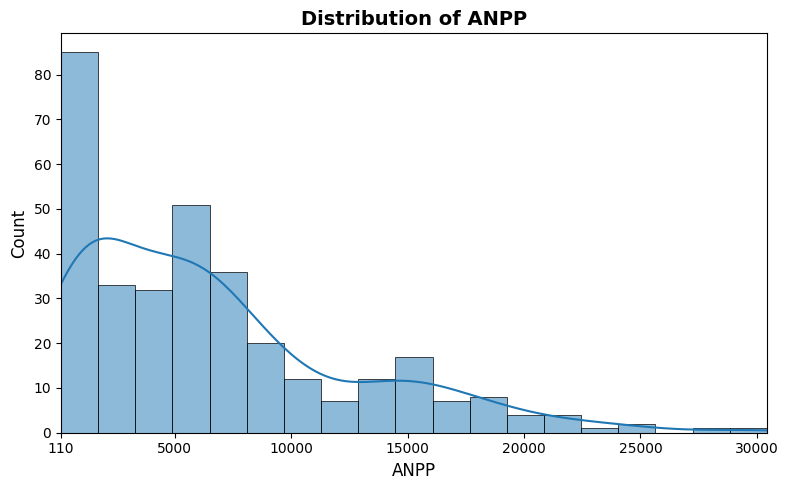

ANPP is **positively skewed**

PPT: min=115.31, max=1604.483978, has NaNs=False

Adjusted number of bins for PPT: 18
Bin width for PPT: 82.73



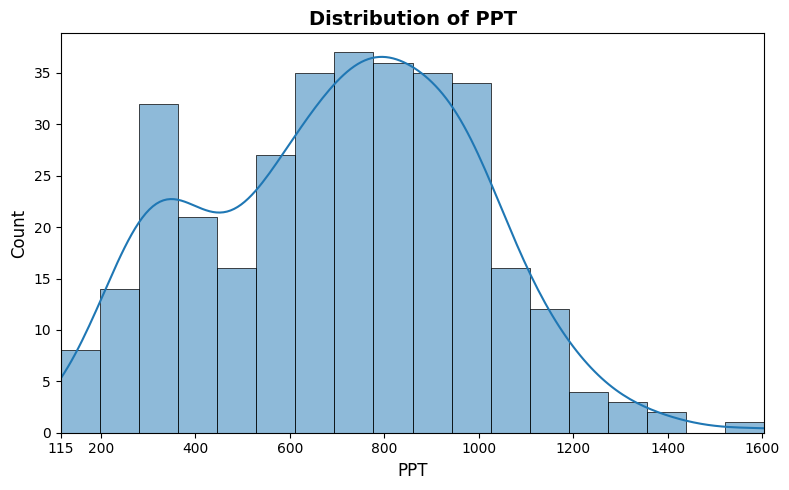

PPT is approximately **normally distributed**

WUE: min=0.480845753, max=47.48587534, has NaNs=False

Adjusted number of bins for WUE: 24
Bin width for WUE: 1.96



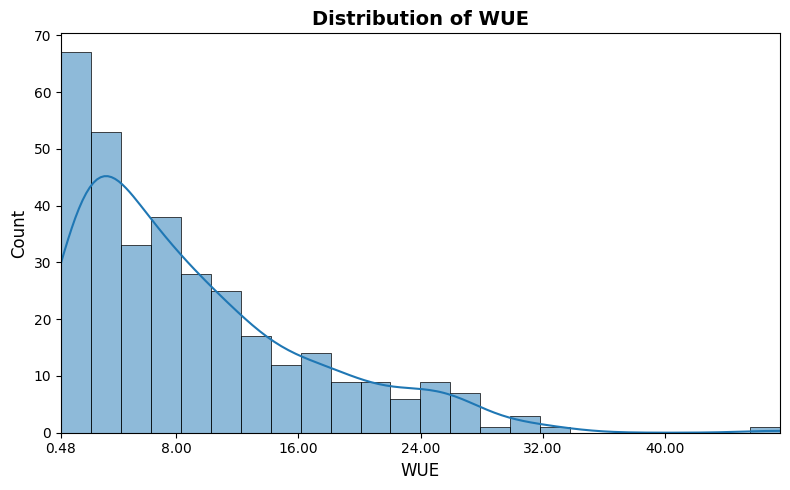

WUE is **positively skewed**



In [11]:
analyze_skewness(df_no_year_numeric)

# **Transformations**

In [12]:
def apply_transformation(data: pd.Series) -> tuple[pd.Series, str]:

    skewness = data.skew()
    if skewness > 1:  # Highly skewed, apply log transformation
        return np.log1p(data), 'log'
    elif skewness > 0.5:  # Moderately skewed, apply square root transformation
        return np.sqrt(data), 'sqrt'
    return data, 'none'

In [13]:
def transform_dataframe(df: pd.DataFrame, columns: list) -> tuple[pd.DataFrame, dict]:

    transformed_df = df.copy()
    transform_info = {}

    for col in columns:
        if (transformed_df[col] < 0).any():
            print(f"Column '{col}' contains negative values, which are not supported for transformation.")
            continue

        transformed_col, transform_type = apply_transformation(transformed_df[col])
        transformed_df[f"{col}_transformed"] = transformed_col
        transform_info[col] = transform_type

    return transformed_df, transform_info

In [14]:
columns_to_transform = ['ANPP', 'WUE']

df_transformed, df_transformed_info = transform_dataframe(df, columns_to_transform)


In [15]:
print("\nOriginal DataFrame:")
print(df)

print("\nTransformed DataFrame:")
print(df_transformed)


Original DataFrame:
     year site.code        type         Crop      Cereal         MAP  \
0    1983      CPER  Rangelands        Range       Range  318.750000   
1    1984      CPER  Rangelands        Range       Range  318.750000   
2    1984     PRHPA   Croplands        Maize      Cereal  702.199915   
3    1984     PRHPA   Croplands      Soybean  Non-Cereal  702.199915   
4    1985      CPER  Rangelands        Range       Range  318.750000   
..    ...       ...         ...          ...         ...         ...   
328  2022    GB_los  Rangelands        Range       Range  428.340687   
329  2022    GB_mbs  Rangelands        Range       Range  504.588187   
330  2022    GB_wbs  Rangelands        Range       Range  419.715687   
331  2022        TG     Pasture  Switchgrass     Pasture  913.819249   
332  2022        TG  Rangelands        Range       Range  913.819249   

            ANPP         PPT        WUE  
0    1019.342222  405.638000   2.512936  
1    1012.044444  384.788000  

# **Correlation Matrix**

In [16]:
def calculate_correlation(df: pd.DataFrame) -> pd.DataFrame:

  pearson_corr = df.corr(method='pearson')
  print("Pearson Correlation:\n", pearson_corr)

  spearman_corr = df.corr(method='spearman')
  print("\nSpearman Correlation:\n", spearman_corr)

  return pearson_corr, spearman_corr

In [17]:
def heatmaps_correlation(df: pd.DataFrame, correlation_method: str) -> None:

  plt.figure(figsize=(10, 6))

  sns.heatmap(df, annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1)
  plt.title(f"{correlation_method} Correlation Heatmap")

  plt.show()

In [18]:
df_transformed_no_year_numeric = df_transformed.drop(columns = ['year', 'site.code', 'type', 'Crop', 'Cereal', 'MAP'])

In [19]:
transformed_spearman_corr, transformed_pearson_corr = calculate_correlation(df_transformed_no_year_numeric)

Pearson Correlation:
                       ANPP       PPT       WUE  ANPP_transformed  \
ANPP              1.000000  0.379453  0.910364          0.861406   
PPT               0.379453  1.000000  0.095236          0.548104   
WUE               0.910364  0.095236  1.000000          0.797155   
ANPP_transformed  0.861406  0.548104  0.797155          1.000000   
WUE_transformed   0.873750  0.176753  0.929679          0.910823   

                  WUE_transformed  
ANPP                     0.873750  
PPT                      0.176753  
WUE                      0.929679  
ANPP_transformed         0.910823  
WUE_transformed          1.000000  

Spearman Correlation:
                       ANPP       PPT       WUE  ANPP_transformed  \
ANPP              1.000000  0.469814  0.932137          1.000000   
PPT               0.469814  1.000000  0.163386          0.469814   
WUE               0.932137  0.163386  1.000000          0.932137   
ANPP_transformed  1.000000  0.469814  0.932137          1

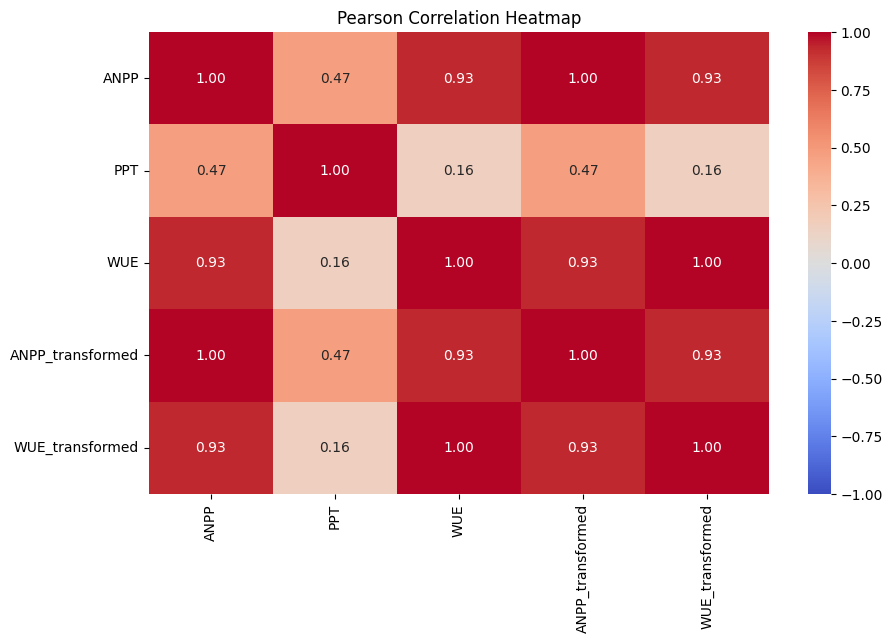

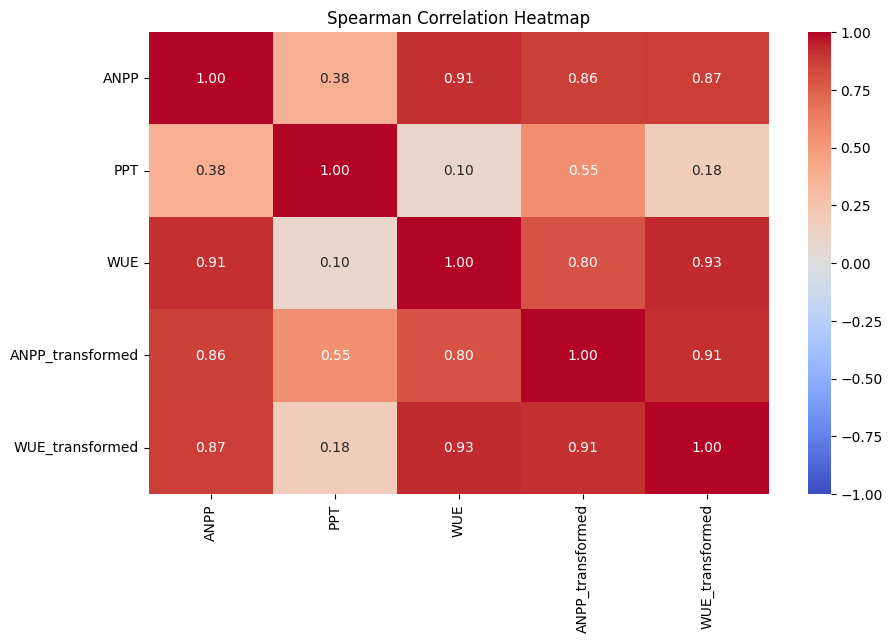

In [20]:
heatmaps_correlation(transformed_pearson_corr, 'Pearson')
heatmaps_correlation(transformed_spearman_corr, 'Spearman')

# **Outlier Detection**

In [21]:
sns.set_theme(style="whitegrid", palette="colorblind")

def detect_outliers(df: pd.DataFrame, column: str) -> dict:

    df = df.copy()
    data = df[column].dropna()

    q1, q3 = data.quantile([0.25, 0.75])
    iqr = q3 - q1
    lower, upper = q1 - 1.5 * iqr, q3 + 1.5 * iqr

    mask = (df[column] < lower) | (df[column] > upper)
    outliers = df[mask]
    outlier_range = (outliers[column].min(), outliers[column].max()) if not outliers.empty else None

    print(f"\nIQR Method for {column}:")
    print(f"Q1: {q1:.2f}, Q3: {q3:.2f}, IQR: {iqr:.2f}")
    print(f"Lower Bound: {lower:.2f}, Upper Bound: {upper:.2f}")
    print(f"Number of IQR outliers: {len(outliers)}")
    print(f"Range of IQR outliers: {outlier_range if outlier_range else 'None'}")

    fig, ax = plt.subplots(figsize=(11, 5))

    sns.boxplot(x=df[column], ax=ax, color="#a6cee3", fliersize=0)
    sns.stripplot(x=df[column], ax=ax, color="#e31a1c", alpha=0.5, size=4, jitter=True)

    ax.axvline(q1, linestyle='--', color='gray', alpha=0.7)
    ax.axvline(q3, linestyle='--', color='gray', alpha=0.7)
    ax.axvspan(q1, q3, color="#b2df8a", alpha=0.2)

    ax.text(
        (q1 + q3) / 2,
        0.18,
        f'IQR Range:\n{q1:.2f} to {q3:.2f}',
        fontsize=11,
        ha='center',
        va='bottom',
        color='black',
        transform=ax.get_xaxis_transform()
    )

    if outlier_range:
        ax.axvspan(outlier_range[0], outlier_range[1], color="#fb9a99", alpha=0.3)
        ax.text(
            (outlier_range[0] + outlier_range[1]) / 2,
            0.05,
            f'Outlier Range:\n{outlier_range[0]:.2f} to {outlier_range[1]:.2f}',
            fontsize=11,
            ha='center',
            va='bottom',
            color='darkred',
            transform=ax.get_xaxis_transform()
        )

    ax.set_title(f'Outlier Detection in "{column}"', fontsize=16, weight='bold', pad=15)
    ax.set_xlabel(
        f'{column} values\n'
        '• Green area = Interquartile Range (Q1–Q3)\n'
        '• Red shaded = Outlier Range\n'
        '• Red dots = Observations (possible outliers beyond IQR)',
        fontsize=12,
        labelpad=12
    )
    ax.set_ylabel('')
    ax.set_xlim(data.min() - 0.05 * abs(data.min()), data.max() + 0.05 * abs(data.max()))
    ax.grid(True, axis='x', linestyle=':', alpha=0.7)

    plt.tight_layout()
    plt.show()

    return {
        'iqr_outliers': outliers,
        'cleaned_df': df[~mask]
    }


IQR Method for ANPP:
Q1: 1586.47, Q3: 9284.00, IQR: 7697.53
Lower Bound: -9959.82, Upper Bound: 20830.29
Number of IQR outliers: 9
Range of IQR outliers: (21168.0, 30431.75853)


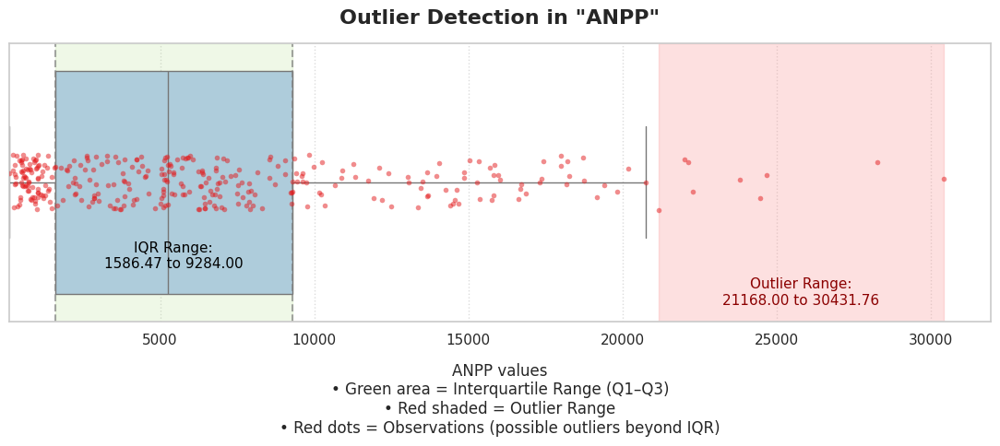

In [22]:
outlier_results = detect_outliers(df, 'ANPP')

In [23]:
iqr_outliers = outlier_results['iqr_outliers']

print(iqr_outliers)

     year site.code       type   Crop  Cereal         MAP         ANPP  \
84   2002      UMRB  Croplands  Maize  Cereal  859.391183  22004.41904   
127  2006      UMRB  Croplands  Maize  Cereal  859.391183  22283.97584   
153  2008      UMRB  Croplands  Maize  Cereal  859.391183  23822.66978   
183  2010      UMRB  Croplands  Maize  Cereal  859.391183  24477.38693   
198  2011        NH  Croplands  Maize  Cereal  876.582752  22120.29747   
213  2012      UMRB  Croplands  Maize  Cereal  859.391183  24683.91778   
251  2015        NH  Croplands  Maize  Cereal  876.582752  30431.75853   
285  2018       ECB  Croplands  Maize  Cereal  912.840025  21168.00000   
296  2018        NH  Croplands  Maize  Cereal  876.582752  28261.72354   

             PPT        WUE  
84    719.700000  30.574432  
127   729.342000  30.553534  
153   877.570000  27.146176  
183  1145.021840  21.377223  
198   865.890993  25.546284  
213   519.816000  47.485875  
251   982.618000  30.970080  
285   930.071800  2

In [24]:
df_cleaned = outlier_results['cleaned_df']
print(df_cleaned.head(5))

   year site.code        type     Crop      Cereal         MAP         ANPP  \
0  1983      CPER  Rangelands    Range       Range  318.750000  1019.342222   
1  1984      CPER  Rangelands    Range       Range  318.750000  1012.044444   
2  1984     PRHPA   Croplands    Maize      Cereal  702.199915  9976.402500   
3  1984     PRHPA   Croplands  Soybean  Non-Cereal  702.199915  4144.737500   
4  1985      CPER  Rangelands    Range       Range  318.750000   836.469841   

          PPT        WUE  
0  405.638000   2.512936  
1  384.788000   2.630135  
2  790.195001  12.625241  
3  790.195001   5.245208  
4  303.122000   2.759515  


In [25]:
columns_to_transform = ['ANPP', 'WUE']

df_processed, df_processed_info = transform_dataframe(df_cleaned, columns_to_transform)

print("\nOriginal DataFrame:")
print(df)

print("\nTransformed DataFrame:")
print(df_processed)


Original DataFrame:
     year site.code        type         Crop      Cereal         MAP  \
0    1983      CPER  Rangelands        Range       Range  318.750000   
1    1984      CPER  Rangelands        Range       Range  318.750000   
2    1984     PRHPA   Croplands        Maize      Cereal  702.199915   
3    1984     PRHPA   Croplands      Soybean  Non-Cereal  702.199915   
4    1985      CPER  Rangelands        Range       Range  318.750000   
..    ...       ...         ...          ...         ...         ...   
328  2022    GB_los  Rangelands        Range       Range  428.340687   
329  2022    GB_mbs  Rangelands        Range       Range  504.588187   
330  2022    GB_wbs  Rangelands        Range       Range  419.715687   
331  2022        TG     Pasture  Switchgrass     Pasture  913.819249   
332  2022        TG  Rangelands        Range       Range  913.819249   

            ANPP         PPT        WUE  
0    1019.342222  405.638000   2.512936  
1    1012.044444  384.788000  

# **Filtering**

In [26]:
def filter_df(df, column_name, custom_value):
    custom_df = df[df[column_name] == custom_value]
    return custom_df

# **Exploratory Data Analysis**

### **Time Series Analysis**

**Fills in missing years and long term trend removal:**

*   Take yearly data and makes sure all years are included by filling gaps with straight-line guesses (linear interpolation)
*   Remove any overall upward or downward trend so we can focus on repeating patterns.

In [27]:
def prepare_time_series(df, time_col, value_col):

    '''Fill missing years with linear interpolation and detrend data.'''

    df_clean = df[[time_col, value_col]].dropna().sort_values(time_col)

    min_year = int(df_clean[time_col].min())
    max_year = int(df_clean[time_col].max())
    all_years = np.arange(min_year, max_year + 1)
    df_full = pd.DataFrame({time_col: all_years})
    df_full = df_full.merge(df_clean, on=time_col, how='left')

    df_full[value_col] = df_full[value_col].interpolate(method='linear').bfill().ffill()
    data = df_full[value_col].values
    n = len(data)

    data_detrended = detrend(data, type='linear')

    return df_full, data_detrended, n

**Cycles Detection**
  
For data repeating every 5 years by analyzing the data’s strength a different time periods. It picks the strongest cycle within chosen range (2 to 10 years).


In [28]:
def detect_cycles(data_detrended, n, min_period, max_period=None):

    '''Find dominant cycle using periodogram.'''

    if n < 5:
        print(f"Small dataset (n={n}). Cycle detection may be unreliable.")

    fs = 1.0  # Yearly sampling
    frequencies, power = periodogram(data_detrended, fs=fs, scaling='density')
    periods = np.zeros_like(frequencies)
    periods[frequencies != 0] = 1 / frequencies[frequencies != 0]
    periods[frequencies == 0] = np.inf

    max_period = max_period if max_period is not None else n / 2

    valid_idx = np.where((periods >= min_period) & (periods <= max_period))[0]
    if len(valid_idx) == 0:
        return None, frequencies, power

    dominant_idx = valid_idx[np.argmax(power[valid_idx])]
    cycle_period = periods[dominant_idx]
    if np.isinf(cycle_period) or cycle_period < min_period or cycle_period > max_period:
        return None, frequencies, power

    return cycle_period, frequencies, power

**Checks if this year’s data is related to past years**
    

*   Marks lags where correlation is significantly high.

In [29]:
def detect_autocorrelation(data_detrended, n, max_lags):

    '''Find significant autocorrelation lags using ACF.'''

    max_lags = min(max_lags, n // 2)
    if max_lags < 1:
        return []

    acf_vals, acf_confint = acf(data_detrended, nlags=max_lags, fft=False, alpha=0.05)
    significant_lags = [
        lag for lag in range(1, max_lags + 1)
        if not (acf_confint[lag][0] <= acf_vals[lag] <= acf_confint[lag][1])
    ]
    return significant_lags

**Checks if PPT affects ANPP after a delay**
       
*  Marks lags where correlation is significantly high.

In [30]:
def detect_cross_lagged_effects(y_detrended, x_detrended, n, max_lags):

    ''' Find significant cross-lagged effects between two series. '''

    max_lags = min(max_lags, n // 2)
    if max_lags < 1:
        return [], np.array([])

    # Compute cross-correlations
    cross_corrs = np.zeros(max_lags + 1)
    for lag in range(max_lags + 1):
        if lag == 0:
            corr = np.corrcoef(y_detrended, x_detrended)[0, 1]
        else:
            corr = np.corrcoef(y_detrended[lag:], x_detrended[:-lag])[0, 1] if lag < n else 0
        cross_corrs[lag] = corr if not np.isnan(corr) else 0

    # Determine significance
    se = 1 / np.sqrt(n - np.arange(max_lags + 1) - 3)
    ci = 1.96 * se
    cross_lagged_lags = [
        lag for lag in range(max_lags + 1)
        if abs(cross_corrs[lag]) > ci[lag]
    ]
    return cross_lagged_lags, cross_corrs

In [31]:
def plot_time_series(df, time_col, value_col, data_detrended, cycle_period):

    ''' Plot detrended time series with cycle info.'''

    plt.figure(figsize=(10, 4))
    plt.plot(df[time_col], data_detrended, marker='o', linestyle='-', color='blue', label='Detrended Data')
    plt.axhline(0, color='black', linestyle='--', alpha=0.5)
    title = (f'{value_col} Time Series (Detrended, Interpolated) - '
             f'Cycle: {cycle_period:.1f} years' if cycle_period else
             f'{value_col} Time Series (Detrended, Interpolated) - No Cycle Detected')
    plt.title(title, fontsize=12)
    plt.xlabel(time_col)
    plt.ylabel(value_col)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()
    plt.close()

In [32]:
def plot_periodogram(value_col, frequencies, power, cycle_period, min_period, max_period=None):

    '''Plot periodogram with dominant cycle'''

    periods = np.zeros_like(frequencies)
    mask = frequencies != 0
    periods[mask] = 1 / frequencies[mask]
    periods[~mask] = np.inf

    max_period = max_period or max(periods[periods != np.inf])
    valid_mask = (periods >= min_period) & (periods <= max_period)
    valid_periods = periods[valid_mask]
    valid_power = power[valid_mask]

    if len(valid_periods) == 0:
        print(f"No valid periods for {value_col} in range {min_period} to {max_period} years.")
        return

    plt.figure(figsize=(10, 4))
    plt.plot(valid_periods, valid_power, color='blue', label='Power Spectrum')

    if cycle_period:
        plt.axvline(cycle_period, color='red', linestyle='--', alpha=0.7, label=f'Dominant Cycle: {cycle_period:.1f} years')
    if cycle_period:
        max_display_period = min(max_period, max(cycle_period * 2, 10))
        plt.xlim(min_period, max_display_period)
    else:
        plt.xlim(min_period, max_period)

    plt.yscale('log')
    plt.ylim(bottom=1e-1)
    plt.title(f'Periodogram for {value_col}', fontsize=12)
    plt.xlabel('Period (years)')
    plt.ylabel('Power (log scale)')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()
    plt.close()

In [33]:
def plot_cross_lagged(value_col, predictor_col, cross_corrs, cross_lagged_lags):

    ''' Plot cross-lagged correlations. '''

    lags = np.arange(len(cross_corrs))
    plt.figure(figsize=(10, 4))
    plt.bar(lags, cross_corrs, color='blue', alpha=0.6, label='Cross-Correlation')
    if cross_lagged_lags:
        for lag in cross_lagged_lags:
            plt.bar(lag, cross_corrs[lag], color='red', alpha=0.8, label='Significant Lag' if lag == cross_lagged_lags[0] else '')
    plt.axhline(0, color='black', linestyle='--', alpha=0.5)
    plt.title(f'Cross-Lagged Correlations: {value_col} vs {predictor_col}', fontsize=12)
    plt.xlabel('Lag (years)')
    plt.ylabel('Correlation')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()
    plt.close()

In [34]:
def analyze_time_series(df, value_col, time_col='year', predictor_col=None, max_lags=5, min_period=2, max_period=None, plot=True, time_series_analysis_name=None):

    ''' Analyze time series for cycles and lagged effects. '''

    print(f"Starting analysis for {value_col} with predictor {predictor_col}")

    # Prepare data
    df_clean, data_detrended, n = prepare_time_series(df, time_col, value_col)

    # Detect cycles
    cycle_period, frequencies, power = detect_cycles(data_detrended, n, min_period, max_period)

    # Detect autocorrelation
    significant_lags = detect_autocorrelation(data_detrended, n, max_lags)

    # Detect cross-lagged effects
    cross_lagged_lags = []
    cross_corrs = np.array([])
    if predictor_col:
        df_predictor, predictor_detrended, _ = prepare_time_series(df, time_col, predictor_col)
        cross_lagged_lags, cross_corrs = detect_cross_lagged_effects(data_detrended, predictor_detrended, n, max_lags)

    if plot:
        plot_time_series(df_clean, time_col, value_col, data_detrended, cycle_period)
        plot_periodogram(value_col, frequencies, power, cycle_period, min_period, max_period)
        if predictor_col and len(cross_corrs) > 0:
            plot_cross_lagged(value_col, predictor_col, cross_corrs, cross_lagged_lags)

    messages = []
    if cycle_period:
        messages.append(f"Dominant cycle detected at {cycle_period:.1f}-year period.")
    else:
        messages.append(f"No significant cycle detected ({min_period}–{max_period or 'n/2'} years).")
    if significant_lags:
        messages.append(f"Significant autocorrelation at lags: {significant_lags}.")
    else:
        messages.append(f"No significant autocorrelation detected (lags 1–{max_lags}).")
    if predictor_col:
        if cross_lagged_lags:
            messages.append(f"Significant cross-lagged effects ({value_col} vs. {predictor_col}) at lags: {cross_lagged_lags}.")
        else:
            messages.append(f"No significant cross-lagged effects ({value_col} vs. {predictor_col}) detected (lags 0–{max_lags}).")

    return {
        'cycle_period': cycle_period,
        'significant_lags': significant_lags,
        'cross_lagged_lags': cross_lagged_lags,
        'message': ' '.join(messages),
        'n_points': n,
        'name': 'time_series_analysis_name'
    }

### **Correlation Analysis**

*   **Pearson:** straight-line relationship
*   **Spearman:** checks for a consistent trend

In [35]:
def calculate_correlations(df, col1, col2):

    pearson_corr = df[col1].corr(df[col2])
    spearman_corr = df[[col1, col2]].corr(method='spearman').iloc[0, 1]

    print(f"Correlation between {col1} and {col2} (Pearson): {pearson_corr:.3f}")
    print(f"Correlation between {col1} and {col2} (Spearman): {spearman_corr:.3f}")

    return pearson_corr, spearman_corr

### **Exploratory Analysis of Unique Values**

In [36]:
def explore_column_values(df, columns):

    ''' Displays unique values and their counts for specified columns as part of EDA. '''

    for col in columns:
        print(f"\nUnique values in '{col}':")
        print(df[col].value_counts())
        print("\n" + "="*50 + "\n")

In [37]:
df_processed.columns

Index(['year', 'site.code', 'type', 'Crop', 'Cereal', 'MAP', 'ANPP', 'PPT',
       'WUE', 'ANPP_transformed', 'WUE_transformed'],
      dtype='object')

In [38]:
explore_column_values(df_processed, ['Crop', 'type', 'site.code', 'Cereal'])


Unique values in 'Crop':
Crop
Range           98
Maize           60
Soybean         60
Switchgrass     40
Winter_Wheat    23
Spring_Wheat    20
Alfalfa         10
Mixed_grass      9
Oats             2
Garbanzo         1
Canola           1
Name: count, dtype: int64



Unique values in 'type':
type
Croplands     167
Rangelands     98
Pasture        59
Name: count, dtype: int64



Unique values in 'site.code':
site.code
PRHPA     90
CPER      37
UCB       36
KBS       32
TG        26
NP        18
JER       13
LCB       12
UMRB       9
GB_wbs     8
GB_los     8
GB_mbs     8
NH         6
CAF        6
SP         6
ABS-UF     5
ECB        4
Name: count, dtype: int64



Unique values in 'Cereal':
Cereal
Cereal        105
Range          98
Non-Cereal     62
Pasture        59
Name: count, dtype: int64




### **Checking WUE derived from ANPP/PPT**

In [262]:
df['Wue_calculated'] = df['ANPP']/df['PPT']

In [259]:
print(df.head(5))

   year site.code        type     Crop      Cereal         MAP         ANPP  \
0  1983      CPER  Rangelands    Range       Range  318.750000  1019.342222   
1  1984      CPER  Rangelands    Range       Range  318.750000  1012.044444   
2  1984     PRHPA   Croplands    Maize      Cereal  702.199915  9976.402500   
3  1984     PRHPA   Croplands  Soybean  Non-Cereal  702.199915  4144.737500   
4  1985      CPER  Rangelands    Range       Range  318.750000   836.469841   

          PPT        WUE  Wue_calculated  
0  405.638000   2.512936        2.512936  
1  384.788000   2.630135        2.630135  
2  790.195001  12.625241       12.625241  
3  790.195001   5.245208        5.245208  
4  303.122000   2.759515        2.759515  


In [39]:
def find_min_max(df):
    min_values = df.min()
    max_values = df.max()
    print("Min values:\n", min_values)
    print("\nMax values:\n", max_values)

# **Modelling**

## **K-Means Clustering**

In [40]:
def kmeans_clustering(df, columns, K_RANGE):

    wcss = []
    silhouette_scores = []

    for k in K_RANGE:
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(df[columns])
        wcss.append(kmeans.inertia_)

        score = silhouette_score(df[columns], kmeans.labels_)
        silhouette_scores.append(score)

    plt.figure(figsize=(8, 5))
    plt.plot(K_RANGE, wcss, marker='o')
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
    plt.title('Elbow Method for Optimal k')
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(K_RANGE, silhouette_scores, marker='o')
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Score for Different k')
    plt.grid(True)
    plt.show()

In [41]:
def k_means_with_optimal_k(df, OPTIMAL_K, predictors):

    kmeans = KMeans(n_clusters=OPTIMAL_K, random_state=42)
    cluster_labels = kmeans.fit_predict(df[predictors])
    df['Cluster'] = cluster_labels

    print('K-means Performance')
    score = silhouette_score(df[predictors], cluster_labels)
    print(f'Silhouette Score: {score:.3f}')

    plt.figure(figsize=(8, 6))
    plt.scatter(df[predictors[0]], df[predictors[1]], c=cluster_labels, cmap='viridis', alpha=0.6, label='Data Points')

    centroids = kmeans.cluster_centers_
    plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=200, marker='X', label='Centroids')

    plt.xlabel(predictors[0])
    plt.ylabel(predictors[1])
    plt.title('K-Means Clustering (2D)')
    plt.colorbar(label='Cluster')
    plt.legend()
    plt.grid(True)
    plt.show()

    return df

In [42]:
def cluster_summary(df, columns):
  cluster_summary = df.groupby('Cluster')[columns].mean()
  print("\nCluster Summary (Mean Values):")
  return cluster_summary

In [43]:
def cluster_distribution(df, column):

  cluster_distribution = df.groupby(['Cluster', column]).size().unstack(fill_value=0)
  print(f"\nCluster Distribution by {column}:")
  print(cluster_distribution)

  cluster_distribution.plot(kind='bar', stacked=True, figsize=(10, 8), colormap='Set3')
  plt.title(f'Distribution of {column} Across Clusters')
  plt.xlabel('Cluster')
  plt.ylabel('Count')
  plt.tight_layout()
  plt.show()

## **Building Regression Models - Linear, Quadratic, Spline, Piecewise**

### **Data Preparation - For Regression Modelling**

In [44]:
def get_aggregation_method(df, columns):

    aggregation = {}
    for col in columns:
        skew_value = df[col].skew()
        if skew_value > 1:
            aggregation[col] = 'median'
        elif skew_value < -1:
            aggregation[col] = 'median'
        else:
            aggregation[col] = 'mean'
    return aggregation

In [45]:
def apply_smoothing(data, cols_to_smooth, window_size):

    data = data.copy()
    aggregation_methods = get_aggregation_method(data, cols_to_smooth)

    cols_to_smooth = [col for col in cols_to_smooth if col not in ['year', 'sin_cycle', 'cos_cycle']]

    for col in cols_to_smooth:
        if aggregation_methods[col] == 'mean':
            data[col] = data[col].rolling(window=window_size, min_periods=1, center=True).mean()
        else:
            data[col] = data[col].rolling(window=window_size, min_periods=1, center=True).median()

    return data

In [46]:
def lag_data(df, ind_var, lags):

    for lag in lags:
      df[f'{ind_var}_lag{lag}'] = df[ind_var].shift(lag)

    df = df.dropna().reset_index(drop=True)

    return df

In [47]:
def cyclic_data(df, cycle_period):

  t = df['year'] - df['year'].min()
  df['sin_cycle'] = np.sin(2 * np.pi * t / cycle_period)
  df['cos_cycle'] = np.cos(2 * np.pi * t / cycle_period)

  return df

In [48]:
def calculate_yearly_aggregate(data, agg_cols):

  aggregation = get_aggregation_method(data, agg_cols)

  data = data.groupby('year').agg(aggregation).reset_index()
  return data

In [49]:
def prepare_data(df, ind_var, dep_var, yearly_aggregate=False, window_size=None, lags=None, use_sinusoidal=False, cycle_period=3.1, is_spline=False):
    data = df[[ind_var, dep_var, 'year']].copy().sort_values('year')

    cols = [ind_var, dep_var, 'year']

    if use_sinusoidal:
        data = cyclic_data(data, cycle_period)
        cols.extend(['sin_cycle', 'cos_cycle'])

    if yearly_aggregate:
        agg_cols = [col for col in cols if col != 'year']
        data = calculate_yearly_aggregate(data, agg_cols)

    if lags:
        data = lag_data(data, ind_var, lags)
        cols.extend([f'{ind_var}_lag{lag}' for lag in lags])

    if window_size is not None:
        if window_size > len(data) // 2:
            raise ValueError(f"Window size {window_size} too large for {len(data)} rows.")
        data = apply_smoothing(data, cols, window_size)

    # Validate dataset size
    if len(data) < 3:
        raise ValueError(f"Dataset too small (n={len(data)}). Need at least 3 rows.")
    if (yearly_aggregate or lags) and len(data) < 8:
        raise ValueError(f"Dataset too small after processing (n={len(data)}). Need at least 8 rows.")
    if is_spline and len(data) < 12:
        print(f"Warning: Small dataset (n={len(data)}) for spline model, limited knots possible.")

    return data

### **Constructing Design Matrix**

In [50]:
def extend_predictors(predictors, ind_var, lags, use_sinusoidal):

    if lags:
        predictors.extend([f'{ind_var}_lag{lag}' for lag in lags])
    if use_sinusoidal:
        predictors.extend(['sin_cycle', 'cos_cycle'])

    return predictors

In [51]:
import numpy as np
import statsmodels.api as sm
from scipy.interpolate import BSpline

def build_design_matrix(data, ind_var, lags=None, use_sinusoidal=False, is_run_quadratic=False, is_piecewise=False, breakpoints=None, is_spline=False, knots=None):

    predictors = extend_predictors([ind_var], ind_var, lags, use_sinusoidal)
    x = data[predictors].values
    new_columns = []

    ind_var_column = data[ind_var].values.reshape(-1, 1)
    if x.shape[1] > 1:
        other_predictors = x[:, 1:]
        combined = np.column_stack([ind_var_column, other_predictors])
        Q, R = np.linalg.qr(combined)
        # Keep ind_var as-is (first column) and use orthogonalized versions of other predictors
        x = np.column_stack([ind_var_column, Q[:, 1:]])
        # Update predictors: keep ind_var, orthogonalize the rest
        predictors = [predictors[0]] + [f'ortho_{pred}' for pred in predictors[1:]]
    else:
        x = ind_var_column

    if is_piecewise and breakpoints:
        if len(breakpoints) != 1:
            raise ValueError("Only one breakpoint supported.")
        tau = breakpoints[0]
        segment = np.maximum(0, data[ind_var].values - tau)
        new_columns.append(segment)
        predictors.append('segment')

    if is_run_quadratic:
        # Center the independent variable to reduce multicollinearity
        ind_centered = data[ind_var].values - np.mean(data[ind_var].values)
        # Use centered variable for linear term if ind_var is not already included
        if ind_var not in predictors:
            x = ind_centered
            predictors = [ind_var] + predictors[1:]  # Replace ind_var with centered version
        squared = ind_centered ** 2
        new_columns.append(squared)
        predictors.append('quadratic')

    if is_spline:
        if not knots or not len(knots):
            raise ValueError(f"No knots provided for spline with n={len(data)}.")
        ind = data[ind_var].values
        degree = 2 if len(data) < 15 else 3
        knot_vec = [knots[0]] * degree + knots + [knots[-1]] * (degree - 1)
        if len(knot_vec) < degree + 2:
            raise ValueError(f"Knot vector too short (len={len(knot_vec)}) for degree-{degree} spline with n={len(data)}.")

        try:
            basis = np.column_stack([
                BSpline(knot_vec, np.eye(len(knot_vec) - degree - 1)[i], degree)(ind)
                for i in range(len(knot_vec) - degree - 1)
            ])
            if basis.shape[1] < 2:
                raise ValueError(f"Too few spline basis functions ({basis.shape[1]}) for n={len(data)}.")
            # Stack ind_var with the basis to orthogonalize the spline basis with respect to ind_var
            ind_var_column = ind.reshape(-1, 1)
            basis_with_ind = np.column_stack([ind_var_column, basis])
            # Orthogonalize using QR decomposition
            Q, R = np.linalg.qr(basis_with_ind)
            # Use the columns after the first (ind_var) and exclude the second column to avoid collinearity with the intercept
            basis_ortho = Q[:, 2:]
            new_columns.append(basis_ortho)
            predictors.extend([f'spline_{i}' for i in range(basis_ortho.shape[1])])
        except Exception as e:
            raise ValueError(f"Spline construction failed for n={len(data)}: {str(e)}")

    if new_columns:
        x = np.column_stack([x] + new_columns)

    X = sm.add_constant(x)
    return X, predictors

In [52]:
import statsmodels.api as sm

def fit_model(data, ind_var, dep_var, lags=None, use_sinusoidal=False, is_run_quadratic=False, is_piecewise=False, breakpoints=None, is_spline=False, knots=None):
    y = data[dep_var].values
    X, predictors = build_design_matrix(data, ind_var, lags, use_sinusoidal, is_run_quadratic, is_piecewise, breakpoints, is_spline, knots)

    model = sm.OLS(y, X).fit()
    predictions = model.predict(X)

    return model, predictions, predictors

### **To Run Various Regression Analysis**

**Break point Estimation For Piecewise Linear Regression**

In [53]:
def estimate_breakpoint(data, ind_var, dep_var, min_val=None, max_val=None, grid_size=100):
    y = data[dep_var].values
    x = data[ind_var].values
    min_val = min_val if min_val is not None else np.percentile(x, 10)
    max_val = max_val if max_val is not None else np.percentile(x, 90)

    if min_val >= max_val:
        raise ValueError("min_val must be less than max_val for breakpoint estimation.")

    best_aic = float('inf')
    best_tau = None
    best_model = None

    for tau in np.linspace(min_val, max_val, grid_size):
        if sum(x <= tau) < 3 or sum(x > tau) < 3:
            continue
        x_segment = np.maximum(0, x - tau)
        X = sm.add_constant(np.column_stack((x, x_segment)))
        model = sm.OLS(y, X).fit()
        if model.aic < best_aic:
            best_aic = model.aic
            best_tau = tau
            best_model = model

    if best_tau is None:
        raise ValueError("Failed to find a valid breakpoint with at least 3 points per segment.")

    return best_tau, best_model

**Knots Estimation for Spline Regression**

In [54]:
def estimate_knots(x_data, min_data_points=8):
    if len(x_data) == 0:
        raise ValueError("Input data is empty, cannot estimate knots.")
    n_points = len(x_data)
    computed_knots = []
    x_min, x_max = x_data.min(), x_data.max()
    data_range = x_max - x_min

    if n_points < min_data_points:
        print(f"Warning: n={n_points} < {min_data_points}, using no knots (linear fit).")
        return computed_knots
    elif n_points <= 10:
        num_knots = 1
    elif n_points <= 14:
        num_knots = 2 if n_points >= 12 else 1
    else:
        num_knots = 3

    range_min = x_min + 0.1 * data_range
    range_max = x_max - 0.1 * data_range

    try:
        quantiles = np.linspace(10, 90, 17)
        candidate_positions = np.percentile(x_data, quantiles)
        candidate_positions = sorted(list(set([round(k, 6) for k in candidate_positions])))
        candidate_positions = [k for k in candidate_positions if range_min < k < range_max]

        if len(candidate_positions) < num_knots:
            raise ValueError(f"Not enough unique candidate positions ({len(candidate_positions)} < {num_knots}).")

        min_spacing = 0.02 * data_range
        filtered_positions = [candidate_positions[0]]
        for pos in candidate_positions[1:]:
            if pos - filtered_positions[-1] >= min_spacing:
                filtered_positions.append(pos)
        candidate_positions = filtered_positions

        if len(candidate_positions) < num_knots:
            raise ValueError(f"Not enough positions after spacing filter ({len(candidate_positions)} < {num_knots}).")

        step = len(candidate_positions) / (num_knots + 1)
        indices = [int(step * (i + 1)) for i in range(num_knots)]
        computed_knots = [candidate_positions[i] for i in indices]

    except Exception as e:
        print(f"Adaptive knot placement failed: {str(e)}. Falling back to percentile-based knots.")
        if n_points <= 10:
            computed_knots = [np.percentile(x_data, 50)]  # 1 knot
        elif n_points <= 14:
            computed_knots = [np.percentile(x_data, 50)] if n_points < 12 else np.percentile(x_data, [25, 75])  # 1 or 2 knots
        else:
            computed_knots = np.percentile(x_data, [20, 50, 80])  # 3 knots

        computed_knots = sorted(list(set([round(k, 6) for k in computed_knots])))
        computed_knots = [k for k in computed_knots if range_min < k < range_max]

        if len(computed_knots) > 1:
            filtered_knots = [computed_knots[0]]
            for k in computed_knots[1:]:
                if k - filtered_knots[-1] >= min_spacing:
                    filtered_knots.append(k)
            computed_knots = filtered_knots

        if len(computed_knots) == 0:
            computed_knots = [np.percentile(x_data, 50)]
            print(f"Warning: No valid knots after filtering for n={n_points}, using 1 knot at 50th percentile: {computed_knots}")

        print(f"Selected {len(computed_knots)} knots (fallback): {computed_knots}")

    return computed_knots

**K-Fold Cross Validation & LOOCV**

In [55]:
def model_k_fold_cross_validation(data, ind_var, dep_var, lags=None, use_sinusoidal=False,
                                  is_run_quadratic=False, is_piecewise=False, breakpoints=None,
                                  is_spline=False, knots=None, k=3):
    y = data[dep_var].values
    X, predictors = build_design_matrix(data, ind_var, lags, use_sinusoidal,
                                        is_run_quadratic, is_piecewise, breakpoints,
                                        is_spline, knots)
    n = len(data)

    if n < 10:
        print(f"Using Leave-One-Out CV for small dataset (n={n})")
        cv = LeaveOneOut()
        k = n
    else:
        k = min(k, 2 if n < 30 else k)  # Use k=2 for 10 <= n < 30
        if n < k:
            k = max(2, n)
        cv = KFold(n_splits=k, shuffle=True, random_state=42)

    mse_scores = []
    y_true_all = []
    y_pred_all = []
    successful_folds = 0

    for train_idx, test_idx in cv.split(X):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        try:
            model = sm.OLS(y_train, X_train).fit()
            y_pred = model.predict(X_test)
            mse_scores.append(mean_squared_error(y_test, y_pred))
            y_true_all.extend(y_test)
            y_pred_all.extend(y_pred)
            successful_folds += 1

        except Exception as e:
            print(f"CV fold failed: {str(e)}")
            continue

    if successful_folds == 0:
        raise ValueError("All CV folds failed; cannot compute cross-validation metrics.")
    if successful_folds < k:
        print(f"Warning: Only {successful_folds}/{k} CV folds succeeded; metrics may be unreliable.")

    # Compute aggregated R² score
    cv_r2 = r2_score(y_true_all, y_pred_all) if y_true_all else 0
    cv_r2_std = 0  # Std not applicable for single aggregated R²
    cv_mse = np.mean(mse_scores) if mse_scores else np.inf

    return cv_r2, cv_r2_std, cv_mse

**Model Evaluation**

In [56]:
def calculate_vif(X, predictors):

    vif_dict = {}

    X_no_constant = X[:, 1:] if X.shape[1] > 1 else X[:, 1:2]

    if X_no_constant.shape[1] == 1:
        vif_dict[predictors[0]] = 1.0
        return vif_dict
    elif X_no_constant.shape[1] == 0:
        print("Warning: No predictors available for VIF calculation.")
        return vif_dict

    for i, predictor in enumerate(predictors):
        try:
            vif = variance_inflation_factor(X_no_constant, i)
            vif_dict[predictor] = round(vif, 3)
        except Exception as e:
            print(f"Warning: VIF calculation failed for {predictor}: {str(e)}")
            vif_dict[predictor] = np.nan

    return vif_dict

In [57]:
def compute_model_statistics(model, residuals, data, ind_var, dep_var, lags=None, use_sinusoidal=False, is_run_quadratic=False, is_piecewise=False, breakpoints=None, is_spline=False, knots=None):

    X, predictors = build_design_matrix(data, ind_var, lags, use_sinusoidal, is_run_quadratic, is_piecewise, breakpoints, is_spline, knots)

    if len(residuals) < 20:
        print("Warning: Small sample size (n={}) for normality test; results may be unreliable.".format(len(residuals)))
    ad_result = anderson(residuals, dist='norm')
    is_normal = ad_result.statistic < ad_result.critical_values[2]

    _, bp_p, _, _ = het_breuschpagan(residuals, X)
    dw_stat = durbin_watson(residuals)

    vif_scores = calculate_vif(X, predictors)

    stats = {
        'r_squared': model.rsquared,
        'p_value': model.pvalues[1],
        'aic': model.aic,
        'bic': model.bic,
        'is_normal': is_normal,
        'is_homoscedastic': bp_p > 0.05,
        'no_autocorrelation': 1.5 < dw_stat < 2.5,
        'durbin_watson': dw_stat,
        'vif_scores': vif_scores
    }

    offset = 2
    if lags:
        for i, lag in enumerate(lags, start=offset):
            stats[f'p_value_lag{lag}'] = model.pvalues[i]
        offset += len(lags)
    if use_sinusoidal:
        stats['p_value_sin'] = model.pvalues[offset]
        stats['p_value_cos'] = model.pvalues[offset + 1]
        offset += 2
    if is_run_quadratic:
        stats['p_value_quadratic'] = model.pvalues[offset]
        offset += 1
    if is_piecewise and breakpoints:
        stats['p_value_segment'] = model.pvalues[offset]
        offset += 1
    if is_spline:
        spline_count = len([p for p in predictors if p.startswith('spline_')])
        for i in range(spline_count):
            stats[f'p_value_spline_{i}'] = model.pvalues[offset + i]
        offset += spline_count

    return stats

### **Plotting for Regression Models**

In [58]:
def plot_model(data, model, ind_var, dep_var, analysis_name, show_plot, yearly_aggregate=False, window_size=None, plot_name='type, crop, site', lags=None, use_sinusoidal=False, is_run_quadratic=False, is_piecewise=False, breakpoints=None, is_spline=False, knots=None):

    x = data[ind_var].values
    y = data[dep_var].values

    predictors = [ind_var]
    predictors = extend_predictors(predictors, ind_var, lags, use_sinusoidal)

    if is_piecewise and breakpoints:
        tau = breakpoints[0]
        predictors.append('segment')

    if is_run_quadratic:
        predictors.append('quadratic')

    if is_spline:
        x_ind = data[ind_var].values
        k = 2 if len(data) < 15 else 3
        t = [knots[0]] * k + knots + [knots[-1]] * (k - 1)
        spline_basis = np.column_stack([BSpline(t, np.eye(len(t) - k - 1)[i], k)(x_ind) for i in range(len(t) - k - 1)])
        predictors.extend([f'spline_{i}' for i in range(spline_basis.shape[1] - 1)])

    print(f"Predictors in plot_model: {predictors}")

    # Prepare X for actual data points to get predicted values
    X_actual, _ = build_design_matrix(data, ind_var, lags, use_sinusoidal, is_run_quadratic, is_piecewise, breakpoints, is_spline, knots)
    y_pred_actual = model.predict(X_actual)

    # Sort data by x for a smooth fitted line
    sorted_indices = np.argsort(x)
    x_sorted = x[sorted_indices]
    y_pred_sorted = y_pred_actual[sorted_indices]

    # Determine the label based on preprocessing
    data_label = 'Smooth Data Points' if yearly_aggregate or window_size is not None else 'Raw Data Points'

    plt.figure(figsize=(8, 5))
    plt.scatter(x, y, alpha=0.5, color='#E69F00', label=data_label)
    plt.scatter(x, y_pred_actual, alpha=0.5, color='green', label='Predicted Data Points', marker='x')

    if is_piecewise and breakpoints:
        plt.plot(x_sorted, y_pred_sorted, color='#4C4C4C', label='Piecewise Linear Fit')
        plt.axvline(x=breakpoints[0], color='red', linestyle='--', label=f'Breakpoint at {breakpoints[0]:.2f}')
    elif is_run_quadratic:
        plt.plot(x_sorted, y_pred_sorted, color='#4C4C4C', label='Quadratic Fit')
    elif is_spline:
        plt.plot(x_sorted, y_pred_sorted, color='#4C4C4C', label='Spline Fit')
        y_max = max(y)
        for knot in knots:
            plt.axvline(x=knot, color='blue', linestyle=':', alpha=0.7)
            plt.text(knot, y_max * 0.95, f'{knot:.2f}', color='blue', ha='center', va='bottom', fontsize=8)
    else:
        plt.plot(x_sorted, y_pred_sorted, color='#4C4C4C', label='Linear Fit')

    plt.xlabel(ind_var)
    plt.ylabel(dep_var)

    title = f'{analysis_name}\nR²={model.rsquared:.3f}, p({ind_var})={model.pvalues[1]:.3f}'
    offset = 2
    if lags:
        for i, lag in enumerate(lags, start=offset):
            title += f', p(lag{lag})={model.pvalues[i]:.3f}'
        offset += len(lags)
    if use_sinusoidal:
        title += f', p(sin)={model.pvalues[offset]:.3f}, p(cos)={model.pvalues[offset+1]:.3f}'
        offset += 2
    if is_run_quadratic:
        title += f', p(quadratic)={model.pvalues[offset]:.3f}'
        offset += 1
    if is_piecewise and breakpoints:
        title += f', p(segment)={model.pvalues[offset]:.3f}'
        offset += 1
    if is_spline:
        for i in range(spline_basis.shape[1] - 1):
            title += f', p(spline_{i})={model.pvalues[offset+i]:.3f}'
        offset += spline_basis.shape[1] - 1

    plt.title(title)
    plt.legend()
    plt.grid(True)

    if show_plot:
        plt.show()

    plt.close()

In [59]:
def plot_residuals(y_true, y_pred, residuals, analysis_name, stats, show_plot, plot_name='type, crop, site'):
    plt.figure(figsize=(8, 5))
    plt.scatter(y_pred, residuals, alpha=0.5, color='#E69F00')
    plt.axhline(y=0, color='#4C4C4C', linestyle='--')
    plt.xlabel('Predicted Data Points')
    plt.ylabel('Residuals')
    plt.title(
        f'Residual Plot: {analysis_name}\n'
        f'Normal: {stats["is_normal"]}, Homoscedastic: {stats["is_homoscedastic"]}, '
        f'No Autocorrelation: {stats["no_autocorrelation"]}, DW: {stats["durbin_watson"]:.3f}'
    )
    plt.ylim(np.percentile(residuals, [1, 99]))
    plt.grid(True)

    if show_plot:
        plt.show()

    plt.close()

In [60]:
def plot_aic_bic(all_results, plot_name, show_aic_bic):

    if all_results is None or all_results.empty:
        print("No results to plot for AIC/BIC")
        return

    grouped = all_results.groupby('window_size')
    min_aic = grouped['aic'].min()
    min_bic = grouped['bic'].min()
    windows = min_aic.index.astype(float)

    min_aic_configs = grouped.apply(lambda g: g.loc[g['aic'].idxmin(), 'config_type'], include_groups=False)
    min_bic_configs = grouped.apply(lambda g: g.loc[g['bic'].idxmin(), 'config_type'], include_groups=False)

    overall_min_aic_idx = min_aic.idxmin()
    overall_min_bic_idx = min_bic.idxmin()
    overall_min_aic_window = overall_min_aic_idx
    overall_min_bic_window = overall_min_bic_idx
    overall_min_aic_config = min_aic_configs.loc[overall_min_aic_idx]
    overall_min_bic_config = min_bic_configs.loc[overall_min_bic_idx]

    fig, ax = plt.subplots(figsize=(10, 7), dpi=100)
    ax.plot(windows, min_aic, color='#0072B2', linestyle='-', marker='o', linewidth=2, label='Min AIC')
    ax.plot(windows, min_bic, color='#D55E00', linestyle='-', marker='s', linewidth=2, label='Min BIC')

    ax.annotate(f'Min AIC: {min_aic[overall_min_aic_idx]:.2f}\n{overall_min_aic_config}',
                xy=(overall_min_aic_window, min_aic[overall_min_aic_idx]),
                xytext=(5, 5), textcoords='offset points', fontsize=10, color='#0072B2')
    ax.annotate(f'Min BIC: {min_bic[overall_min_bic_idx]:.2f}\n{overall_min_bic_config}',
                xy=(overall_min_bic_window, min_bic[overall_min_bic_idx]),
                xytext=(5, 5), textcoords='offset points', fontsize=10, color='#D55E00')

    ax.set_xlabel('Window Size', fontsize=14, labelpad=10, weight='bold')
    ax.set_ylabel('Value', fontsize=14, labelpad=10, weight='bold')
    ax.set_title(f'{plot_name} Minimum AIC and BIC vs Window Size\nAcross All Configurations',
                 fontsize=16, pad=15, weight='bold')
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend(fontsize=10, loc='upper right', frameon=True, edgecolor='black')
    plt.tight_layout()

    if show_aic_bic:
        print("Showing aggregated AIC/BIC plot")
        plt.show()

    plt.close()

**Run the model Analysis**

In [61]:
def run_model_analysis(df, ind_var, dep_var, yearly_aggregate, window_size, analysis_name, plot_name, show_plot, lags=None, use_sinusoidal=False, cycle_period=3.1, is_run_quadratic=False, is_piecewise=False, is_spline=False):
    try:
        data = prepare_data(df, ind_var, dep_var, yearly_aggregate, window_size, lags, use_sinusoidal, cycle_period, is_spline)
        n_samples = len(data)

    except ValueError as e:
        print(f"Skipping {analysis_name}: {str(e)}")
        return None, None, None, None, None, None

    breakpoints = None
    knots = None

    if is_piecewise:
        if n_samples < 5:
            raise ValueError(f"Dataset too small (n={n_samples}) for piecewise regression. Need at least 5 rows.")
        breakpoint, _ = estimate_breakpoint(data, ind_var, dep_var, grid_size=100)
        breakpoints = [breakpoint]

    if is_spline:
        if n_samples < 8:
            raise ValueError(f"Dataset too small (n={n_samples}) for spline regression. Need at least 8 rows.")
        x_ind = data[ind_var].values
        knots = estimate_knots(x_ind)
        expected_knots = 3 if n_samples >= 15 else 2 if n_samples > 10 else 1
        if len(knots) < expected_knots:
            print(f"Warning: Expected {expected_knots} knots, but only {len(knots)} knots were computed for n={n_samples}. Check data distribution.")

    try:
        model, predictions, predictors = fit_model(data, ind_var, dep_var, lags, use_sinusoidal, is_run_quadratic, is_piecewise, breakpoints, is_spline, knots)
    except ValueError as e:
        print(f"Skipping {analysis_name}: {str(e)}")
        return None, None, None, None, None, None

    residuals = data[dep_var].values - predictions
    linear_stats = compute_model_statistics(model, residuals, data, ind_var, dep_var, lags, use_sinusoidal, is_run_quadratic, is_piecewise, breakpoints, is_spline, knots)
    cv_r2, cv_r2_std, cv_mse = model_k_fold_cross_validation(data, ind_var, dep_var, lags, use_sinusoidal, is_run_quadratic, is_piecewise, breakpoints, is_spline, knots)

    config_type = (
        f"{'spline' if is_spline else 'piecewise' if is_piecewise else 'quadratic' if is_run_quadratic else 'linear'}_"
        f"lags_{'_'.join(map(str, lags)) if lags else 'none'}_"
        f"sinusoidal_{'yes' if use_sinusoidal else 'no'}"
    )

    results = pd.DataFrame({
        'analysis_name': [analysis_name],
        'yearly_aggregate': [yearly_aggregate],
        'window_size': [window_size],
        'config_type': [config_type],
        'r_squared': [round(linear_stats['r_squared'], 3)],
        'p_value': [round(linear_stats['p_value'], 3)],
        'aic': [round(linear_stats['aic'], 3)],
        'bic': [round(linear_stats['bic'], 3)],
        'is_normal': [linear_stats['is_normal']],
        'is_homoscedastic': [linear_stats['is_homoscedastic']],
        'no_autocorrelation': [linear_stats['no_autocorrelation']],
        'durbin_watson': [round(linear_stats['durbin_watson'], 3)],
        'cv_r2_score': [round(cv_r2, 3)],
        'cv_r2_std': [round(cv_r2_std, 3)]
    })

    # Add VIF scores to results
    for predictor, vif in linear_stats['vif_scores'].items():
        results[f'vif_{predictor}'] = vif

    if lags:
        for lag in lags:
            results[f'p_value_lag{lag}'] = round(linear_stats[f'p_value_lag{lag}'], 3)
    if use_sinusoidal:
        results['p_value_sin'] = round(linear_stats['p_value_sin'], 3)
        results['p_value_cos'] = round(linear_stats['p_value_cos'], 3)
    if is_run_quadratic:
        results['p_value_quadratic'] = round(linear_stats['p_value_quadratic'], 3)
    if is_piecewise and breakpoints:
        results['p_value_segment'] = round(linear_stats['p_value_segment'], 3)
        results['breakpoint'] = breakpoints[0]
    if is_spline:
        spline_count = len([p for p in predictors if p.startswith('spline_')])
        for i in range(spline_count):
            results[f'p_value_spline_{i}'] = round(linear_stats[f'p_value_spline_{i}'], 3)
        x_ind = data[ind_var].values
        all_knots = [x_ind.min()] + knots + [x_ind.max()]
        results['knots'] = [all_knots]

    if show_plot:
        plot_model(
            data=data,
            model=model,
            ind_var=ind_var,
            dep_var=dep_var,
            analysis_name=analysis_name,
            show_plot=show_plot,
            yearly_aggregate=yearly_aggregate,
            window_size=window_size,
            plot_name=plot_name,
            lags=lags,
            use_sinusoidal=use_sinusoidal,
            is_run_quadratic=is_run_quadratic,
            is_piecewise=is_piecewise,
            breakpoints=breakpoints,
            is_spline=is_spline,
            knots=knots
        )
        plot_residuals(data[dep_var].values, predictions, residuals, analysis_name, linear_stats, show_plot, plot_name)

    return results, data, model, predictions, residuals, n_samples

## **Model Selection**

In [62]:
def select_best_model(results_df):

    filtered_df = results_df[results_df['p_value'] < 0.05]
    filtered_df = filtered_df[filtered_df['is_normal'] == True]
    filtered_df = filtered_df[filtered_df['is_homoscedastic'] == True]
    filtered_df = filtered_df[abs(filtered_df['r_squared'] - filtered_df['cv_r2_score']) <= 0.1]

    if 'p_value_quadratic' in filtered_df.columns:
        filtered_df = filtered_df[
            (~filtered_df['config_type'].str.contains('quadratic')) |
            (filtered_df['p_value_quadratic'] < 0.05)
        ]

    if 'p_value_segment' in filtered_df.columns:
        filtered_df = filtered_df[
            (~filtered_df['config_type'].str.contains('piecewise')) |
            (filtered_df['p_value_segment'] < 0.05)
        ]

    if 'p_value_spline_0' in filtered_df.columns:
        spline_cols = [col for col in filtered_df.columns if col.startswith('p_value_spline_')]
        filtered_df = filtered_df[
            (~filtered_df['config_type'].str.contains('spline')) |
            (filtered_df[spline_cols].min(axis=1) < 0.05)
        ]

    if 'p_value_sin' in filtered_df.columns and 'p_value_cos' in filtered_df.columns:
        filtered_df = filtered_df[
            (~filtered_df['config_type'].str.contains('sinusoidal')) |
        (
            (filtered_df['p_value_sin'] < 0.05) |
            (filtered_df['p_value_sin'].isna() & (filtered_df['p_value_cos'] < 0.05)) |
            (filtered_df['p_value_cos'].isna())
        )
    ]

    lag_cols = [col for col in filtered_df.columns if 'lag' in col.lower()]

    if lag_cols:
        lag_significant_mask = (filtered_df[lag_cols] < 0.05) | (filtered_df[lag_cols].isna())
        keep_mask = lag_significant_mask.all(axis=1)
        filtered_df = filtered_df[keep_mask]

    if filtered_df.empty:
        return "No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms)."

    best_model = filtered_df.sort_values(by=['aic', 'cv_r2_score', 'durbin_watson'], ascending=[True, False, False]).head(1)
    return best_model

## **Running All Model Configurations**

In [63]:
import pandas as pd
from itertools import product

def run_all_model_configs(
    df,
    ind_var,
    dep_var,
    plot_name='',
    window_size=None,
    lags=[None],
    show_plot=False,
    show_aic_bic=False,
    cycle_period=None,
    model_types='linear'
):
    if model_types not in ['linear', 'quadratic', 'piecewise', 'spline', 'all']:
        raise ValueError("model_types must be 'linear', 'quadratic', 'piecewise', 'spline', or 'all'")

    all_results = []
    model_results_details = []
    #if window_size is None or (isinstance(window_size, (list, range)) and all(ws is None for ws in window_size)) else [False, True]
    yearly_options = [False, True]
    sinusoidal_options = [False, True]
    window_sizes = window_size if window_size else [None]
    lags_options = lags if lags is not None else [None]

    model_configs = []
    if model_types == 'linear' or model_types == 'all':
        model_configs.append({'is_run_quadratic': False, 'is_piecewise': False, 'is_spline': False})
    if model_types == 'quadratic' or model_types == 'all':
        model_configs.append({'is_run_quadratic': True, 'is_piecewise': False, 'is_spline': False})
    if model_types == 'piecewise' or model_types == 'all':
        model_configs.append({'is_run_quadratic': False, 'is_piecewise': True, 'is_spline': False})
    if model_types == 'spline' or model_types == 'all':
        model_configs.append({'is_run_quadratic': False, 'is_piecewise': False, 'is_spline': True})

    for window_size_iter, yearly_aggregate, use_sinusoidal, lags_iter, model_config in product(
        window_sizes, yearly_options, sinusoidal_options, lags_options, model_configs
    ):
        if use_sinusoidal and not cycle_period:
            continue

        is_run_quadratic = model_config['is_run_quadratic']
        is_piecewise = model_config['is_piecewise']
        is_spline = model_config['is_spline']

        config_type = (
            f"yearly_{yearly_aggregate}_"
            f"window_{window_size_iter if window_size_iter else 'none'}_"
            f"lags_{'_'.join(map(str, lags_iter)) if lags_iter else 'none'}_"
            f"sinusoidal_{'yes' if use_sinusoidal else 'no'}_"
            f"{'spline' if is_spline else 'piecewise' if is_piecewise else 'quadratic' if is_run_quadratic else 'linear'}"
        )
        analysis_name = f"{plot_name}_{config_type}"

        try:
            results, data, model, predictions, residuals, n_samples = run_model_analysis(
                df=df,
                ind_var=ind_var,
                dep_var=dep_var,
                yearly_aggregate=yearly_aggregate,
                window_size=window_size_iter,
                analysis_name=analysis_name,
                plot_name=plot_name,
                show_plot=show_plot,
                lags=lags_iter,
                use_sinusoidal=use_sinusoidal,
                cycle_period=cycle_period,
                is_run_quadratic=is_run_quadratic,
                is_piecewise=is_piecewise,
                is_spline=is_spline
            )
            if results is not None:
                all_results.append(results)
                model_results_details.append((
                    results, data, model, predictions, residuals,
                    analysis_name, lags_iter, use_sinusoidal, is_run_quadratic, is_piecewise, is_spline,
                ))
        except ValueError as e:
            print(f"Skipping {analysis_name}: {str(e)}")
            continue

    final_results = pd.concat(all_results, ignore_index=True) if all_results else None

    if show_aic_bic and final_results is not None and isinstance(window_size, (list, range)):
        print('Generating AIC/BIC plots')
        plot_aic_bic(final_results, plot_name, show_aic_bic)

    return final_results, model_results_details

## **Helpers for running Multiple Models**

In [64]:
def run_and_save_models(
    df,
    analysis_name,
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise', 'spline'],
    window_size=range(1, 11),
    lags=[None],
    cycle_period=6,
    show_plot=False,
    show_aic_bic=False
):
    all_top_models = []

    for model_type in model_types:
        model_results, model_results_details = run_all_model_configs(
            df=df,
            ind_var='PPT',
            dep_var='ANPP',
            plot_name=analysis_name,
            window_size=window_size,
            lags = lags,
            show_plot=show_plot,
            show_aic_bic=show_aic_bic,
            cycle_period=cycle_period,
            model_types=model_type
        )

        model_results.to_csv(f'/content/drive/MyDrive/DS_Project_2025/model_results/{analysis_name}_{model_type}.csv', index=False)

        try:
            top_models = select_best_model(model_results)
            top_models['model_type'] = model_type
            top_models.to_csv(f'/content/drive/MyDrive/DS_Project_2025/model_results/{analysis_name}_top_models_{model_type}.csv', index = False)
            all_top_models.append(top_models)
        except Exception as e:
            print(f'{model_type}', top_models)

    if all_top_models:
        final_top_models = pd.concat(all_top_models, ignore_index=True)
        final_top_models.to_csv(f'/content/drive/MyDrive/DS_Project_2025/model_results/top_models_{analysis_name}.csv', index=False)
    else:
        print("Warning: No models fit the selection criteria.")

In [65]:
def run_time_series_analysis(df, value_col, predictor_col, plot=False):
    result = analyze_time_series(df, value_col=value_col, predictor_col=predictor_col, time_col='year', max_lags=10, plot=plot)
    print(f"{value_col} Results:")
    print(result['message'])
    return result

In [66]:
def compute_correlation(df, var1, var2, dataset_name):

    pearson_correlation = df[var1].corr(df[var2], method='pearson')
    spearman_correlation = df[var1].corr(df[var2], method='spearman')
    print(f"Correlation between {var1} and {var2} - {dataset_name} (Pearson):", pearson_correlation)
    print(f"Correlation between {var1} and {var2} - {dataset_name} (Spearman):", spearman_correlation)

    return pearson_correlation, spearman_correlation

In [67]:

def run_clustering_and_correlations(df, analysis_name, columns_transformed, columns_untransformed, k_range, optimal_k, var1='ANPP', var2='PPT'):

    kmeans_clustering(df, columns_transformed, k_range)
    df_k_means = k_means_with_optimal_k(df, optimal_k, columns_transformed)
    cluster_summary_df = cluster_summary(df_k_means, columns_untransformed)
    print(cluster_summary_df)
    print(f"Unique clusters - {analysis_name}:", df_k_means['Cluster'].unique())

    df_clusters = {}
    for cluster in range(optimal_k):
        cluster_df = df_k_means[df_k_means['Cluster'] == cluster].copy()
        df_clusters[cluster] = cluster_df
        print(f"\nCluster {cluster} DataFrame:")
        print(f"Number of observations: {len(cluster_df)}")

        pearson_correlation = cluster_df[var1].corr(cluster_df[var2])
        print(f"Pearson Correlation between {var1} and {var2} - {analysis_name} (cluster {cluster}):", pearson_correlation)
        print('\n')

        spearman_correlation = cluster_df[var1].corr(cluster_df[var2], method='spearman')
        print(f"Spearman Correlation between {var1} and {var2} - {analysis_name} (cluster {cluster}):", spearman_correlation)
        print('\n')

    return df_k_means, df_clusters, cluster_summary_df

# **Agroecosystem Specific Analysis**

## **Rangelands**

In [68]:
df_unfiltered_rangelands = df.copy()
df_rangelands = filter_df(df_unfiltered_rangelands, 'type', 'Rangelands')

In [69]:
df_rangelands_transformed, df_rangelands_transformed_info = transform_dataframe(df_rangelands, ['ANPP', 'WUE'])


IQR Method for ANPP:
Q1: 569.03, Q3: 1342.37, IQR: 773.35
Lower Bound: -590.99, Upper Bound: 2502.39
Number of IQR outliers: 12
Range of IQR outliers: (2618.22, 7868.933333)


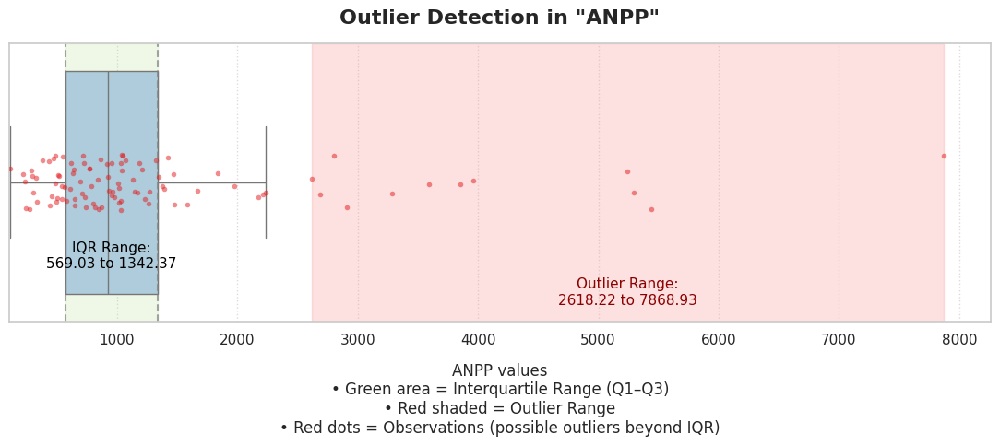

In [70]:
df_rangelands_outliers = detect_outliers(df_rangelands, 'ANPP')
df_rangelands_processed = df_rangelands_outliers['cleaned_df']

In [71]:
df_rangelands_outliers = df_rangelands_outliers['iqr_outliers']

In [72]:
df_rangelands_outliers.head(12)

,year,site.code,type,Crop,Cereal,MAP,ANPP,PPT,WUE
162,2009,SP,Rangelands,Range,Range,863.841700,3958.675000,794.766000,4.980931
176,2010,SP,Rangelands,Range,Range,863.841700,5439.075000,747.268000,7.278614
206,2012,SP,Rangelands,Range,Range,863.841700,3856.800000,557.276000,6.920808
208,2012,TG,Rangelands,Range,Range,913.819249,2689.591321,805.930000,3.337252
220,2013,SP,Rangelands,Range,Range,863.841700,7868.933333,1103.376000,7.159449
265,2016,TG,Rangelands,Range,Range,913.819249,3596.674062,984.100000,3.654785
267,2017,ABS-UF,Rangelands,Range,Range,1237.622148,5297.780000,1361.186000,3.892032
282,2018,ABS-UF,Rangelands,Range,Range,1237.622148,2618.220000,1023.366000,2.558440
309,2019,TG,Rangelands,Range,Range,913.819249,2907.254851,896.300000,3.243618
310,2020,ABS-UF,Rangelands,Range,Range,1237.622148,5242.110000,1287.018000,4.073067


In [73]:
print("Unique values in 'site.code':")
print(df_rangelands['site.code'].value_counts())

Unique values in 'site.code':
site.code
CPER      37
JER       13
TG        13
GB_los     8
GB_wbs     8
GB_mbs     8
SP         6
ABS-UF     5
Name: count, dtype: int64


In [74]:
print("Unique values in 'Crop':")
print(df_rangelands['Crop'].value_counts())

Unique values in 'Crop':
Crop
Range    98
Name: count, dtype: int64


Starting analysis for ANPP with predictor PPT


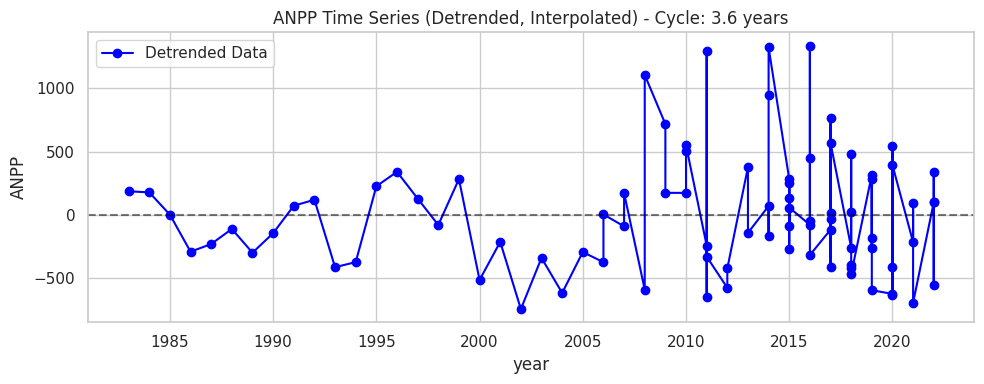

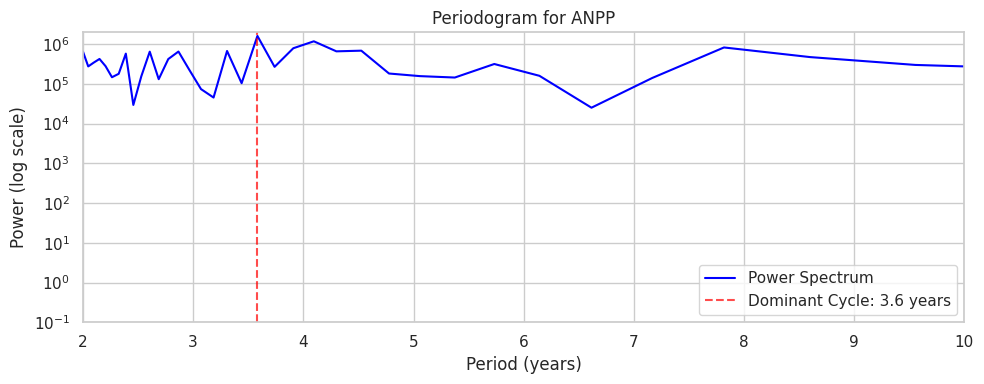

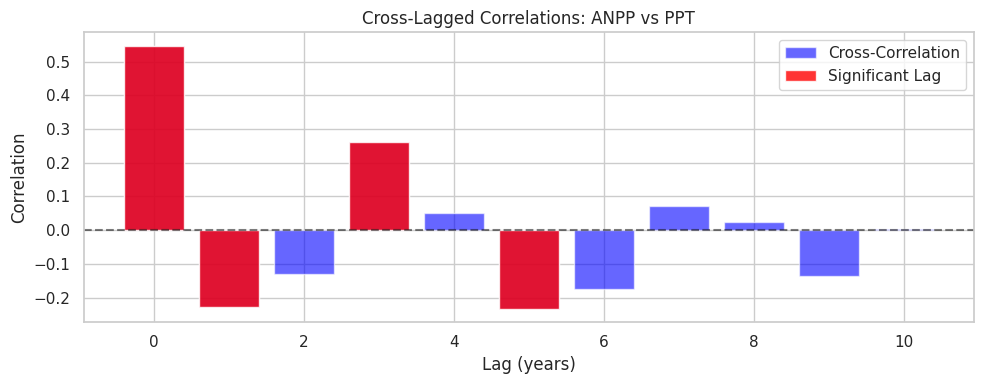

ANPP Results:
Dominant cycle detected at 3.6-year period. No significant autocorrelation detected (lags 1–10). Significant cross-lagged effects (ANPP vs. PPT) at lags: [0, 1, 3, 5].
Starting analysis for PPT with predictor None


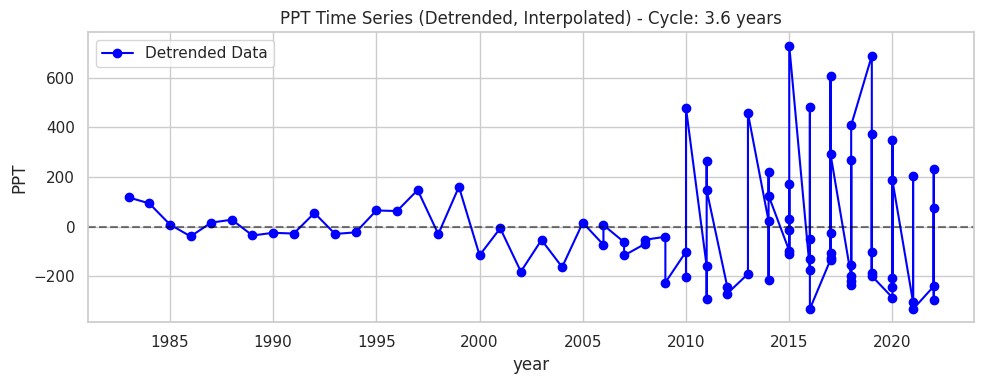

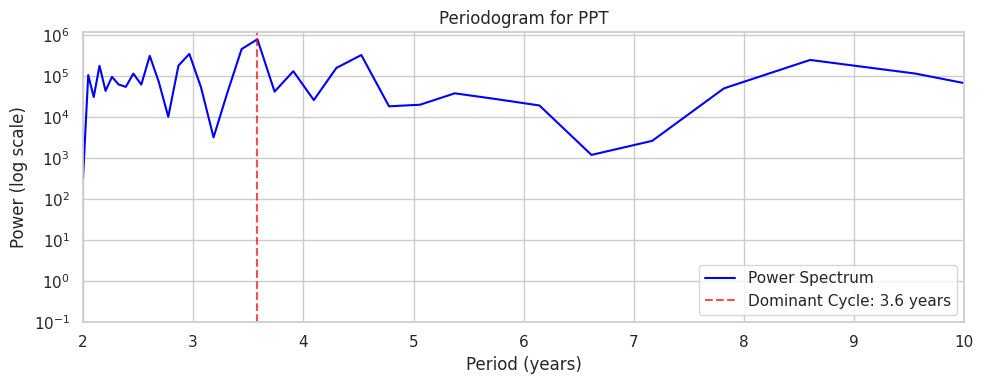

PPT Results:
Dominant cycle detected at 3.6-year period. No significant autocorrelation detected (lags 1–10).


In [75]:
anpp_result = run_time_series_analysis(df_rangelands_processed, value_col = 'ANPP', predictor_col = 'PPT', plot=True)
ppt_result = run_time_series_analysis(df_rangelands_processed, 'PPT', None, plot=True)

In [76]:
pearson_corr, spearman_corr = compute_correlation(df_rangelands, 'ANPP', 'PPT', 'Rangelands')

Correlation between ANPP and PPT - Rangelands (Pearson): 0.6701670109503786
Correlation between ANPP and PPT - Rangelands (Spearman): 0.7008205343993267


In [77]:
top_models_rangelands = run_and_save_models(
    df=df_rangelands,
    analysis_name='Rangelands',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise', 'spline'],
    window_size=range(1, 11),
    lags=[None, [1], [2], [3], [4], [5]],
    cycle_period=3.6,
    show_plot=False,
    show_aic_bic=False
)

Predictors in plot_model: ['PPT', 'quadratic']


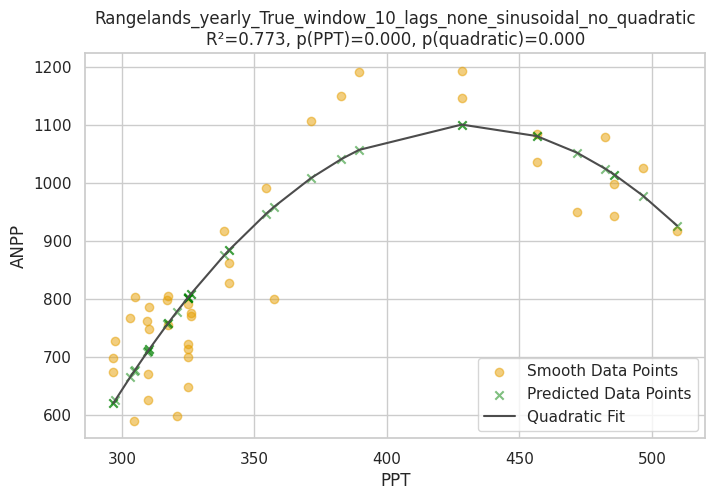

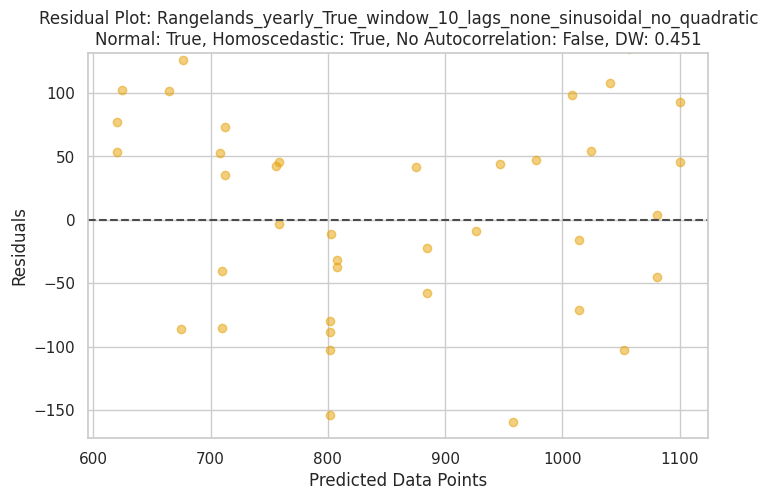

In [78]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=df_rangelands,
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=True,
    window_size=10,
    analysis_name='Rangelands_yearly_True_window_10_lags_none_sinusoidal_no_quadratic',
    plot_name='Rangelands',
    show_plot=True,
    lags=None,
    use_sinusoidal=False,
    cycle_period=0,
    is_run_quadratic=True,
    is_piecewise=False,
    is_spline=False,
)

Predictors in plot_model: ['PPT', 'segment']


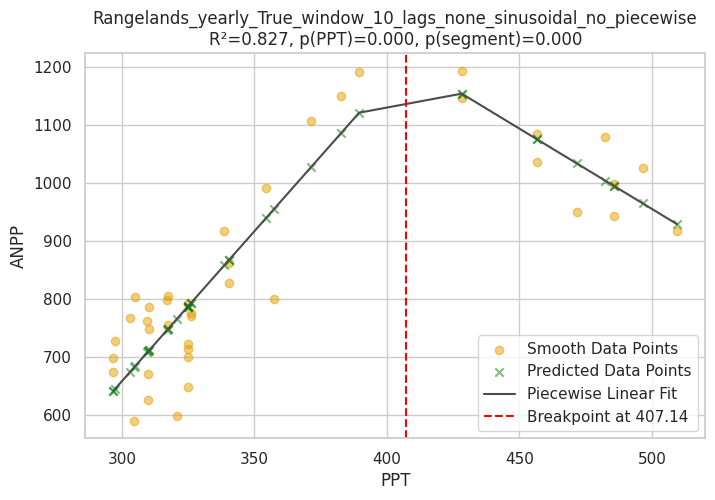

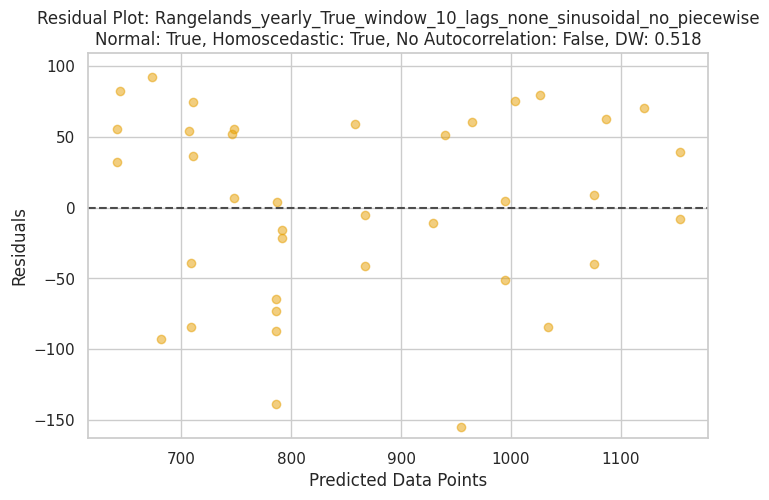

In [79]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=df_rangelands,
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=True,
    window_size=10,
    analysis_name='Rangelands_yearly_True_window_10_lags_none_sinusoidal_no_piecewise',
    plot_name='Rangelands',
    show_plot=True,
    lags=None,
    use_sinusoidal=False,
    cycle_period=0,
    is_run_quadratic=False,
    is_piecewise=True,
    is_spline=False,
)

Predictors in plot_model: ['PPT']


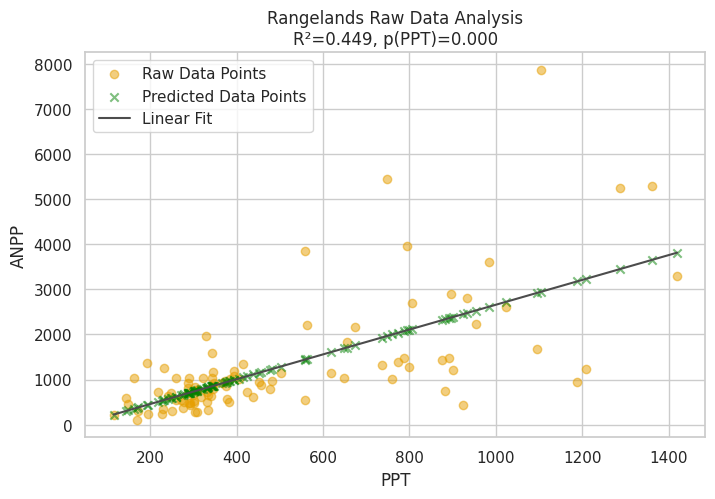

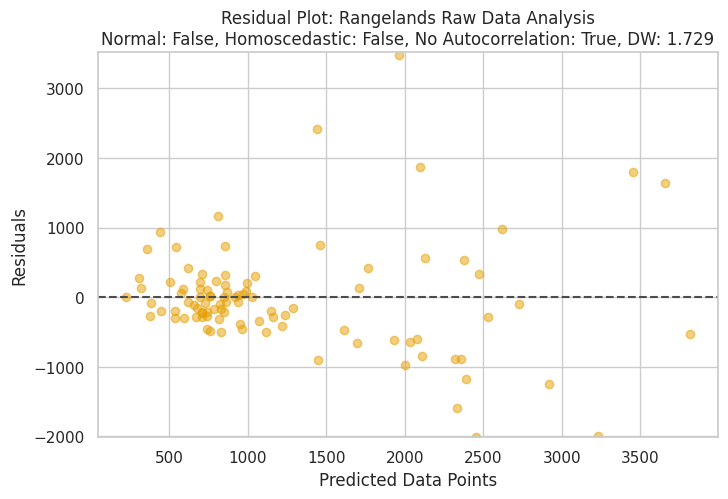

In [80]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=df_rangelands,
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=False,
    window_size=None,
    analysis_name='Rangelands Raw Data Analysis',
    plot_name='Rangelands',
    show_plot=True,
    lags=None,
    use_sinusoidal=False,
    cycle_period=0,
    is_run_quadratic=False,
    is_piecewise=False,
    is_spline=False,
)

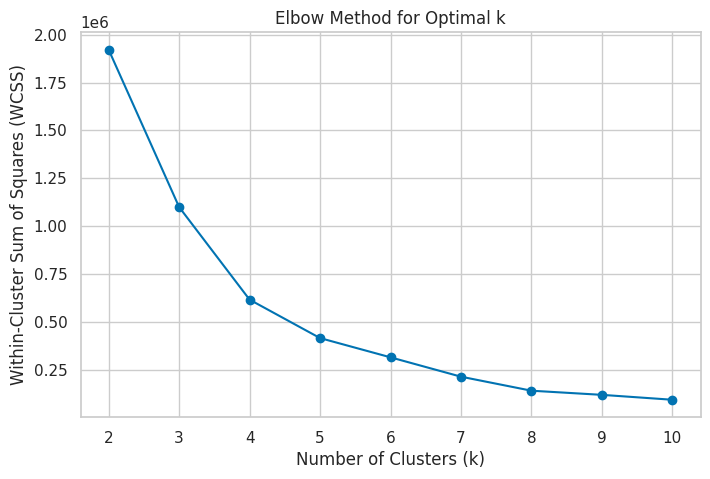

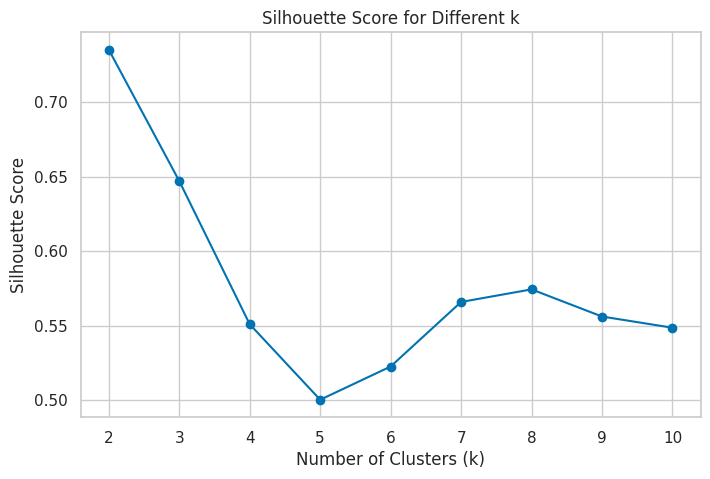

K-means Performance
Silhouette Score: 0.647


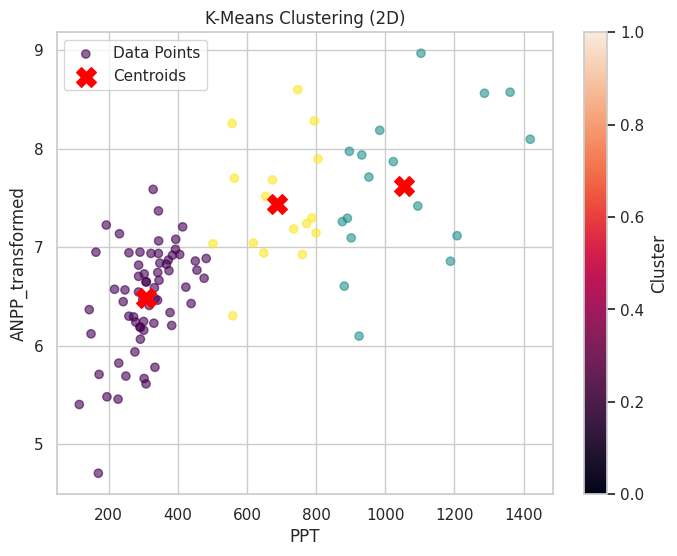


Cluster Summary (Mean Values):
                 PPT         ANPP
Cluster                          
0         308.564923   741.427612
1        1054.388699  2646.713042
2         686.472193  2031.722175
Unique clusters - Rangelands: [0 2 1]

Cluster 0 DataFrame:
Number of observations: 65
Pearson Correlation between ANPP and PPT - Rangelands (cluster 0): 0.37943369122627135


Spearman Correlation between ANPP and PPT - Rangelands (cluster 0): 0.448951048951049



Cluster 1 DataFrame:
Number of observations: 17
Pearson Correlation between ANPP and PPT - Rangelands (cluster 1): 0.45928464190059276


Spearman Correlation between ANPP and PPT - Rangelands (cluster 1): 0.5049019607843138



Cluster 2 DataFrame:
Number of observations: 16
Pearson Correlation between ANPP and PPT - Rangelands (cluster 2): 0.1875284531682036


Spearman Correlation between ANPP and PPT - Rangelands (cluster 2): 0.2764705882352941




In [81]:
columns_transformed = ['PPT', 'ANPP_transformed']
columns_untransformed = ['PPT', 'ANPP']
OPTIMAL_K = 3
K_RANGE = range(2, 11)

df_rangelands_k_means, rangeland_clusters, rangeland_cluster_summary = run_clustering_and_correlations(df_rangelands_transformed, 'Rangelands', \
                                                                columns_transformed, columns_untransformed, K_RANGE, OPTIMAL_K)


Cluster Distribution by Crop:
Crop     Range
Cluster       
0           65
1           17
2           16


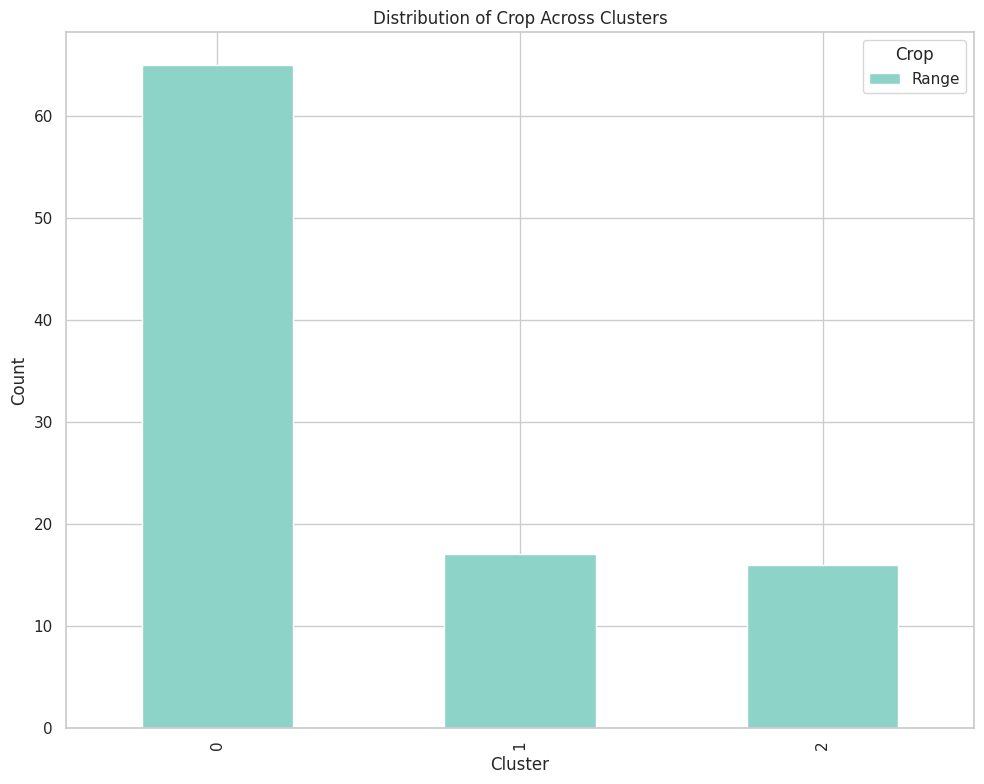

In [82]:
cluster_distribution(df_rangelands_k_means, 'Crop')

Starting analysis for ANPP with predictor PPT


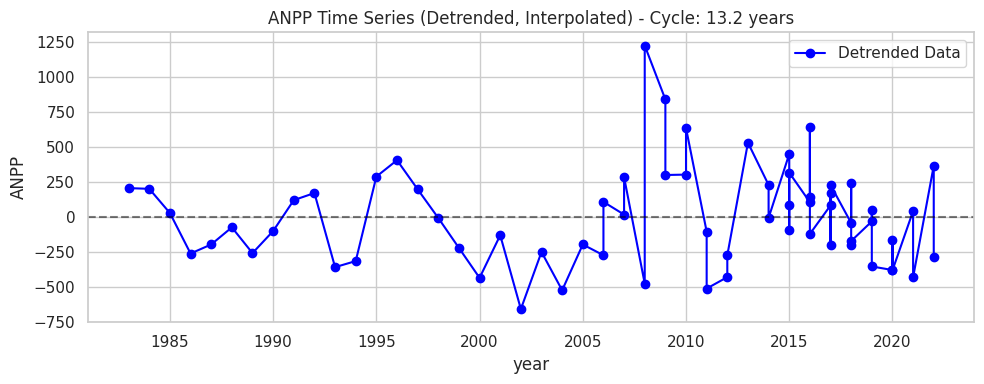

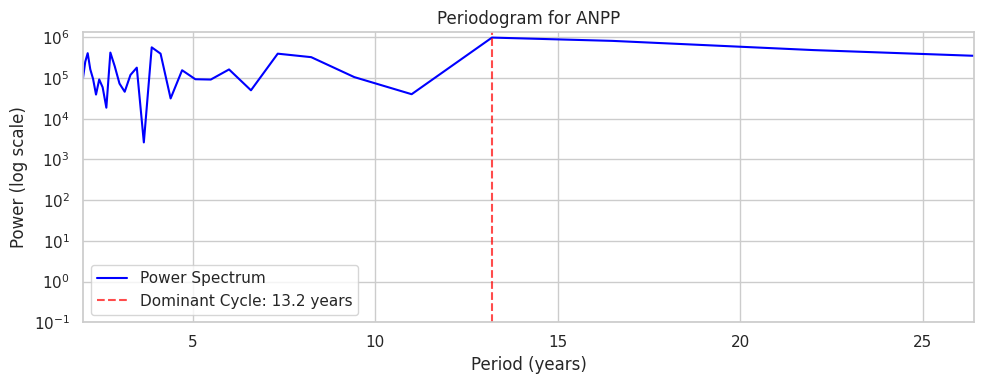

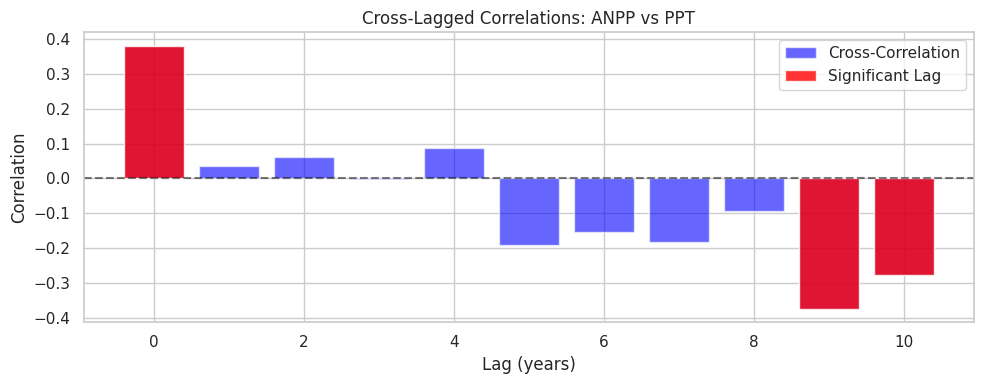

ANPP Results:
Dominant cycle detected at 13.2-year period. No significant autocorrelation detected (lags 1–10). Significant cross-lagged effects (ANPP vs. PPT) at lags: [0, 9, 10].
Starting analysis for PPT with predictor None


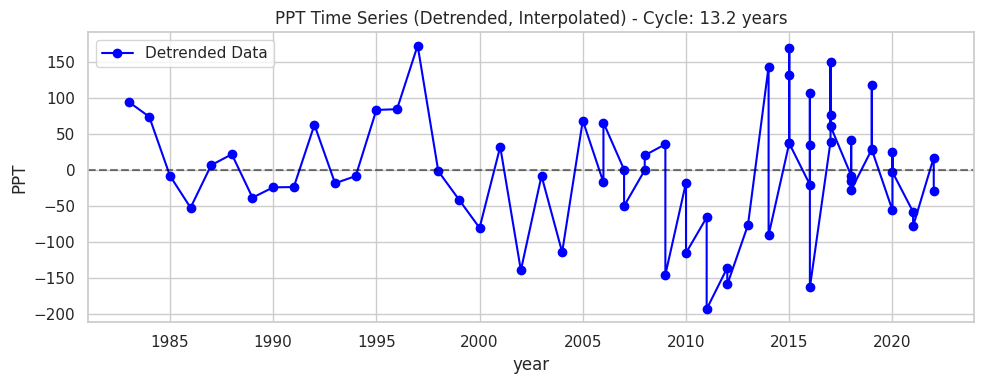

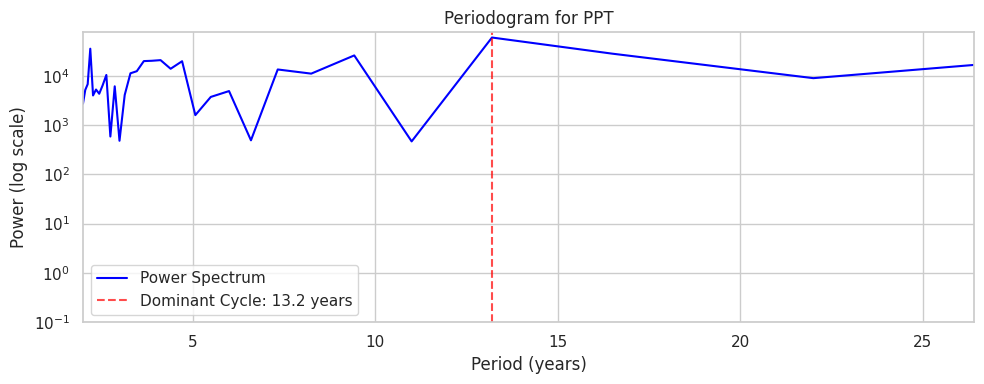

PPT Results:
Dominant cycle detected at 13.2-year period. No significant autocorrelation detected (lags 1–10).


In [83]:
anpp_result = run_time_series_analysis(rangeland_clusters[0], 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(rangeland_clusters[0], 'PPT', None, plot=True)

Starting analysis for ANPP with predictor PPT


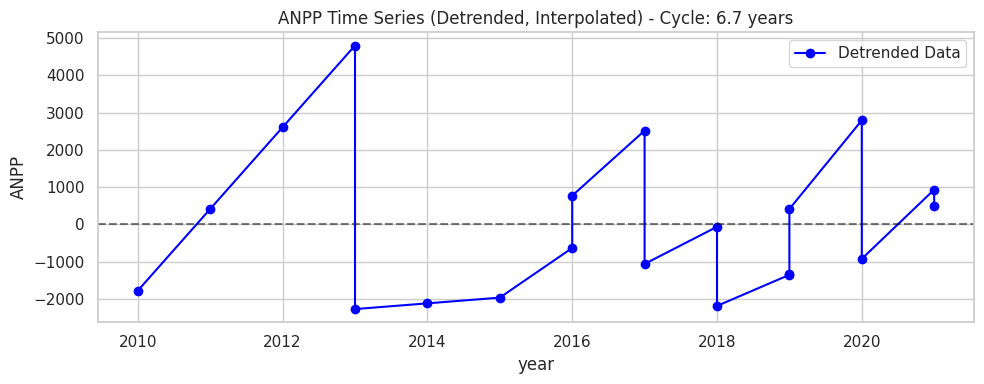

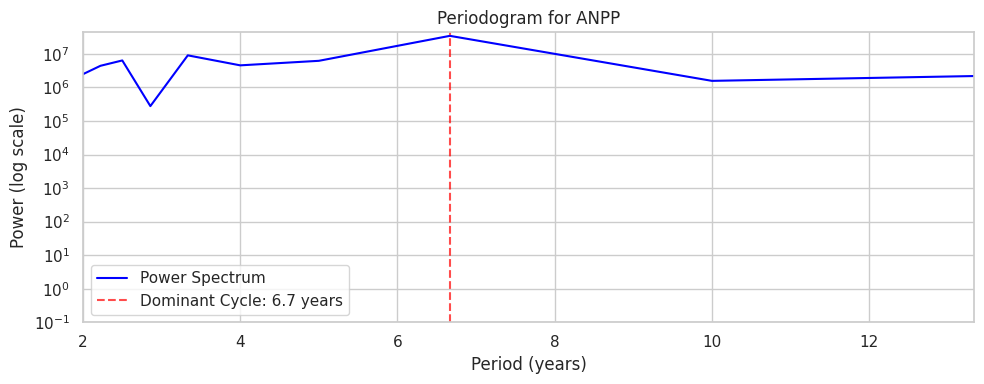

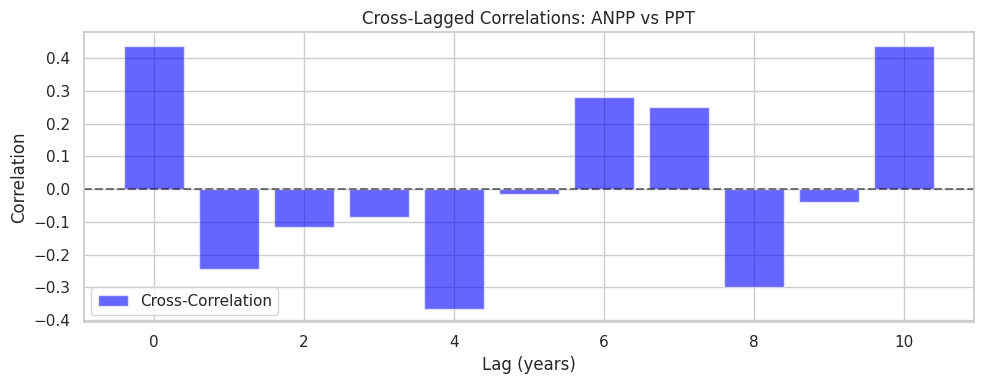

ANPP Results:
Dominant cycle detected at 6.7-year period. No significant autocorrelation detected (lags 1–10). No significant cross-lagged effects (ANPP vs. PPT) detected (lags 0–10).
Starting analysis for PPT with predictor None


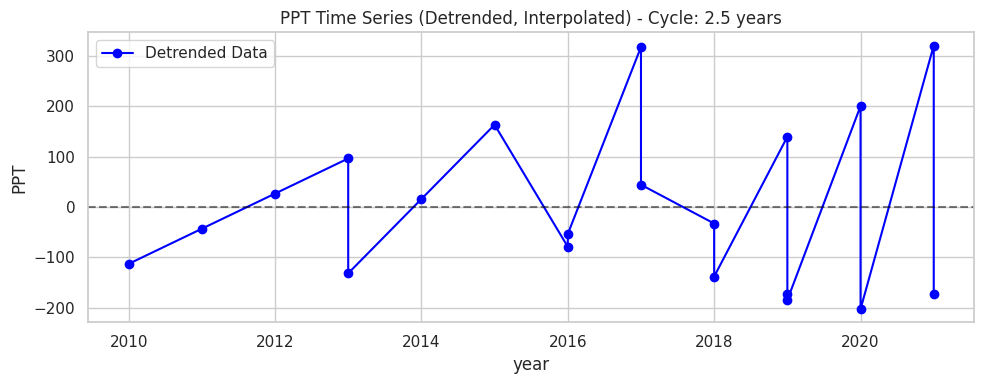

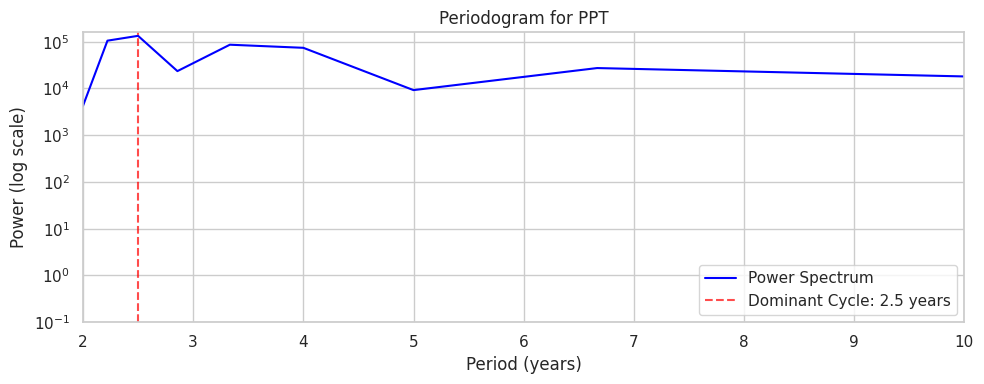

PPT Results:
Dominant cycle detected at 2.5-year period. No significant autocorrelation detected (lags 1–10).


In [84]:
anpp_result = run_time_series_analysis(rangeland_clusters[1], 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(rangeland_clusters[1], 'PPT', None, plot=True)

Starting analysis for ANPP with predictor PPT


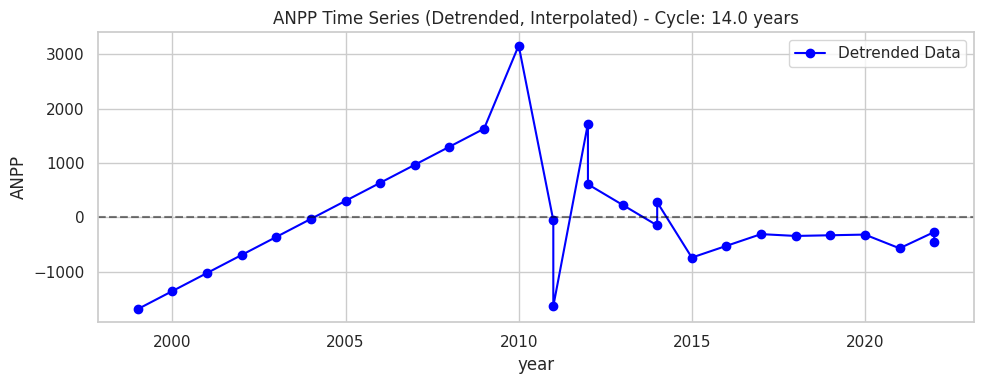

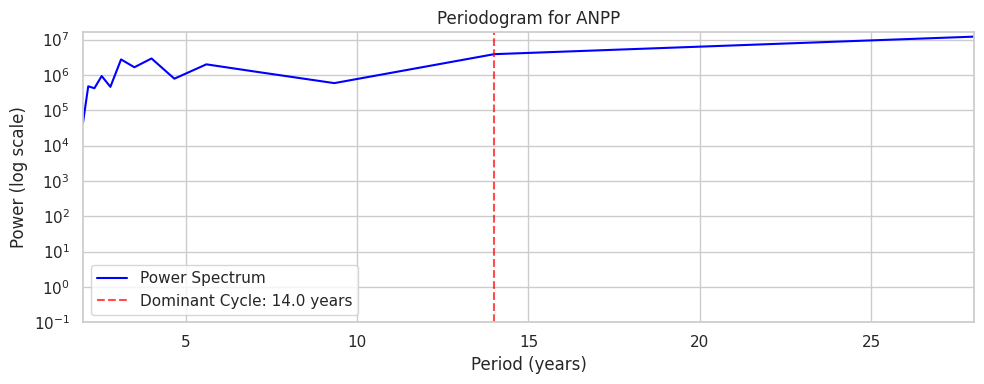

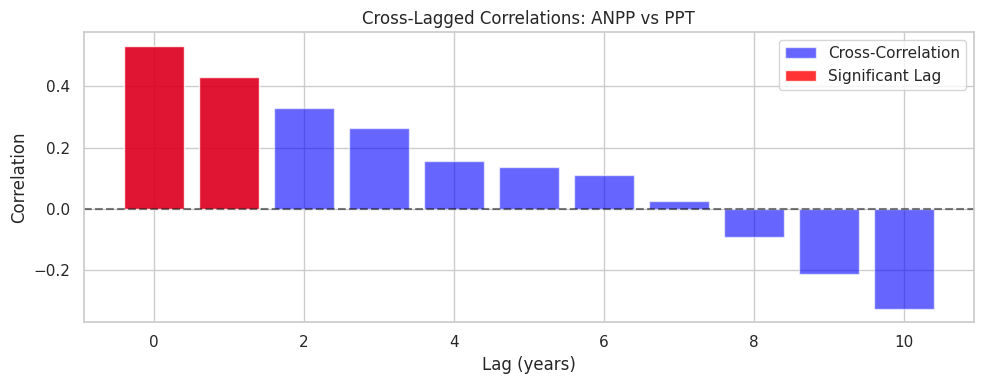

ANPP Results:
Dominant cycle detected at 14.0-year period. No significant autocorrelation detected (lags 1–10). Significant cross-lagged effects (ANPP vs. PPT) at lags: [0, 1].
Starting analysis for PPT with predictor None


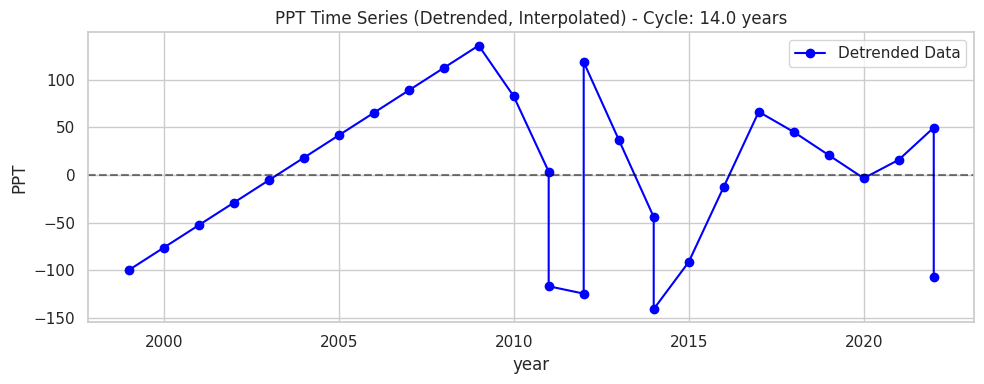

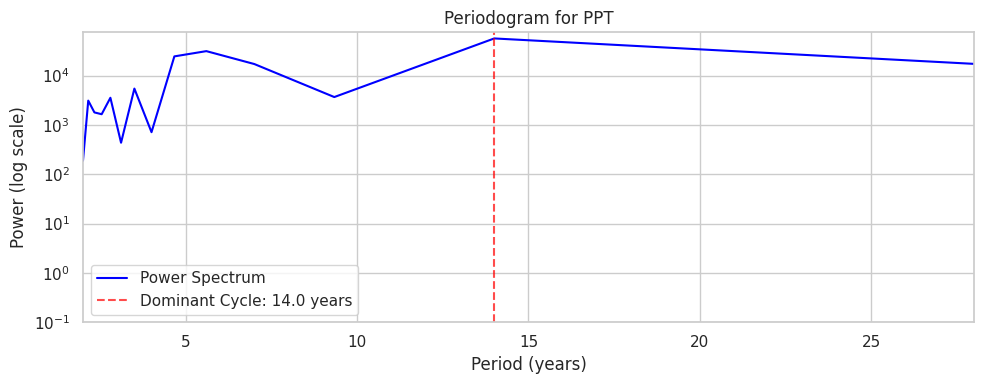

PPT Results:
Dominant cycle detected at 14.0-year period. No significant autocorrelation detected (lags 1–10).


In [85]:
anpp_result = run_time_series_analysis(rangeland_clusters[2], 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(rangeland_clusters[2], 'PPT', None, plot=True)

In [86]:
try:
  top_models = run_and_save_models(
    df=rangeland_clusters[0],
    analysis_name='Rangelands_cluster_0',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=[],
    window_size=range(1, 11),
    lags=[None, [9], [10]],
    cycle_period=13,
    show_plot=False,
    show_aic_bic=False
    )

except Exception as e:
  print(e)

In [87]:
try:
  top_models_rangelands_c1 = run_and_save_models(
    df=rangeland_clusters[1],
    analysis_name='Rangelands_cluster_1',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=[],
    window_size=range(1, 6),
    lags=[None],
    cycle_period=3,
    show_plot=False,
    show_aic_bic=False
    )

except Exception as e:
  print(e)

In [88]:
try:
  top_models_rangelands_c2 = run_and_save_models(
    df=rangeland_clusters[2],
    analysis_name='Rangelands_cluster_0',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=[],
    window_size=range(1, 6),
    lags=[None],
    cycle_period=14,
    show_plot=False,
    show_aic_bic=False
    )

except Exception as e:
  print(e)

## **Pasture**

In [89]:
df_unfiltered_pasture = df.copy()
df_pasture = filter_df(df_unfiltered_pasture, 'type', 'Pasture')

In [90]:
df_pasture_transformed, df_pasture_transformed_info = transform_dataframe(df_pasture, ['ANPP', 'WUE'])


IQR Method for ANPP:
Q1: 2679.30, Q3: 5220.56, IQR: 2541.26
Lower Bound: -1132.58, Upper Bound: 9032.45
Number of IQR outliers: 7
Range of IQR outliers: (9041.160579, 10347.33731)


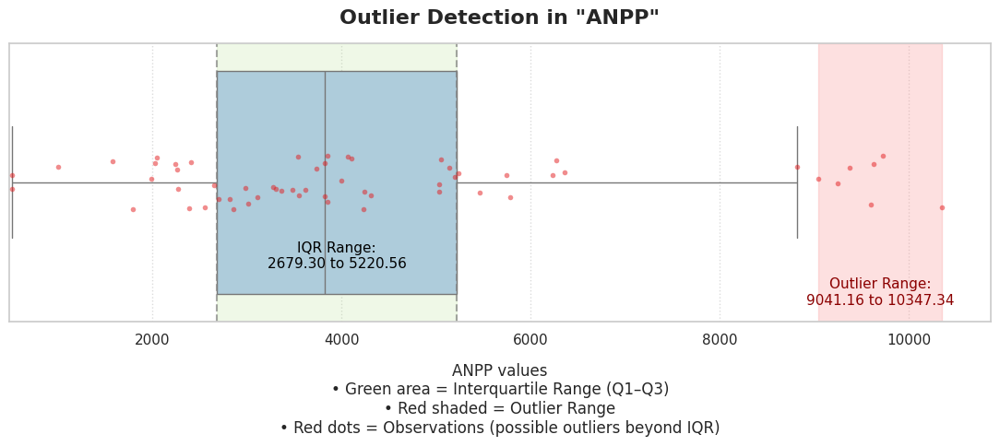

In [91]:
df_pasture_outliers = detect_outliers(df_pasture, 'ANPP')
df_pasture_processed = df_pasture_outliers['cleaned_df']
df_pasture_outliers = df_pasture_outliers['iqr_outliers']

In [92]:
df_pasture_outliers.head(7)

,year,site.code,type,Crop,Cereal,MAP,ANPP,PPT,WUE
138,2007,UCB,Pasture,Switchgrass,Pasture,1068.967476,9727.850396,935.210,10.401782
152,2008,UCB,Pasture,Switchgrass,Pasture,1068.967476,9041.160579,862.076,10.487661
166,2009,UCB,Pasture,Switchgrass,Pasture,1068.967476,9630.164580,823.812,11.689760
182,2010,UCB,Pasture,Switchgrass,Pasture,1068.967476,9593.059006,700.022,13.703939
197,2011,UCB,Pasture,Switchgrass,Pasture,1068.967476,10347.337310,930.402,11.121362
211,2012,UCB,Pasture,Switchgrass,Pasture,1068.967476,9368.044264,1136.386,8.243717
225,2013,UCB,Pasture,Switchgrass,Pasture,1068.967476,9242.596214,933.980,9.895925


In [93]:
print("Unique values in 'site.code':")
print(df_pasture['site.code'].value_counts())

print("Unique values in 'Crop':")
print(df_pasture['Crop'].value_counts())

Unique values in 'site.code':
site.code
UCB      28
PRHPA    18
TG       13
Name: count, dtype: int64
Unique values in 'Crop':
Crop
Switchgrass    40
Alfalfa        10
Mixed_grass     9
Name: count, dtype: int64


Starting analysis for ANPP with predictor PPT


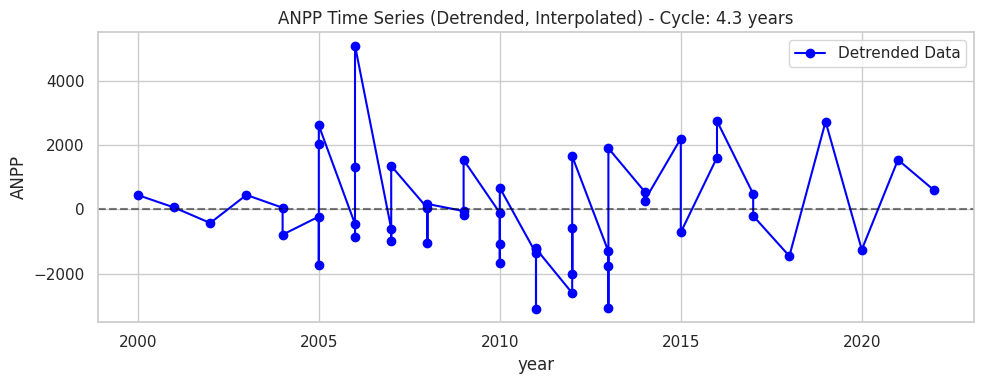

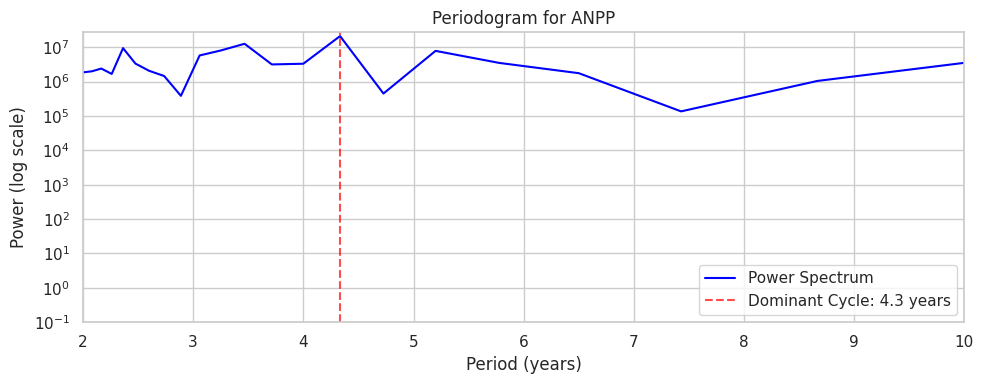

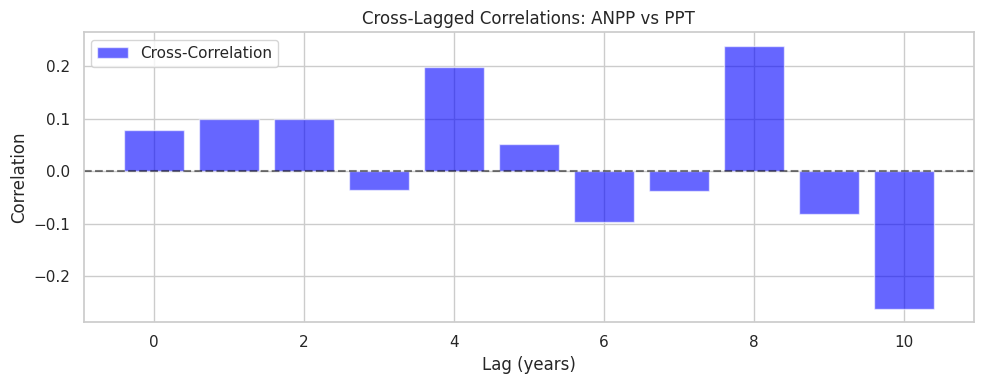

ANPP Results:
Dominant cycle detected at 4.3-year period. No significant autocorrelation detected (lags 1–10). No significant cross-lagged effects (ANPP vs. PPT) detected (lags 0–10).
Starting analysis for PPT with predictor None


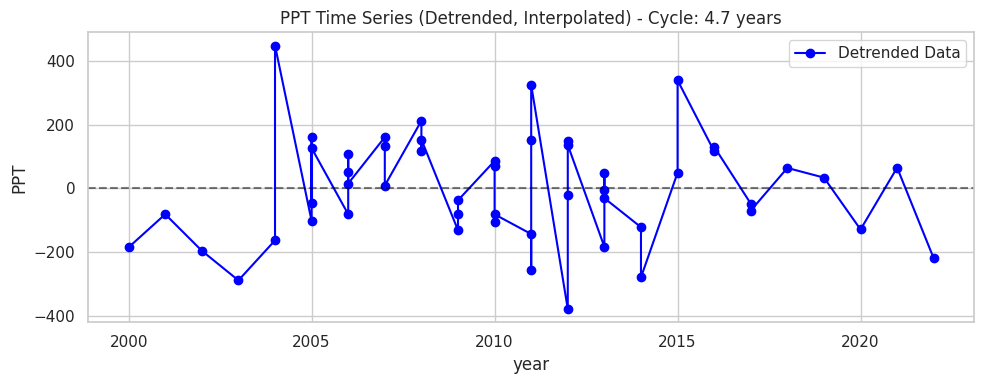

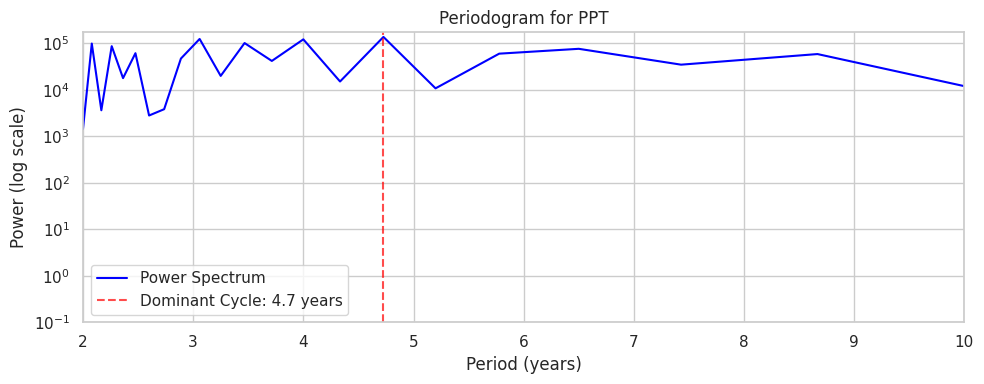

PPT Results:
Dominant cycle detected at 4.7-year period. No significant autocorrelation detected (lags 1–10).


In [94]:
anpp_result = run_time_series_analysis(df_pasture_processed, 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(df_pasture_processed, 'PPT', None, plot=True)

In [95]:
pearson_corr, spearman_corr = compute_correlation(df_pasture, 'ANPP', 'PPT', 'Pasture')

Correlation between ANPP and PPT - Pasture (Pearson): 0.17907178894479894
Correlation between ANPP and PPT - Pasture (Spearman): 0.10958503798947984


In [96]:
top_models_pasture = run_and_save_models(
    df=df_pasture,
    analysis_name='Pasture',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise', 'spline'],
    window_size=range(1, 5),
    lags=[None],
    cycle_period=4.7,
    show_plot=False,
    show_aic_bic=False
)

linear No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
quadratic No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
piecewise No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
spline No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).


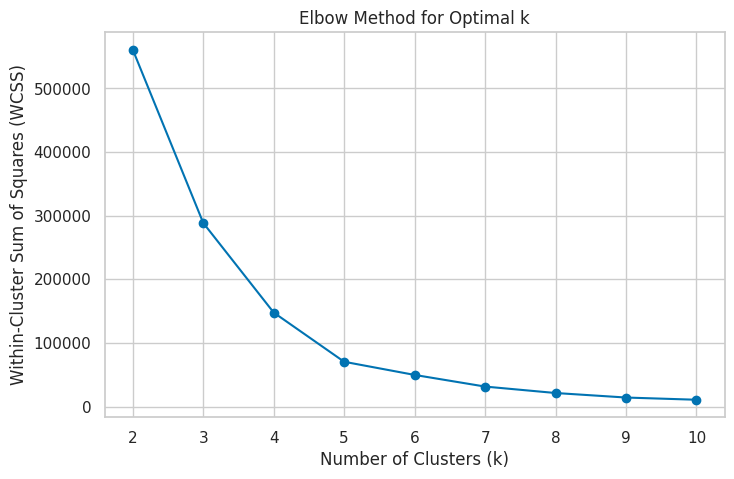

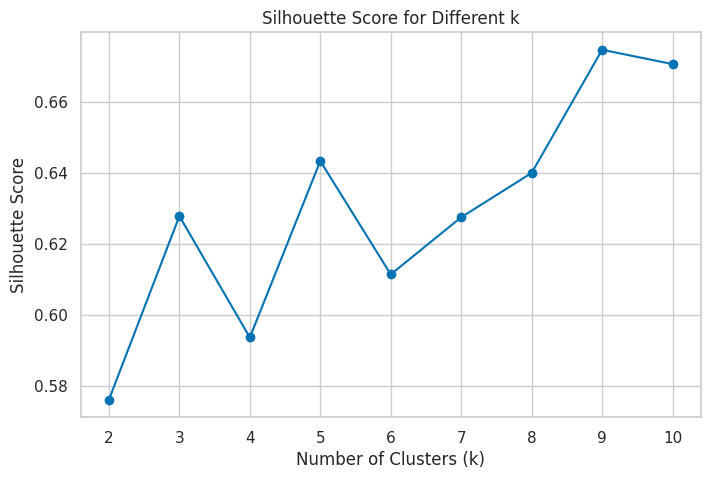

K-means Performance
Silhouette Score: 0.628


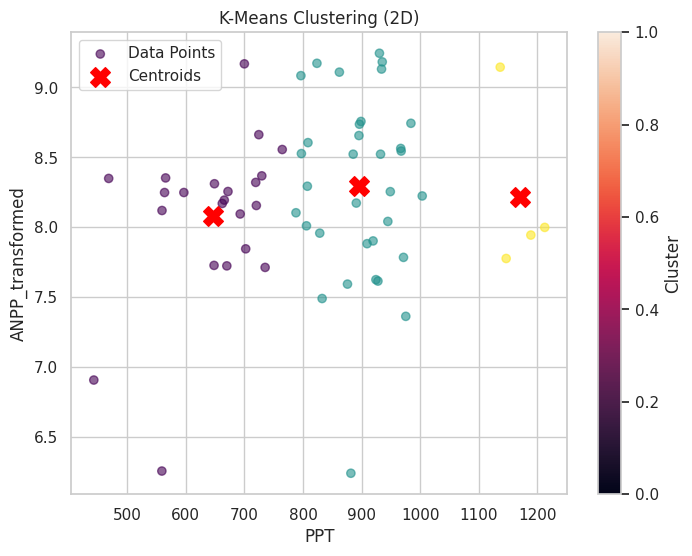


Cluster Summary (Mean Values):
                 PPT         ANPP
Cluster                          
0         646.100777  3690.112506
1         895.478633  4772.919472
2        1170.976249  4389.050455
Unique clusters - Pasture: [0 2 1]

Cluster 0 DataFrame:
Number of observations: 22
Pearson Correlation between ANPP and PPT - Pasture (cluster 0): 0.35587600463983504


Spearman Correlation between ANPP and PPT - Pasture (cluster 0): 0.3235460191981932



Cluster 1 DataFrame:
Number of observations: 33
Pearson Correlation between ANPP and PPT - Pasture (cluster 1): -0.05875679595839297


Spearman Correlation between ANPP and PPT - Pasture (cluster 1): -0.013703208556149734



Cluster 2 DataFrame:
Number of observations: 4
Pearson Correlation between ANPP and PPT - Pasture (cluster 2): -0.5876615413186453


Spearman Correlation between ANPP and PPT - Pasture (cluster 2): -0.19999999999999998




In [97]:
columns_transformed = ['PPT', 'ANPP_transformed']
columns_untransformed = ['PPT', 'ANPP']
OPTIMAL_K = 3
K_RANGE = range(2, 11)

df_pasture_k_means, pasture_clusters, pasture_cluster_summary = run_clustering_and_correlations(df_pasture_transformed, 'Pasture', \
                                                                columns_transformed, columns_untransformed, K_RANGE, OPTIMAL_K)


Cluster Distribution by site.code:
site.code  PRHPA  TG  UCB
Cluster                  
0             12   4    6
1              6   8   19
2              0   1    3


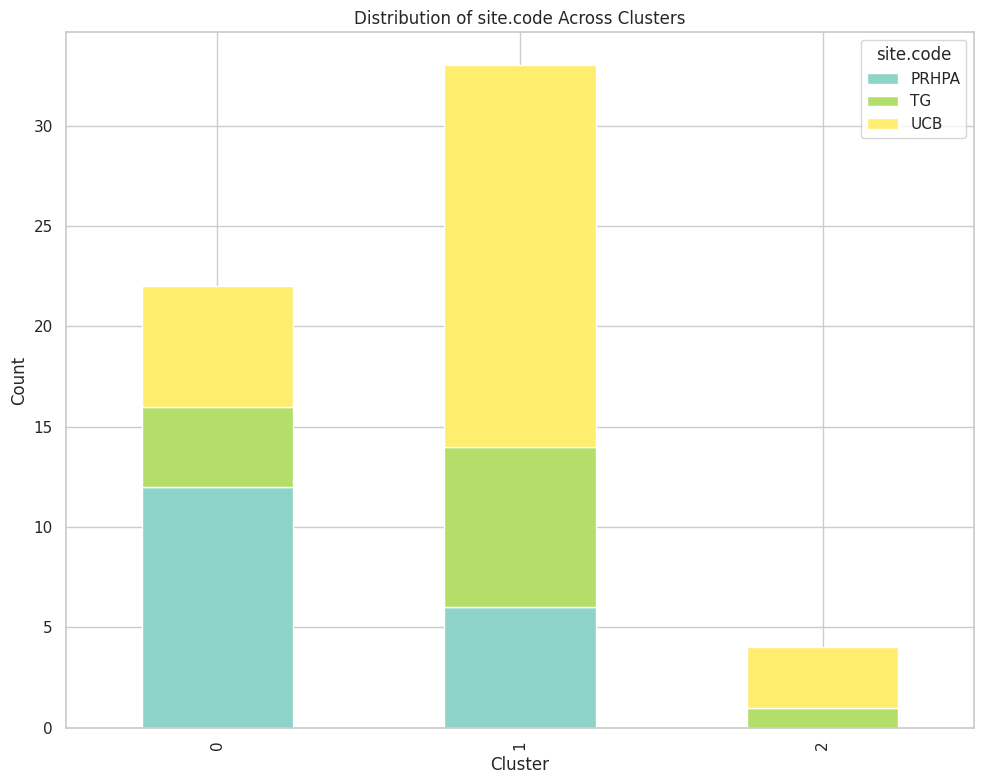

In [98]:
cluster_distribution(df_pasture_k_means, 'site.code')

Starting analysis for ANPP with predictor PPT


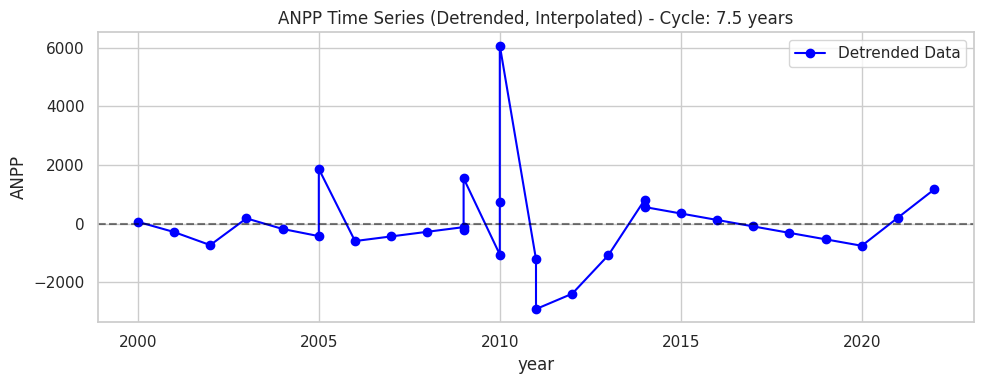

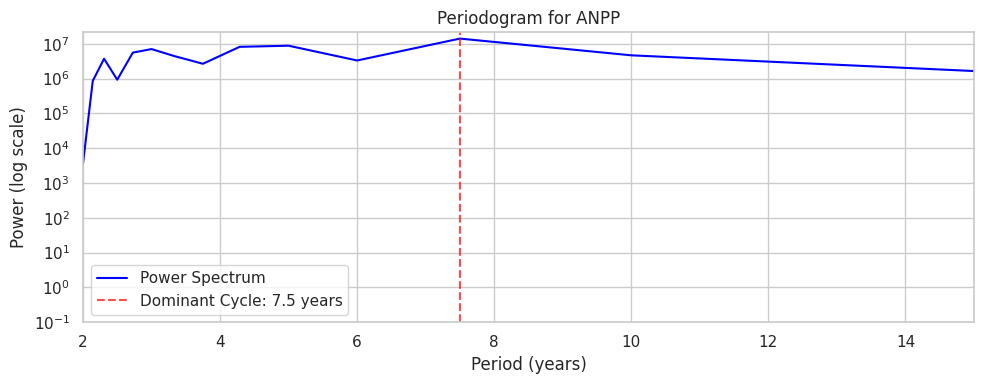

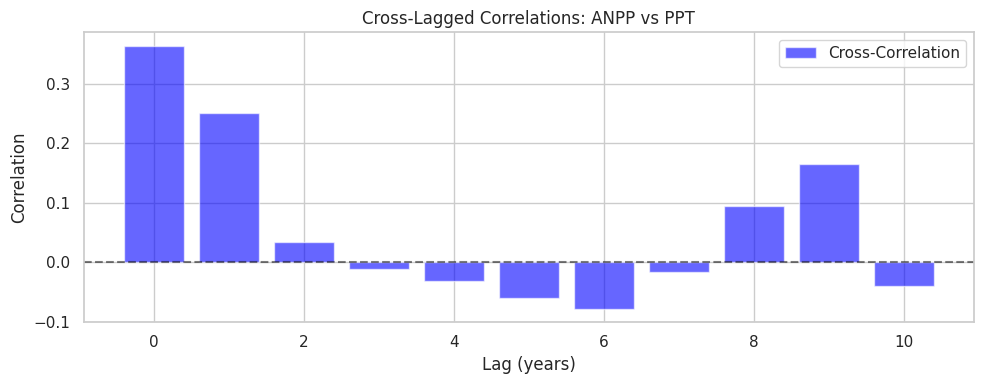

ANPP Results:
Dominant cycle detected at 7.5-year period. No significant autocorrelation detected (lags 1–10). No significant cross-lagged effects (ANPP vs. PPT) detected (lags 0–10).
Starting analysis for PPT with predictor None


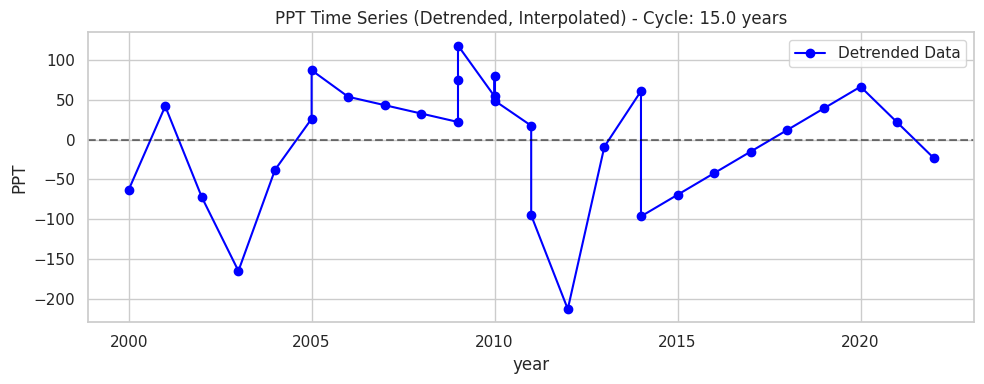

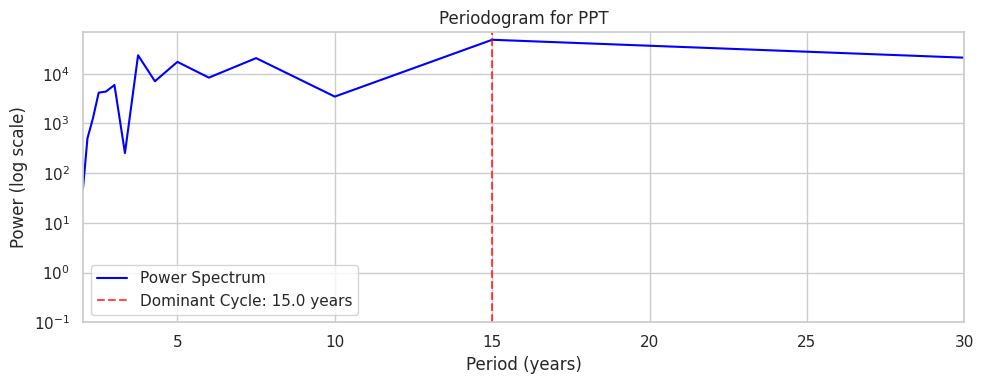

PPT Results:
Dominant cycle detected at 15.0-year period. No significant autocorrelation detected (lags 1–10).


In [99]:
anpp_result = run_time_series_analysis(pasture_clusters[0], 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(pasture_clusters[0], 'PPT', None, plot=True)

Starting analysis for ANPP with predictor PPT


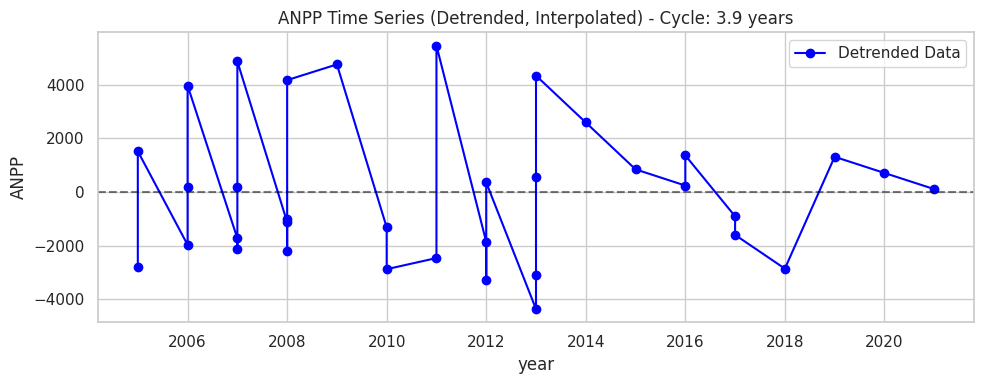

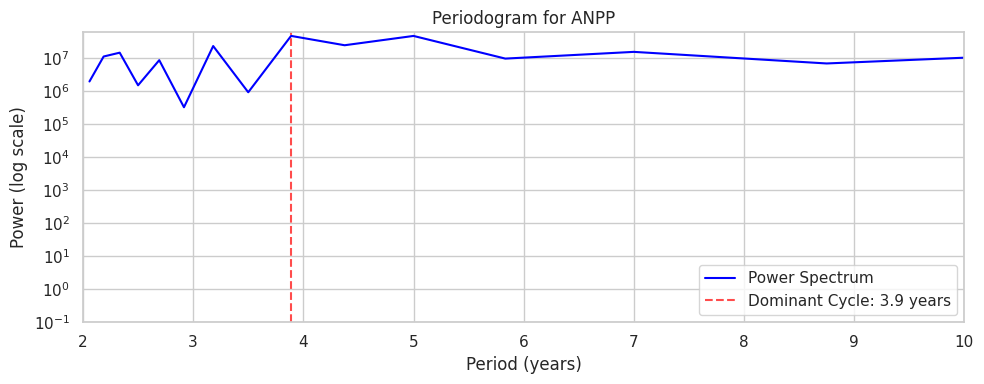

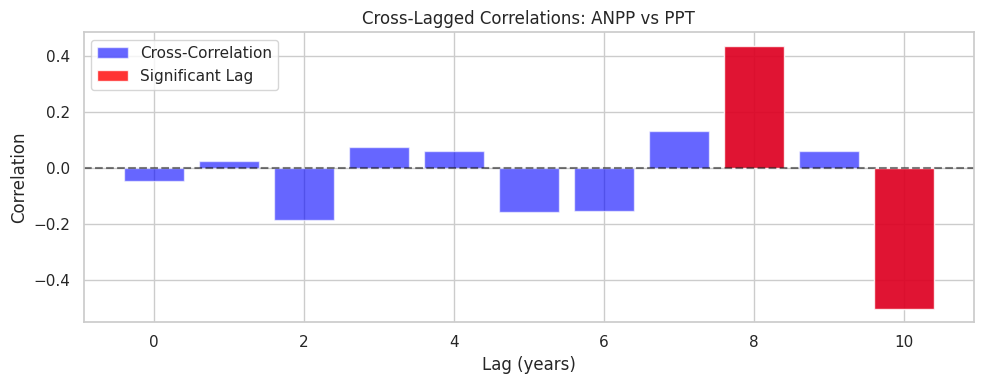

ANPP Results:
Dominant cycle detected at 3.9-year period. No significant autocorrelation detected (lags 1–10). Significant cross-lagged effects (ANPP vs. PPT) at lags: [8, 10].
Starting analysis for PPT with predictor None


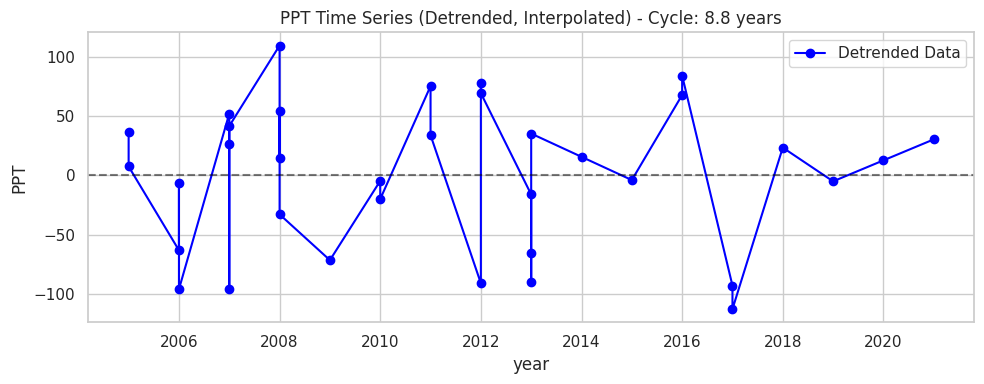

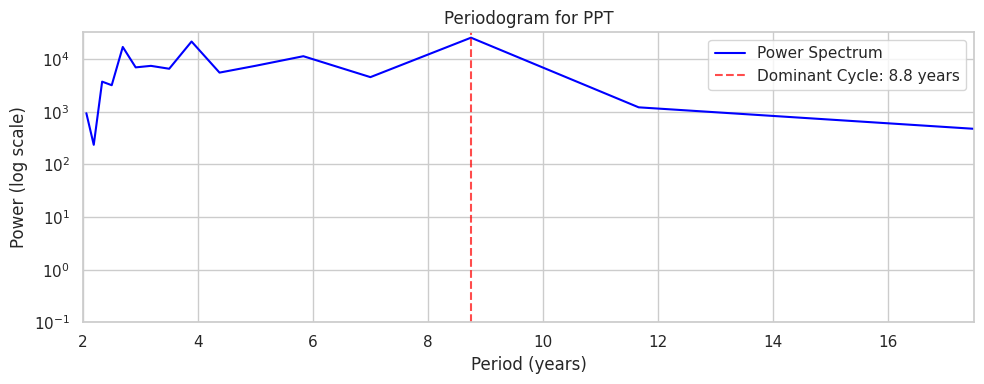

PPT Results:
Dominant cycle detected at 8.8-year period. No significant autocorrelation detected (lags 1–10).


In [100]:
anpp_result = run_time_series_analysis(pasture_clusters[1], 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(pasture_clusters[1], 'PPT', None, plot=True)

Starting analysis for ANPP with predictor PPT


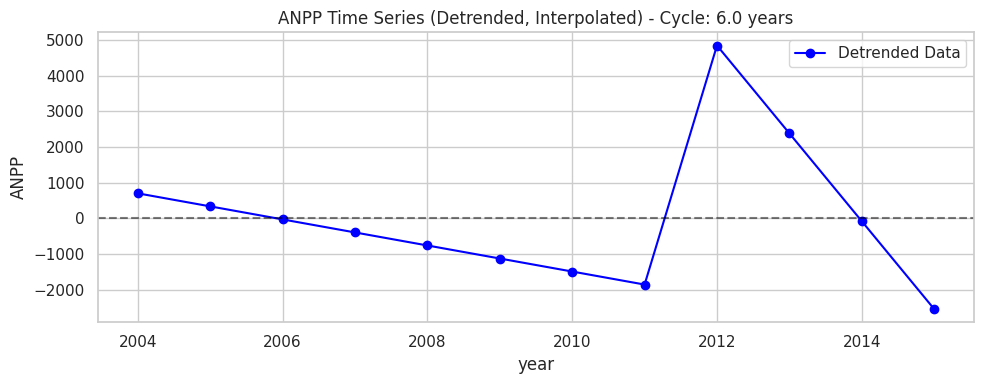

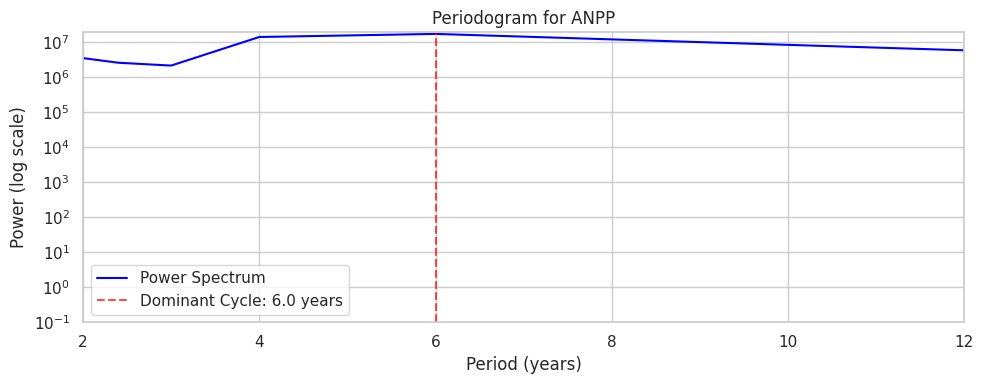

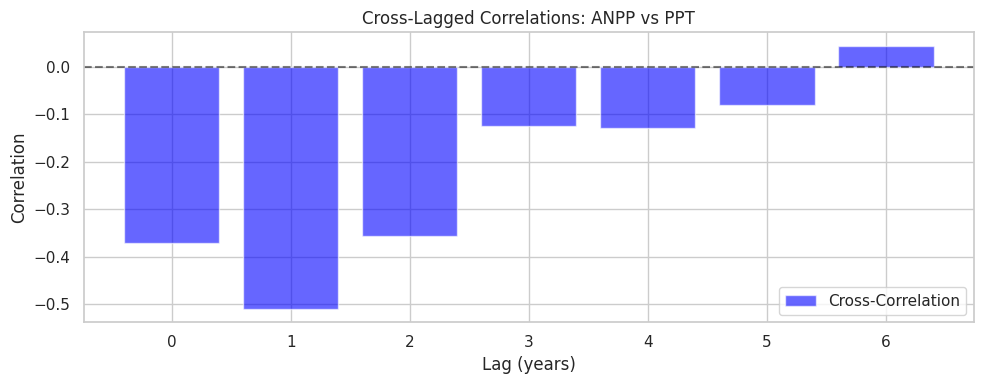

ANPP Results:
Dominant cycle detected at 6.0-year period. No significant autocorrelation detected (lags 1–10). No significant cross-lagged effects (ANPP vs. PPT) detected (lags 0–10).
Starting analysis for PPT with predictor None


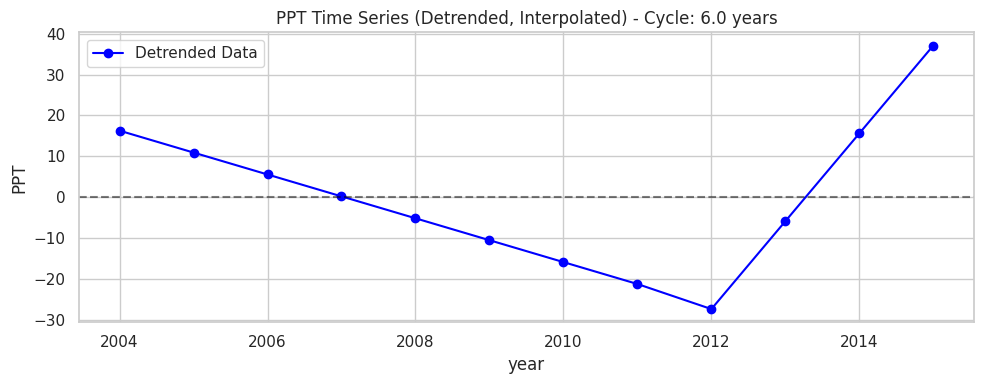

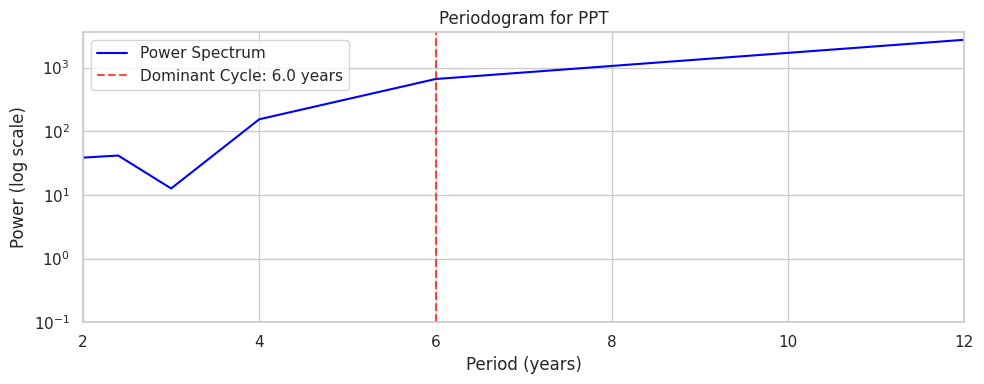

PPT Results:
Dominant cycle detected at 6.0-year period. No significant autocorrelation detected (lags 1–10).


In [101]:
anpp_result = run_time_series_analysis(pasture_clusters[2], 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(pasture_clusters[2], 'PPT', None, plot=True)

In [102]:
try:
  top_models_pasture = run_and_save_models(
    df=pasture_clusters[1],
    analysis_name='Pasture_cluster_1',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=[],
    window_size=range(1, 9),
    lags=[None],
    cycle_period=9,
    show_plot=False,
    show_aic_bic=False
    )

except Exception as e:
  print(e)

In [103]:
try:
  top_models_pasture = run_and_save_models(
    df=pasture_clusters[2],
    analysis_name='Pasture_cluster_2',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=[],
    window_size=range(1, 9),
    lags=[None],
    cycle_period=6,
    show_plot=False,
    show_aic_bic=False
    )

except Exception as e:
  print(e)

In [104]:
try:
  top_models_pasture = run_and_save_models(
    df=pasture_clusters[0],
    analysis_name='Pasture_cluster_0',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=[],
    window_size=range(1, 9),
    lags=[None],
    cycle_period=15.0,
    show_plot=False,
    show_aic_bic=False
    )

except Exception as e:
  print(e)

## **Croplands**

In [105]:
df_unfiltered_croplands = df.copy()
df_croplands = filter_df(df_unfiltered_croplands, 'type', 'Croplands')

In [106]:
df_croplands_transformed, df_croplands_transformed_info = transform_dataframe(df_croplands, ['ANPP', 'WUE'])


IQR Method for ANPP:
Q1: 6292.67, Q3: 14521.96, IQR: 8229.29
Lower Bound: -6051.26, Upper Bound: 26865.89
Number of IQR outliers: 2
Range of IQR outliers: (28261.72354, 30431.75853)


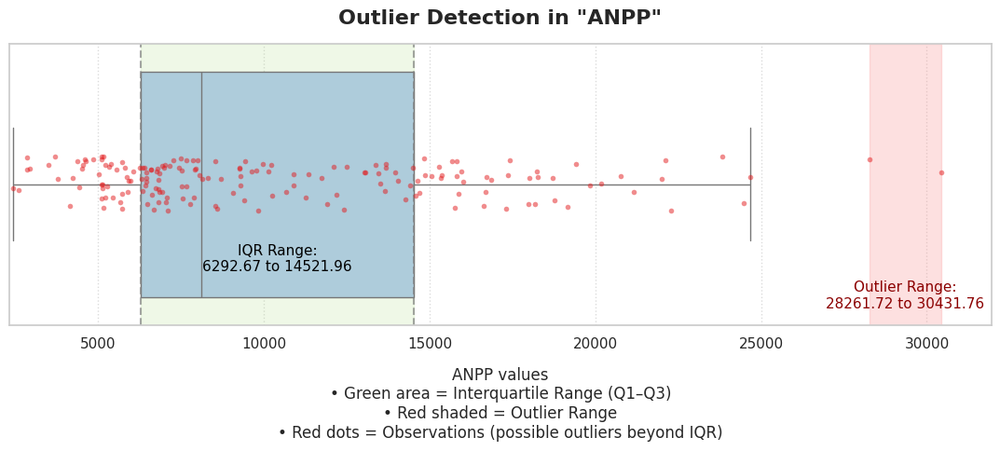

In [107]:
df_croplands_outliers = detect_outliers(df_croplands, 'ANPP')
df_croplands_processed = df_croplands_outliers['cleaned_df']
df_croplands_outliers = df_croplands_outliers['iqr_outliers']

In [108]:
print("Unique values in 'site.code':")
print(df_croplands_processed['site.code'].value_counts())

print("Unique values in 'Crop':")
print(df_croplands['Crop'].value_counts())

Unique values in 'site.code':
site.code
PRHPA    72
KBS      32
NP       18
UMRB     14
LCB      12
UCB       8
NH        7
CAF       6
ECB       5
Name: count, dtype: int64
Unique values in 'Crop':
Crop
Maize           69
Soybean         60
Winter_Wheat    23
Spring_Wheat    20
Oats             2
Garbanzo         1
Canola           1
Name: count, dtype: int64


Starting analysis for ANPP with predictor PPT


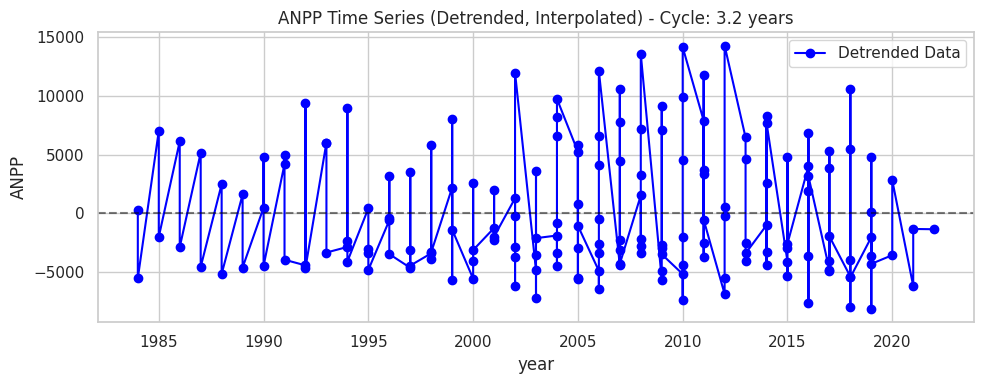

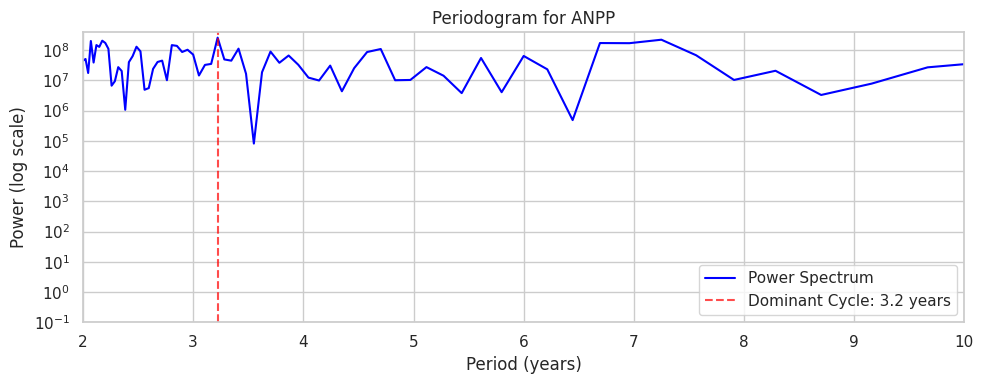

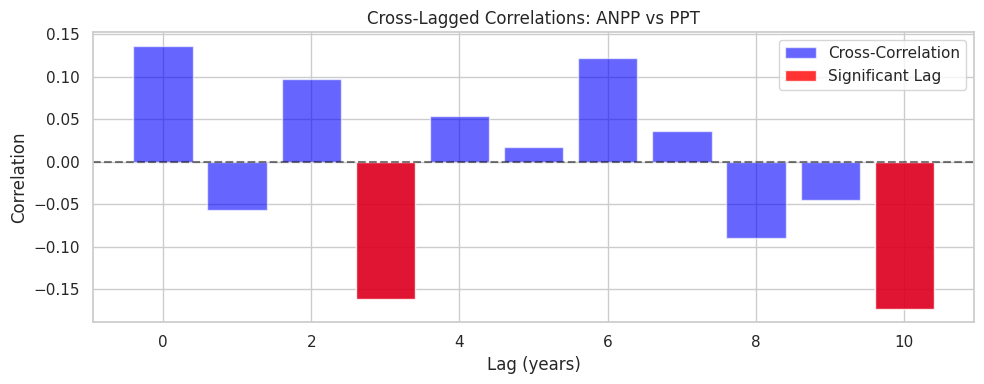

ANPP Results:
Dominant cycle detected at 3.2-year period. No significant autocorrelation detected (lags 1–10). Significant cross-lagged effects (ANPP vs. PPT) at lags: [3, 10].
Starting analysis for PPT with predictor None


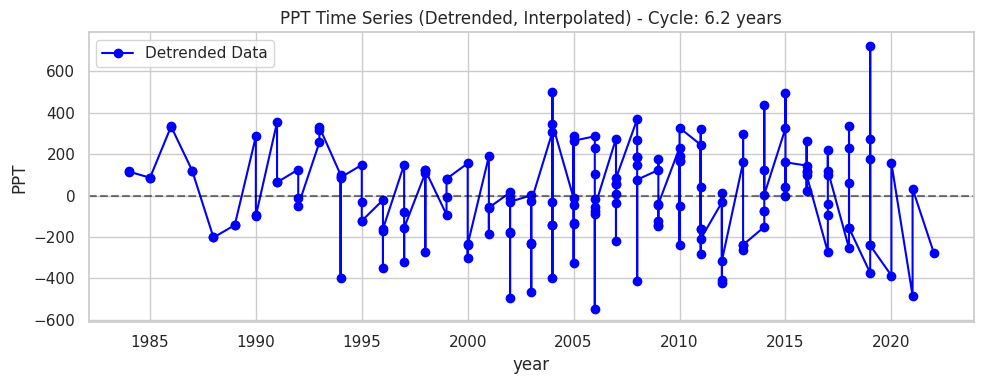

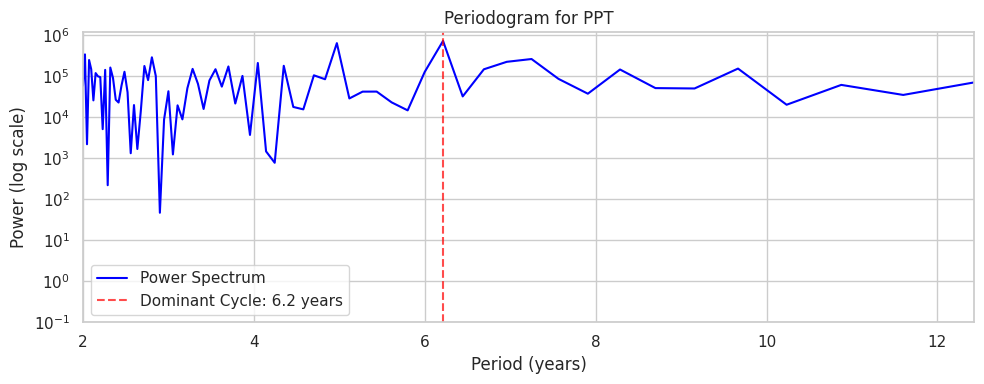

PPT Results:
Dominant cycle detected at 6.2-year period. No significant autocorrelation detected (lags 1–10).


In [109]:
anpp_result = run_time_series_analysis(df_croplands_processed, 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(df_croplands_processed, 'PPT', None, plot=True)

In [110]:
pearson_corr, spearman_corr = compute_correlation(df_croplands, 'ANPP', 'PPT', 'Croplands')


Correlation between ANPP and PPT - Croplands (Pearson): 0.1592984956730502
Correlation between ANPP and PPT - Croplands (Spearman): 0.17567397272314622


In [111]:
top_models_croplands = run_and_save_models(
    df=df_croplands,
    analysis_name='Croplands',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise', 'spline'],
    window_size=range(1, 11),
    lags=[None, [1], [2], [3], [4], [5]],
    cycle_period=7,
    show_plot=False,
    show_aic_bic=False
)

#performs well with cycle_period 7 instead of 6.2

quadratic No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).


Predictors in plot_model: ['PPT']


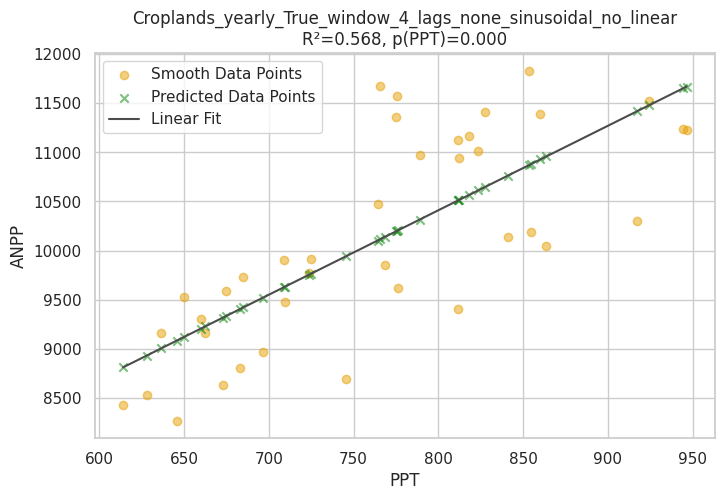

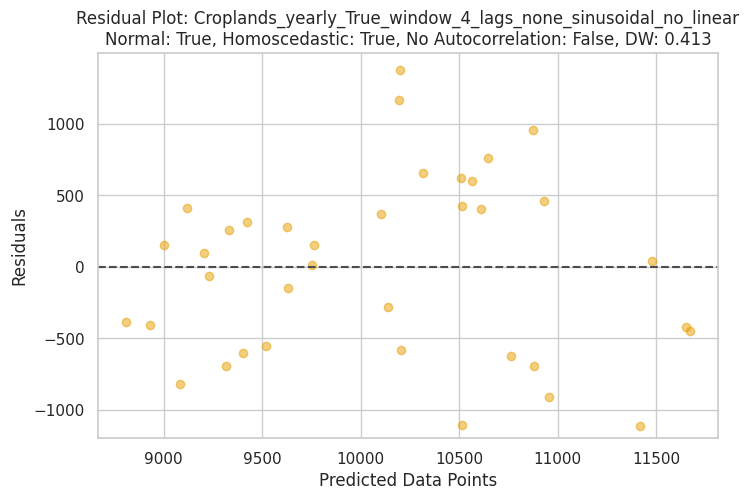

In [112]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=df_croplands,
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=True,
    window_size=4,
    analysis_name='Croplands_yearly_True_window_4_lags_none_sinusoidal_no_linear',
    plot_name='Croplands',
    show_plot=True,
    lags=None,
    use_sinusoidal=False,
    cycle_period=0,
    is_run_quadratic=False,
    is_piecewise=False,
    is_spline=False,
)

Predictors in plot_model: ['PPT', 'sin_cycle', 'cos_cycle', 'segment']


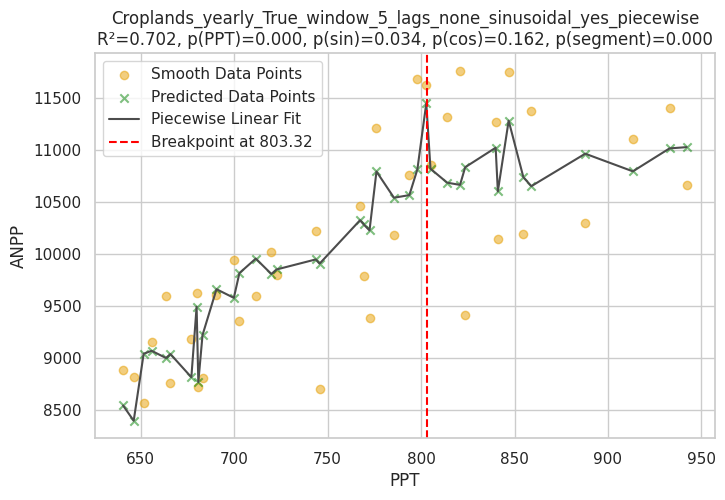

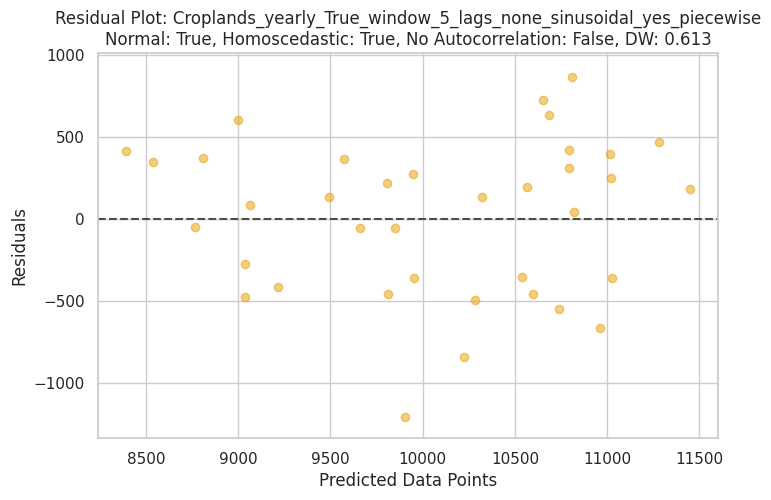

In [113]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=df_croplands,
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=True,
    window_size=5,
    analysis_name='Croplands_yearly_True_window_5_lags_none_sinusoidal_yes_piecewise',
    plot_name='Croplands',
    show_plot=True,
    lags=None,
    use_sinusoidal=True,
    cycle_period=7,
    is_run_quadratic=False,
    is_piecewise=True,
    is_spline=False,
)

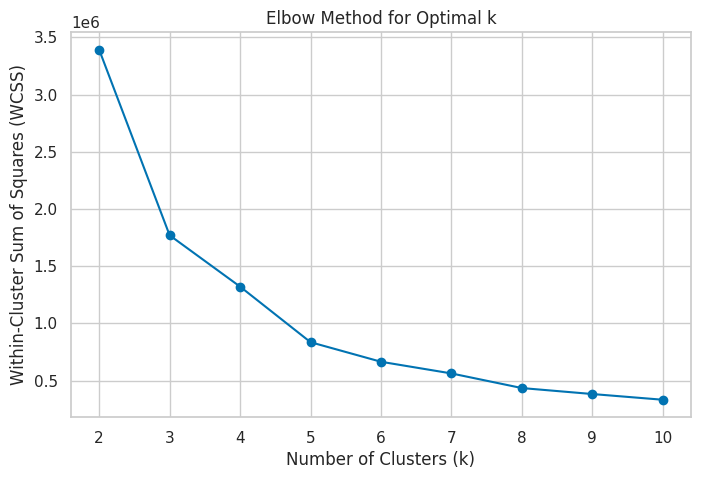

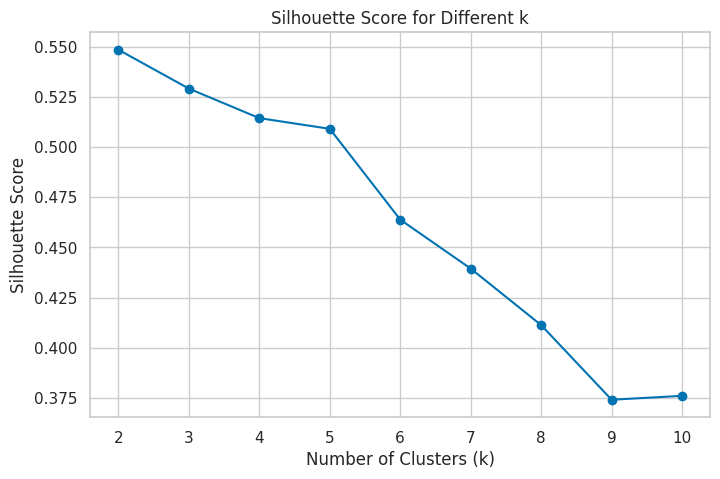

K-means Performance
Silhouette Score: 0.529


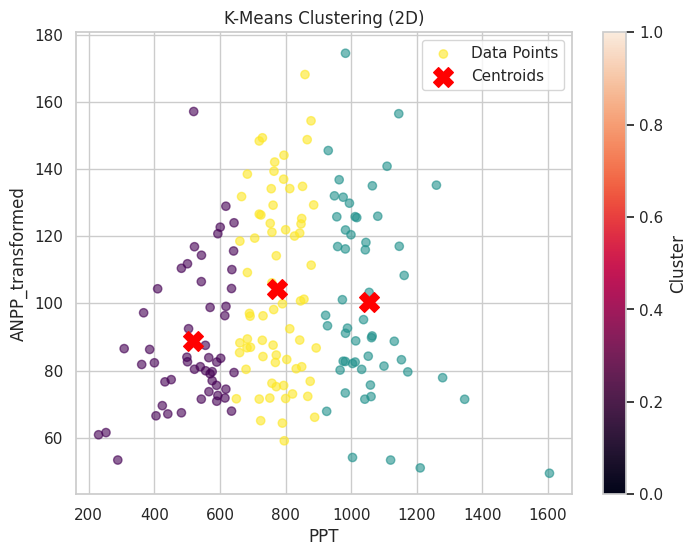


Cluster Summary (Mean Values):
                 PPT          ANPP
Cluster                           
0         518.355340   8314.743862
1        1055.518273  10876.822469
2         773.940328  11583.161050
Unique clusters - Croplands: [2 1 0]

Cluster 0 DataFrame:
Number of observations: 53
Pearson Correlation between ANPP and PPT - Croplands (cluster 0): 0.31776806486094816


Spearman Correlation between ANPP and PPT - Croplands (cluster 0): 0.29206823449404207



Cluster 1 DataFrame:
Number of observations: 54
Pearson Correlation between ANPP and PPT - Croplands (cluster 1): -0.24885296185973876


Spearman Correlation between ANPP and PPT - Croplands (cluster 1): -0.24645001541442332



Cluster 2 DataFrame:
Number of observations: 69
Pearson Correlation between ANPP and PPT - Croplands (cluster 2): 0.11158235840610163


Spearman Correlation between ANPP and PPT - Croplands (cluster 2): 0.06120510140183629




In [114]:
columns_transformed = ['PPT', 'ANPP_transformed']
columns_untransformed = ['PPT', 'ANPP']
OPTIMAL_K = 3
K_RANGE = range(2, 11)

df_croplands_k_means, croplands_clusters, croplands_cluster_summary = run_clustering_and_correlations(df_croplands_transformed, 'Croplands', \
                                                                columns_transformed, columns_untransformed, K_RANGE, OPTIMAL_K)



Cluster Distribution by site.code:
site.code  CAF  ECB  KBS  LCB  NH  NP  PRHPA  UCB  UMRB
Cluster                                                
0            6    0    1    0   0  15     28    0     3
1            0    4   19   11   3   0     10    3     4
2            0    1   12    1   6   3     34    5     7


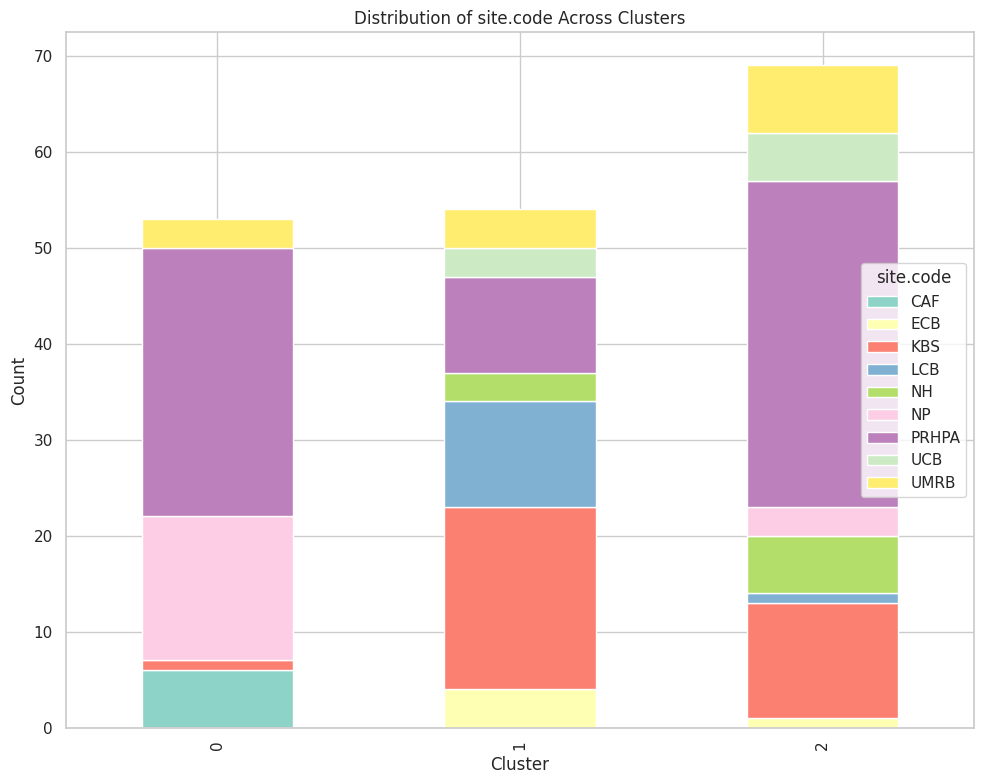

In [115]:
cluster_distribution(df_croplands_k_means, 'site.code')


Cluster Distribution by Crop:
Crop     Canola  Garbanzo  Maize  Oats  Soybean  Spring_Wheat  Winter_Wheat
Cluster                                                                    
0             1         1     16     0       16            17             2
1             0         0     21     2       15             0            16
2             0         0     32     0       29             3             5


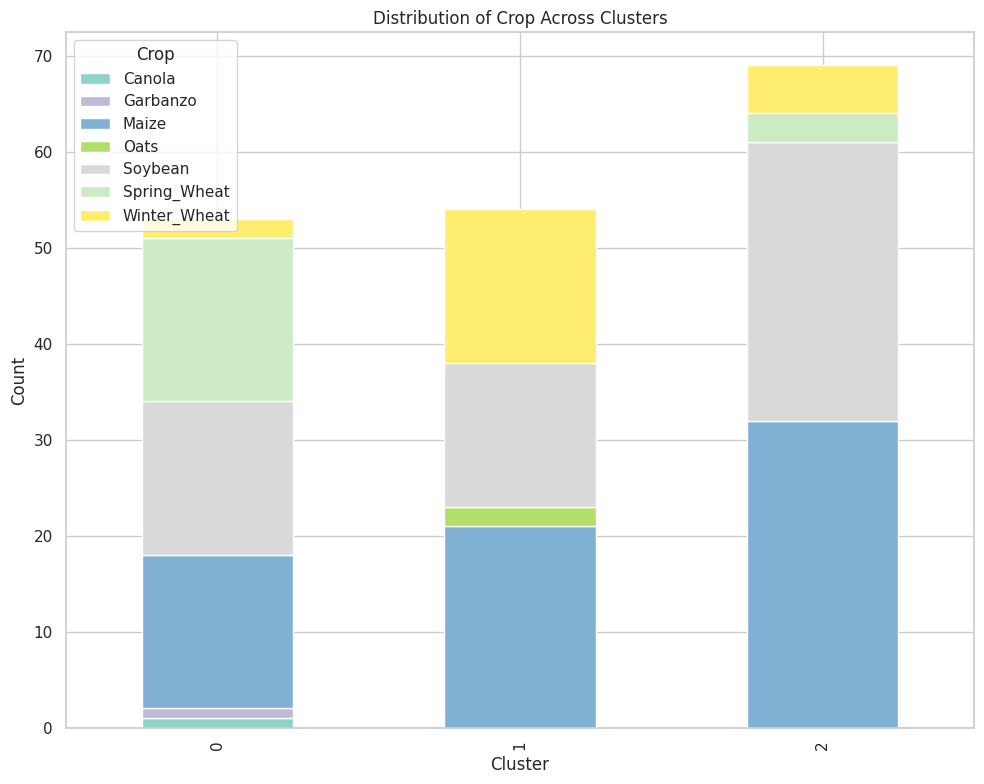

In [116]:
cluster_distribution(df_croplands_k_means, 'Crop')

Starting analysis for ANPP with predictor PPT


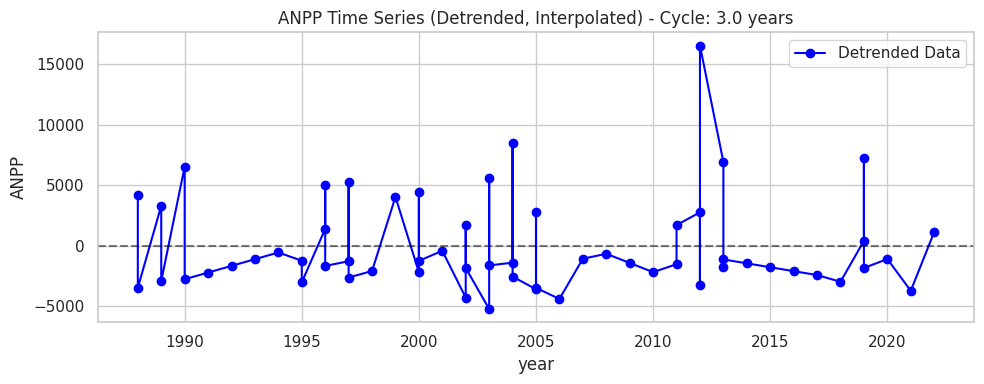

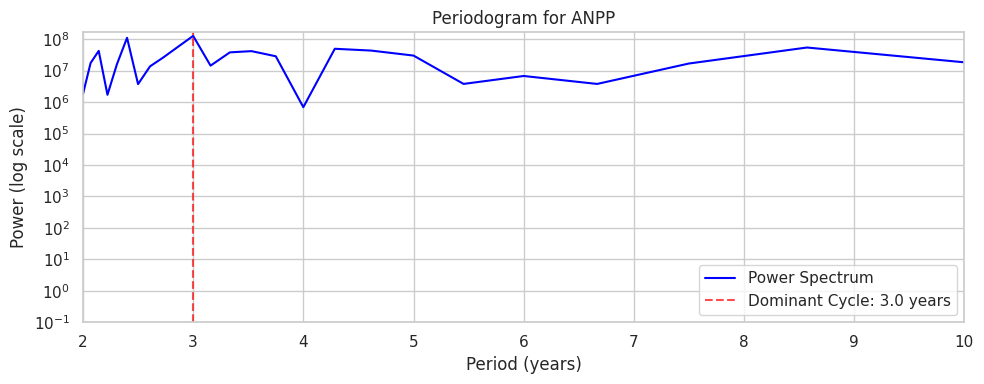

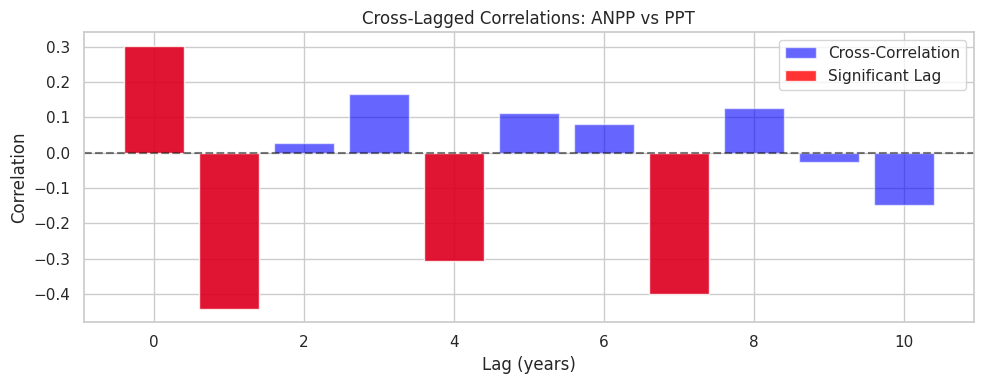

ANPP Results:
Dominant cycle detected at 3.0-year period. No significant autocorrelation detected (lags 1–10). Significant cross-lagged effects (ANPP vs. PPT) at lags: [0, 1, 4, 7].
Starting analysis for PPT with predictor None


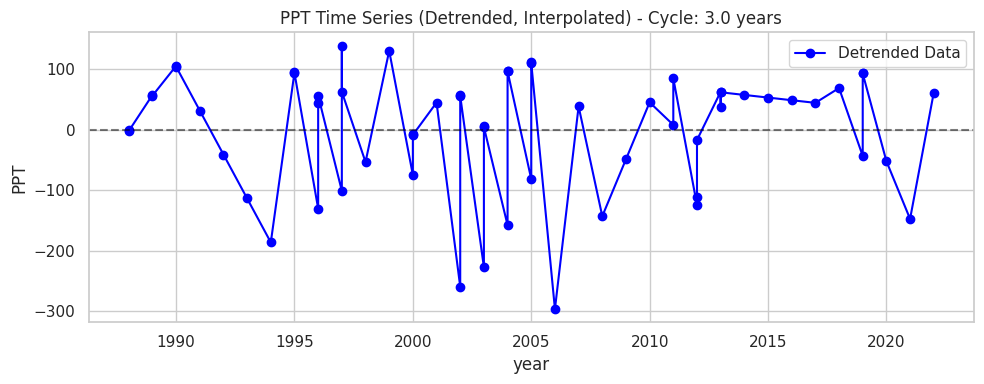

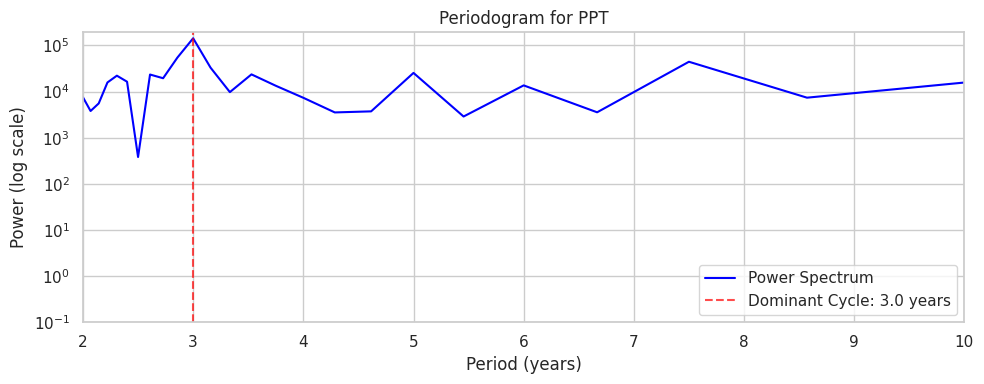

PPT Results:
Dominant cycle detected at 3.0-year period. No significant autocorrelation detected (lags 1–10).


In [117]:
anpp_result = run_time_series_analysis(croplands_clusters[0], 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(croplands_clusters[0], 'PPT', None, plot=True)

In [118]:
top_models_croplands_cluster_0 = run_and_save_models(
    df=croplands_clusters[0],
    analysis_name='Croplands_cluster_0',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise', 'spline'],
    window_size=range(1, 11),
    lags=[None, [1], [2], [3], [4], [7]],
    cycle_period=3,
    show_plot=False,
    show_aic_bic=False
)

quadratic No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
spline No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).


Predictors in plot_model: ['PPT', 'segment']


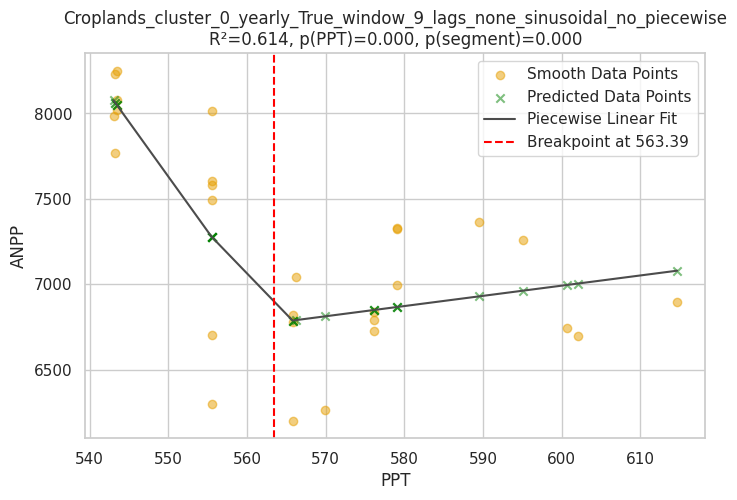

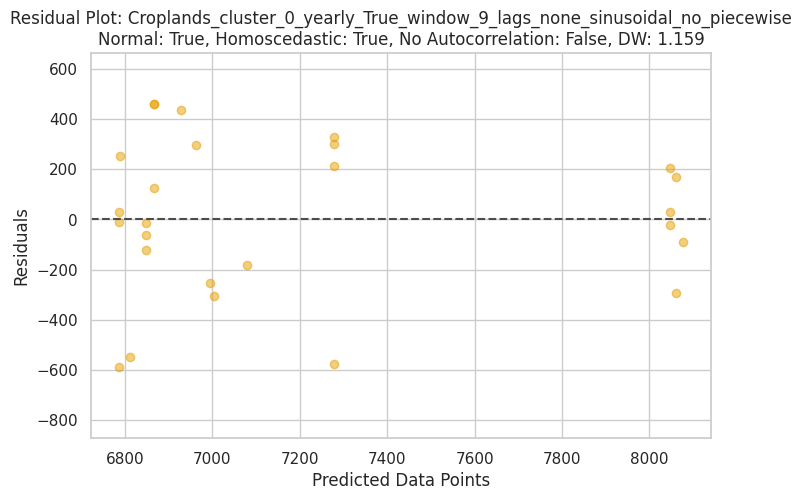

In [119]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=croplands_clusters[0],
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=True,
    window_size=9,
    analysis_name='Croplands_cluster_0_yearly_True_window_9_lags_none_sinusoidal_no_piecewise',
    plot_name='Croplands',
    show_plot=True,
    lags=None,
    use_sinusoidal=False,
    cycle_period=0,
    is_run_quadratic=False,
    is_piecewise=True,
    is_spline=False,
)

Starting analysis for ANPP with predictor PPT


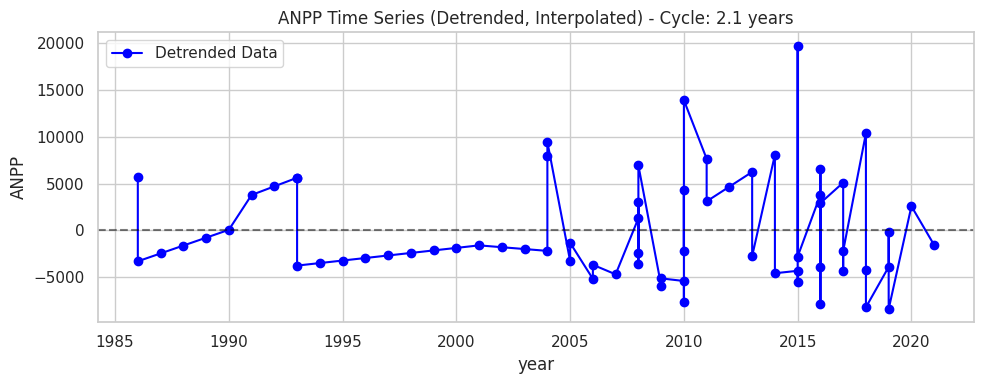

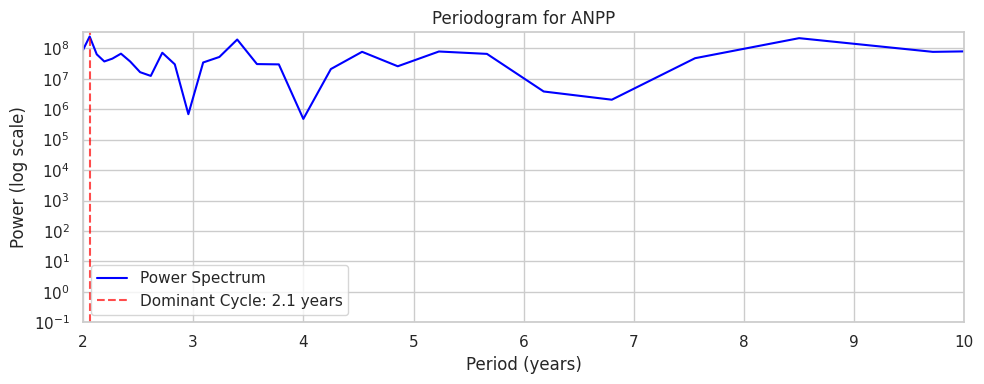

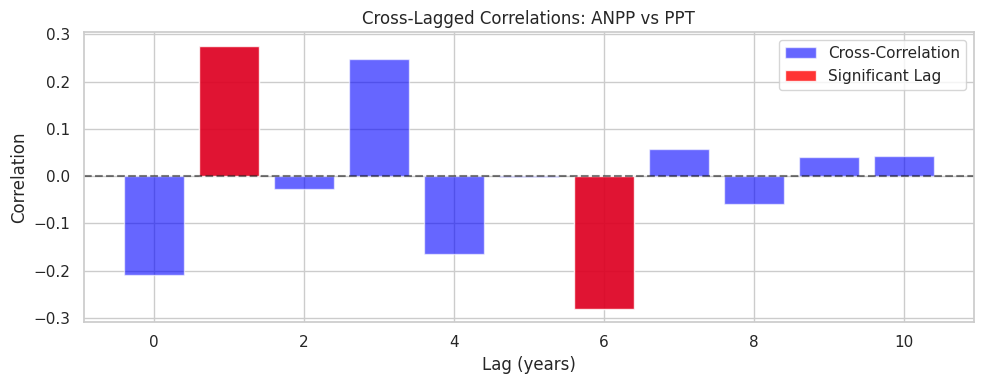

ANPP Results:
Dominant cycle detected at 2.1-year period. No significant autocorrelation detected (lags 1–10). Significant cross-lagged effects (ANPP vs. PPT) at lags: [1, 6].
Starting analysis for PPT with predictor None


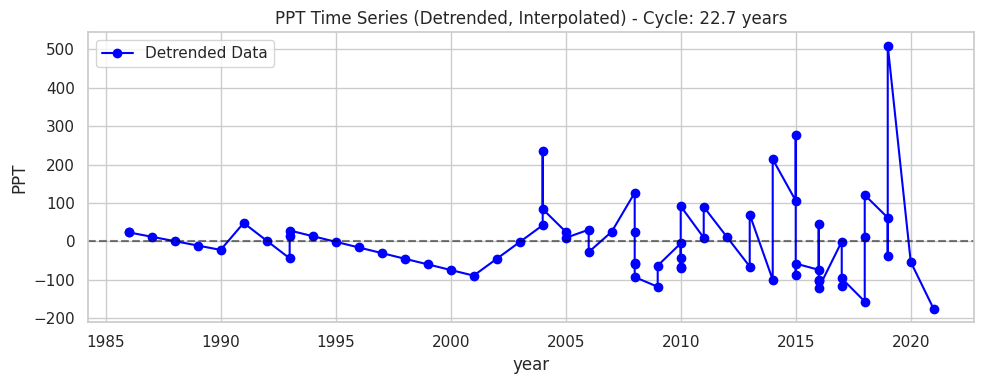

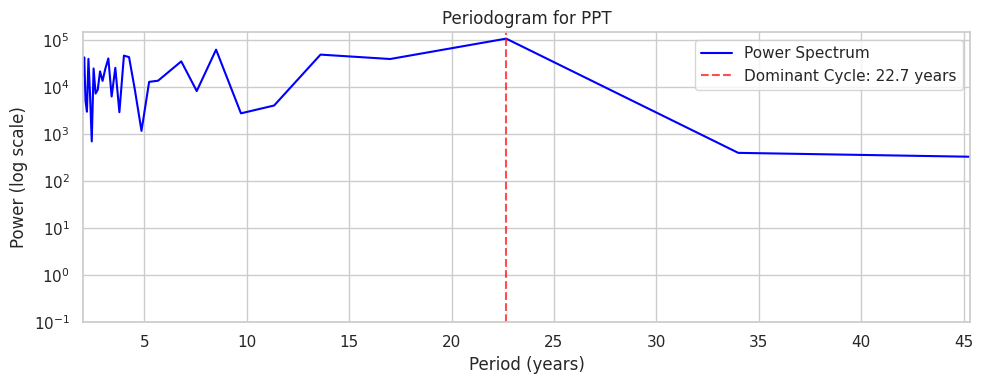

PPT Results:
Dominant cycle detected at 22.7-year period. No significant autocorrelation detected (lags 1–10).


In [120]:
anpp_result = run_time_series_analysis(croplands_clusters[1], 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(croplands_clusters[1], 'PPT', None, plot=True)

In [121]:
top_models_croplands_cluster_1 = run_and_save_models(
    df=croplands_clusters[1],
    analysis_name='Croplands_cluster_1',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise', 'spline'],
    window_size=range(1, 11),
    lags=[None, [1], [2], [6]],
    cycle_period=22,
    show_plot=False,
    show_aic_bic=False
)

Skipping Croplands_cluster_1_yearly_True_window_9_lags_6_sinusoidal_no_linear: Window size 9 too large for 16 rows.
Skipping Croplands_cluster_1_yearly_True_window_9_lags_6_sinusoidal_yes_linear: Window size 9 too large for 16 rows.
Skipping Croplands_cluster_1_yearly_True_window_10_lags_6_sinusoidal_no_linear: Window size 10 too large for 16 rows.
Skipping Croplands_cluster_1_yearly_True_window_10_lags_6_sinusoidal_yes_linear: Window size 10 too large for 16 rows.
linear No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
Skipping Croplands_cluster_1_yearly_True_window_9_lags_6_sinusoidal_no_quadratic: Window size 9 too large for 16 rows.
Skipping Croplands_cluster_1_yearly_True_window_9_lags_6_sinusoidal_yes_quadratic: Window size 9 too large for 16 rows.
Skipping Croplands_cluster_1_yearly_True_window_10_lags_6_sinusoidal_no_quadratic: Window size 10 too large for 16 rows.
Skipping Croplands_cluster_1_yearly_True_window

Starting analysis for ANPP with predictor PPT


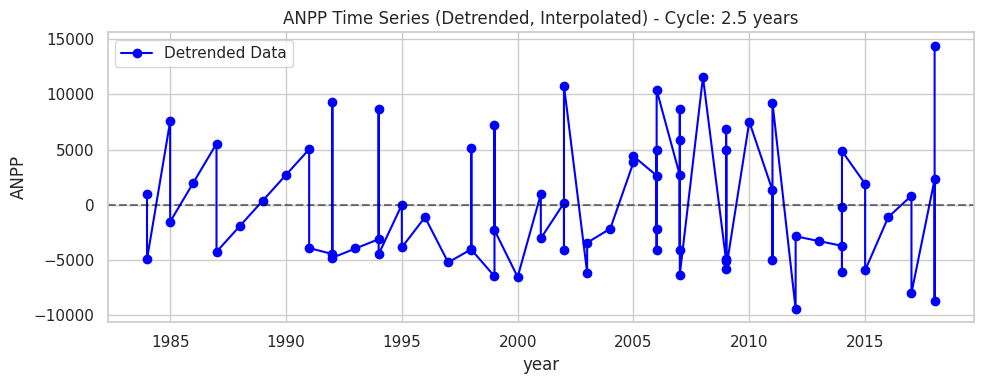

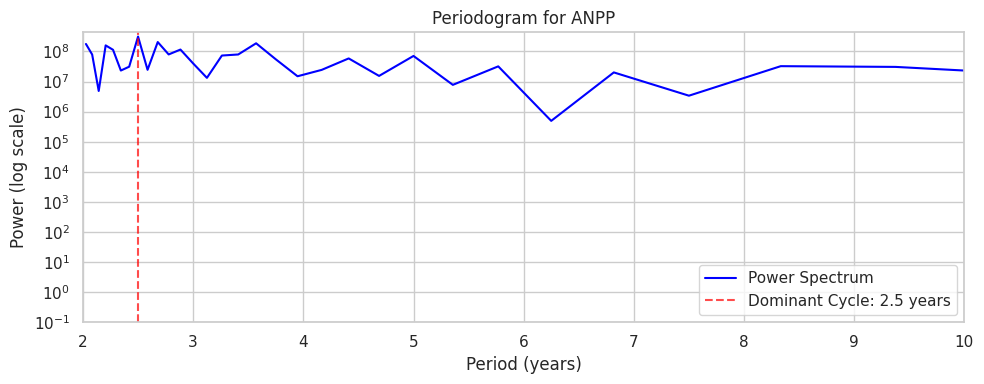

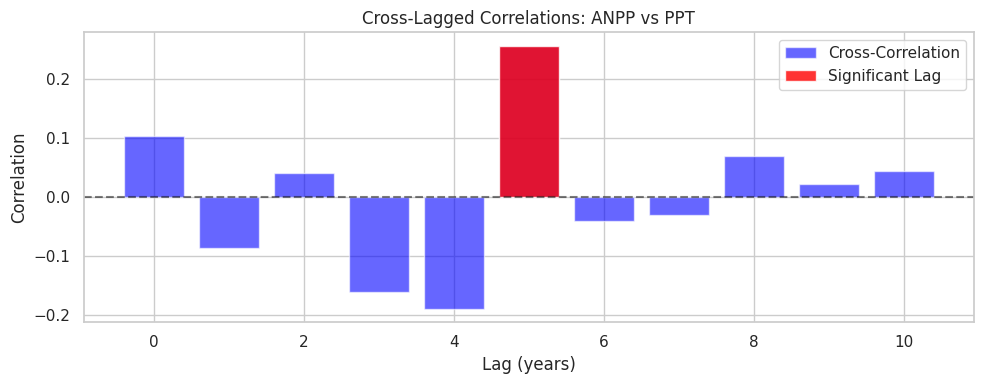

ANPP Results:
Dominant cycle detected at 2.5-year period. No significant autocorrelation detected (lags 1–10). Significant cross-lagged effects (ANPP vs. PPT) at lags: [5].
Starting analysis for PPT with predictor None


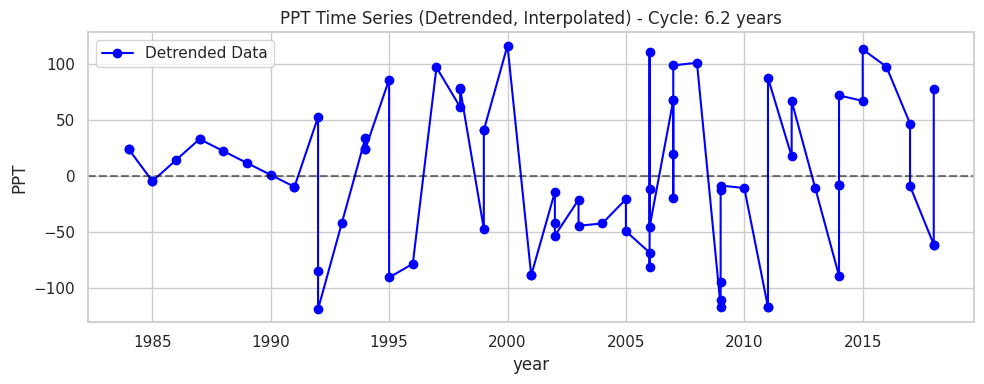

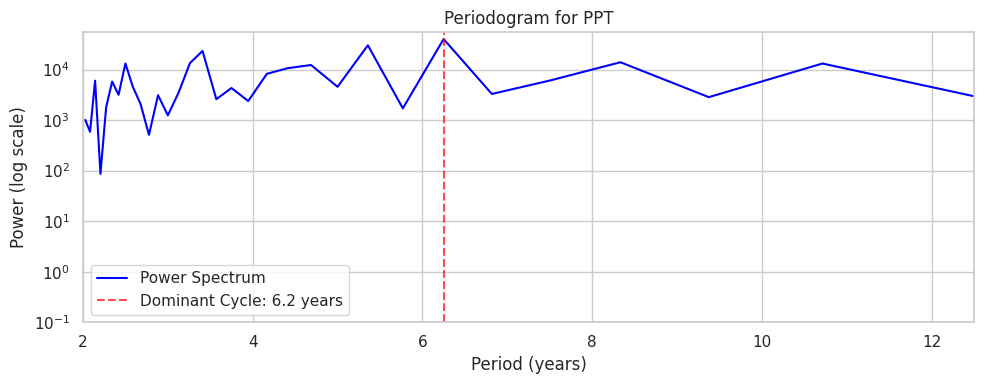

PPT Results:
Dominant cycle detected at 6.2-year period. No significant autocorrelation detected (lags 1–10).


In [122]:
anpp_result = run_time_series_analysis(croplands_clusters[2], 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(croplands_clusters[2], 'PPT', None, plot=True)

In [123]:
top_models_croplands_cluster_2 = run_and_save_models(
    df=croplands_clusters[2],
    analysis_name='Croplands_cluster_2',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise', 'spline'],
    window_size=range(1, 11),
    lags=[None, [1], [5]],
    cycle_period=6,
    show_plot=False,
    show_aic_bic=False
)

linear No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
quadratic No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
spline No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).


# **Site-Based Analysis Approach**

In [124]:
print("Unique values in 'site.code':")
print(df['site.code'].value_counts())

Unique values in 'site.code':
site.code
PRHPA     90
CPER      37
UCB       36
KBS       32
TG        26
NP        18
UMRB      14
JER       13
LCB       12
NH         9
GB_los     8
GB_wbs     8
GB_mbs     8
CAF        6
SP         6
ECB        5
ABS-UF     5
Name: count, dtype: int64


## **PRHPA**


IQR Method for ANPP:
Q1: 5118.28, Q3: 13619.16, IQR: 8500.88
Lower Bound: -7633.04, Upper Bound: 26370.48
Number of IQR outliers: 0
Range of IQR outliers: None


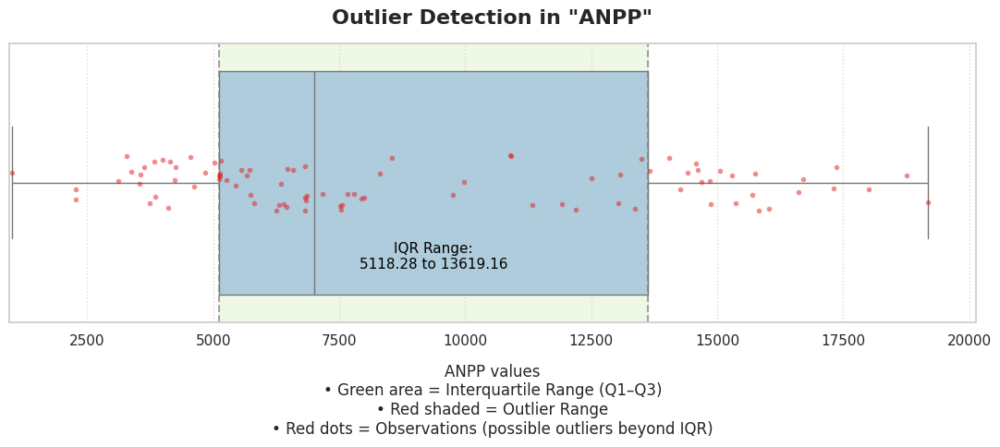

Unique values in 'Crop':
Crop
Maize          36
Soybean        36
Switchgrass    18
Name: count, dtype: int64


In [125]:
df_unfiltered_prhpa = df.copy()
df_prhpa = filter_df(df_unfiltered_prhpa, 'site.code', 'PRHPA')

df_prhpa_transformed, df_prhpa_transformed_info = transform_dataframe(df_prhpa, ['ANPP', 'WUE'])

df_prhpa_outliers = detect_outliers(df_prhpa, 'ANPP')
df_prhpa_processed = df_prhpa_outliers['cleaned_df']

df_prhpa_outliers = df_prhpa_outliers['iqr_outliers']

len(df_prhpa_outliers)


print("Unique values in 'Crop':")
print(df_prhpa['Crop'].value_counts())

Starting analysis for ANPP with predictor PPT


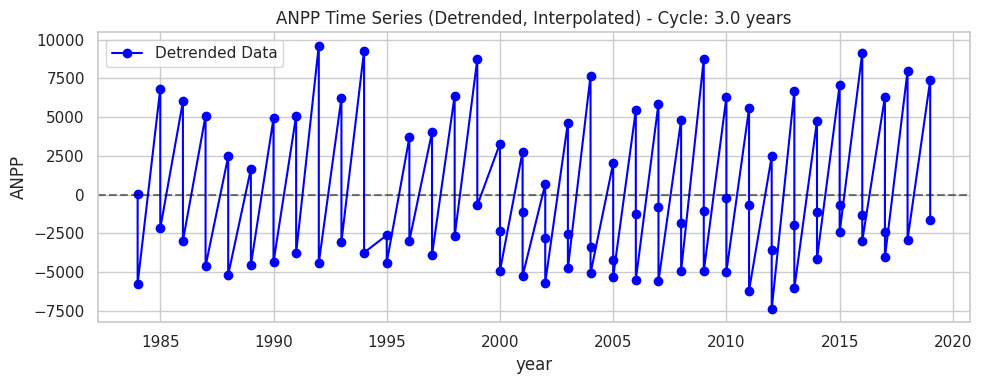

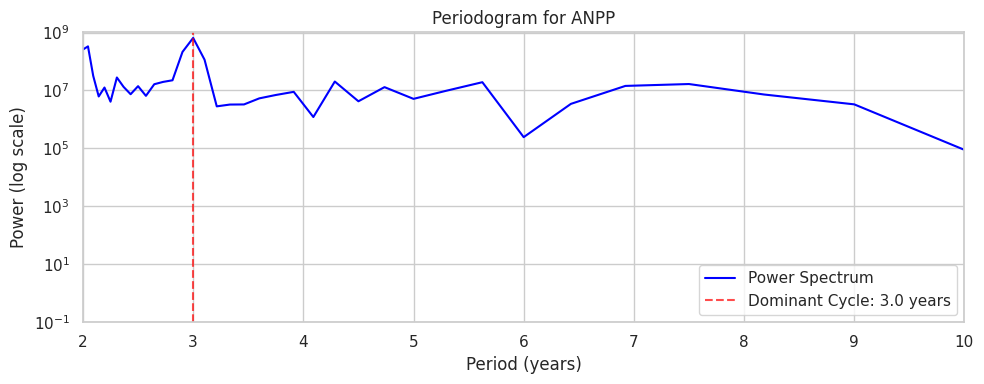

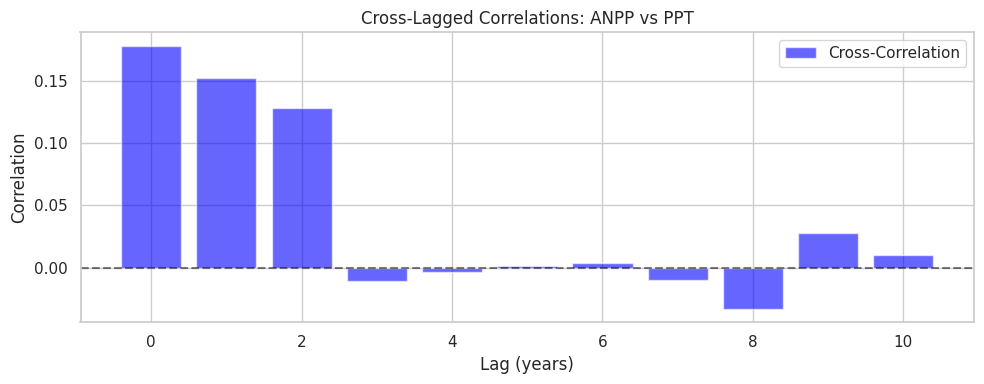

ANPP Results:
Dominant cycle detected at 3.0-year period. No significant autocorrelation detected (lags 1–10). No significant cross-lagged effects (ANPP vs. PPT) detected (lags 0–10).
Starting analysis for PPT with predictor None


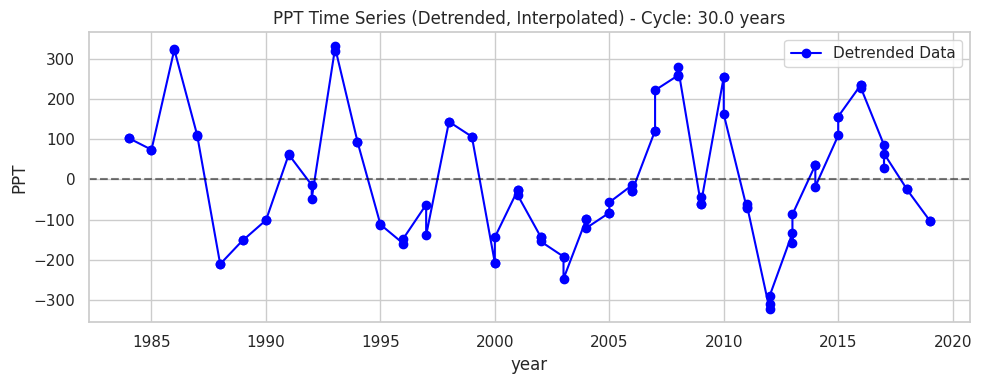

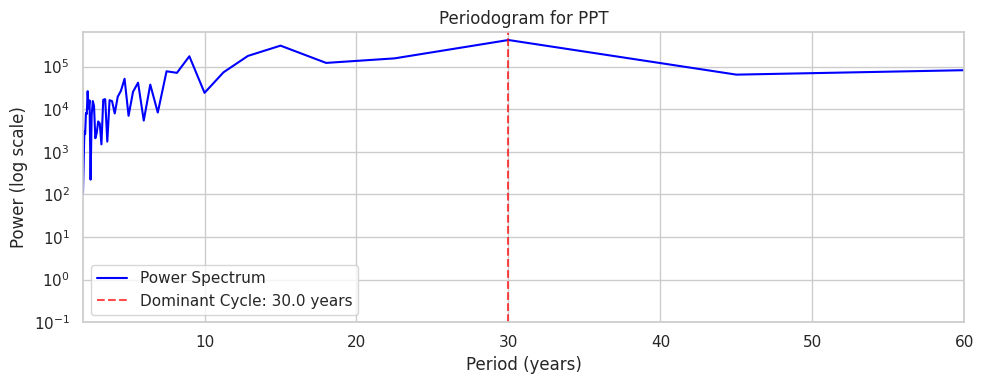

PPT Results:
Dominant cycle detected at 30.0-year period. No significant autocorrelation detected (lags 1–10).


In [126]:
anpp_result = run_time_series_analysis(df_prhpa_processed, 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(df_prhpa_processed, 'PPT', None, plot=True)

In [127]:
pearson_corr, spearman_corr = compute_correlation(df_prhpa, 'ANPP', 'PPT', 'PRHPA')

Correlation between ANPP and PPT - PRHPA (Pearson): 0.16338517827593005
Correlation between ANPP and PPT - PRHPA (Spearman): 0.20309374388826423


In [128]:
top_models_prhpa = run_and_save_models(
    df=df_prhpa,
    analysis_name='PRHPA',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise', 'spline'],
    window_size=range(1, 8),
    lags=[None],
    cycle_period=30,
    show_plot=False,
    show_aic_bic=False
)

Predictors in plot_model: ['PPT', 'sin_cycle', 'cos_cycle']


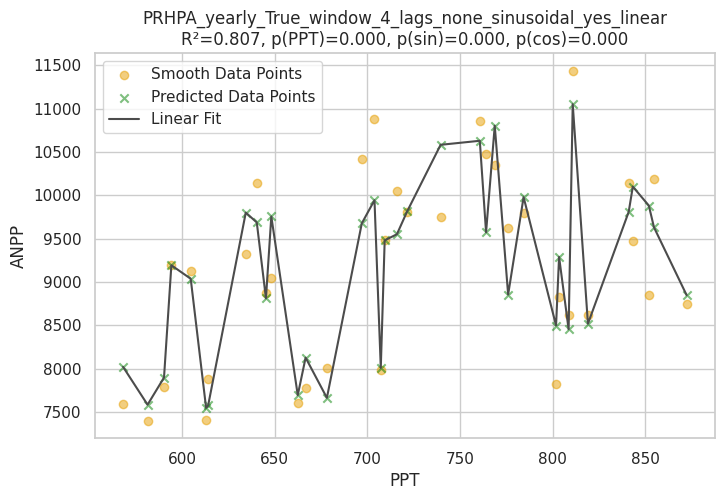

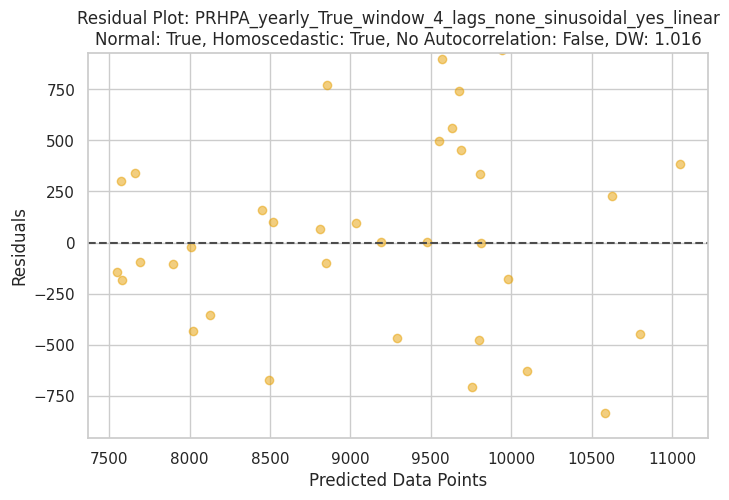

Min values:
 year         1984.000000
PPT           568.247000
ANPP         7397.742847
sin_cycle      -0.994522
cos_cycle      -1.000000
dtype: float64

Max values:
 year          2019.000000
PPT            872.386417
ANPP         11436.590750
sin_cycle        0.994522
cos_cycle        1.000000
dtype: float64
Min values:
 year                1984
site.code          PRHPA
type           Croplands
Crop               Maize
Cereal            Cereal
MAP           702.199915
ANPP         1000.626067
PPT              409.957
WUE             2.257572
dtype: object

Max values:
 year                2019
site.code          PRHPA
type             Pasture
Crop         Switchgrass
Cereal           Pasture
MAP           715.094416
ANPP             19176.3
PPT          1031.934004
WUE            28.058088
dtype: object


In [129]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=df_prhpa,
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=True,
    window_size=4,
    analysis_name='PRHPA_yearly_True_window_4_lags_none_sinusoidal_yes_linear',
    plot_name='PRHPA',
    show_plot=True,
    lags=None,
    use_sinusoidal=True,
    cycle_period=30,
    is_run_quadratic=False,
    is_piecewise=False,
    is_spline=False,
)

find_min_max(data)
find_min_max(df_prhpa)

Predictors in plot_model: ['PPT', 'sin_cycle', 'cos_cycle', 'quadratic']


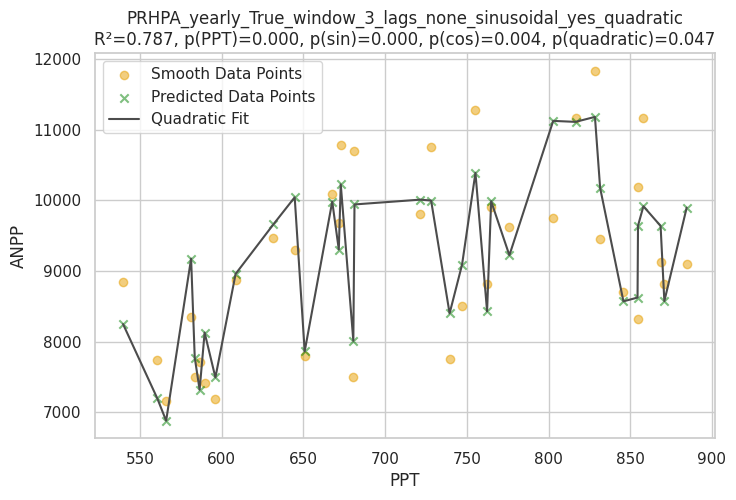

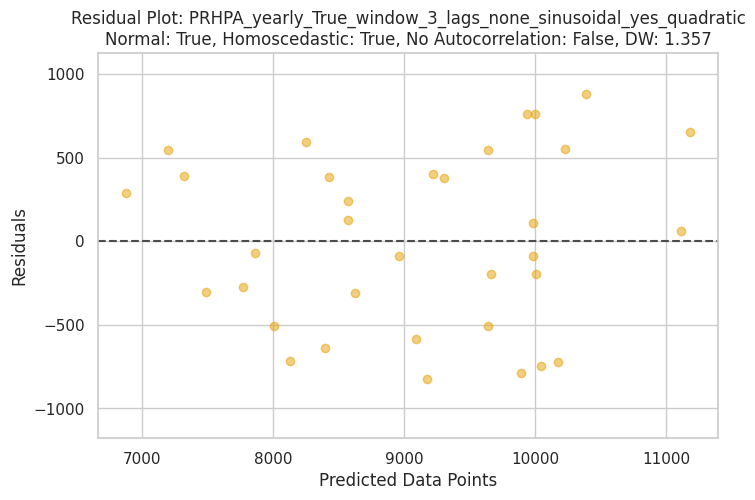

In [130]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=df_prhpa,
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=True,
    window_size=3,
    analysis_name='PRHPA_yearly_True_window_3_lags_none_sinusoidal_yes_quadratic',
    plot_name='PRHPA',
    show_plot=True,
    lags=None,
    use_sinusoidal=True,
    cycle_period=30,
    is_run_quadratic=True,
    is_piecewise=False,
    is_spline=False,
)


Predictors in plot_model: ['PPT']


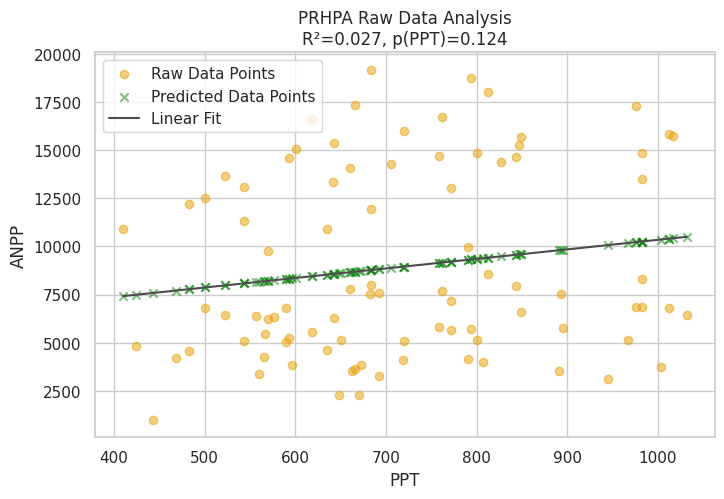

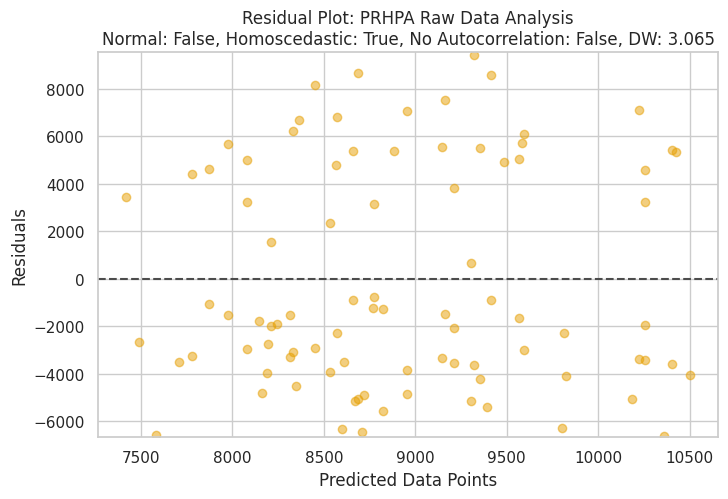

In [131]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=df_prhpa,
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=False,
    window_size=None,
    analysis_name='PRHPA Raw Data Analysis',
    plot_name='PRHPA',
    show_plot=True,
    lags=None,
    use_sinusoidal=False,
    cycle_period=0,
    is_run_quadratic=False,
    is_piecewise=False,
    is_spline=False,
)


Predictors in plot_model: ['PPT', 'sin_cycle', 'cos_cycle', 'spline_0', 'spline_1', 'spline_2']


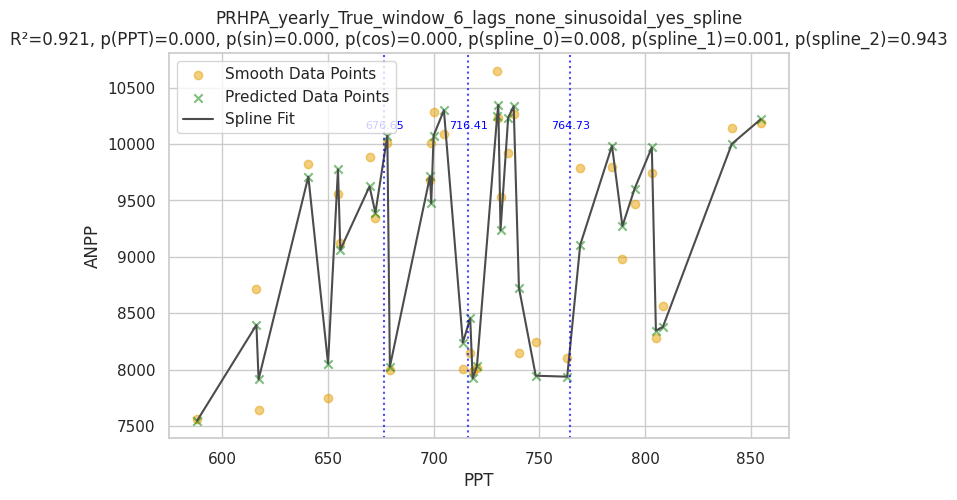

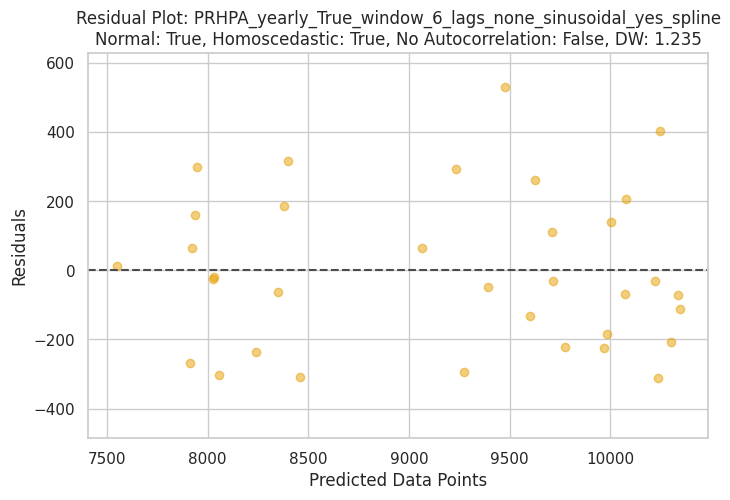

In [132]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=df_prhpa,
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=True,
    window_size=6,
    analysis_name='PRHPA_yearly_True_window_6_lags_none_sinusoidal_yes_spline',
    plot_name='PRHPA',
    show_plot=True,
    lags=None,
    use_sinusoidal=True,
    cycle_period=30,
    is_run_quadratic=False,
    is_piecewise=False,
    is_spline=True,
)


### **PRHPA - Maize**


IQR Method for ANPP:
Q1: 12901.72, Q3: 15775.74, IQR: 2874.01
Lower Bound: 8590.71, Upper Bound: 20086.75
Number of IQR outliers: 1
Range of IQR outliers: (6812.63, 6812.63)


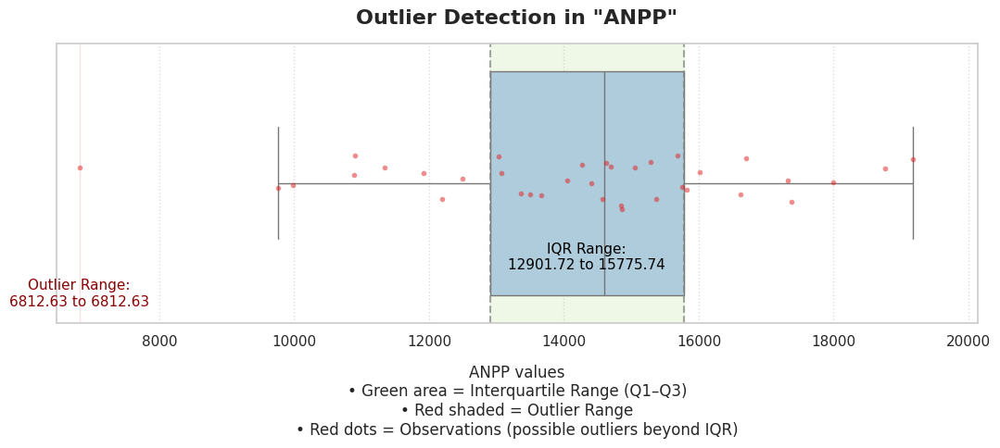

,year,site.code,type,Crop,Cereal,MAP,ANPP,PPT,WUE
43,1995,PRHPA,Croplands,Maize,Cereal,702.199915,6812.63,590.07,11.545461


In [133]:
df_prhpa_maize = filter_df(df_prhpa, 'Crop', 'Maize')

df_prhpa_maize_transformed, df_prhpa_maize_transformed_info = transform_dataframe(df_prhpa_maize, ['ANPP', 'WUE'])

df_prhpa_maize_outliers = detect_outliers(df_prhpa_maize, 'ANPP')
df_prhpa_maize_processed = df_prhpa_maize_outliers['cleaned_df']

df_prhpa_maize_outliers = df_prhpa_maize_outliers['iqr_outliers']

len(df_prhpa_maize_outliers)

df_prhpa_maize_outliers.head(2)


Starting analysis for ANPP with predictor PPT


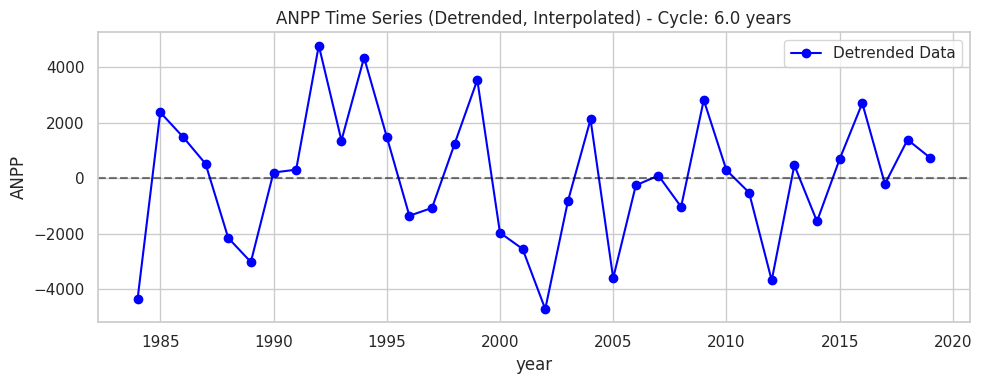

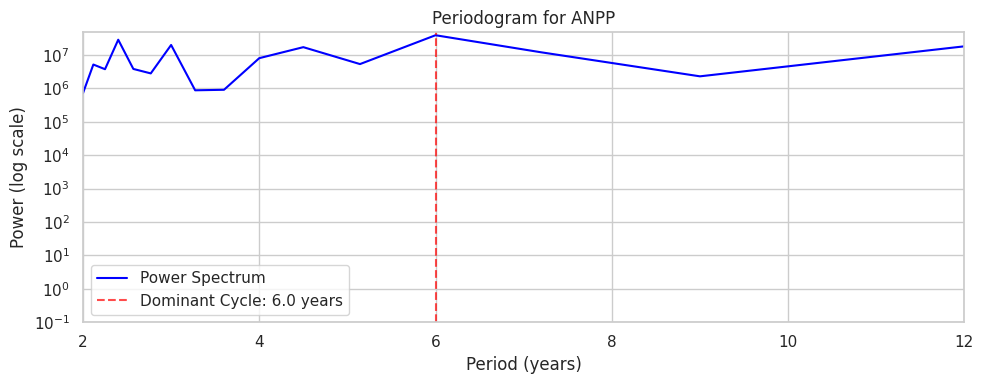

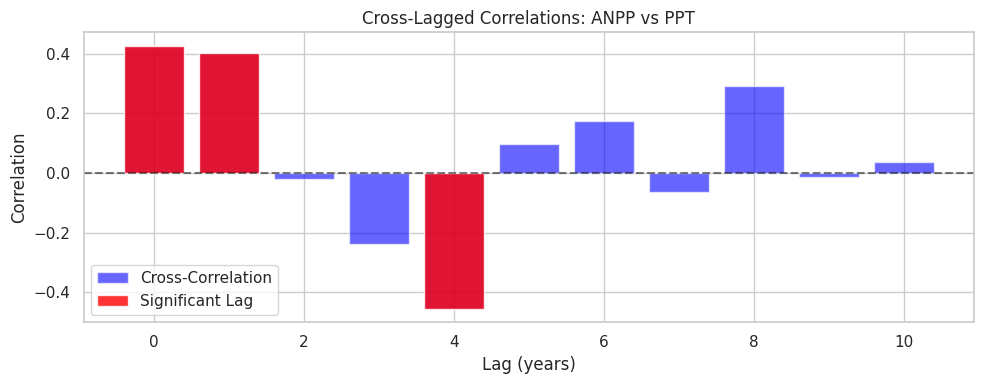

ANPP Results:
Dominant cycle detected at 6.0-year period. No significant autocorrelation detected (lags 1–10). Significant cross-lagged effects (ANPP vs. PPT) at lags: [0, 1, 4].
Starting analysis for PPT with predictor None


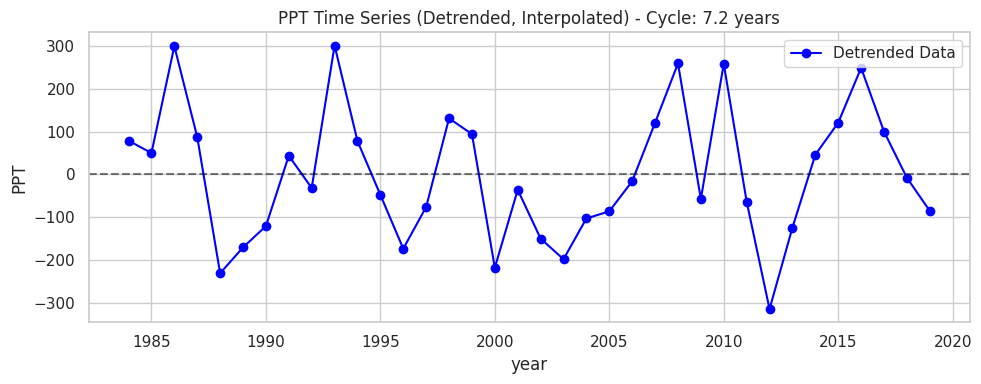

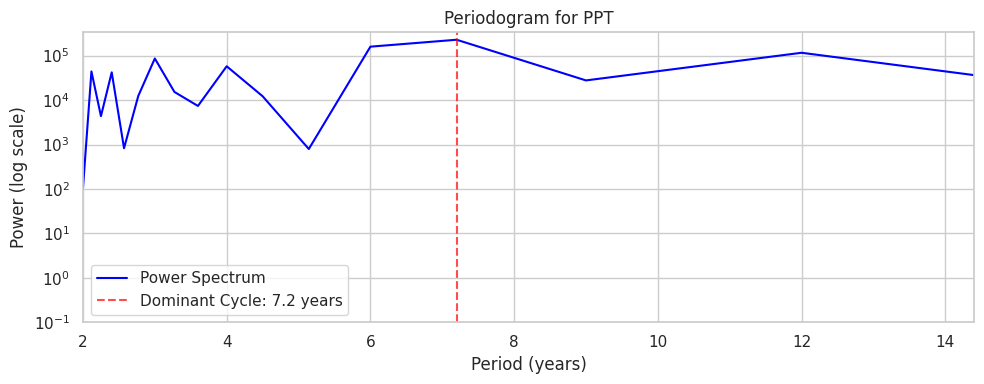

PPT Results:
Dominant cycle detected at 7.2-year period. No significant autocorrelation detected (lags 1–10).


In [134]:
anpp_result = run_time_series_analysis(df_prhpa_maize_processed, 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(df_prhpa_maize_processed, 'PPT', None, plot=True)

In [135]:
pearson_corr, spearman_corr = compute_correlation(df_prhpa_maize, 'ANPP', 'PPT', 'PRHPA - Maize')

Correlation between ANPP and PPT - PRHPA - Maize (Pearson): 0.4460931782432395
Correlation between ANPP and PPT - PRHPA - Maize (Spearman): 0.5158301158301158


In [136]:
top_models_prhpa_maize = run_and_save_models(
    df=df_prhpa_maize,
    analysis_name='PRHPA-Maize',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise', 'spline'],
    window_size=range(1, 11),
    lags=[None, [1], [2], [3], [4]],
    cycle_period=7,
    show_plot=False,
    show_aic_bic=False
)

quadratic No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
piecewise No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
spline No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).


Predictors in plot_model: ['PPT']


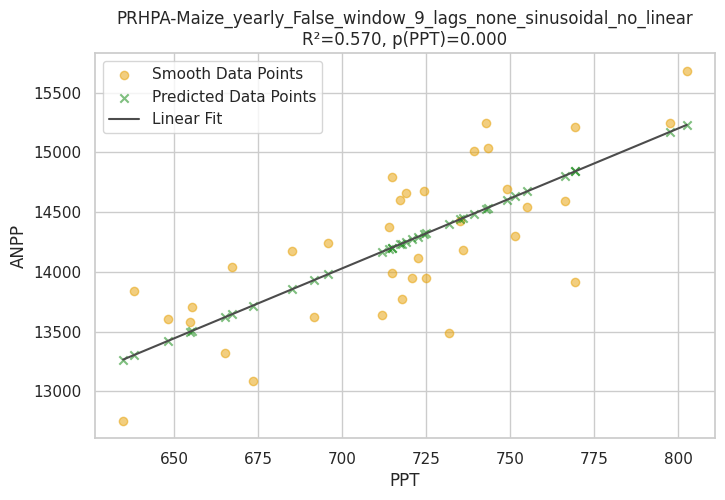

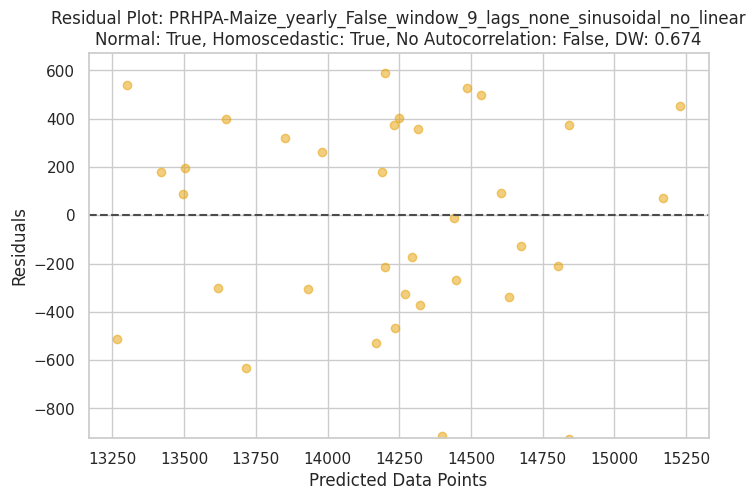

Min values:
 year     1984.000000
PPT       634.833667
ANPP    12753.068815
dtype: float64

Max values:
 year     2019.000000
PPT       802.483240
ANPP    15682.396434
dtype: float64
Min values:
 year               1984
site.code         PRHPA
type          Croplands
Crop              Maize
Cereal           Cereal
MAP          702.199915
ANPP            6812.63
PPT             409.957
WUE           11.545461
dtype: object

Max values:
 year                2019
site.code          PRHPA
type           Croplands
Crop               Maize
Cereal            Cereal
MAP           708.647165
ANPP             19176.3
PPT          1016.948004
WUE            28.058088
dtype: object


In [137]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=df_prhpa_maize,
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=True,
    window_size=9,
    analysis_name='PRHPA-Maize_yearly_False_window_9_lags_none_sinusoidal_no_linear',
    plot_name='PRHPA-Maize',
    show_plot=True,
    lags=None,
    use_sinusoidal=False,
    cycle_period=0,
    is_run_quadratic=False,
    is_piecewise=False,
    is_spline=False,
)

find_min_max(data)
find_min_max(df_prhpa_maize)

### **PRHPA - Soybean**


IQR Method for ANPP:
Q1: 5236.82, Q3: 7253.12, IQR: 2016.30
Lower Bound: 2212.37, Upper Bound: 10277.57
Number of IQR outliers: 0
Range of IQR outliers: None


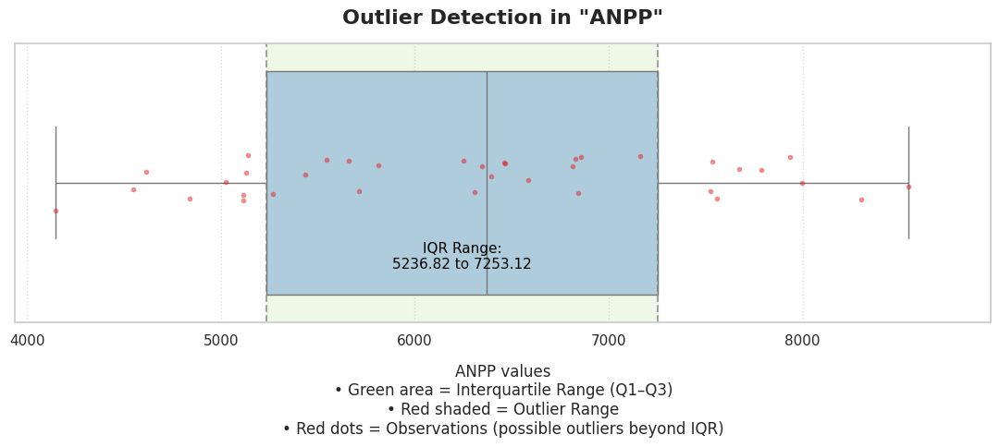

0

In [138]:
df_prhpa_soybean = filter_df(df_prhpa, 'Crop', 'Soybean')

df_prhpa_soybean_transformed, df_prhpa_soybean_transformed_info = transform_dataframe(df_prhpa_soybean, ['ANPP', 'WUE'])

df_prhpa_soybean_outliers = detect_outliers(df_prhpa_soybean, 'ANPP')
df_prhpa_soybean_processed = df_prhpa_soybean_outliers['cleaned_df']

df_prhpa_soybean_outliers = df_prhpa_soybean_outliers['iqr_outliers']

len(df_prhpa_soybean_outliers)

Starting analysis for ANPP with predictor PPT


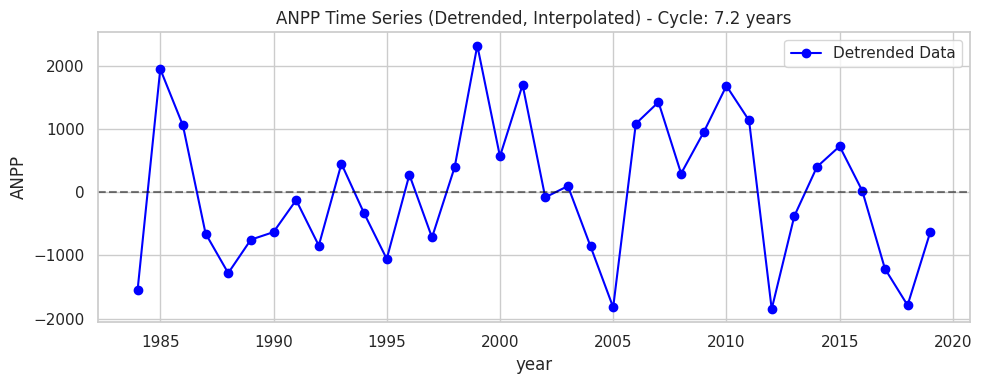

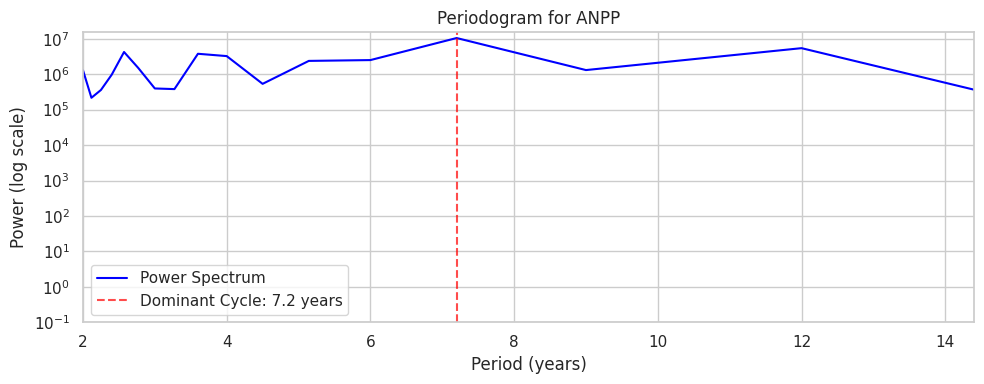

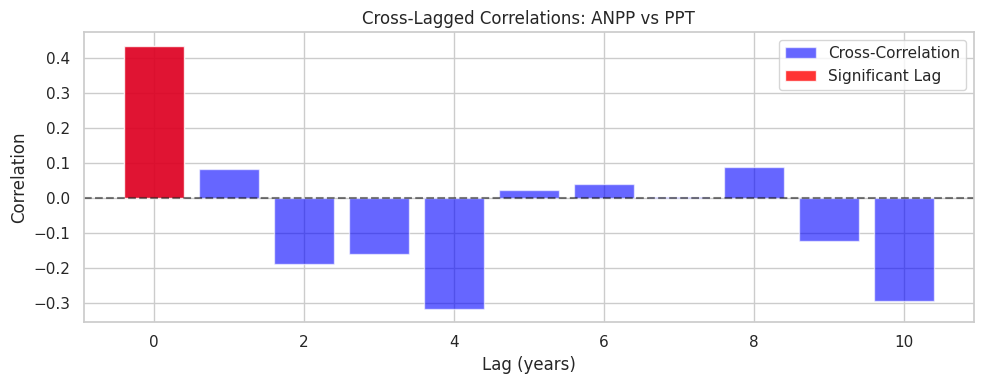

ANPP Results:
Dominant cycle detected at 7.2-year period. No significant autocorrelation detected (lags 1–10). Significant cross-lagged effects (ANPP vs. PPT) at lags: [0].
Starting analysis for PPT with predictor None


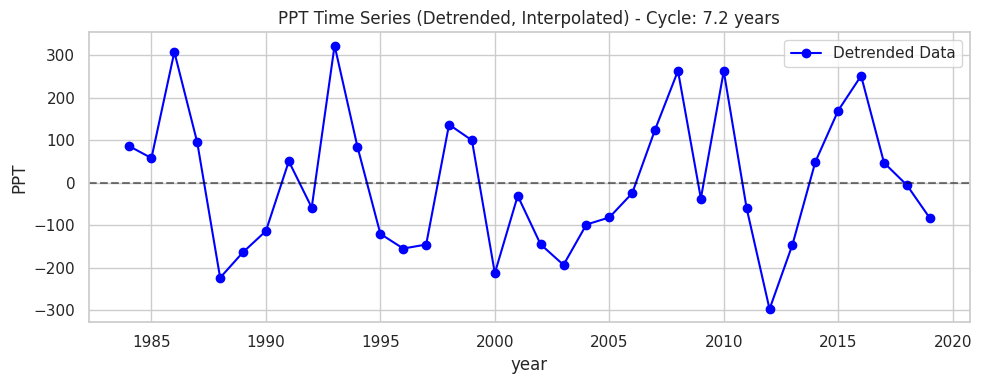

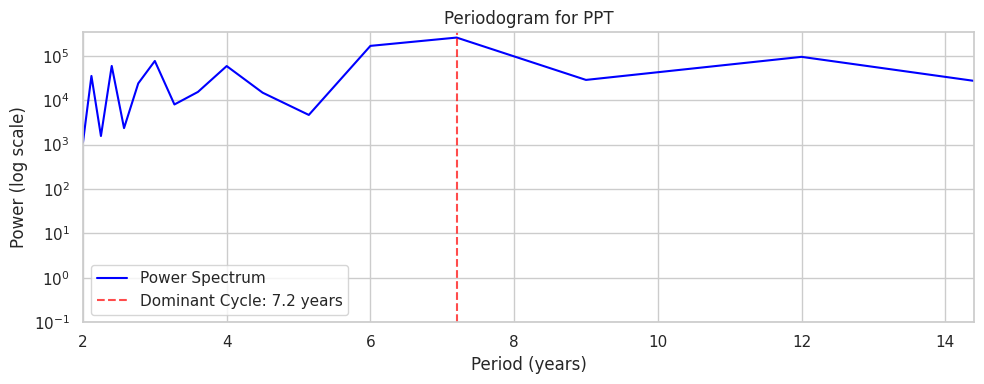

PPT Results:
Dominant cycle detected at 7.2-year period. No significant autocorrelation detected (lags 1–10).


In [139]:
anpp_result = run_time_series_analysis(df_prhpa_soybean_processed, 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(df_prhpa_soybean_processed, 'PPT', None, plot=True)

In [140]:
pearson_corr, spearman_corr = compute_correlation(df_prhpa_soybean, 'ANPP', 'PPT', 'PRHPA - Soybean')

Correlation between ANPP and PPT - PRHPA - Soybean (Pearson): 0.4266080811317197
Correlation between ANPP and PPT - PRHPA - Soybean (Spearman): 0.46563706563706564


In [141]:
top_models_prhpa_soybean = run_and_save_models(
    df=df_prhpa_soybean,
    analysis_name='PRHPA-Soybean',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise', 'spline'],
    window_size=range(1, 17),
    lags=[None, [1], [2], [3], [4]],
    cycle_period=8,
    show_plot=False,
    show_aic_bic=False
)

quadratic No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
piecewise No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
spline No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).


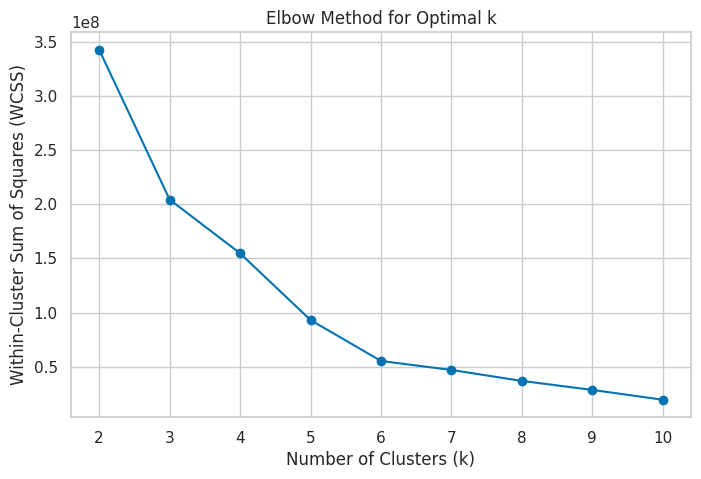

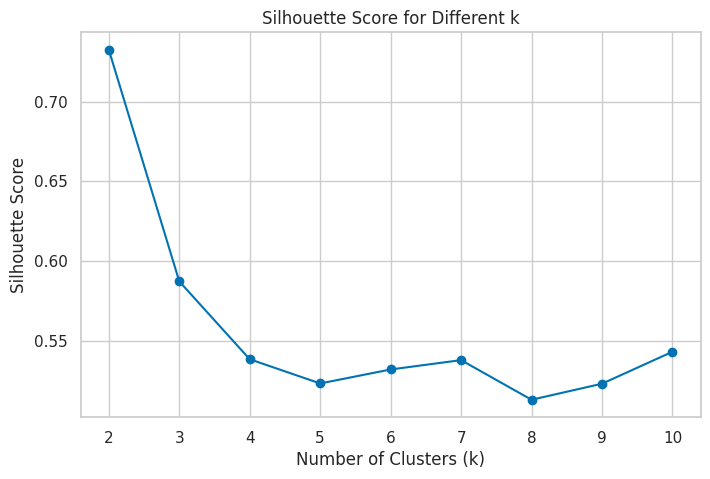

K-means Performance
Silhouette Score: 0.587


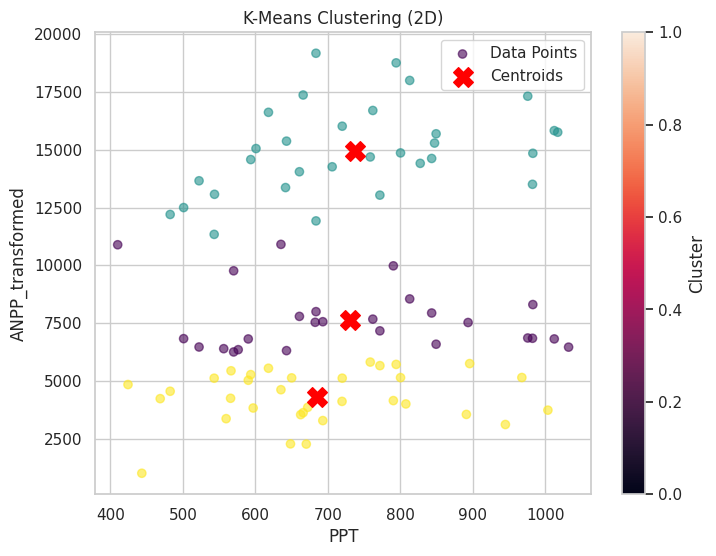


Cluster Summary (Mean Values):
                PPT          ANPP
Cluster                          
0        730.736547   7634.626109
1        736.845265  14963.484264
2        685.175545   4302.374839
Unique clusters - PRPHA: [0 2 1]

Cluster 0 DataFrame:
Number of observations: 26
Pearson Correlation between ANPP and PPT - PRPHA (cluster 0): -0.1885619495097589


Spearman Correlation between ANPP and PPT - PRPHA (cluster 0): 0.07625235194365007



Cluster 1 DataFrame:
Number of observations: 31
Pearson Correlation between ANPP and PPT - PRPHA (cluster 1): 0.3880597115215721


Spearman Correlation between ANPP and PPT - PRPHA (cluster 1): 0.4290322580645162



Cluster 2 DataFrame:
Number of observations: 33
Pearson Correlation between ANPP and PPT - PRPHA (cluster 2): 0.13401695199185362


Spearman Correlation between ANPP and PPT - PRPHA (cluster 2): 0.09258021390374332




In [142]:
columns_transformed = ['PPT', 'ANPP_transformed']
columns_untransformed = ['PPT', 'ANPP']
OPTIMAL_K = 3
K_RANGE = range(2, 11)

df_prpha_k_means, prhpa_clusters, prpha_cluster_summary = run_clustering_and_correlations(df_prhpa_transformed, 'PRPHA', \
                                                                columns_transformed, columns_untransformed, K_RANGE, OPTIMAL_K)

Starting analysis for ANPP with predictor PPT


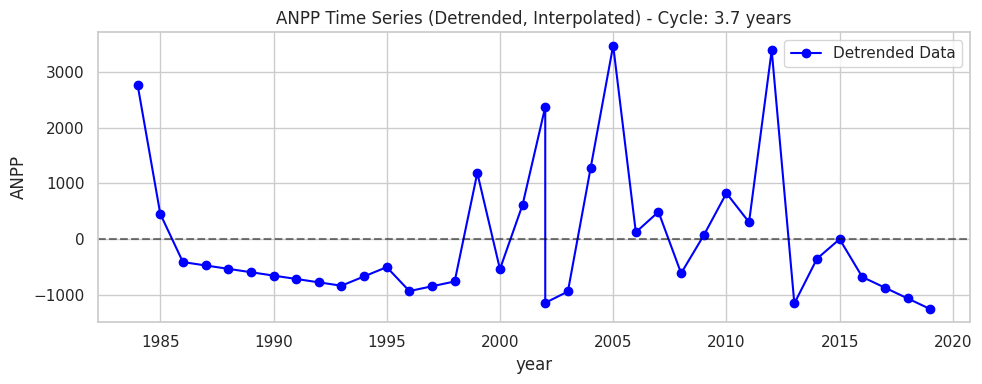

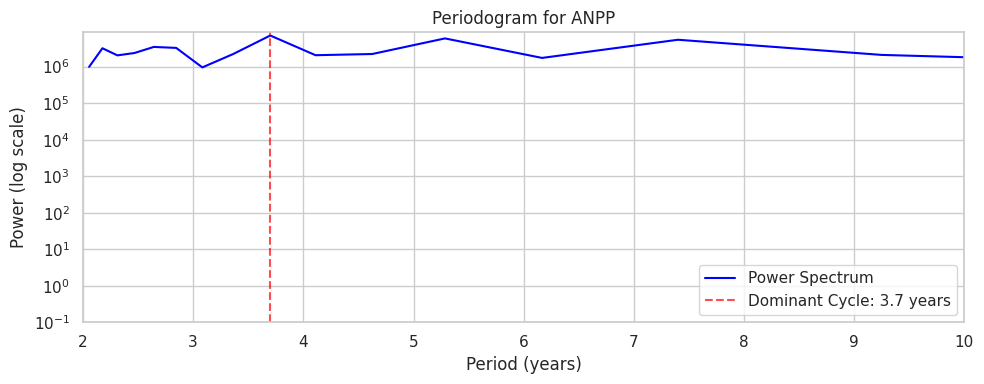

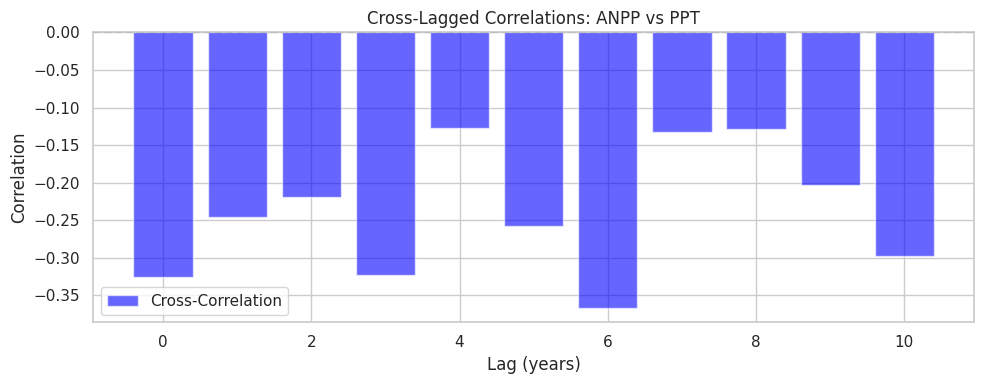

ANPP Results:
Dominant cycle detected at 3.7-year period. No significant autocorrelation detected (lags 1–10). No significant cross-lagged effects (ANPP vs. PPT) detected (lags 0–10).
Starting analysis for PPT with predictor None


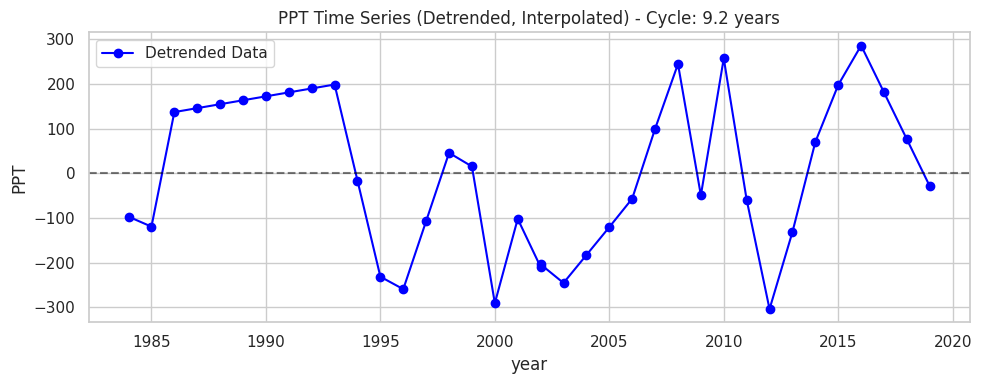

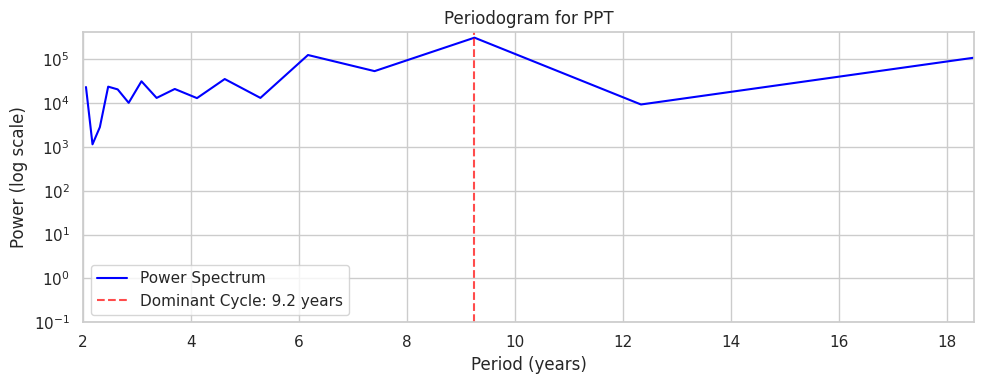

PPT Results:
Dominant cycle detected at 9.2-year period. No significant autocorrelation detected (lags 1–10).


In [143]:
anpp_result = run_time_series_analysis(prhpa_clusters[0], 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(prhpa_clusters[0], 'PPT', None, plot=True)

Starting analysis for ANPP with predictor PPT


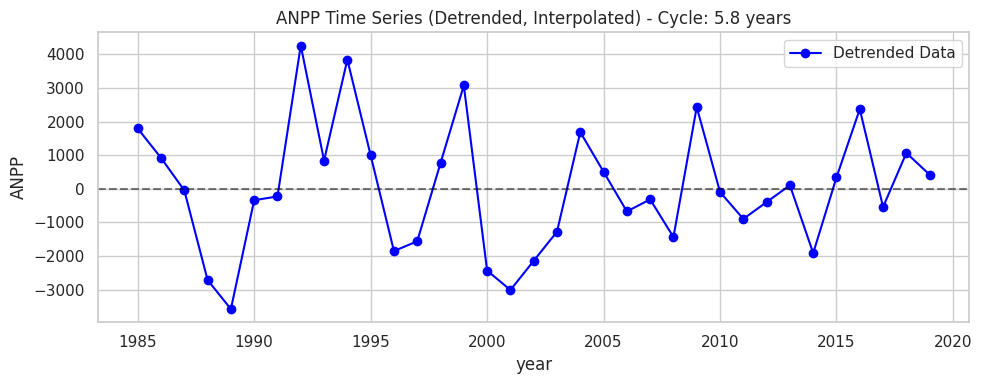

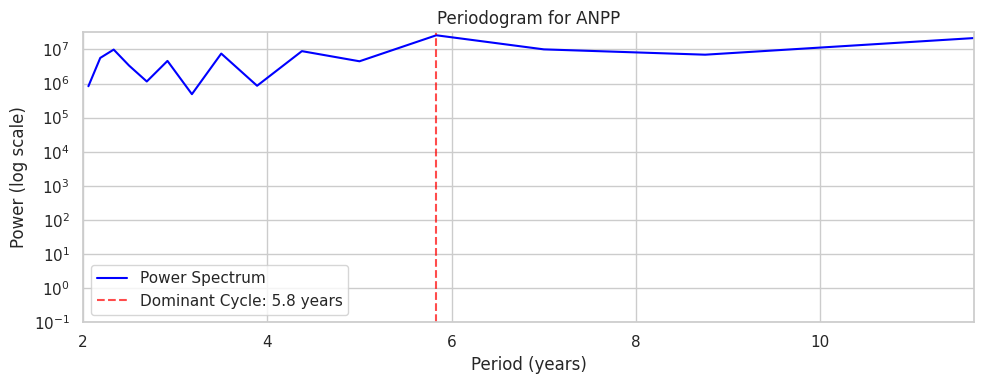

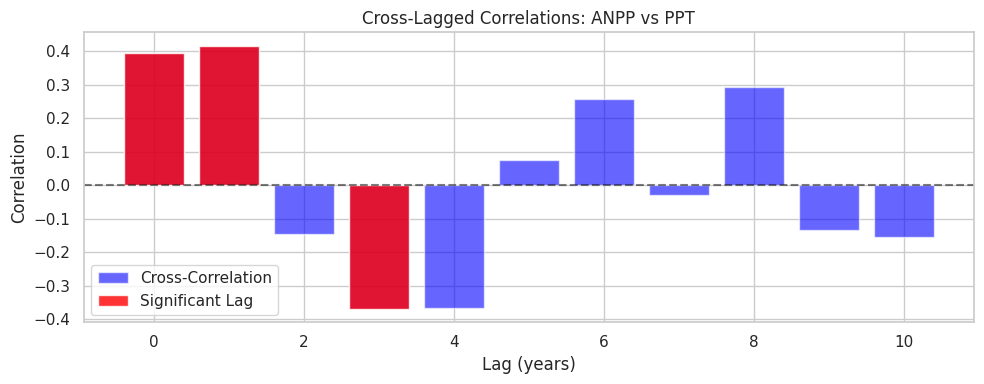

ANPP Results:
Dominant cycle detected at 5.8-year period. No significant autocorrelation detected (lags 1–10). Significant cross-lagged effects (ANPP vs. PPT) at lags: [0, 1, 3].
Starting analysis for PPT with predictor None


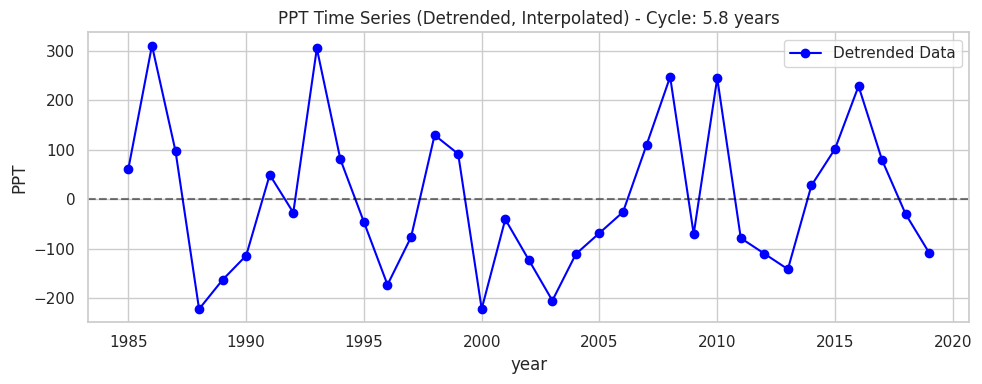

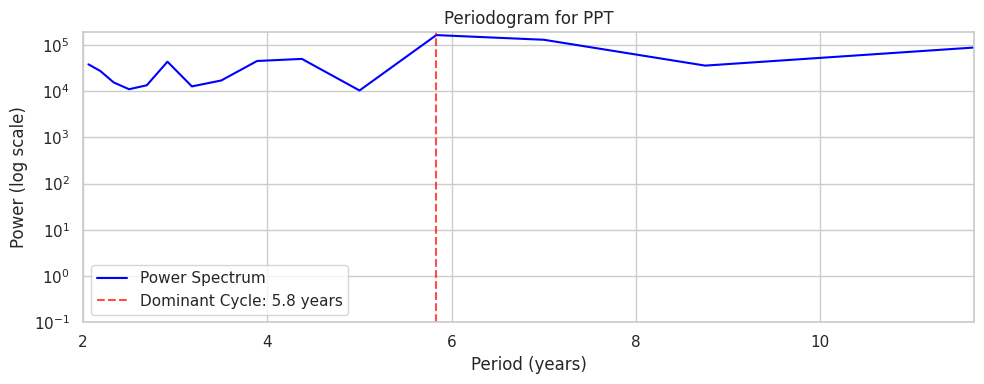

PPT Results:
Dominant cycle detected at 5.8-year period. No significant autocorrelation detected (lags 1–10).


In [144]:
anpp_result = run_time_series_analysis(prhpa_clusters[1], 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(prhpa_clusters[1], 'PPT', None, plot=True)

Starting analysis for ANPP with predictor PPT


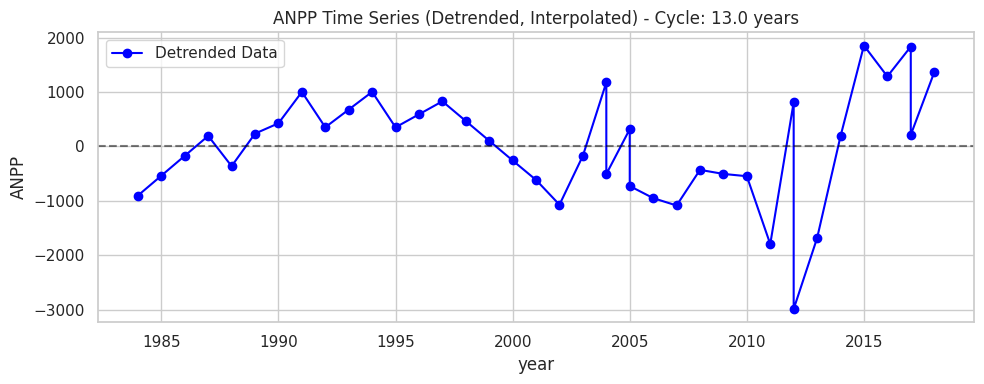

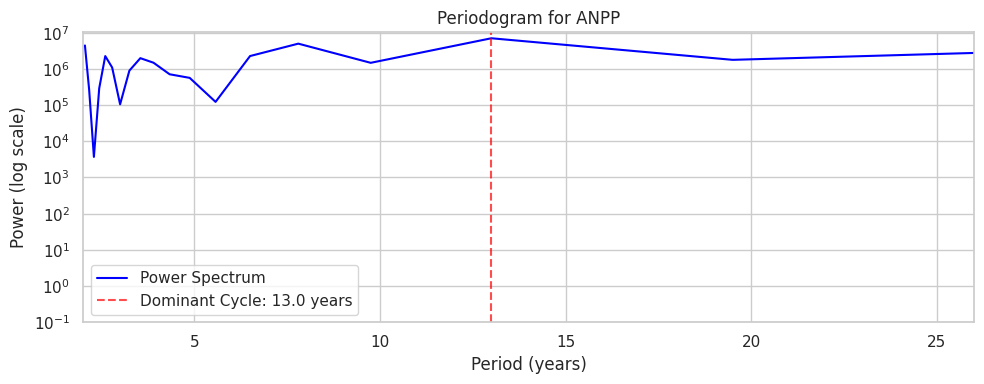

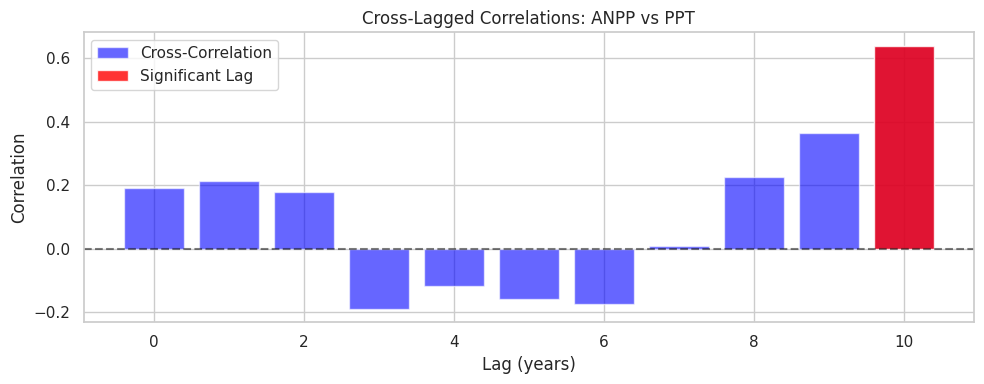

ANPP Results:
Dominant cycle detected at 13.0-year period. No significant autocorrelation detected (lags 1–10). Significant cross-lagged effects (ANPP vs. PPT) at lags: [10].
Starting analysis for PPT with predictor None


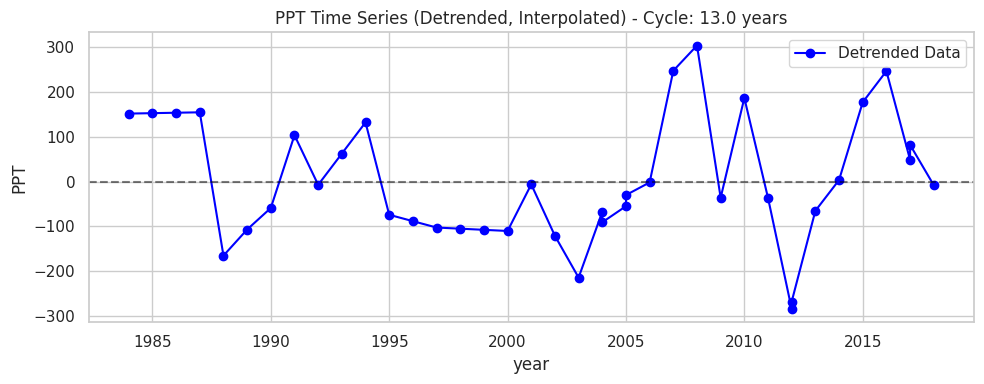

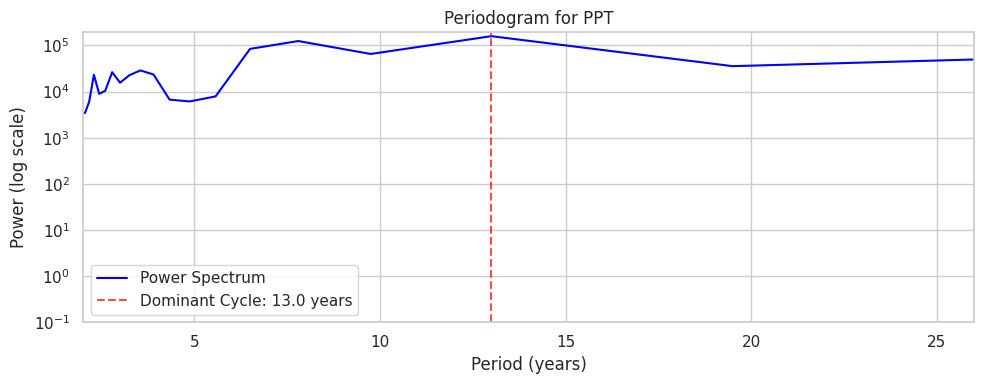

PPT Results:
Dominant cycle detected at 13.0-year period. No significant autocorrelation detected (lags 1–10).


In [145]:
anpp_result = run_time_series_analysis(prhpa_clusters[2], 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(prhpa_clusters[2], 'PPT', None, plot=True)

In [146]:
top_models = run_and_save_models(
    df=prhpa_clusters[0],
    analysis_name='PRPHA-Cluster_0',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise', 'spline'],
    window_size=range(1, 11),
    lags=[None, [1], [2], [3], [4], [5]],
    cycle_period=9.2,
    show_plot=False,
    show_aic_bic=False
)

linear No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
quadratic No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
spline No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).


Predictors in plot_model: ['PPT', 'segment']


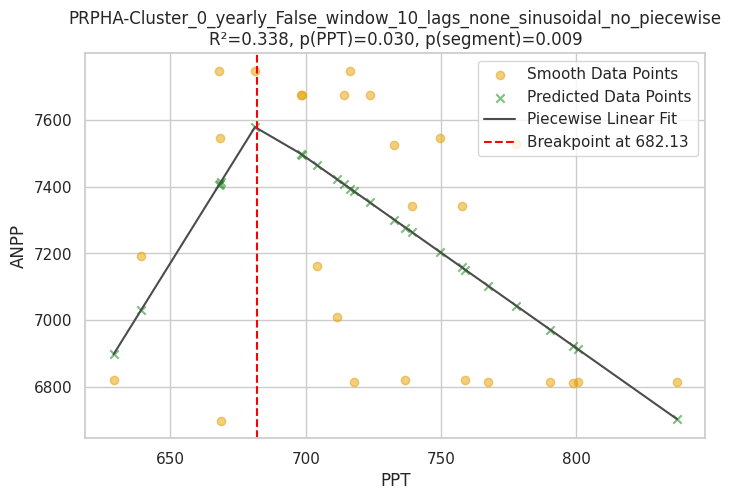

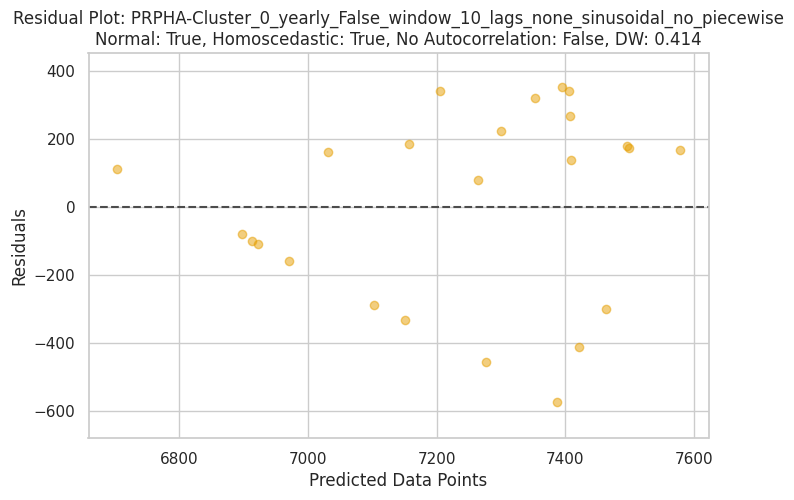

Min values:
 PPT      628.9778
ANPP    6698.6250
year    1984.0000
dtype: float64

Max values:
 PPT      837.249802
ANPP    7747.253000
year    2019.000000
dtype: float64
Min values:
 year                      1984
site.code                PRHPA
type                 Croplands
Crop                     Maize
Cereal                  Cereal
MAP                 702.199915
ANPP                  6249.656
PPT                    409.957
WUE                   6.258573
ANPP_transformed      6249.656
WUE_transformed       2.501714
Cluster                      0
dtype: object

Max values:
 year                       2019
site.code                 PRHPA
type                  Croplands
Crop                    Soybean
Cereal               Non-Cereal
MAP                  708.647165
ANPP                  10905.565
PPT                 1031.934004
WUE                   26.561613
ANPP_transformed      10905.565
WUE_transformed        5.153796
Cluster                       0
dtype: object


In [147]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=prhpa_clusters[0],
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=False,
    window_size=10,
    analysis_name='PRPHA-Cluster_0_yearly_False_window_10_lags_none_sinusoidal_no_piecewise',
    plot_name='PRHPA-Maize',
    show_plot=True,
    lags=None,
    use_sinusoidal=False,
    cycle_period=0,
    is_run_quadratic=False,
    is_piecewise=True,
    is_spline=False,
)

find_min_max(data)
find_min_max(prhpa_clusters[0])

In [148]:
top_models = run_and_save_models(
    df=prhpa_clusters[1],
    analysis_name='PRPHA-Cluster_1',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise', 'spline'],
    window_size=range(1, 11),
    lags=[None, [1], [2], [3], [4], [5]],
    cycle_period=5.8,
    show_plot=False,
    show_aic_bic=False
)

quadratic No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
piecewise No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
spline No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).


In [149]:
top_models = run_and_save_models(
    df=prhpa_clusters[2],
    analysis_name='PRPHA-Cluster_2',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise', 'spline'],
    window_size=range(1, 11),
    lags=[None, [1], [2], [3], [4], [5]],
    cycle_period=13.0,
    show_plot=False,
    show_aic_bic=False
)

spline No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).


Predictors in plot_model: ['PPT', 'segment']


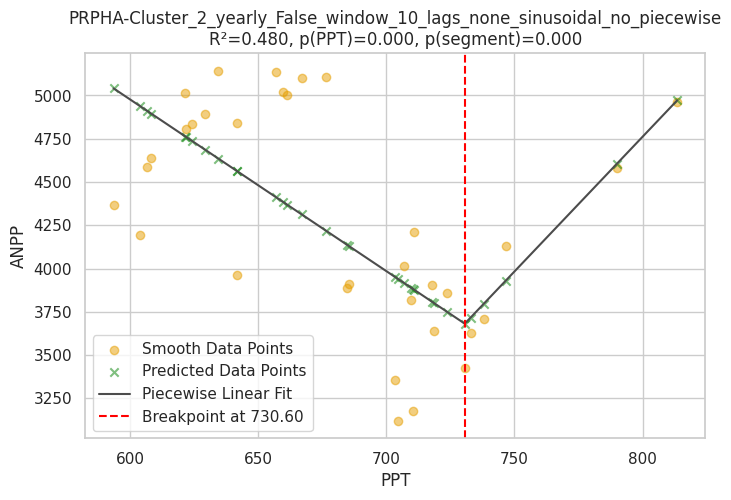

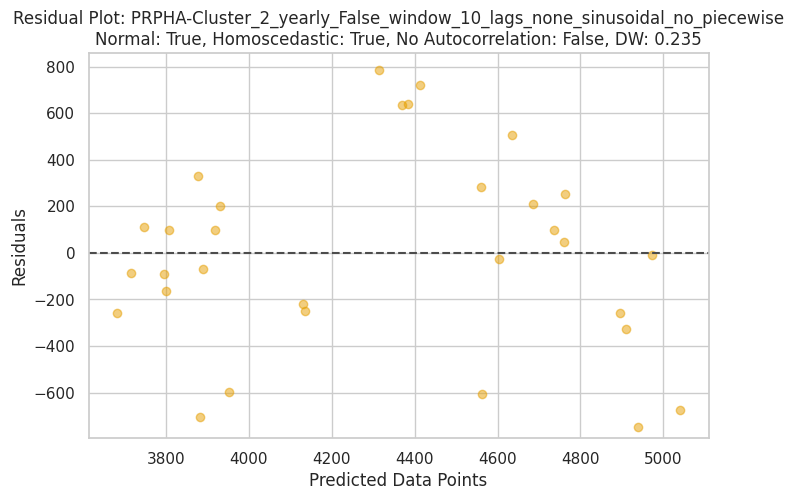

Min values:
 PPT      593.45310
ANPP    3120.31749
year    1984.00000
dtype: float64

Max values:
 PPT      813.524833
ANPP    5142.683995
year    2018.000000
dtype: float64
Min values:
 year                       1984
site.code                 PRHPA
type                  Croplands
Crop                    Soybean
Cereal               Non-Cereal
MAP                  702.199915
ANPP                1000.626067
PPT                     424.181
WUE                    2.257572
ANPP_transformed    1000.626067
WUE_transformed        1.502522
Cluster                       2
dtype: object

Max values:
 year                       2018
site.code                 PRHPA
type                    Pasture
Crop                Switchgrass
Cereal                  Pasture
MAP                  715.094416
ANPP                   5812.018
PPT                    1003.375
WUE                   11.409776
ANPP_transformed       5812.018
WUE_transformed        3.377836
Cluster                       2
dtype: object


In [150]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=prhpa_clusters[2],
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=False,
    window_size=10,
    analysis_name='PRPHA-Cluster_2_yearly_False_window_10_lags_none_sinusoidal_no_piecewise',
    plot_name='PRHPA-Cluster_2',
    show_plot=True,
    lags=None,
    use_sinusoidal=False,
    cycle_period=0,
    is_run_quadratic=False,
    is_piecewise=True,
    is_spline=False,
)

find_min_max(data)
find_min_max(prhpa_clusters[2])


## **CPER**


IQR Method for ANPP:
Q1: 515.95, Q3: 963.19, IQR: 447.24
Lower Bound: -154.92, Upper Bound: 1634.06
Number of IQR outliers: 0
Range of IQR outliers: None


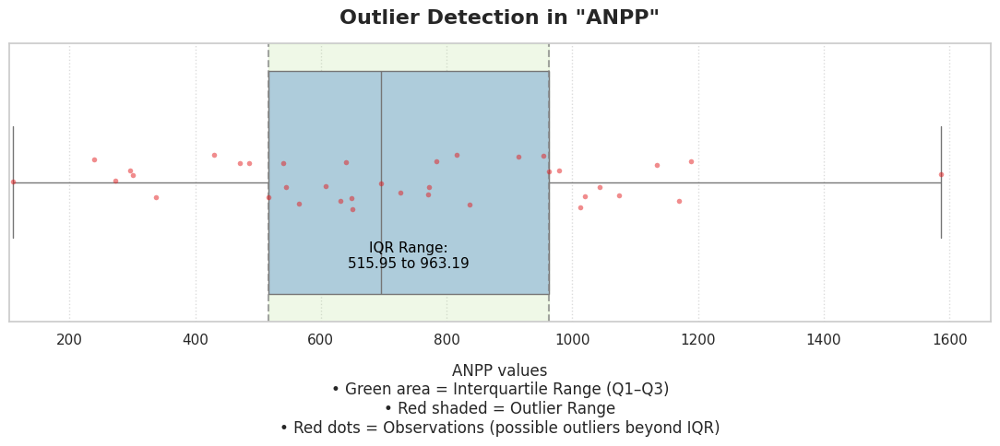

Unique values in 'site.code':
Crop
Range    37
Name: count, dtype: int64


In [151]:
df_CPER = filter_df(df, 'site.code', 'CPER')

df_CPER_transformed, df_CPER_transformed_info = transform_dataframe(df_CPER, ['ANPP', 'WUE'])

df_CPER_outliers = detect_outliers(df_CPER, 'ANPP')
df_CPER_processed = df_CPER_outliers['cleaned_df']

df_CPER_outliers = df_CPER_outliers['iqr_outliers']

len(df_CPER_outliers)

print("Unique values in 'site.code':")
print(df_CPER['Crop'].value_counts())

Starting analysis for ANPP with predictor PPT


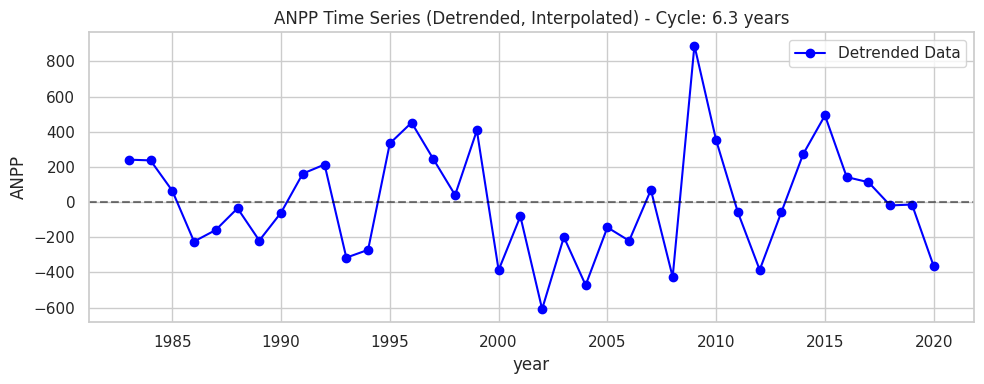

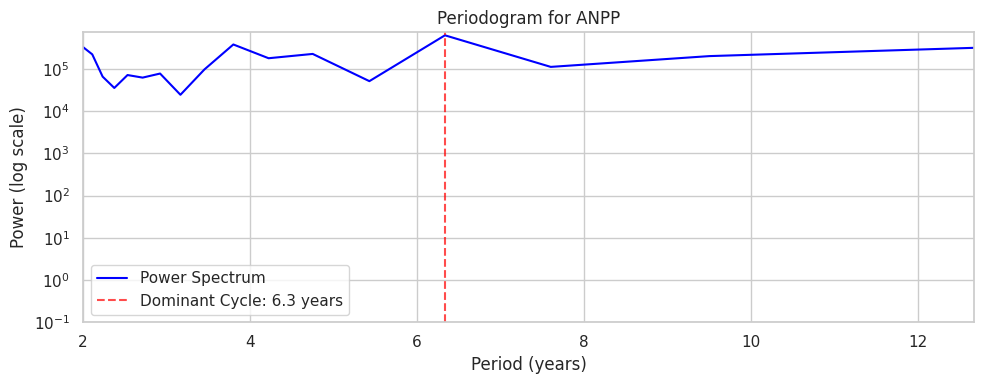

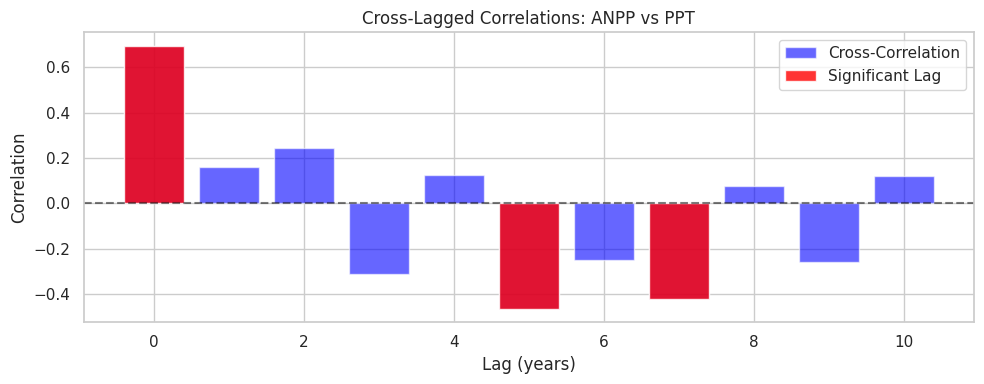

ANPP Results:
Dominant cycle detected at 6.3-year period. No significant autocorrelation detected (lags 1–10). Significant cross-lagged effects (ANPP vs. PPT) at lags: [0, 5, 7].
Starting analysis for PPT with predictor None


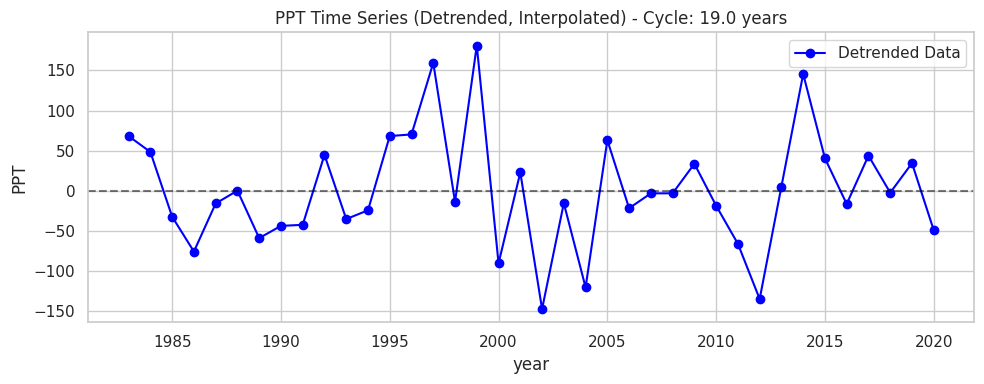

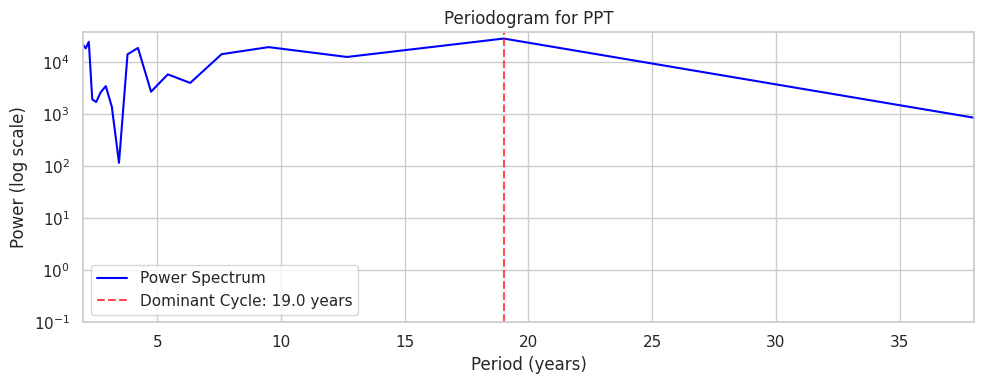

PPT Results:
Dominant cycle detected at 19.0-year period. No significant autocorrelation detected (lags 1–10).


In [152]:
anpp_result = run_time_series_analysis(df_CPER_processed, 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(df_CPER_processed, 'PPT', None, plot=True)

In [153]:
pearson_corr, spearman_corr = compute_correlation(df_CPER, 'ANPP', 'PPT', 'CPER')


Correlation between ANPP and PPT - CPER (Pearson): 0.7007265481374163
Correlation between ANPP and PPT - CPER (Spearman): 0.711474632527264


In [154]:
top_models_CPER = run_and_save_models(
    df=df_CPER,
    analysis_name='CPER',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise', 'spline'],
    window_size=range(1, 11),
    lags=[None, [1], [2], [3], [4], [5]],
    cycle_period=19,
    show_plot=False,
    show_aic_bic=False
)

spline No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).


Predictors in plot_model: ['PPT']


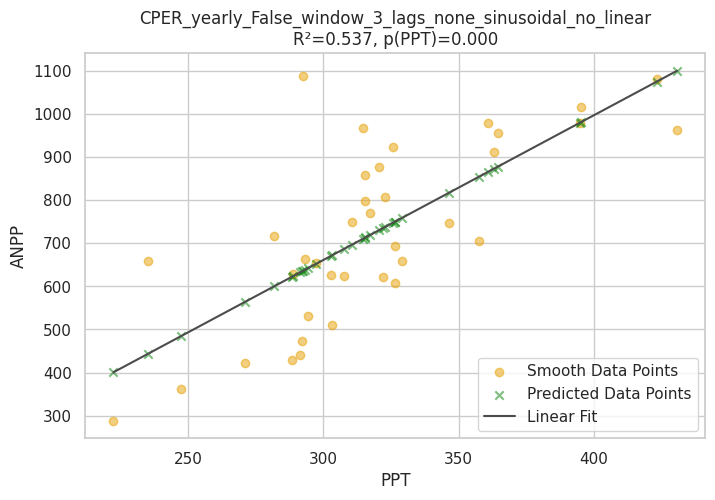

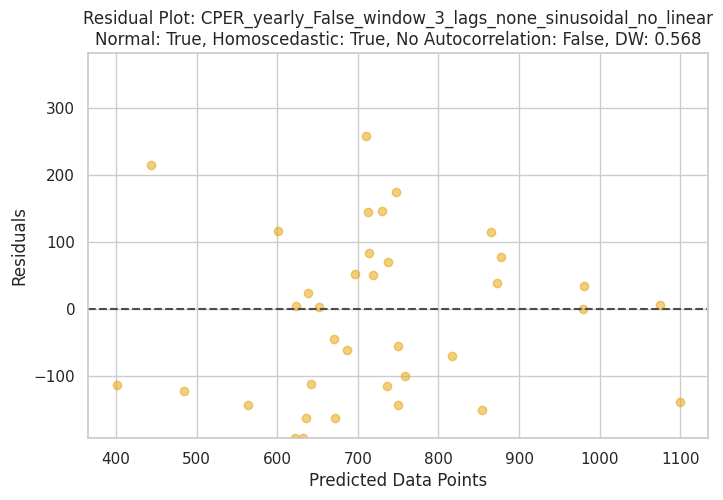

Min values:
 PPT      222.304333
ANPP     288.380969
year    1983.000000
dtype: float64

Max values:
 PPT      430.784000
ANPP    1087.051852
year    2020.000000
dtype: float64
Min values:
 year               1983
site.code          CPER
type         Rangelands
Crop              Range
Cereal            Range
MAP              318.75
ANPP         109.666667
PPT             170.343
WUE            0.643799
dtype: object

Max values:
 year                2020
site.code           CPER
type          Rangelands
Crop               Range
Cereal             Range
MAP               318.75
ANPP         1586.471111
PPT              501.904
WUE             4.609557
dtype: object


In [155]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=df_CPER,
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=False,
    window_size=3,
    analysis_name='CPER_yearly_False_window_3_lags_none_sinusoidal_no_linear',
    plot_name='CPER',
    show_plot=True,
    lags=None,
    use_sinusoidal=False,
    cycle_period=0,
    is_run_quadratic=False,
    is_piecewise=False,
    is_spline=False,
)

find_min_max(data)
find_min_max(df_CPER)

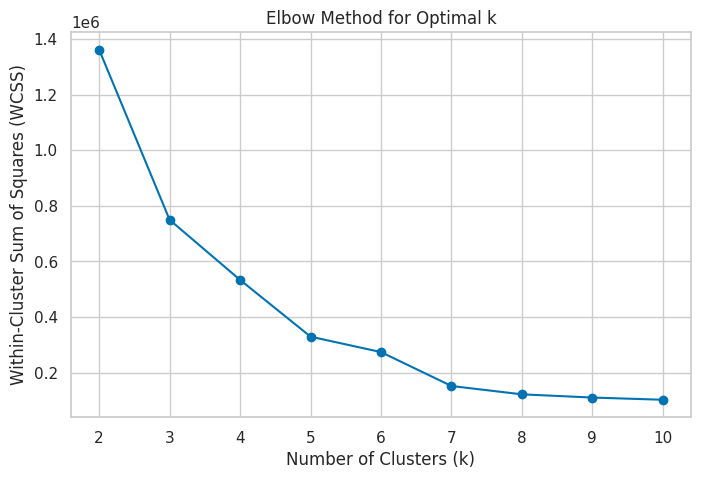

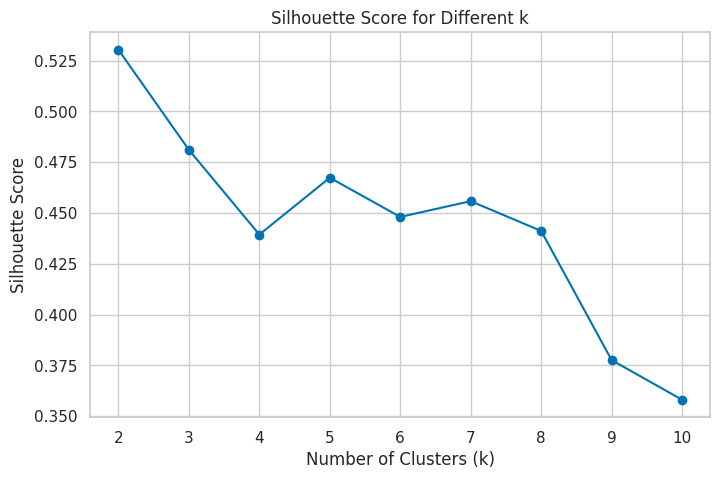

K-means Performance
Silhouette Score: 0.481


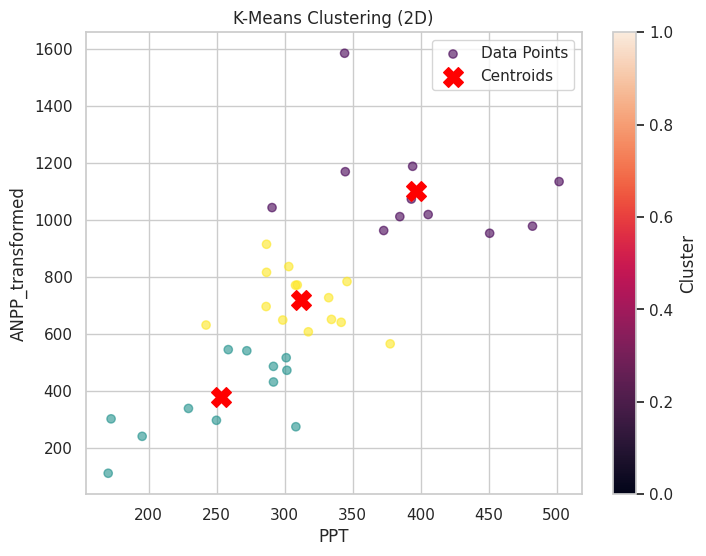


Cluster Summary (Mean Values):
                PPT         ANPP
Cluster                         
0        396.871273  1102.263277
1        253.618417   378.779274
2        312.247643   718.465637
Unique clusters - CPER: [0 2 1]

Cluster 0 DataFrame:
Number of observations: 11
Pearson Correlation between ANPP and PPT - CPER (cluster 0): -0.3072168392709752


Spearman Correlation between ANPP and PPT - CPER (cluster 0): -0.3090909090909091



Cluster 1 DataFrame:
Number of observations: 12
Pearson Correlation between ANPP and PPT - CPER (cluster 1): 0.6856561370368295


Spearman Correlation between ANPP and PPT - CPER (cluster 1): 0.43356643356643365



Cluster 2 DataFrame:
Number of observations: 14
Pearson Correlation between ANPP and PPT - CPER (cluster 2): -0.3071579894262231


Spearman Correlation between ANPP and PPT - CPER (cluster 2): -0.27912087912087913




In [156]:
columns_transformed = ['PPT', 'ANPP_transformed']
columns_untransformed = ['PPT', 'ANPP']
OPTIMAL_K = 3
K_RANGE = range(2, 11)

df_cper_k_means, cper_clusters, cper_cluster_summary = run_clustering_and_correlations(df_CPER_transformed, 'CPER', \
                                                                columns_transformed, columns_untransformed, K_RANGE, OPTIMAL_K)


Starting analysis for ANPP with predictor PPT


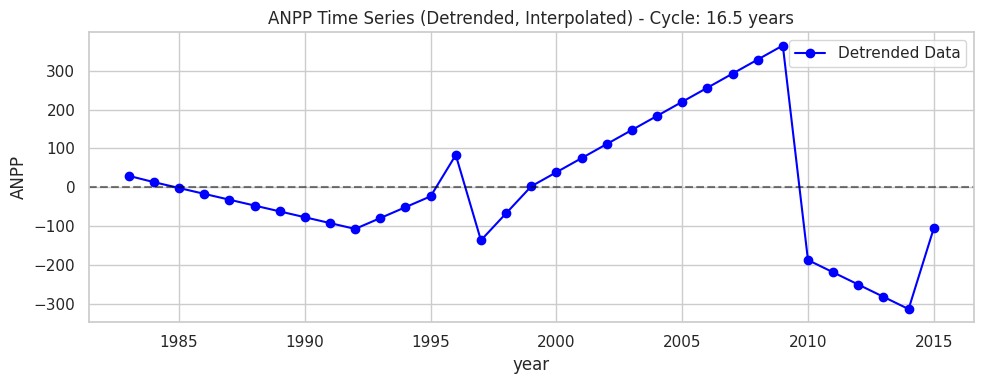

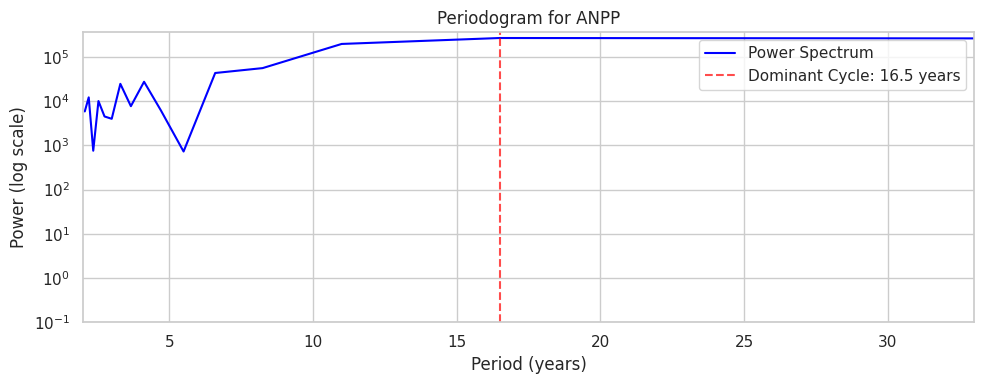

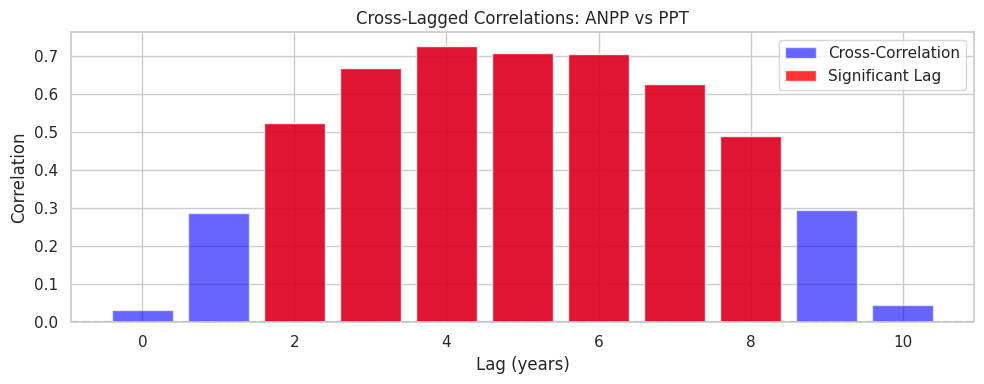

ANPP Results:
Dominant cycle detected at 16.5-year period. No significant autocorrelation detected (lags 1–10). Significant cross-lagged effects (ANPP vs. PPT) at lags: [2, 3, 4, 5, 6, 7, 8].
Starting analysis for PPT with predictor None


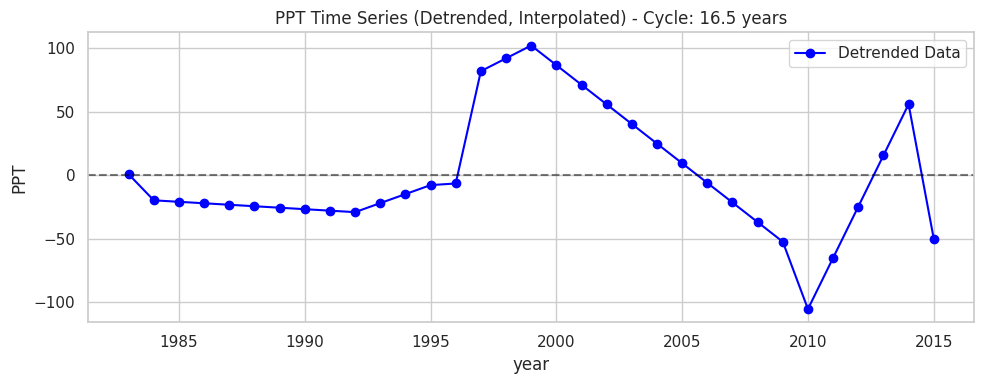

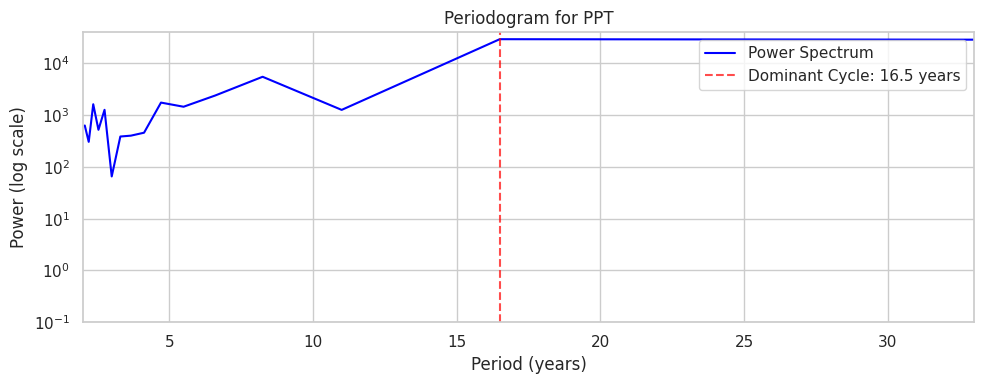

PPT Results:
Dominant cycle detected at 16.5-year period. No significant autocorrelation detected (lags 1–10).


In [157]:
anpp_result = run_time_series_analysis(cper_clusters[0], 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(cper_clusters[0], 'PPT', None, plot=True)

Starting analysis for ANPP with predictor PPT


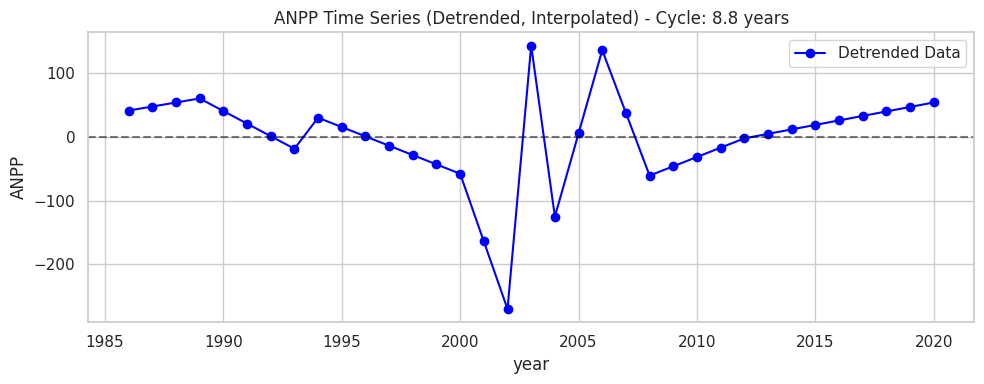

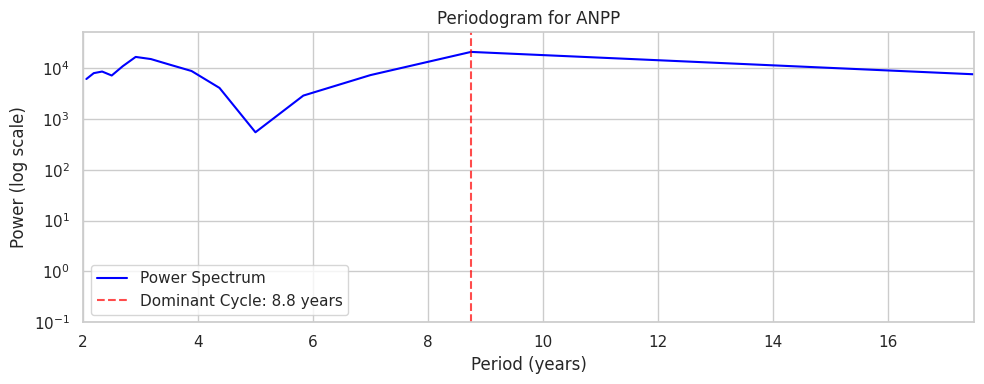

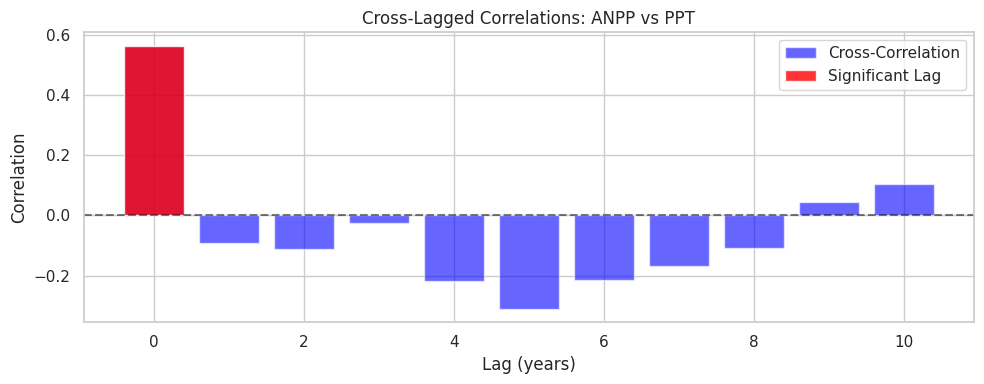

ANPP Results:
Dominant cycle detected at 8.8-year period. No significant autocorrelation detected (lags 1–10). Significant cross-lagged effects (ANPP vs. PPT) at lags: [0].
Starting analysis for PPT with predictor None


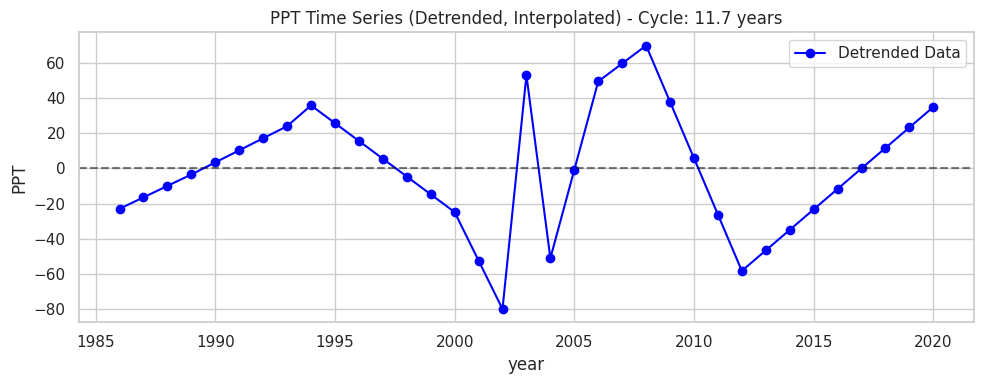

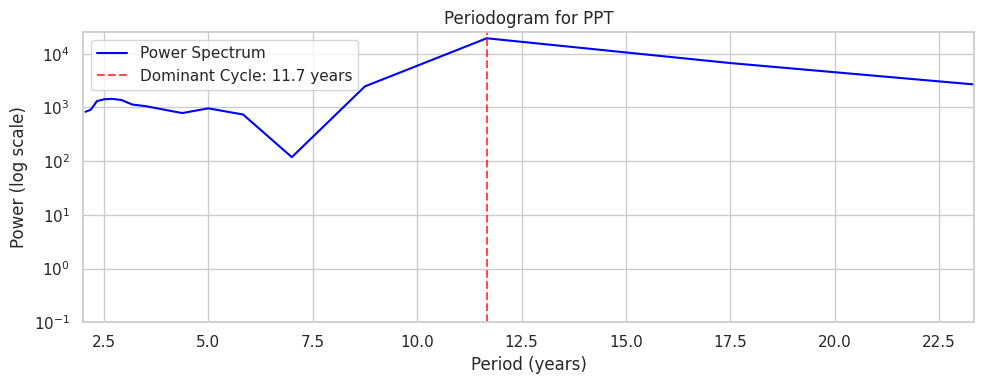

PPT Results:
Dominant cycle detected at 11.7-year period. No significant autocorrelation detected (lags 1–10).


In [158]:
anpp_result = run_time_series_analysis(cper_clusters[1], 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(cper_clusters[1], 'PPT', None, plot=True)

Starting analysis for ANPP with predictor PPT


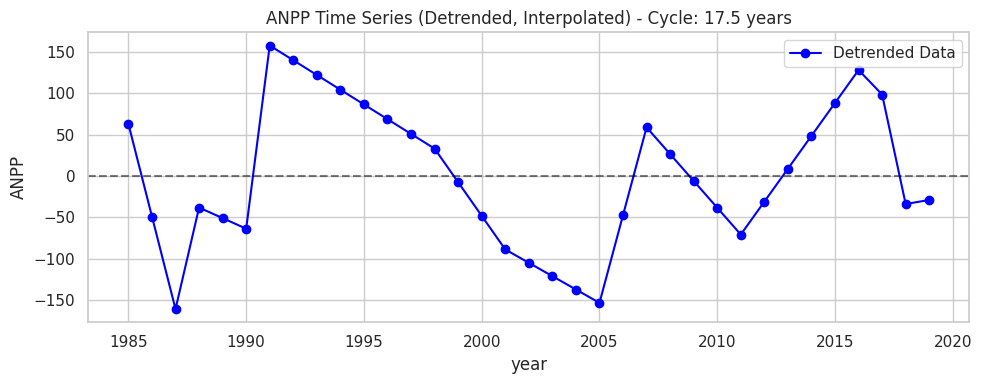

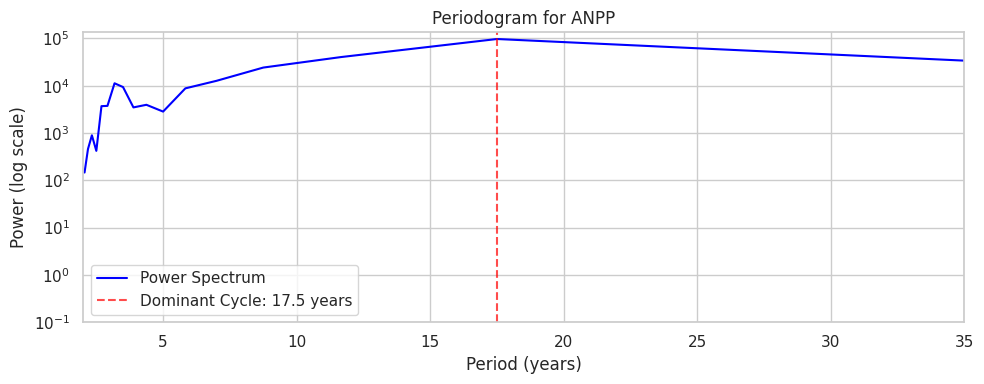

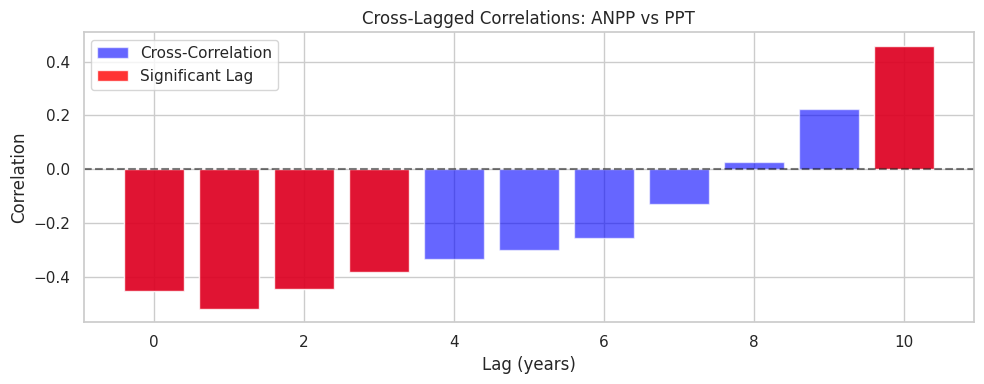

ANPP Results:
Dominant cycle detected at 17.5-year period. No significant autocorrelation detected (lags 1–10). Significant cross-lagged effects (ANPP vs. PPT) at lags: [0, 1, 2, 3, 10].
Starting analysis for PPT with predictor None


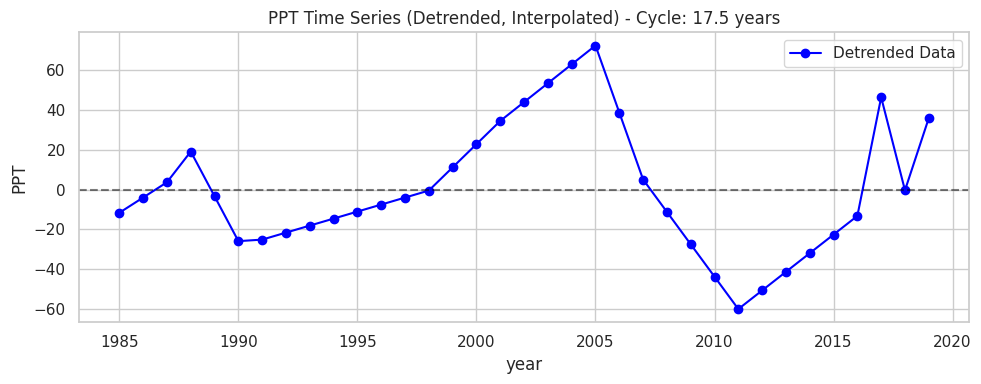

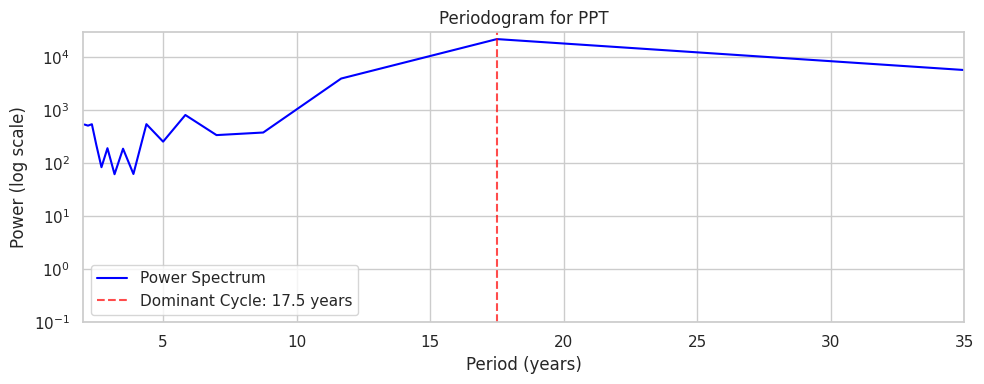

PPT Results:
Dominant cycle detected at 17.5-year period. No significant autocorrelation detected (lags 1–10).


In [159]:
anpp_result = run_time_series_analysis(cper_clusters[2], 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(cper_clusters[2], 'PPT', None, plot=True)

In [160]:
top_models = run_and_save_models(
    df=cper_clusters[0],
    analysis_name='CPER-Cluster_0',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise'],
    window_size=range(1, 6),
    lags=[None, [2], [3], [4], [5], [6], [7], [8]],
    cycle_period=16.5,
    show_plot=False,
    show_aic_bic=False
)

Using Leave-One-Out CV for small dataset (n=9)
Using Leave-One-Out CV for small dataset (n=8)
Skipping CPER-Cluster_0_yearly_False_window_1_lags_4_sinusoidal_no_linear: Dataset too small after processing (n=7). Need at least 8 rows.
Skipping CPER-Cluster_0_yearly_False_window_1_lags_5_sinusoidal_no_linear: Dataset too small after processing (n=6). Need at least 8 rows.
Skipping CPER-Cluster_0_yearly_False_window_1_lags_6_sinusoidal_no_linear: Dataset too small after processing (n=5). Need at least 8 rows.
Skipping CPER-Cluster_0_yearly_False_window_1_lags_7_sinusoidal_no_linear: Dataset too small after processing (n=4). Need at least 8 rows.
Skipping CPER-Cluster_0_yearly_False_window_1_lags_8_sinusoidal_no_linear: Dataset too small after processing (n=3). Need at least 8 rows.
Using Leave-One-Out CV for small dataset (n=9)
Using Leave-One-Out CV for small dataset (n=8)
Skipping CPER-Cluster_0_yearly_False_window_1_lags_4_sinusoidal_yes_linear: Dataset too small after processing (n=7).

In [161]:
top_models = run_and_save_models(
    df=cper_clusters[2],
    analysis_name='CPER-Cluster_2',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise'],
    window_size=range(1, 6),
    lags=[None, [2], [3], [4], [5], [6], [7], [8]],
    cycle_period=17.5,
    show_plot=False,
    show_aic_bic=False
)

Using Leave-One-Out CV for small dataset (n=9)
Using Leave-One-Out CV for small dataset (n=8)
Skipping CPER-Cluster_2_yearly_False_window_1_lags_7_sinusoidal_no_linear: Dataset too small after processing (n=7). Need at least 8 rows.
Skipping CPER-Cluster_2_yearly_False_window_1_lags_8_sinusoidal_no_linear: Dataset too small after processing (n=6). Need at least 8 rows.
Using Leave-One-Out CV for small dataset (n=9)
Using Leave-One-Out CV for small dataset (n=8)
Skipping CPER-Cluster_2_yearly_False_window_1_lags_7_sinusoidal_yes_linear: Dataset too small after processing (n=7). Need at least 8 rows.
Skipping CPER-Cluster_2_yearly_False_window_1_lags_8_sinusoidal_yes_linear: Dataset too small after processing (n=6). Need at least 8 rows.
Using Leave-One-Out CV for small dataset (n=9)
Using Leave-One-Out CV for small dataset (n=8)
Skipping CPER-Cluster_2_yearly_True_window_1_lags_7_sinusoidal_no_linear: Dataset too small after processing (n=7). Need at least 8 rows.
Skipping CPER-Cluster_

In [162]:
top_models = run_and_save_models(
    df=cper_clusters[1],
    analysis_name='CPER-Cluster_1',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise'],
    window_size=range(1, 6),
    lags=[None, [2], [3], [4], [5], [6], [7], [8]],
    cycle_period=11.7,
    show_plot=False,
    show_aic_bic=False
)

Using Leave-One-Out CV for small dataset (n=9)
Using Leave-One-Out CV for small dataset (n=8)
Skipping CPER-Cluster_1_yearly_False_window_1_lags_5_sinusoidal_no_linear: Dataset too small after processing (n=7). Need at least 8 rows.
Skipping CPER-Cluster_1_yearly_False_window_1_lags_6_sinusoidal_no_linear: Dataset too small after processing (n=6). Need at least 8 rows.
Skipping CPER-Cluster_1_yearly_False_window_1_lags_7_sinusoidal_no_linear: Dataset too small after processing (n=5). Need at least 8 rows.
Skipping CPER-Cluster_1_yearly_False_window_1_lags_8_sinusoidal_no_linear: Dataset too small after processing (n=4). Need at least 8 rows.
Using Leave-One-Out CV for small dataset (n=9)
Using Leave-One-Out CV for small dataset (n=8)
Skipping CPER-Cluster_1_yearly_False_window_1_lags_5_sinusoidal_yes_linear: Dataset too small after processing (n=7). Need at least 8 rows.
Skipping CPER-Cluster_1_yearly_False_window_1_lags_6_sinusoidal_yes_linear: Dataset too small after processing (n=6)

Predictors in plot_model: ['PPT']


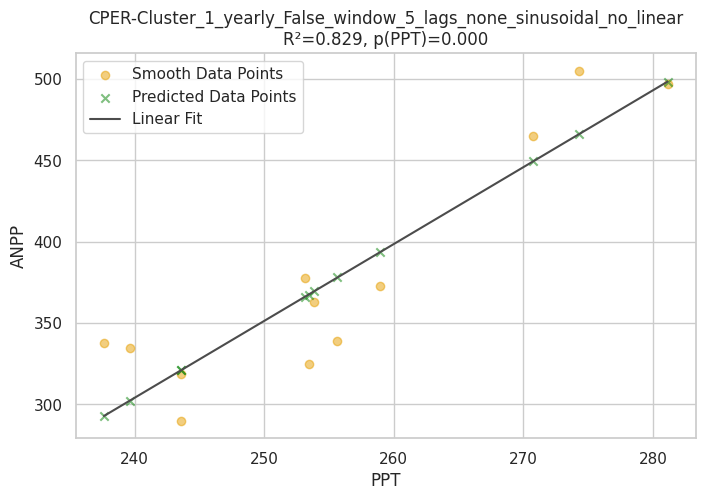

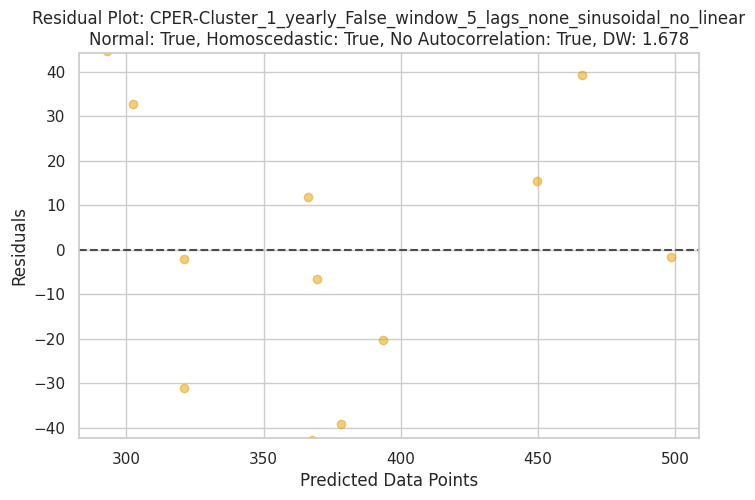

Min values:
 PPT      237.624200
ANPP     290.007704
year    1986.000000
dtype: float64

Max values:
 PPT      281.135500
ANPP     505.119365
year    2020.000000
dtype: float64
Min values:
 year                      1986
site.code                 CPER
type                Rangelands
Crop                     Range
Cereal                   Range
MAP                     318.75
ANPP                109.666667
PPT                    170.343
WUE                   0.643799
ANPP_transformed    109.666667
WUE_transformed       0.802371
Cluster                      1
dtype: object

Max values:
 year                      2020
site.code                 CPER
type                Rangelands
Crop                     Range
Cereal                   Range
MAP                     318.75
ANPP                544.417778
PPT                    308.356
WUE                   2.104941
ANPP_transformed    544.417778
WUE_transformed       1.450842
Cluster                      1
dtype: object


In [163]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=cper_clusters[1],
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=False,
    window_size=5,
    analysis_name='CPER-Cluster_1_yearly_False_window_5_lags_none_sinusoidal_no_linear',
    plot_name='CPER',
    show_plot=True,
    lags=None,
    use_sinusoidal=False,
    cycle_period=0,
    is_run_quadratic=False,
    is_piecewise=False,
    is_spline=False,
)

find_min_max(data)
find_min_max(cper_clusters[1])

Predictors in plot_model: ['PPT', 'segment']


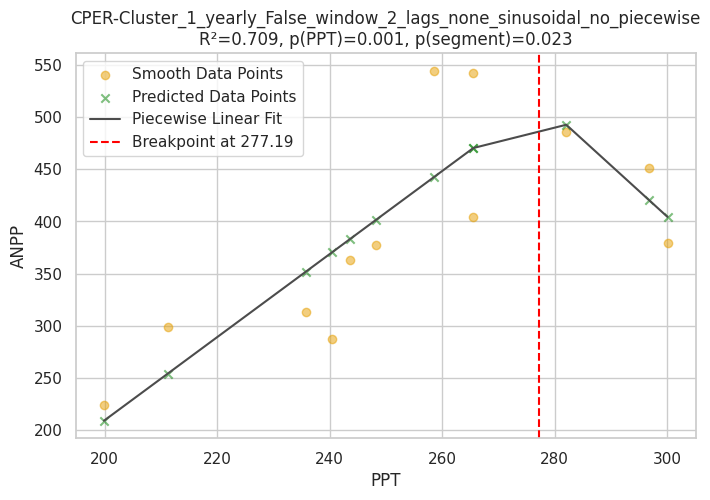

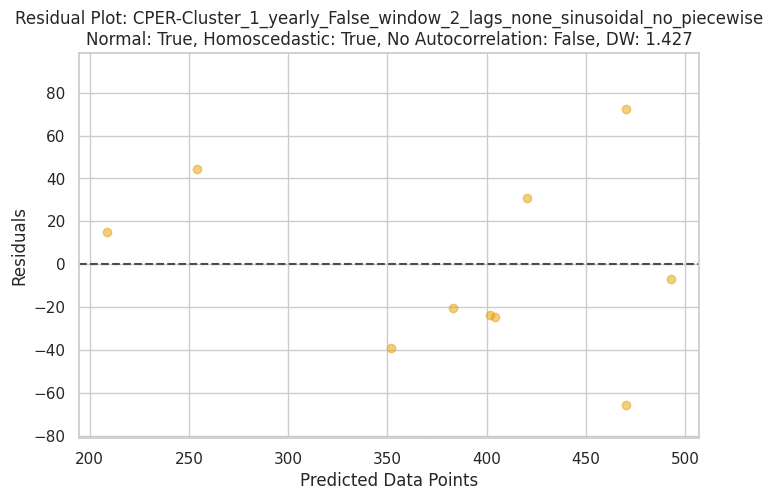

In [164]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=cper_clusters[1],
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=False,
    window_size=2,
    analysis_name='CPER-Cluster_1_yearly_False_window_2_lags_none_sinusoidal_no_piecewise',
    plot_name='CPER',
    show_plot=True,
    lags=None,
    use_sinusoidal=False,
    cycle_period=0,
    is_run_quadratic=False,
    is_piecewise=True,
    is_spline=False,
)

## **UCB**


IQR Method for ANPP:
Q1: 2950.38, Q3: 9882.72, IQR: 6932.34
Lower Bound: -7448.13, Upper Bound: 20281.23
Number of IQR outliers: 1
Range of IQR outliers: (20765.96329, 20765.96329)


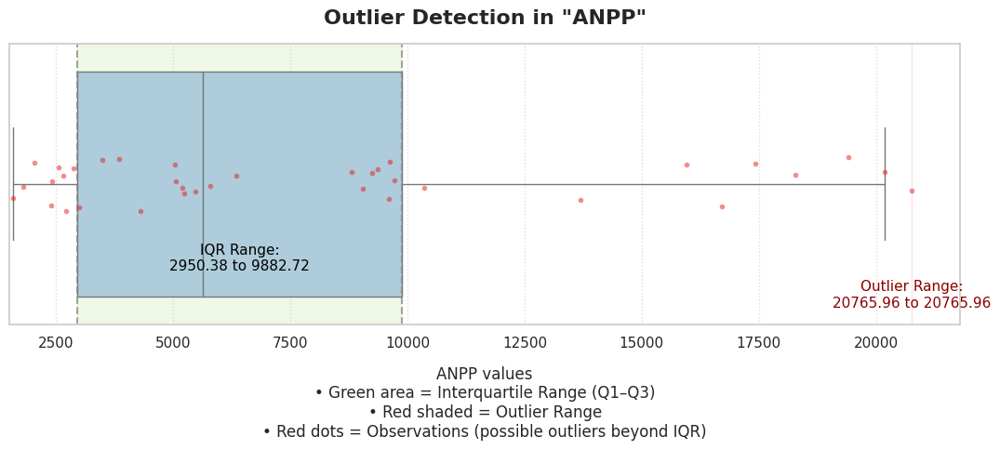

Unique values in 'site.code':
Crop
Alfalfa        10
Mixed_grass     9
Switchgrass     9
Maize           8
Name: count, dtype: int64


In [165]:
df_ucb = filter_df(df, 'site.code', 'UCB')

df_ucb_transformed, df_ucb_transformed_info = transform_dataframe(df_ucb, ['ANPP', 'WUE'])

df_ucb_outliers = detect_outliers(df_ucb, 'ANPP')
df_ucb_processed = df_ucb_outliers['cleaned_df']

df_ucb_outliers = df_ucb_outliers['iqr_outliers']

len(df_ucb_outliers)

df_ucb_outliers.head(1)

print("Unique values in 'site.code':")
print(df_ucb['Crop'].value_counts())

Starting analysis for ANPP with predictor PPT


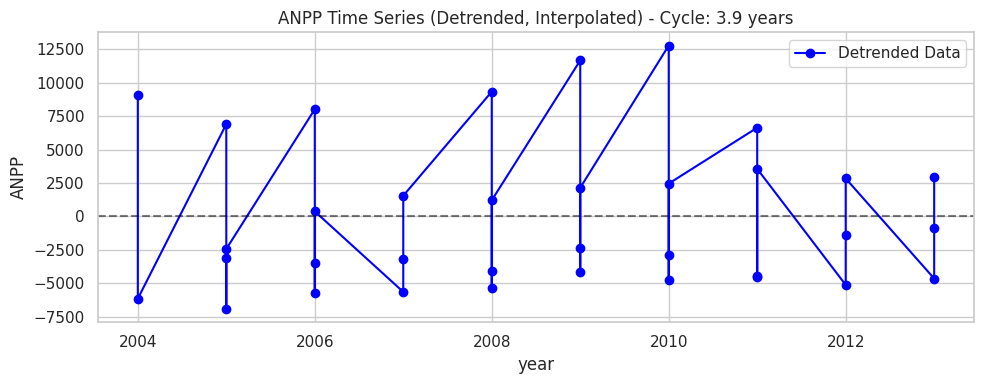

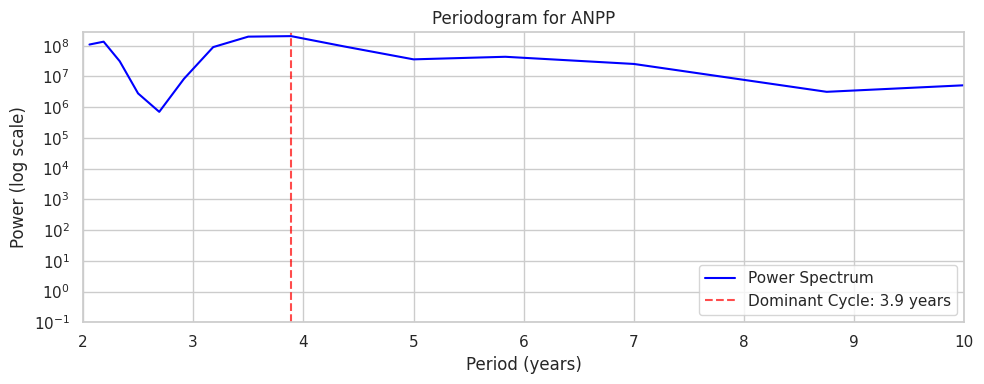

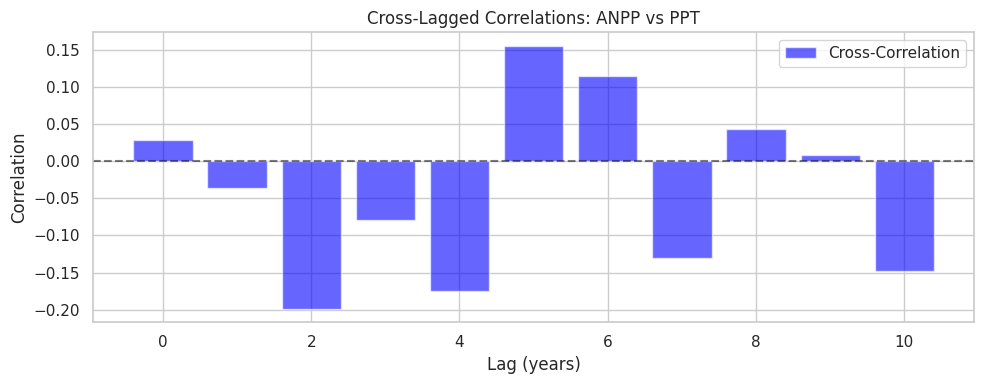

ANPP Results:
Dominant cycle detected at 3.9-year period. No significant autocorrelation detected (lags 1–10). No significant cross-lagged effects (ANPP vs. PPT) detected (lags 0–10).
Starting analysis for PPT with predictor None


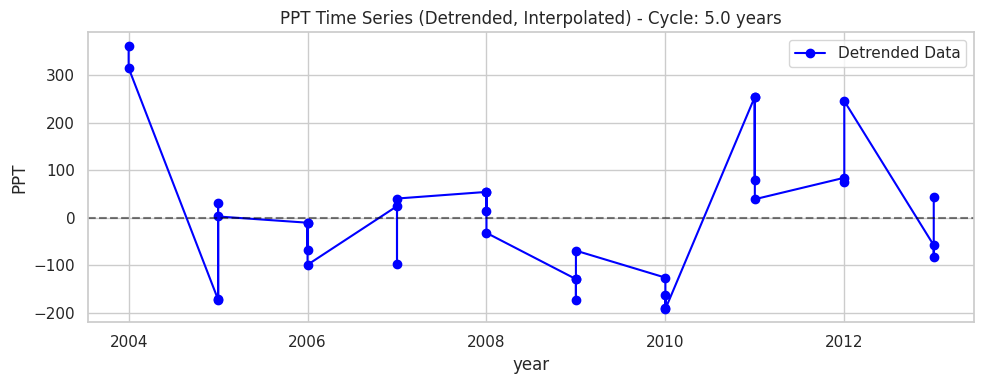

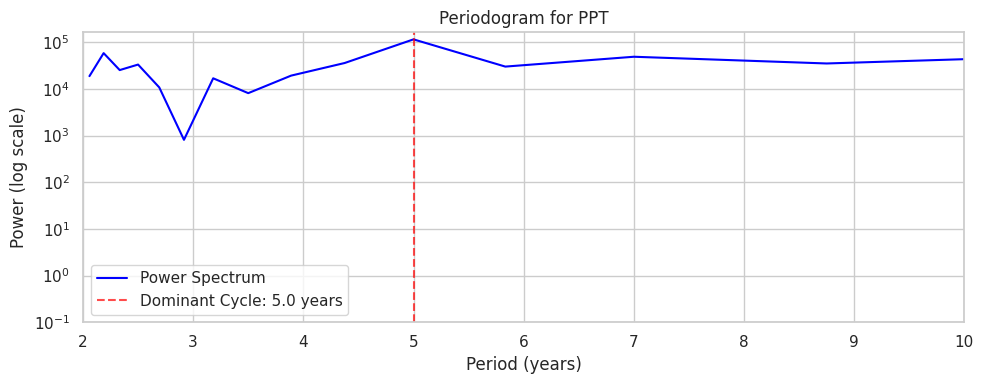

PPT Results:
Dominant cycle detected at 5.0-year period. No significant autocorrelation detected (lags 1–10).


In [166]:
anpp_result = run_time_series_analysis(df_ucb_processed, 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(df_ucb_processed, 'PPT', None, plot=True)

In [167]:
pearson_corr, spearman_corr = compute_correlation(df_ucb, 'ANPP', 'PPT', 'UCB')


Correlation between ANPP and PPT - UCB (Pearson): -0.013077813577442697
Correlation between ANPP and PPT - UCB (Spearman): -0.12449308658973024


In [168]:
top_models_croplands = run_and_save_models(
    df=df_ucb,
    analysis_name='UCB',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise'],
    window_size=range(1, 2),
    lags=[None],
    cycle_period=5,
    show_plot=False,
    show_aic_bic=False
)

linear No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
quadratic No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
piecewise No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).


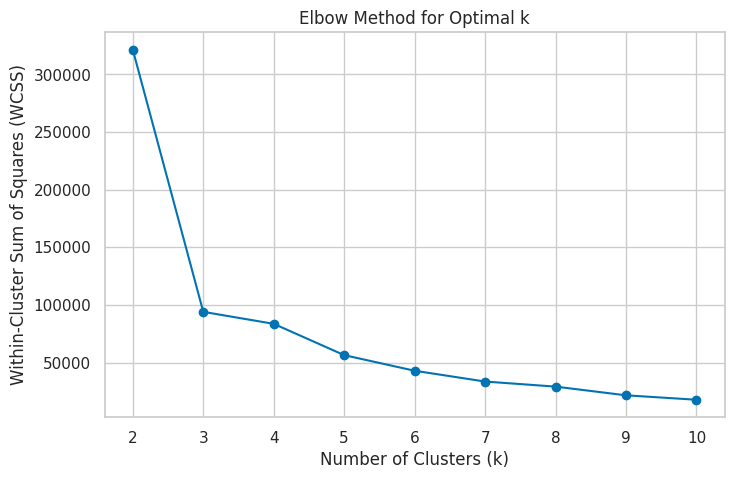

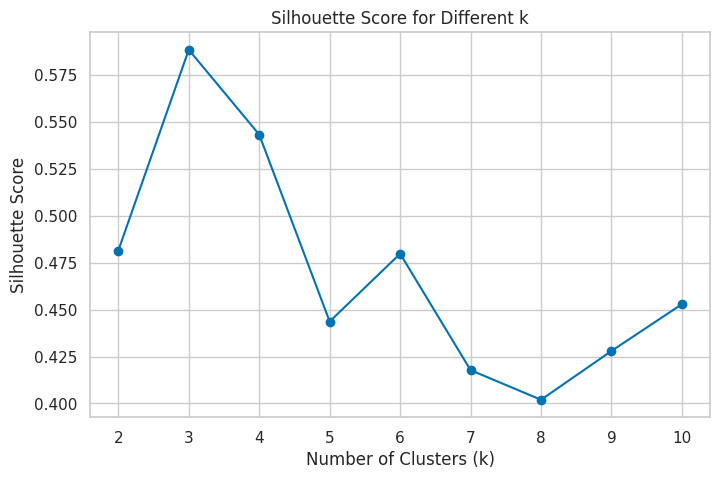

K-means Performance
Silhouette Score: 0.589


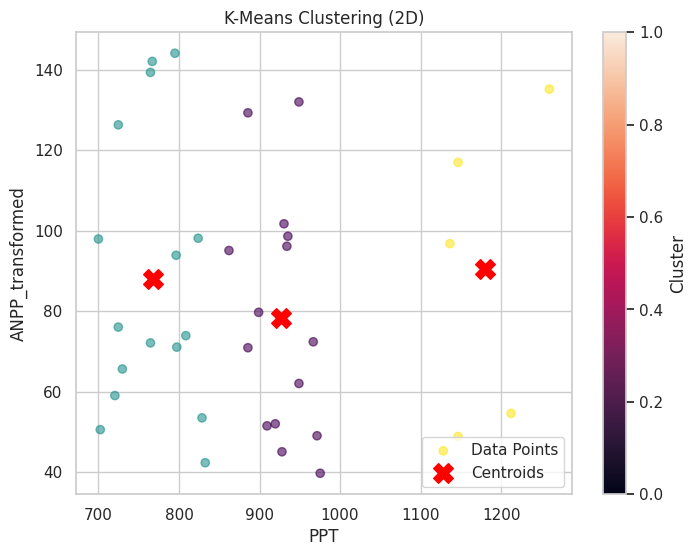


Cluster Summary (Mean Values):
                 PPT         ANPP
Cluster                          
0         926.662267  6956.764089
1         767.514063  8804.013588
2        1180.326798  9339.897439
Unique clusters - UCB: [2 1 0]

Cluster 0 DataFrame:
Number of observations: 15
Pearson Correlation between ANPP and PPT - UCB (cluster 0): -0.2757305424393742


Spearman Correlation between ANPP and PPT - UCB (cluster 0): -0.2576032744446551



Cluster 1 DataFrame:
Number of observations: 16
Pearson Correlation between ANPP and PPT - UCB (cluster 1): -0.02711852164541285


Spearman Correlation between ANPP and PPT - UCB (cluster 1): -0.09572911707328521



Cluster 2 DataFrame:
Number of observations: 5
Pearson Correlation between ANPP and PPT - UCB (cluster 2): 0.40329598658803384


Spearman Correlation between ANPP and PPT - UCB (cluster 2): 0.35909242322980395




In [169]:
columns_transformed = ['PPT', 'ANPP_transformed']
columns_untransformed = ['PPT', 'ANPP']
OPTIMAL_K = 3
K_RANGE = range(2, 11)

df_ucb_k_means, ucb_clusters, ucb_cluster_summary = run_clustering_and_correlations(df_ucb_transformed, 'UCB', \
                                                                columns_transformed, columns_untransformed, K_RANGE, OPTIMAL_K)

Starting analysis for ANPP with predictor PPT


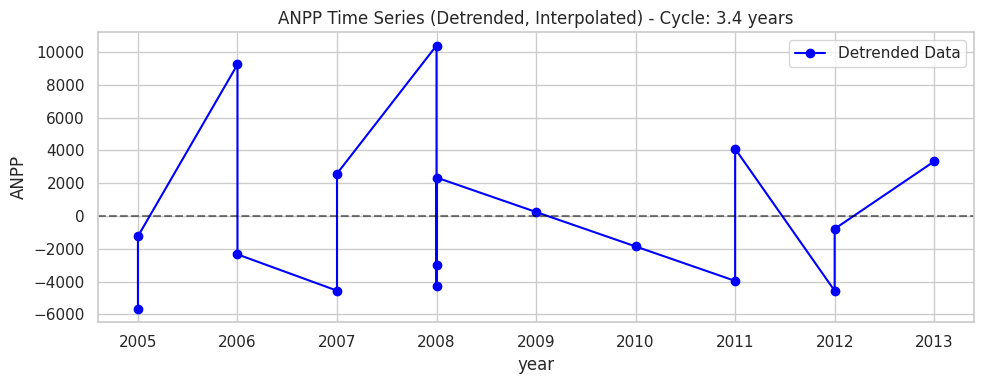

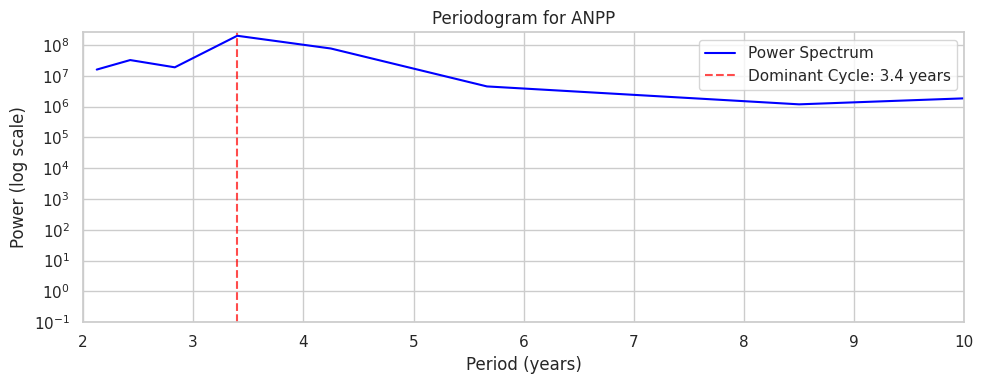

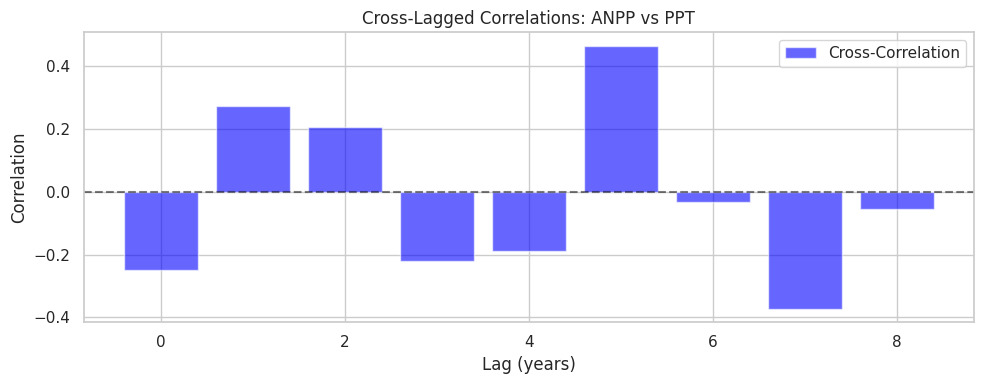

ANPP Results:
Dominant cycle detected at 3.4-year period. No significant autocorrelation detected (lags 1–10). No significant cross-lagged effects (ANPP vs. PPT) detected (lags 0–10).
Starting analysis for PPT with predictor None


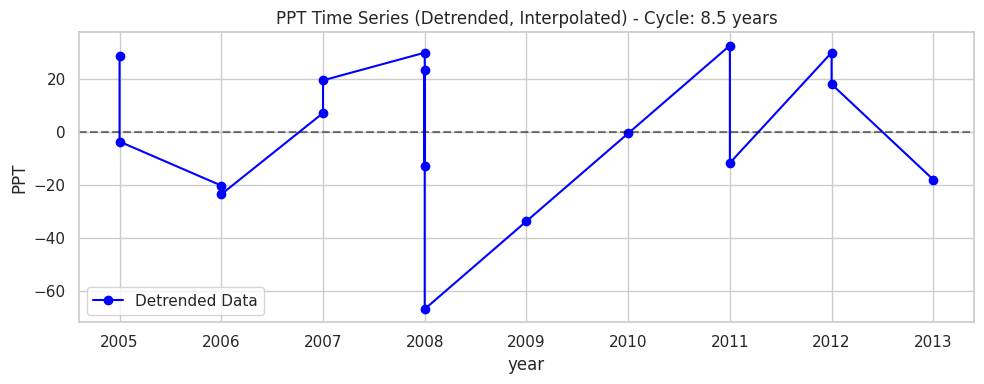

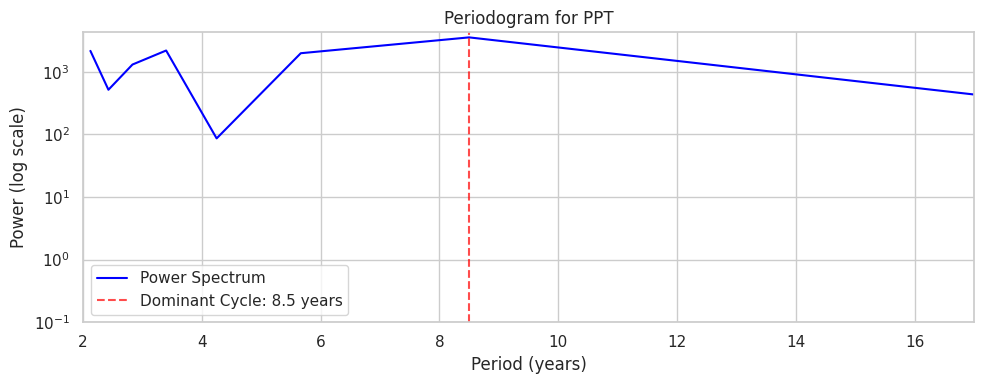

PPT Results:
Dominant cycle detected at 8.5-year period. No significant autocorrelation detected (lags 1–10).


In [170]:
anpp_result = run_time_series_analysis(ucb_clusters[0], 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(ucb_clusters[0], 'PPT', None, plot=True)

Starting analysis for ANPP with predictor PPT


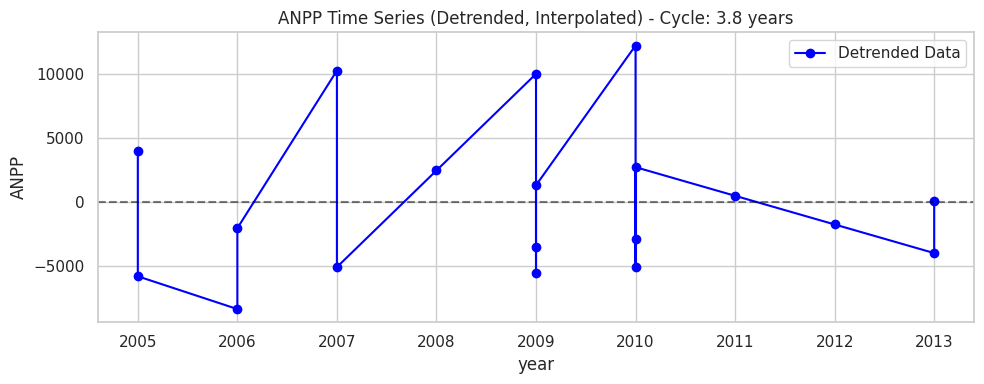

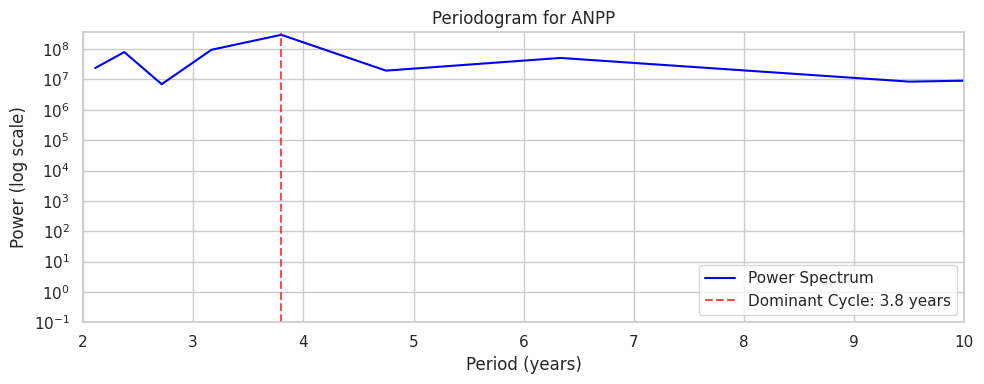

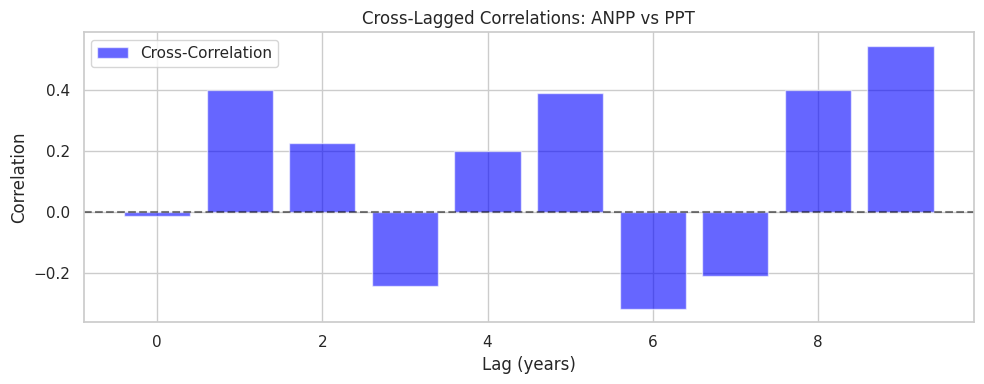

ANPP Results:
Dominant cycle detected at 3.8-year period. No significant autocorrelation detected (lags 1–10). No significant cross-lagged effects (ANPP vs. PPT) detected (lags 0–10).
Starting analysis for PPT with predictor None


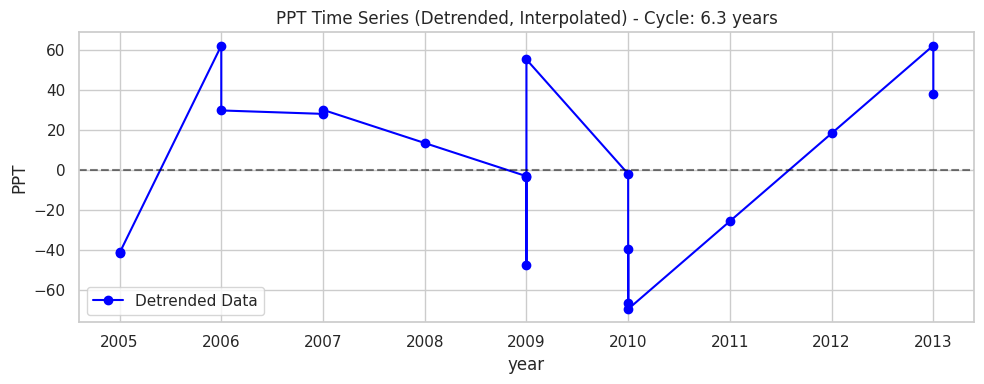

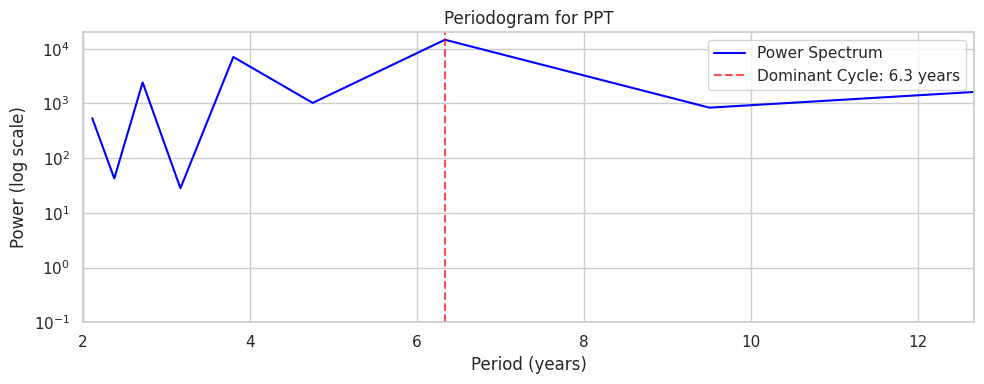

PPT Results:
Dominant cycle detected at 6.3-year period. No significant autocorrelation detected (lags 1–10).


In [171]:
anpp_result = run_time_series_analysis(ucb_clusters[1], 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(ucb_clusters[1], 'PPT', None, plot=True)

Starting analysis for ANPP with predictor PPT


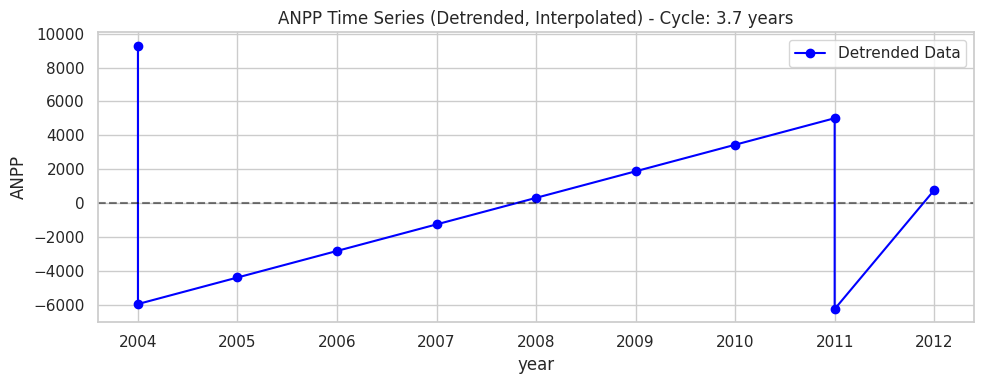

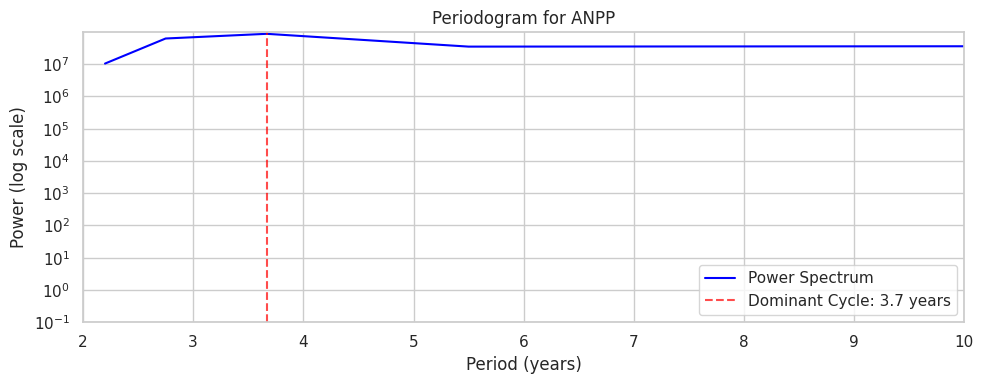

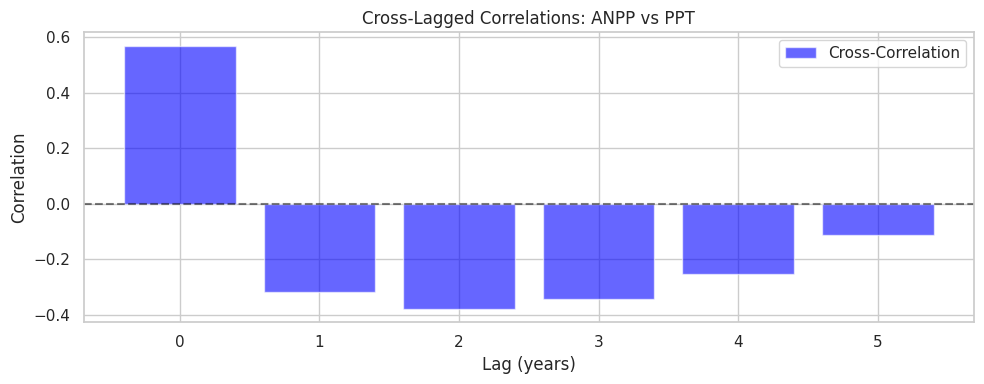

ANPP Results:
Dominant cycle detected at 3.7-year period. No significant autocorrelation detected (lags 1–10). No significant cross-lagged effects (ANPP vs. PPT) detected (lags 0–10).
Starting analysis for PPT with predictor None


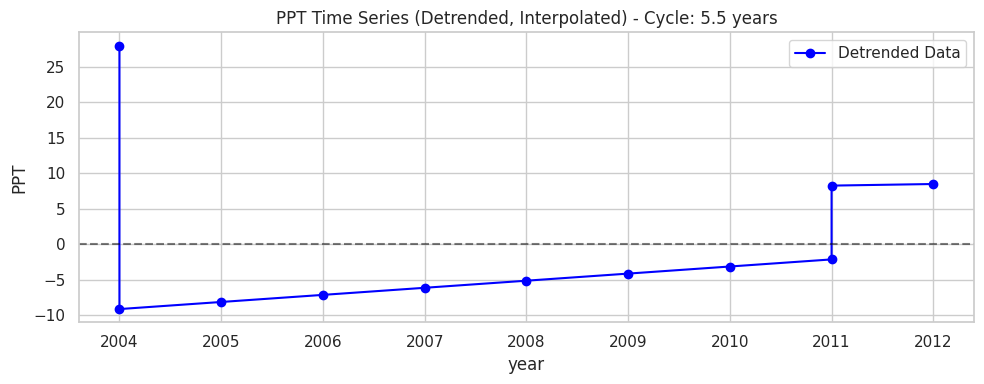

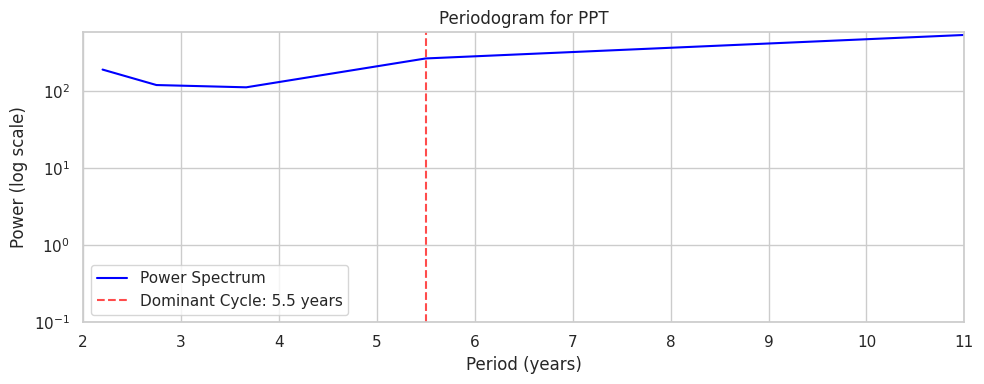

PPT Results:
Dominant cycle detected at 5.5-year period. No significant autocorrelation detected (lags 1–10).


In [172]:
anpp_result = run_time_series_analysis(ucb_clusters[2], 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(ucb_clusters[2], 'PPT', None, plot=True)

In [173]:
top_models  = run_and_save_models(
    df=ucb_clusters[0],
    analysis_name='UCB_cluster_0',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise', 'spline'],
    window_size=range(1, 11),
    lags=[None],
    cycle_period=0,
    show_plot=False,
    show_aic_bic=False
)

#not considering cycle period from periodogram due to narrow year range

Skipping UCB_cluster_0_yearly_True_window_1_lags_none_sinusoidal_no_linear: Dataset too small after processing (n=7). Need at least 8 rows.
Skipping UCB_cluster_0_yearly_True_window_2_lags_none_sinusoidal_no_linear: Dataset too small after processing (n=7). Need at least 8 rows.
Skipping UCB_cluster_0_yearly_True_window_3_lags_none_sinusoidal_no_linear: Dataset too small after processing (n=7). Need at least 8 rows.
Skipping UCB_cluster_0_yearly_True_window_4_lags_none_sinusoidal_no_linear: Window size 4 too large for 7 rows.
Skipping UCB_cluster_0_yearly_True_window_5_lags_none_sinusoidal_no_linear: Window size 5 too large for 7 rows.
Skipping UCB_cluster_0_yearly_True_window_6_lags_none_sinusoidal_no_linear: Window size 6 too large for 7 rows.
Skipping UCB_cluster_0_yearly_True_window_7_lags_none_sinusoidal_no_linear: Window size 7 too large for 7 rows.
Skipping UCB_cluster_0_yearly_False_window_8_lags_none_sinusoidal_no_linear: Window size 8 too large for 15 rows.
Skipping UCB_clust

In [174]:
top_models  = run_and_save_models(
    df=ucb_clusters[1],
    analysis_name='UCB_cluster_1',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise', 'spline'],
    window_size=range(1, 11),
    lags=[None],
    cycle_period=0,
    show_plot=False,
    show_aic_bic=False
)

Skipping UCB_cluster_1_yearly_True_window_1_lags_none_sinusoidal_no_linear: Dataset too small after processing (n=6). Need at least 8 rows.
Skipping UCB_cluster_1_yearly_True_window_2_lags_none_sinusoidal_no_linear: Dataset too small after processing (n=6). Need at least 8 rows.
Skipping UCB_cluster_1_yearly_True_window_3_lags_none_sinusoidal_no_linear: Dataset too small after processing (n=6). Need at least 8 rows.
Skipping UCB_cluster_1_yearly_True_window_4_lags_none_sinusoidal_no_linear: Window size 4 too large for 6 rows.
Skipping UCB_cluster_1_yearly_True_window_5_lags_none_sinusoidal_no_linear: Window size 5 too large for 6 rows.
Skipping UCB_cluster_1_yearly_True_window_6_lags_none_sinusoidal_no_linear: Window size 6 too large for 6 rows.
Skipping UCB_cluster_1_yearly_True_window_7_lags_none_sinusoidal_no_linear: Window size 7 too large for 6 rows.
Skipping UCB_cluster_1_yearly_True_window_8_lags_none_sinusoidal_no_linear: Window size 8 too large for 6 rows.
Skipping UCB_cluster

Predictors in plot_model: ['PPT']


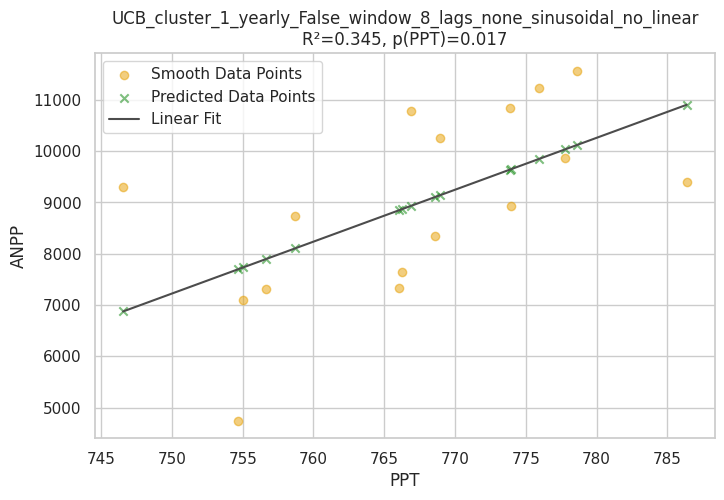

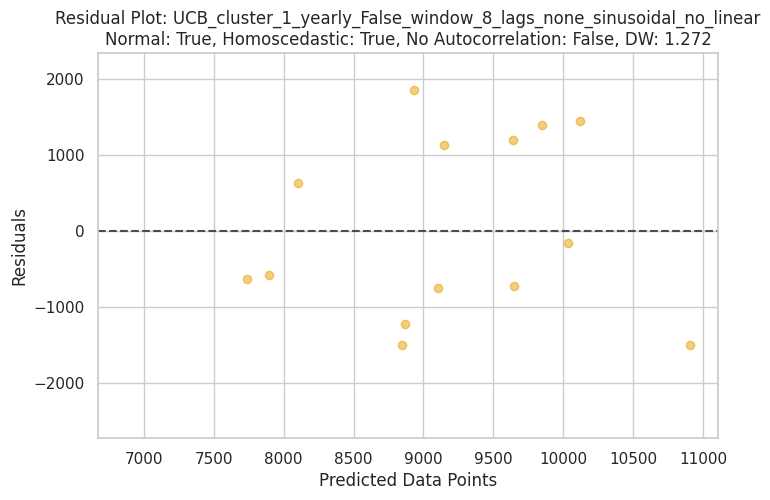

Min values:
 PPT      746.550000
ANPP    4742.746223
year    2005.000000
dtype: float64

Max values:
 PPT       786.359625
ANPP    11569.033063
year     2013.000000
dtype: float64
Min values:
 year                       2005
site.code                   UCB
type                  Croplands
Crop                    Alfalfa
Cereal                   Cereal
MAP                 1068.967476
ANPP                1792.444652
PPT                     700.022
WUE                    2.152745
ANPP_transformed      42.337273
WUE_transformed        1.148274
Cluster                       1
dtype: object

Max values:
 year                       2013
site.code                   UCB
type                    Pasture
Crop                Switchgrass
Cereal                  Pasture
MAP                 1068.967476
ANPP                20765.96329
PPT                     832.632
WUE                   26.322022
ANPP_transformed     144.104002
WUE_transformed        3.307693
Cluster                       1
dtype: obje

In [175]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=ucb_clusters[1],
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=False,
    window_size=8,
    analysis_name='UCB_cluster_1_yearly_False_window_8_lags_none_sinusoidal_no_linear',
    plot_name='TG',
    show_plot=True,
    lags=None,
    use_sinusoidal=False,
    cycle_period=6,
    is_run_quadratic=False,
    is_piecewise=False,
    is_spline=False,
)

find_min_max(data)
find_min_max(ucb_clusters[1])


IQR Method for ANPP:
Q1: 5631.76, Q3: 12186.12, IQR: 6554.36
Lower Bound: -4199.78, Upper Bound: 22017.67
Number of IQR outliers: 0
Range of IQR outliers: None


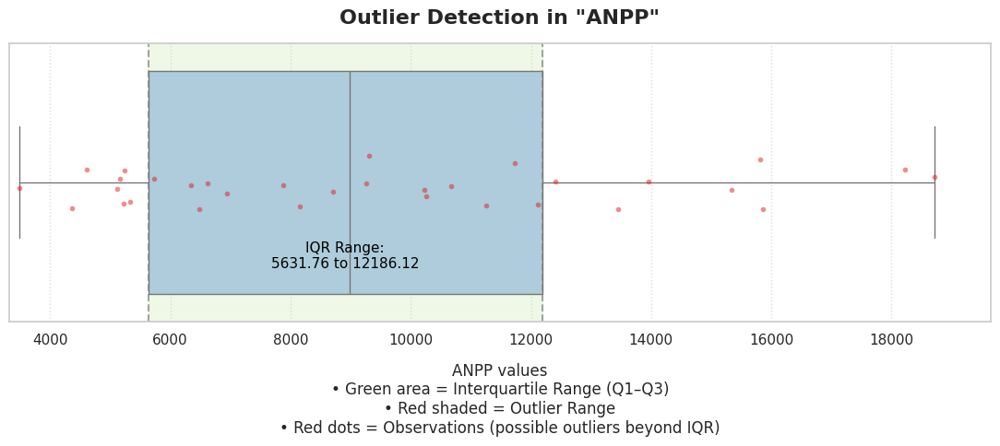

Unique values in 'site.code':
Crop
Soybean         12
Maize           11
Winter_Wheat     9
Name: count, dtype: int64


In [176]:
df_unfiltered_kbs = df.copy()
df_kbs = filter_df(df_unfiltered_kbs, 'site.code', 'KBS')

df_kbs_transformed, df_kbs_transformed_info = transform_dataframe(df_kbs, ['ANPP', 'WUE'])

df_kbs_outliers = detect_outliers(df_kbs, 'ANPP')
df_kbs_processed = df_kbs_outliers['cleaned_df']

df_kbs_outliers = df_kbs_outliers['iqr_outliers']

len(df_kbs_outliers)

print("Unique values in 'site.code':")
print(df_kbs['Crop'].value_counts())

Starting analysis for ANPP with predictor PPT


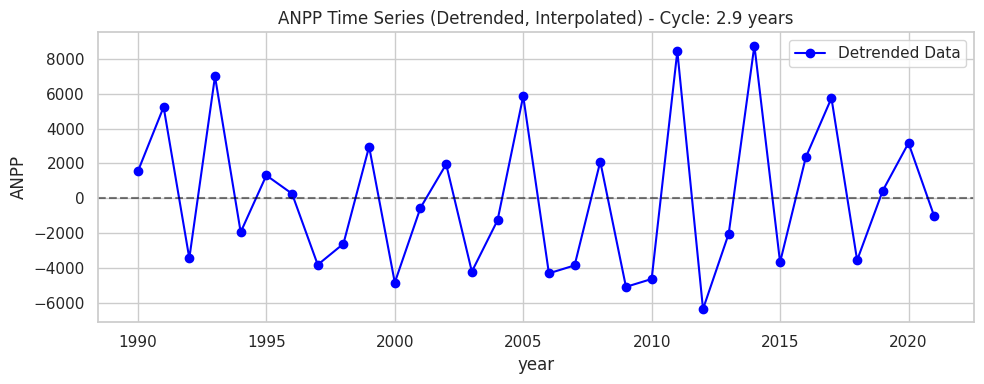

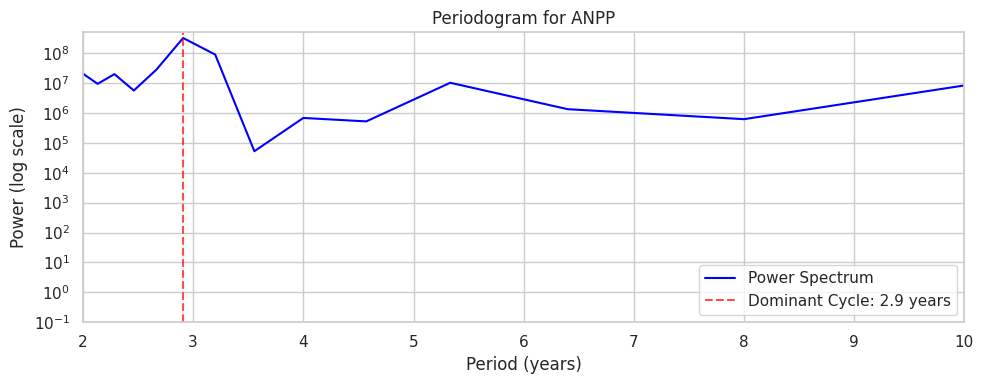

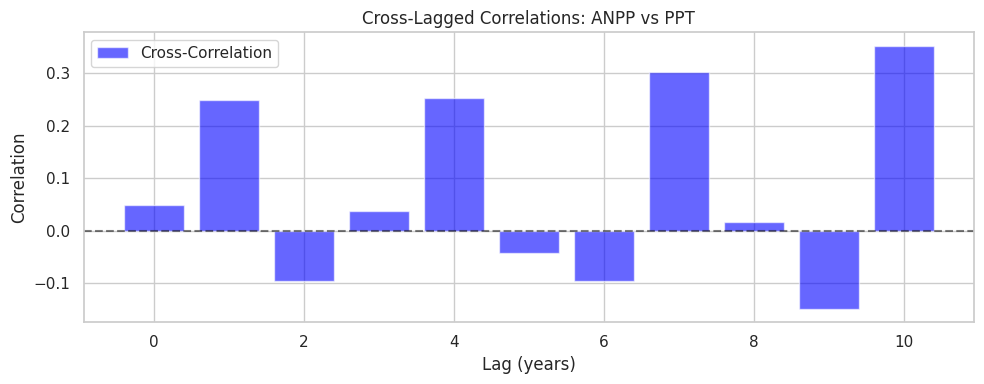

ANPP Results:
Dominant cycle detected at 2.9-year period. No significant autocorrelation detected (lags 1–10). No significant cross-lagged effects (ANPP vs. PPT) detected (lags 0–10).
Starting analysis for PPT with predictor None


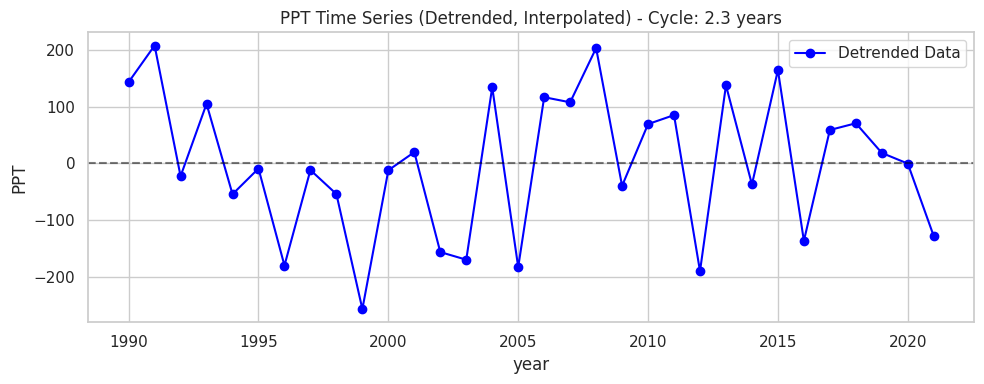

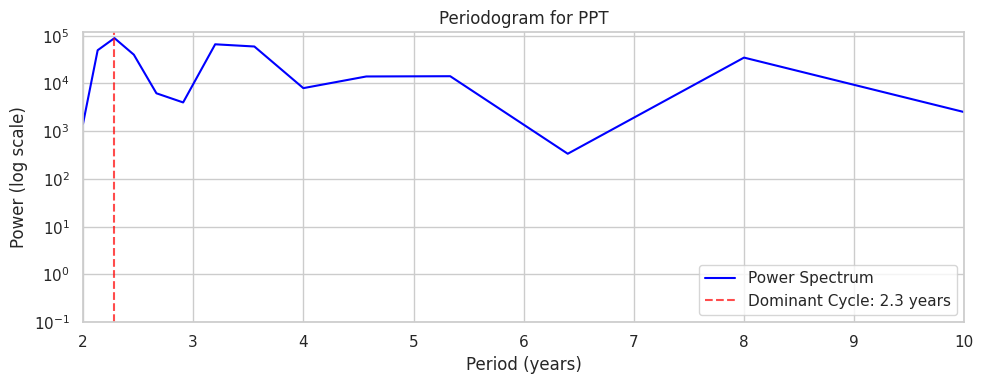

PPT Results:
Dominant cycle detected at 2.3-year period. No significant autocorrelation detected (lags 1–10).


In [177]:
anpp_result = run_time_series_analysis(df_kbs_processed, 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(df_kbs_processed, 'PPT', None, plot=True)

In [178]:
pearson_corr, spearman_corr = compute_correlation(df_kbs, 'ANPP', 'PPT', 'KBS')


Correlation between ANPP and PPT - KBS (Pearson): 0.09839979170311314
Correlation between ANPP and PPT - KBS (Spearman): 0.13416422287390029


In [179]:
top_models_kbs = run_and_save_models(
    df=df_kbs,
    analysis_name='KBS',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise', 'spline'],
    window_size=range(1, 11),
    lags=[None],
    cycle_period=2.3,
    show_plot=False,
    show_aic_bic=False
)

quadratic No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
piecewise No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
spline No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).


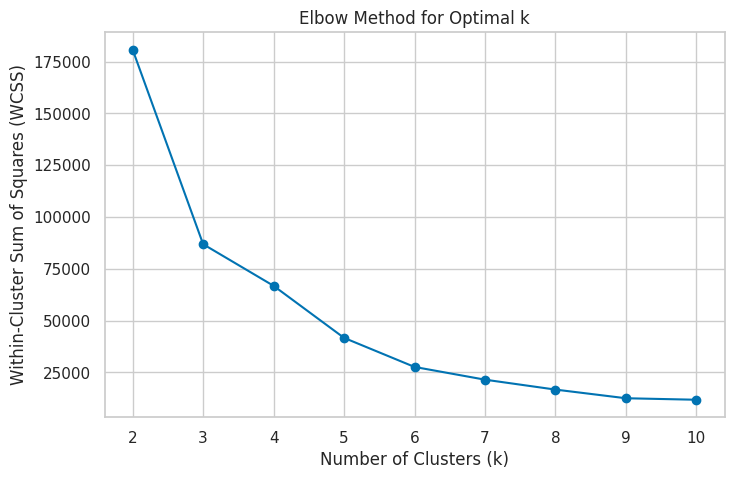

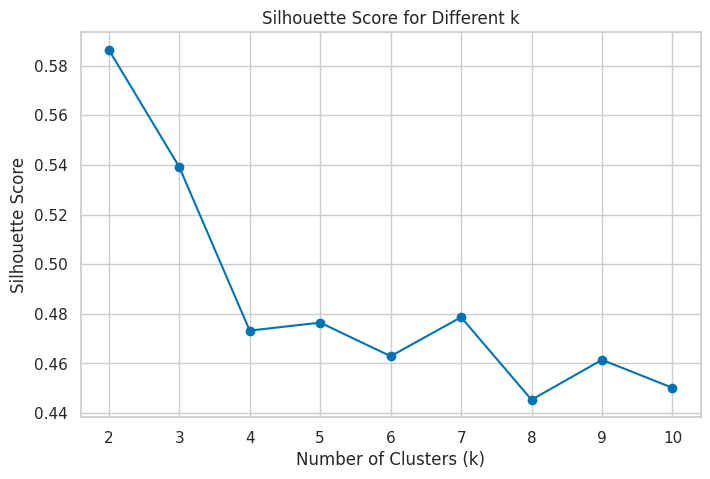

K-means Performance
Silhouette Score: 0.539


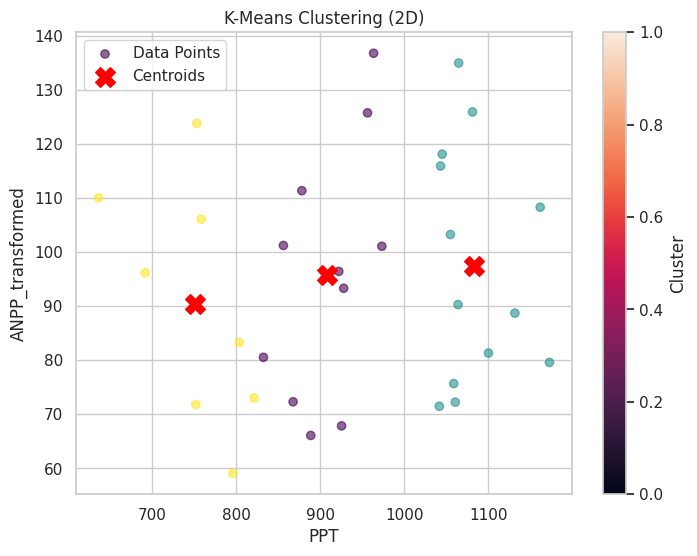


Cluster Summary (Mean Values):
                 PPT         ANPP
Cluster                          
0         908.208936  9647.852246
1        1082.939231  9918.221477
2         751.514475  8611.376192
Unique clusters - KBS: [0 1 2]

Cluster 0 DataFrame:
Number of observations: 11
Pearson Correlation between ANPP and PPT - KBS (cluster 0): 0.5255245332861367


Spearman Correlation between ANPP and PPT - KBS (cluster 0): 0.3727272727272728



Cluster 1 DataFrame:
Number of observations: 13
Pearson Correlation between ANPP and PPT - KBS (cluster 1): -0.15807354471206655


Spearman Correlation between ANPP and PPT - KBS (cluster 1): 0.07142857142857142



Cluster 2 DataFrame:
Number of observations: 8
Pearson Correlation between ANPP and PPT - KBS (cluster 2): -0.5452139262485997


Spearman Correlation between ANPP and PPT - KBS (cluster 2): -0.4523809523809524




In [180]:
columns_transformed = ['PPT', 'ANPP_transformed']
columns_untransformed = ['PPT', 'ANPP']
OPTIMAL_K = 3
K_RANGE = range(2, 11)

df_kbs_k_means, kbs_clusters, kbs_cluster_summary = run_clustering_and_correlations(df_kbs_transformed, 'KBS', \
                                                                columns_transformed, columns_untransformed, K_RANGE, OPTIMAL_K)

## **TG**


IQR Method for ANPP:
Q1: 1106.82, Q3: 3235.37, IQR: 2128.55
Lower Bound: -2086.00, Upper Bound: 6428.20
Number of IQR outliers: 0
Range of IQR outliers: None


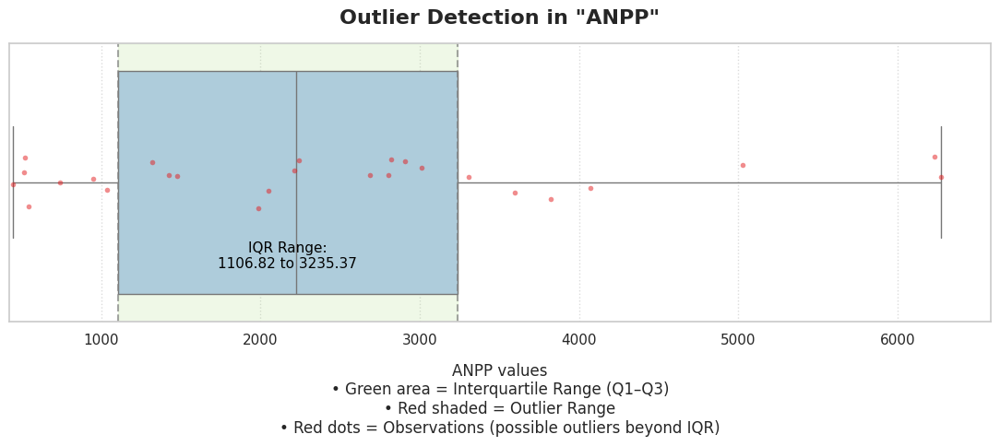

Unique values in 'site.code':
Crop
Switchgrass    13
Range          13
Name: count, dtype: int64


In [181]:
df_unfiltered_TG = df.copy()
df_TG = filter_df(df_unfiltered_TG, 'site.code', 'TG')

df_TG_transformed, df_TG_transformed_info = transform_dataframe(df_TG, ['ANPP', 'WUE'])

df_TG_outliers = detect_outliers(df_TG, 'ANPP')
df_TG_processed = df_TG_outliers['cleaned_df']

df_TG_outliers = df_TG_outliers['iqr_outliers']

len(df_TG_outliers)

df_TG_outliers.head(1)


print("Unique values in 'site.code':")
print(df_TG['Crop'].value_counts())



Starting analysis for ANPP with predictor PPT


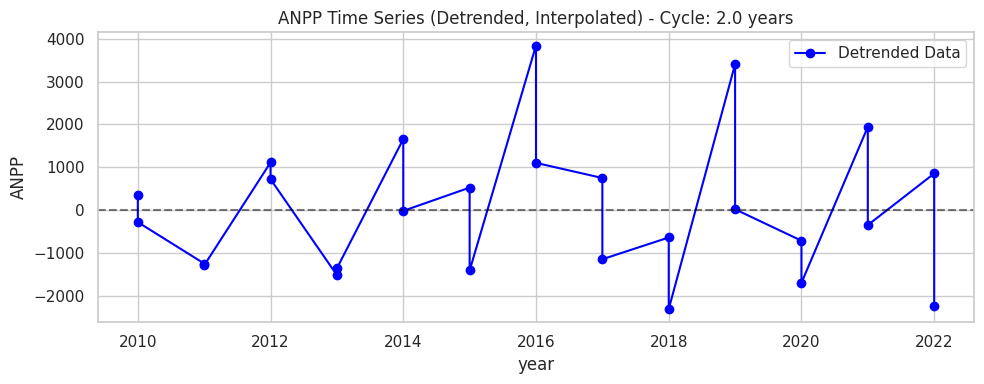

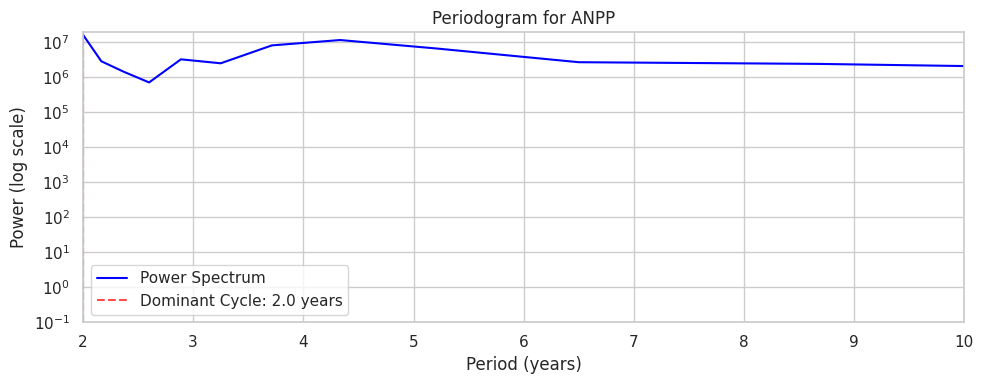

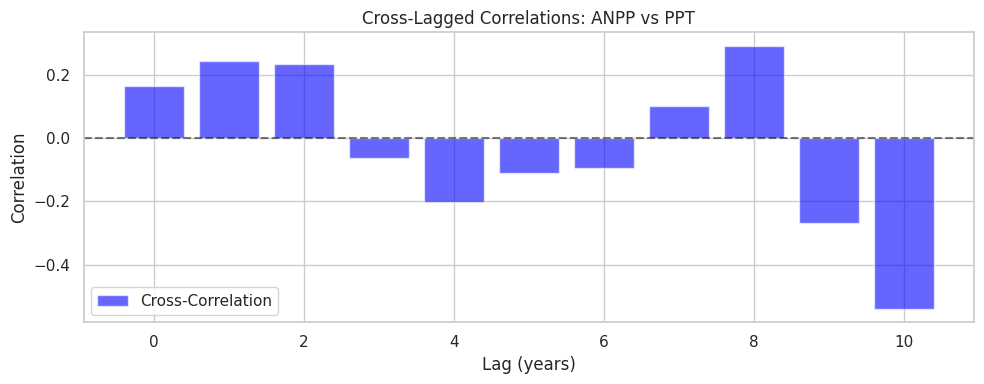

ANPP Results:
Dominant cycle detected at 2.0-year period. No significant autocorrelation detected (lags 1–10). No significant cross-lagged effects (ANPP vs. PPT) detected (lags 0–10).
Starting analysis for PPT with predictor None


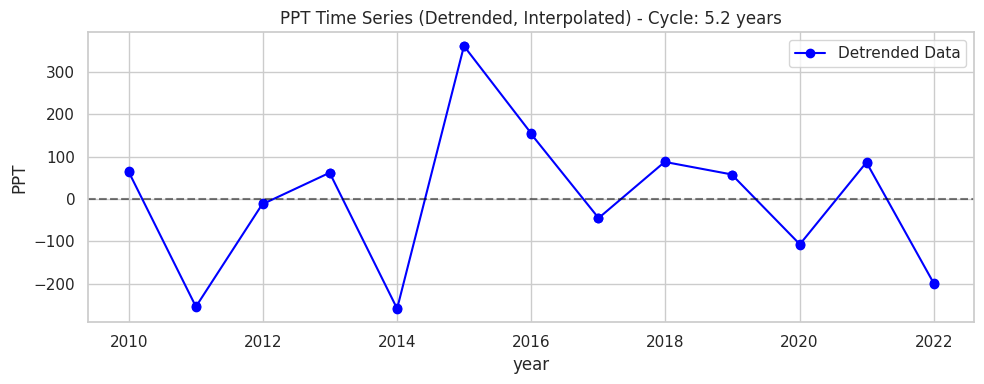

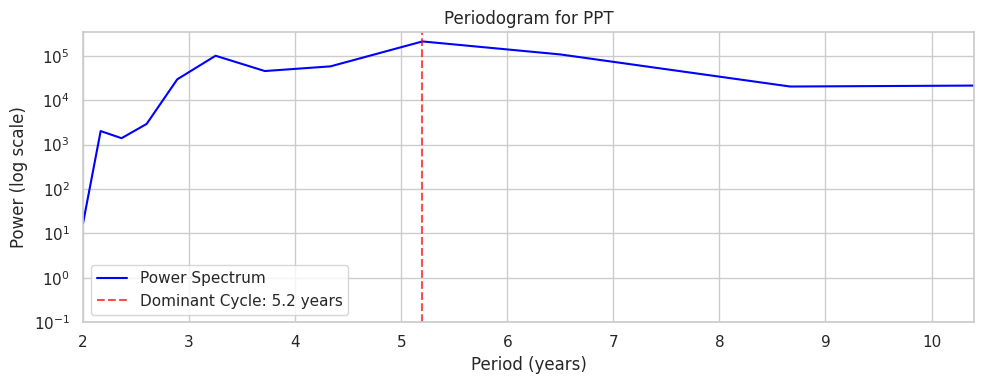

PPT Results:
Dominant cycle detected at 5.2-year period. No significant autocorrelation detected (lags 1–10).


In [182]:
anpp_result = run_time_series_analysis(df_TG_processed, 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(df_TG_processed, 'PPT', None, plot=True)



In [183]:
pearson_corr, spearman_corr = compute_correlation(df_TG, 'ANPP', 'PPT', 'TG')

Correlation between ANPP and PPT - TG (Pearson): 0.1776989238117912
Correlation between ANPP and PPT - TG (Spearman): 0.23025583918608866


In [184]:
top_models_TG = run_and_save_models(
    df=df_TG,
    analysis_name='TG',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise'],
    window_size=range(1, 11),
    lags=[None],
    cycle_period=5.2,
    show_plot=False,
    show_aic_bic=False
)

Skipping TG_yearly_True_window_7_lags_none_sinusoidal_no_linear: Window size 7 too large for 13 rows.
Skipping TG_yearly_True_window_7_lags_none_sinusoidal_yes_linear: Window size 7 too large for 13 rows.
Skipping TG_yearly_True_window_8_lags_none_sinusoidal_no_linear: Window size 8 too large for 13 rows.
Skipping TG_yearly_True_window_8_lags_none_sinusoidal_yes_linear: Window size 8 too large for 13 rows.
Skipping TG_yearly_True_window_9_lags_none_sinusoidal_no_linear: Window size 9 too large for 13 rows.
Skipping TG_yearly_True_window_9_lags_none_sinusoidal_yes_linear: Window size 9 too large for 13 rows.
Skipping TG_yearly_True_window_10_lags_none_sinusoidal_no_linear: Window size 10 too large for 13 rows.
Skipping TG_yearly_True_window_10_lags_none_sinusoidal_yes_linear: Window size 10 too large for 13 rows.
Skipping TG_yearly_True_window_7_lags_none_sinusoidal_no_quadratic: Window size 7 too large for 13 rows.
Skipping TG_yearly_True_window_7_lags_none_sinusoidal_yes_quadratic: Wi

Predictors in plot_model: ['PPT', 'sin_cycle', 'cos_cycle']


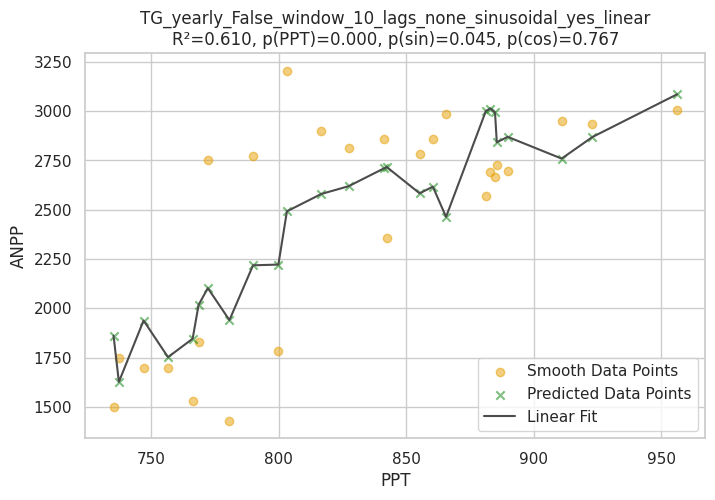

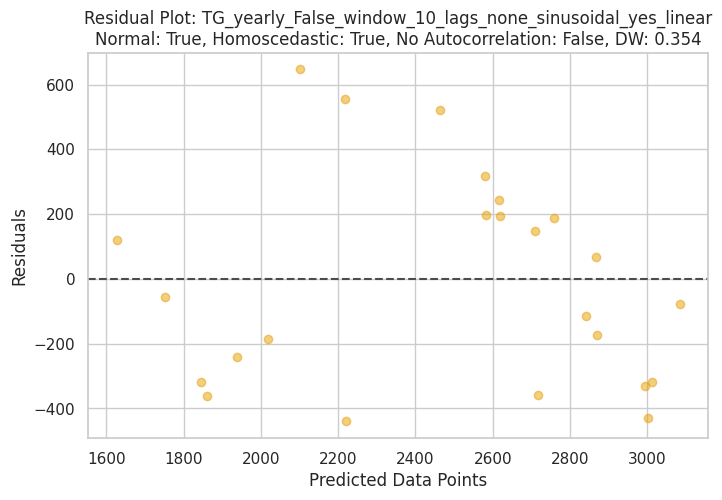

Min values:
 PPT           735.262000
ANPP         1429.343168
year         2010.000000
sin_cycle      -0.866025
cos_cycle      -1.000000
dtype: float64

Max values:
 PPT           956.300000
ANPP         3204.611366
year         2022.000000
sin_cycle       0.866025
cos_cycle       1.000000
dtype: float64
Min values:
 year               2010
site.code            TG
type            Pasture
Crop              Range
Cereal          Pasture
MAP          913.819249
ANPP         444.493814
PPT              559.29
WUE            0.480846
dtype: object

Max values:
 year                2022
site.code             TG
type          Rangelands
Crop         Switchgrass
Cereal             Range
MAP           913.819249
ANPP         6272.753735
PPT              1188.65
WUE             6.952267
dtype: object


In [185]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=df_TG,
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=False,
    window_size=10,
    analysis_name='TG_yearly_False_window_10_lags_none_sinusoidal_yes_linear',
    plot_name='TG',
    show_plot=True,
    lags=None,
    use_sinusoidal=True,
    cycle_period=6,
    is_run_quadratic=False,
    is_piecewise=False,
    is_spline=False,
)

find_min_max(data)
find_min_max(df_TG)

Predictors in plot_model: ['PPT', 'quadratic']


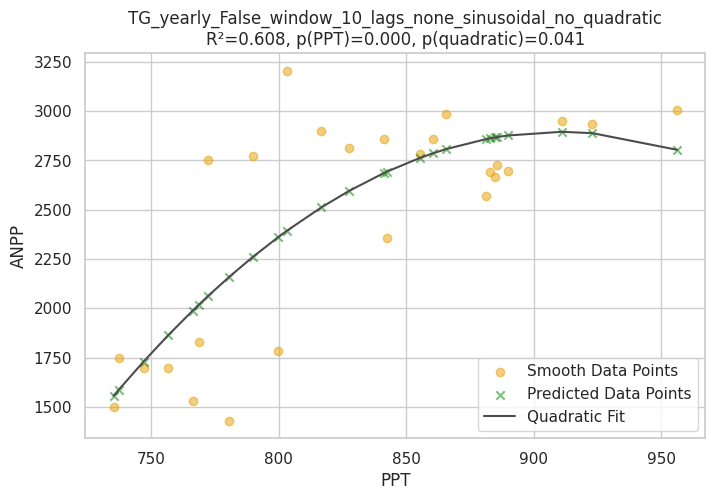

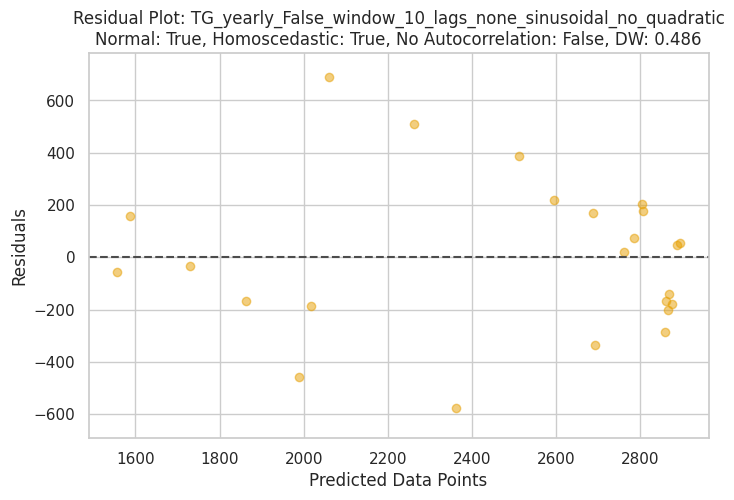

In [186]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=df_TG,
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=False,
    window_size=10,
    analysis_name='TG_yearly_False_window_10_lags_none_sinusoidal_no_quadratic',
    plot_name='TG',
    show_plot=True,
    lags=None,
    use_sinusoidal=False,
    cycle_period=0,
    is_run_quadratic=True,
    is_piecewise=False,
    is_spline=False,
)

Predictors in plot_model: ['PPT', 'segment']


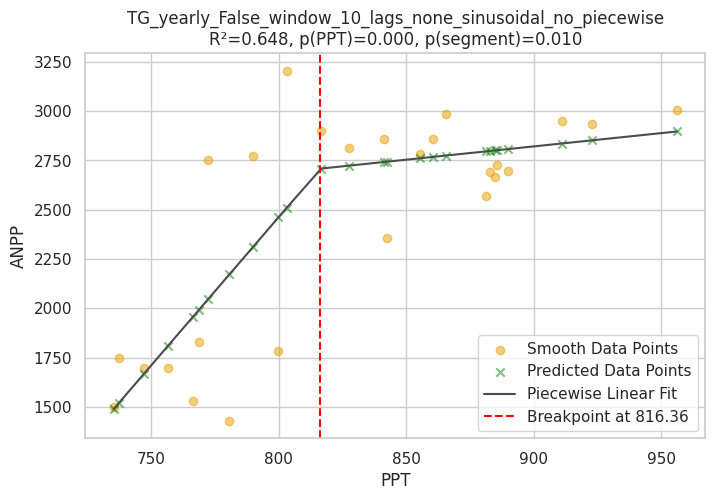

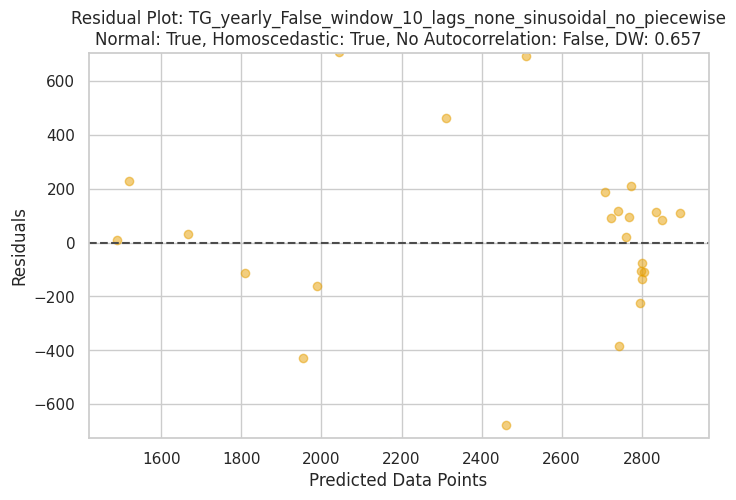

In [187]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=df_TG,
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=False,
    window_size=10,
    analysis_name='TG_yearly_False_window_10_lags_none_sinusoidal_no_piecewise',
    plot_name='TG',
    show_plot=True,
    lags=None,
    use_sinusoidal=False,
    cycle_period=0,
    is_run_quadratic=False,
    is_piecewise=True,
    is_spline=False,
)



## **NP**


IQR Method for ANPP:
Q1: 4845.73, Q3: 7220.82, IQR: 2375.09
Lower Bound: 1283.09, Upper Bound: 10783.46
Number of IQR outliers: 0
Range of IQR outliers: None


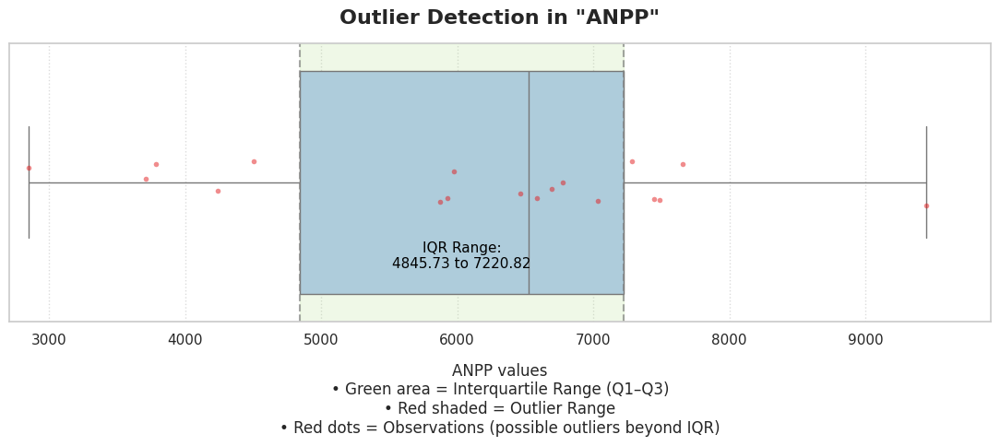

Unique values in 'site.code':
Crop
Spring_Wheat    18
Name: count, dtype: int64


In [188]:
df_unfiltered_NP = df.copy()
df_NP = filter_df(df_unfiltered_NP, 'site.code', 'NP')

df_NP_transformed, df_NP_transformed_info = transform_dataframe(df_NP, ['ANPP', 'WUE'])

df_NP_outliers = detect_outliers(df_NP, 'ANPP')
df_NP_processed = df_NP_outliers['cleaned_df']

df_NP_outliers = df_NP_outliers['iqr_outliers']

len(df_NP_outliers)

df_NP_outliers.head(12)


print("Unique values in 'site.code':")
print(df_NP['Crop'].value_counts())

In [189]:
pearson_corr, spearman_corr = compute_correlation(df_NP, 'ANPP', 'PPT', 'NP')

Correlation between ANPP and PPT - NP (Pearson): 0.2329236451859258
Correlation between ANPP and PPT - NP (Spearman): 0.17234262125902994


In [190]:
top_models_NP = run_and_save_models(
    df=df_NP,
    analysis_name='NP',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise', 'spline'],
    window_size=range(1, 11),
    lags=[None],
    cycle_period=0,
    show_plot=False,
    show_aic_bic=False
)

Skipping NP_yearly_False_window_10_lags_none_sinusoidal_no_linear: Window size 10 too large for 18 rows.
Skipping NP_yearly_True_window_10_lags_none_sinusoidal_no_linear: Window size 10 too large for 18 rows.
Skipping NP_yearly_False_window_10_lags_none_sinusoidal_no_quadratic: Window size 10 too large for 18 rows.
Skipping NP_yearly_True_window_10_lags_none_sinusoidal_no_quadratic: Window size 10 too large for 18 rows.
Skipping NP_yearly_False_window_10_lags_none_sinusoidal_no_piecewise: Window size 10 too large for 18 rows.
Skipping NP_yearly_True_window_10_lags_none_sinusoidal_no_piecewise: Window size 10 too large for 18 rows.
piecewise No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
Skipping NP_yearly_False_window_10_lags_none_sinusoidal_no_spline: Window size 10 too large for 18 rows.
Skipping NP_yearly_True_window_10_lags_none_sinusoidal_no_spline: Window size 10 too large for 18 rows.
spline No models meet the 

Predictors in plot_model: ['PPT']


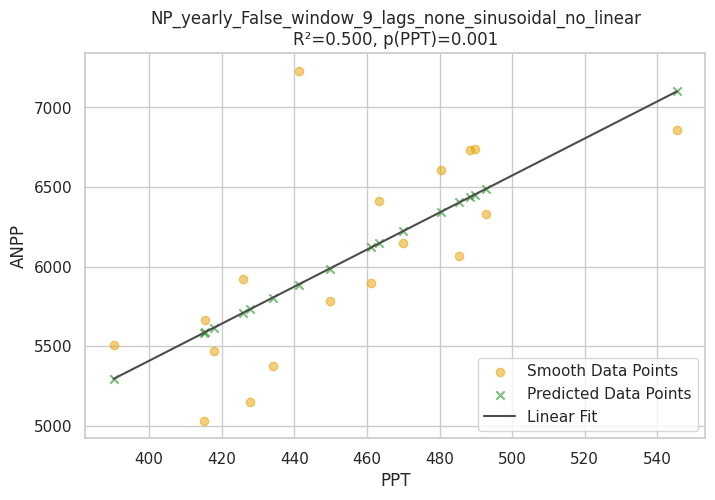

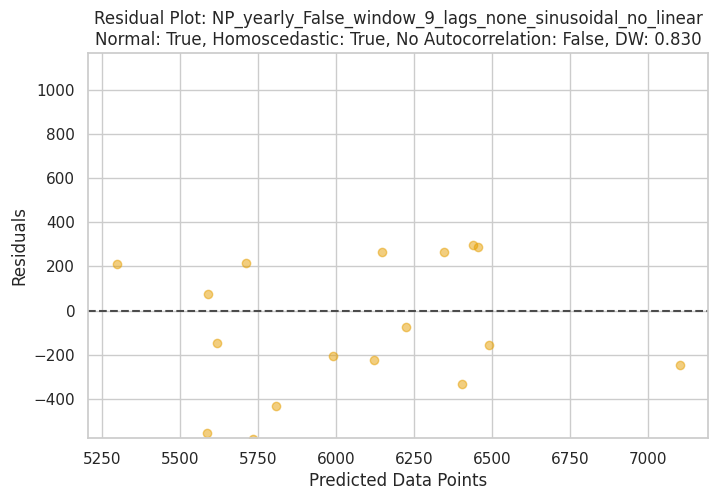

Min values:
 PPT      390.211111
ANPP    5032.586988
year    1994.000000
dtype: float64

Max values:
 PPT      545.460000
ANPP    7230.606588
year    2011.000000
dtype: float64
Min values:
 year                 1994
site.code              NP
type            Croplands
Crop         Spring_Wheat
Cereal             Cereal
MAP            447.119999
ANPP           2849.49705
PPT                 229.8
WUE              5.851803
dtype: object

Max values:
 year                 2011
site.code              NP
type            Croplands
Crop         Spring_Wheat
Cereal             Cereal
MAP            447.119999
ANPP          9449.197243
PPT                 724.1
WUE             25.733108
dtype: object


In [191]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=df_NP,
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=False,
    window_size=9,
    analysis_name='NP_yearly_False_window_9_lags_none_sinusoidal_no_linear',
    plot_name='NP',
    show_plot=True,
    lags=None,
    use_sinusoidal=False,
    cycle_period=0,
    is_run_quadratic=False,
    is_piecewise=False,
    is_spline=False,
)

find_min_max(data)
find_min_max(df_NP)


IQR Method for ANPP:
Q1: 7901.57, Q3: 22214.09, IQR: 14312.52
Lower Bound: -13567.21, Upper Bound: 43682.87
Number of IQR outliers: 0
Range of IQR outliers: None


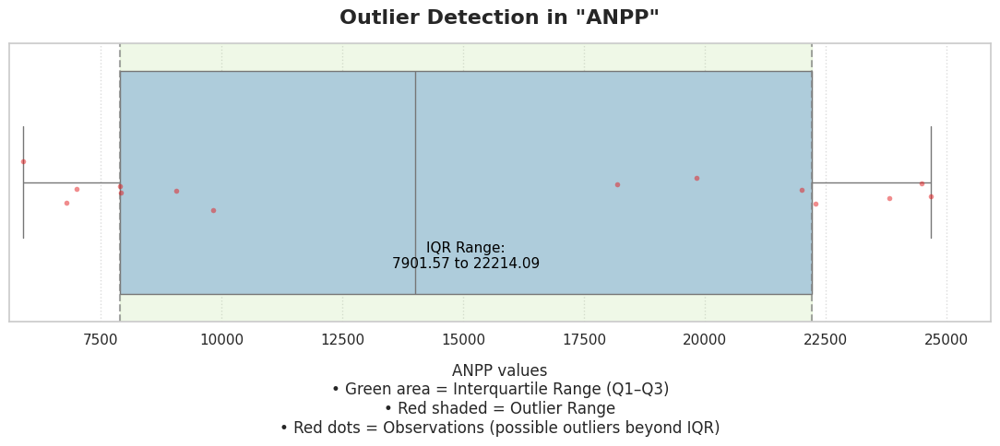

Unique values in 'site.code':
Crop
Maize      7
Soybean    7
Name: count, dtype: int64


In [192]:
df_unfiltered_UMRB = df.copy()
df_UMRB = filter_df(df_unfiltered_UMRB, 'site.code', 'UMRB')

df_UMRB_transformed, df_UMRB_transformed_info = transform_dataframe(df_UMRB, ['ANPP', 'WUE'])

df_UMRB_outliers = detect_outliers(df_UMRB, 'ANPP')
df_UMRB_processed = df_UMRB_outliers['cleaned_df']

df_UMRB_outliers = df_UMRB_outliers['iqr_outliers']

len(df_UMRB_outliers)


print("Unique values in 'site.code':")
print(df_UMRB['Crop'].value_counts())

In [193]:
len(df_UMRB)

14

In [194]:
pearson_corr, spearman_corr = compute_correlation(df_UMRB, 'ANPP', 'PPT', 'UMRB')

Correlation between ANPP and PPT - UMRB (Pearson): 0.07712361932821087
Correlation between ANPP and PPT - UMRB (Spearman): 0.02857142857142857


In [195]:
top_models_UMRB = run_and_save_models(
    df=df_UMRB,
    analysis_name='UMRB',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise'],
    window_size=range(1, 4),
    lags=[None],
    cycle_period=0,
    show_plot=False,
    show_aic_bic=False
)

linear No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
quadratic No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
piecewise No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).


## **JER**


IQR Method for ANPP:
Q1: 581.82, Q3: 1043.27, IQR: 461.45
Lower Bound: -110.36, Upper Bound: 1735.45
Number of IQR outliers: 1
Range of IQR outliers: (1974.47865, 1974.47865)


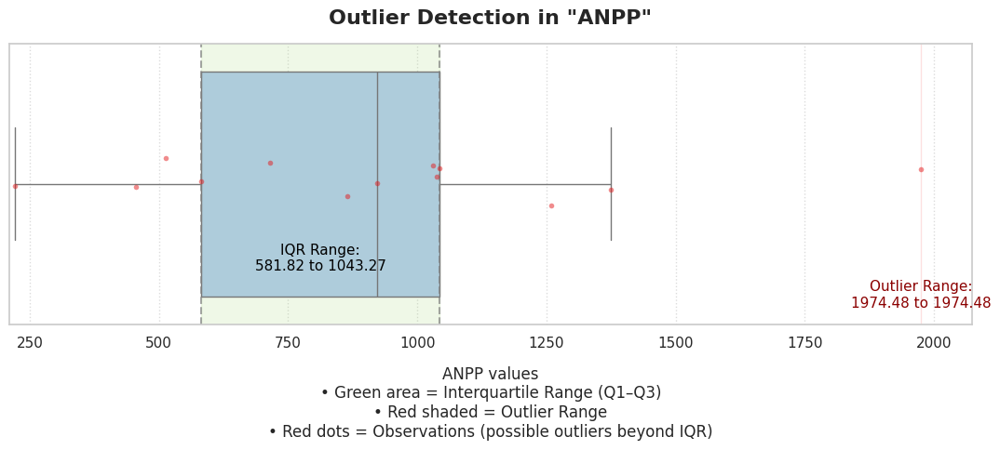

Unique values in 'site.code':
Crop
Range    13
Name: count, dtype: int64


In [196]:
df_unfiltered_JER = df.copy()
df_JER = filter_df(df_unfiltered_JER, 'site.code', 'JER')

df_JER_transformed, df_JER_transformed_info = transform_dataframe(df_JER, ['ANPP', 'WUE'])

df_JER_outliers = detect_outliers(df_JER, 'ANPP')
df_JER_processed = df_JER_outliers['cleaned_df']

df_JER_outliers = df_JER_outliers['iqr_outliers']

len(df_JER_outliers)

df_JER_outliers.head(1)


print("Unique values in 'site.code':")
print(df_JER['Crop'].value_counts())

In [197]:
pearson_corr, spearman_corr = compute_correlation(df_JER, 'ANPP', 'PPT', 'JER')

Correlation between ANPP and PPT - JER (Pearson): 0.44271652080801344
Correlation between ANPP and PPT - JER (Spearman): 0.3516483516483516


In [198]:
top_models_JER = run_and_save_models(
    df=df_JER,
    analysis_name='JER',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise'],
    window_size=range(1, 4),
    lags=[None],
    cycle_period=0,
    show_plot=False,
    show_aic_bic=False
)

linear No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
quadratic No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
piecewise No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).


## **LCB**


IQR Method for ANPP:
Q1: 2910.46, Q3: 6827.79, IQR: 3917.33
Lower Bound: -2965.53, Upper Bound: 12703.78
Number of IQR outliers: 0
Range of IQR outliers: None


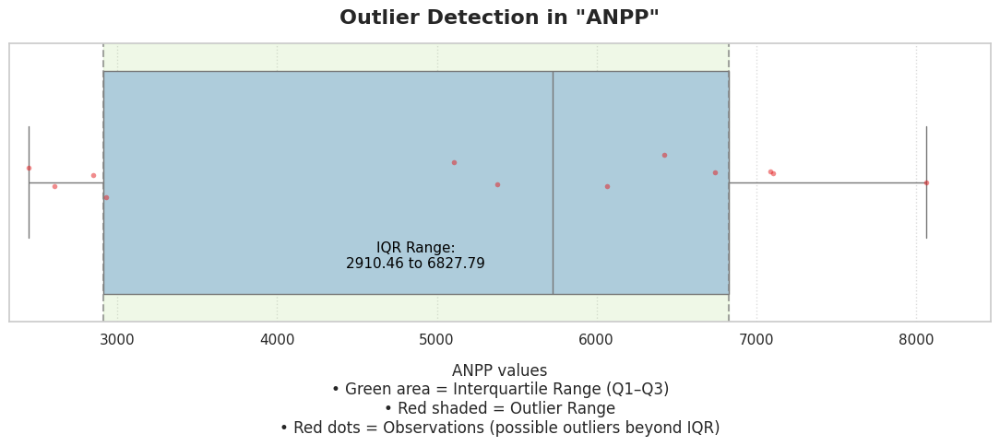

Unique values in 'site.code':
Crop
Winter_Wheat    10
Oats             2
Name: count, dtype: int64


In [199]:
df_unfiltered_LCB = df.copy()
df_LCB = filter_df(df_unfiltered_LCB, 'site.code', 'LCB')

df_LCB_transformed, df_LCB_transformed_info = transform_dataframe(df_LCB, ['ANPP', 'WUE'])

df_LCB_outliers = detect_outliers(df_LCB, 'ANPP')
df_LCB_processed = df_LCB_outliers['cleaned_df']

df_LCB_outliers = df_LCB_outliers['iqr_outliers']

df_LCB_outliers.head(12)

print("Unique values in 'site.code':")
print(df_LCB['Crop'].value_counts())

In [200]:
pearson_corr, spearman_corr = compute_correlation(df_LCB, 'ANPP', 'PPT', 'LCB')

Correlation between ANPP and PPT - LCB (Pearson): -0.5252800113601416
Correlation between ANPP and PPT - LCB (Spearman): -0.5288974835954515


In [201]:
top_models_LCB = run_and_save_models(
    df=df_LCB,
    analysis_name='LCB',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise'],
    window_size=range(1, 5),
    lags=[None],
    cycle_period=0,
    show_plot=False,
    show_aic_bic=False
)

quadratic No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
piecewise No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).


Predictors in plot_model: ['PPT']


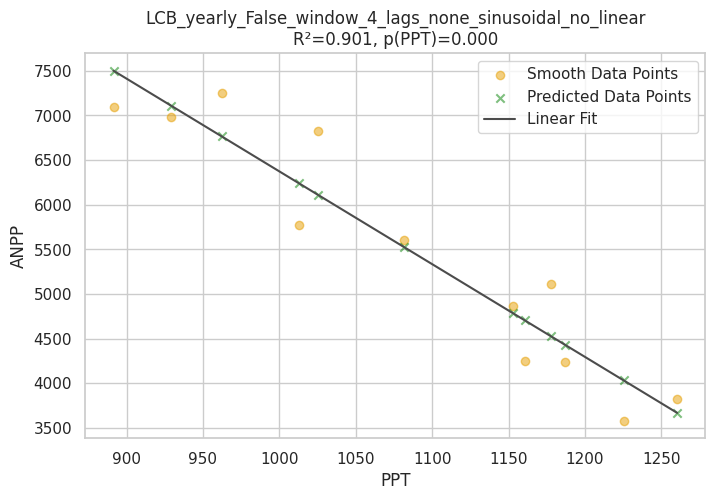

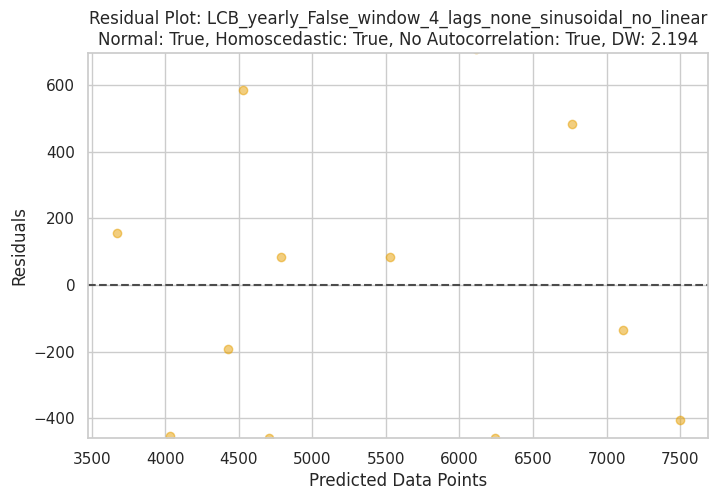

Min values:
 PPT      891.500000
ANPP    3580.935907
year    2002.000000
dtype: float64

Max values:
 PPT     1260.379661
ANPP    7249.346561
year    2019.000000
dtype: float64
Min values:
 year                2002
site.code            LCB
type           Croplands
Crop                Oats
Cereal            Cereal
MAP          1092.179499
ANPP           2445.0351
PPT                731.0
WUE             1.523876
dtype: object

Max values:
 year                 2019
site.code             LCB
type            Croplands
Crop         Winter_Wheat
Cereal             Cereal
MAP           1092.179499
ANPP          8064.792036
PPT           1604.483978
WUE              9.693935
dtype: object


In [202]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=df_LCB,
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=False,
    window_size=4,
    analysis_name='LCB_yearly_False_window_4_lags_none_sinusoidal_no_linear',
    plot_name='LCB',
    show_plot=True,
    lags=None,
    use_sinusoidal=False,
    cycle_period=0,
    is_run_quadratic=False,
    is_piecewise=False,
    is_spline=False,
)

find_min_max(data)
find_min_max(df_LCB)

# **Crop-Specific Analysis**

## **Alfalfa**


IQR Method for ANPP:
Q1: 2124.30, Q3: 2821.82, IQR: 697.52
Lower Bound: 1078.01, Upper Bound: 3868.11
Number of IQR outliers: 0
Range of IQR outliers: None


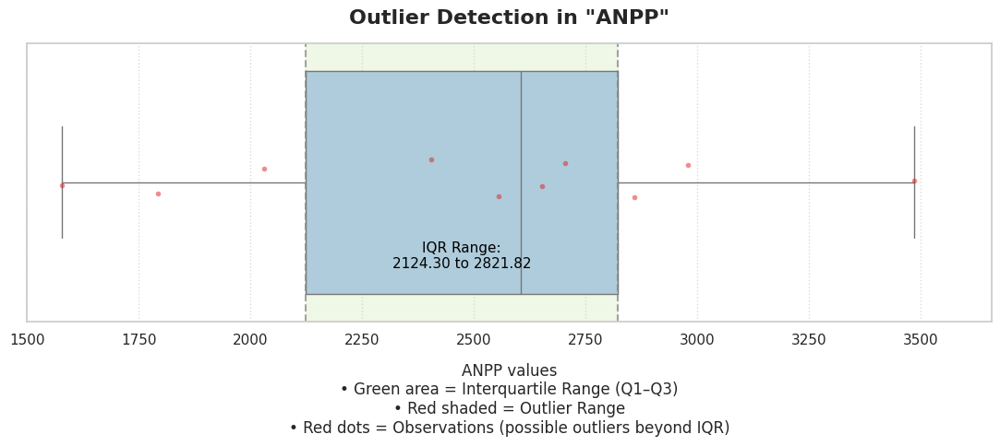

Unique values in 'site.code':
site.code
UCB    10
Name: count, dtype: int64


In [203]:
df_unfiltered_Alfalfa = df.copy()
df_Alfalfa = filter_df(df_unfiltered_Alfalfa, 'Crop', 'Alfalfa')

df_Alfalfa_transformed, df_Alfalfa_transformed_info = transform_dataframe(df_Alfalfa, ['ANPP', 'WUE'])

df_Alfalfa_outliers = detect_outliers(df_Alfalfa, 'ANPP')
df_Alfalfa_processed = df_Alfalfa_outliers['cleaned_df']

df_Alfalfa_outliers = df_Alfalfa_outliers['iqr_outliers']

len(df_Alfalfa_outliers)


print("Unique values in 'site.code':")
print(df_Alfalfa['site.code'].value_counts())



In [204]:
pearson_corr, spearman_corr = compute_correlation(df_Alfalfa, 'ANPP', 'PPT', 'Alfalfa')

Correlation between ANPP and PPT - Alfalfa (Pearson): -0.13281906852507558
Correlation between ANPP and PPT - Alfalfa (Spearman): -0.2606060606060606


In [205]:
top_models_Alfalfa = run_and_save_models(
    df=df_Alfalfa,
    analysis_name='Alfalfa',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise'],
    window_size=range(1, 4),
    lags=[None],
    cycle_period=0,
    show_plot=False,
    show_aic_bic=False
)

linear No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
quadratic No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
piecewise No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).


## **Spring Wheat**


IQR Method for ANPP:
Q1: 5413.39, Q3: 7111.54, IQR: 1698.15
Lower Bound: 2866.17, Upper Bound: 9658.77
Number of IQR outliers: 1
Range of IQR outliers: (2849.49705, 2849.49705)


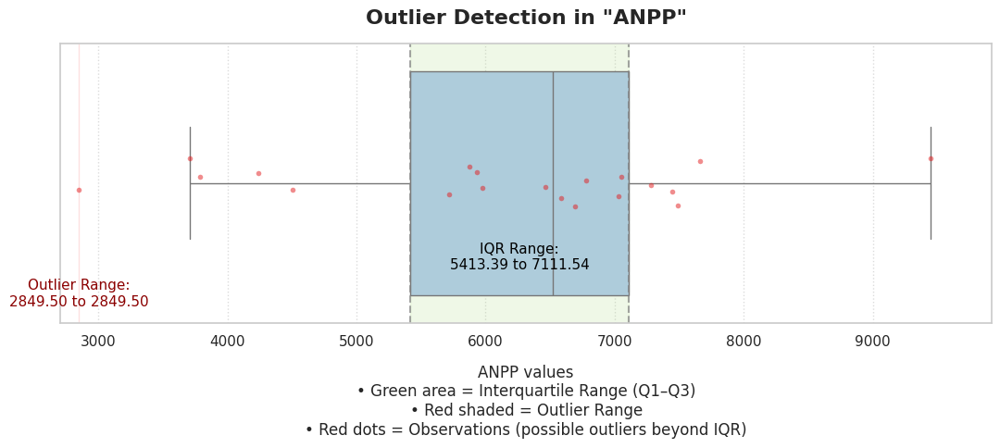

Unique values in 'site.code':
site.code
NP     18
CAF     2
Name: count, dtype: int64


In [206]:
df_unfiltered_Spring_Wheat = df.copy()
df_Spring_Wheat = filter_df(df_unfiltered_Spring_Wheat, 'Crop', 'Spring_Wheat')

df_Spring_Wheat_transformed, df_Spring_Wheat_transformed_info = transform_dataframe(df_Spring_Wheat, ['ANPP', 'WUE'])

df_Spring_Wheat_outliers = detect_outliers(df_Spring_Wheat, 'ANPP')
df_Spring_Wheat_processed = df_Spring_Wheat_outliers['cleaned_df']

df_Spring_Wheat_outliers = df_Spring_Wheat_outliers['iqr_outliers']

len(df_Spring_Wheat_outliers)

df_Spring_Wheat_outliers.head(1)


print("Unique values in 'site.code':")
print(df_Spring_Wheat['site.code'].value_counts())




Starting analysis for ANPP with predictor PPT


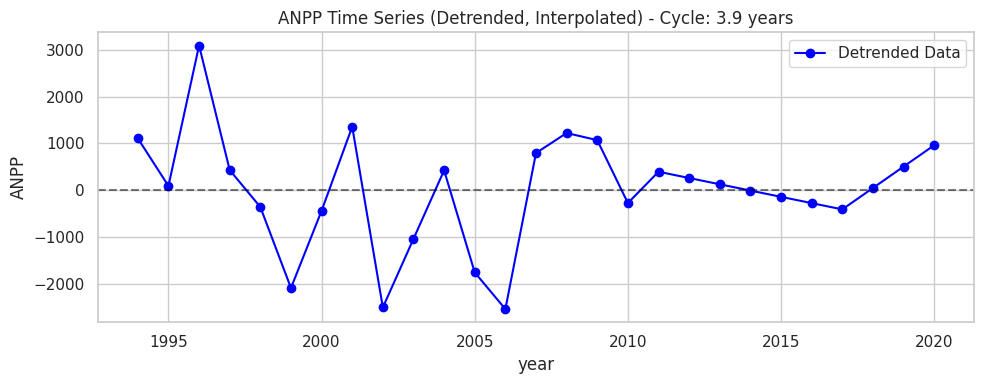

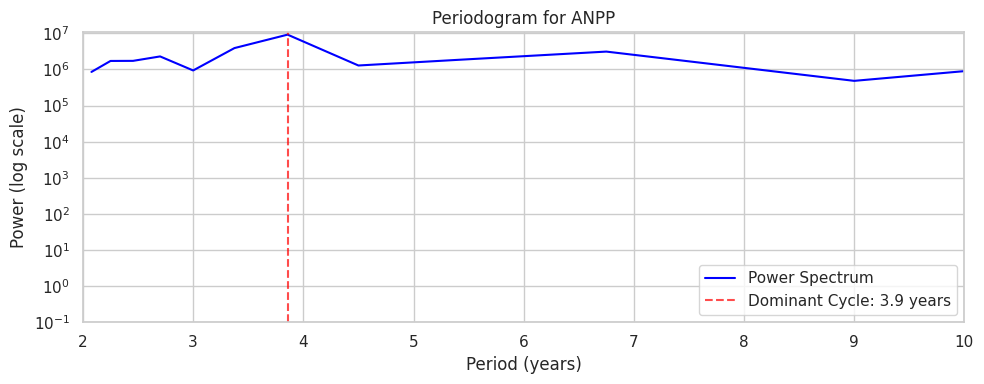

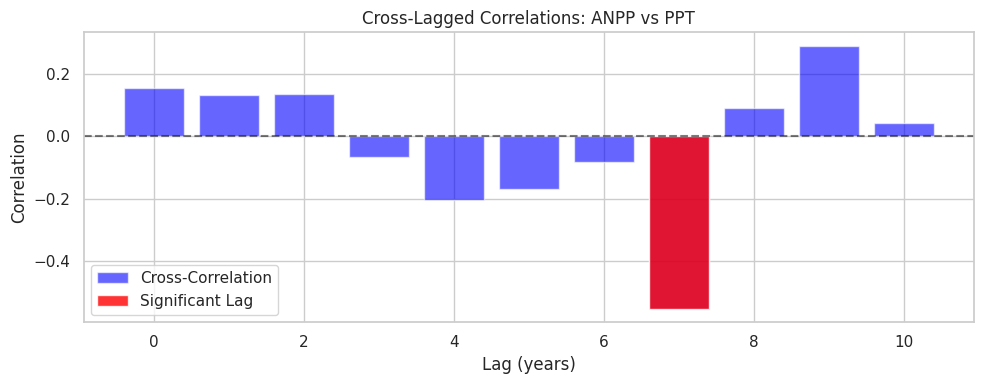

ANPP Results:
Dominant cycle detected at 3.9-year period. No significant autocorrelation detected (lags 1–10). Significant cross-lagged effects (ANPP vs. PPT) at lags: [7].
Starting analysis for PPT with predictor None


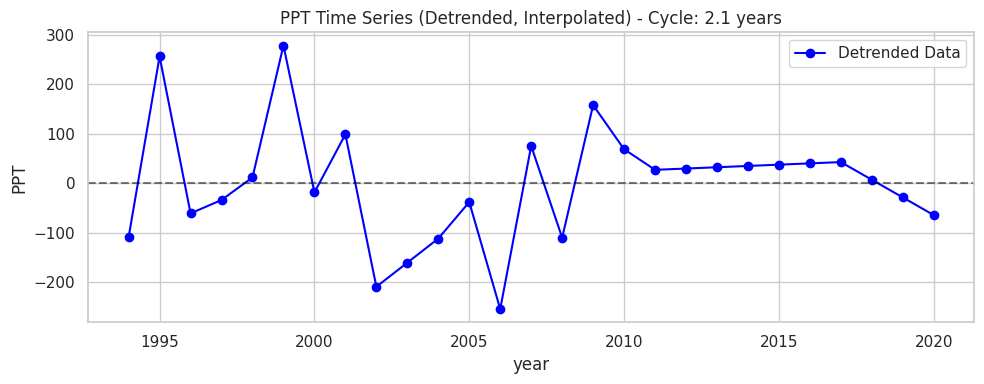

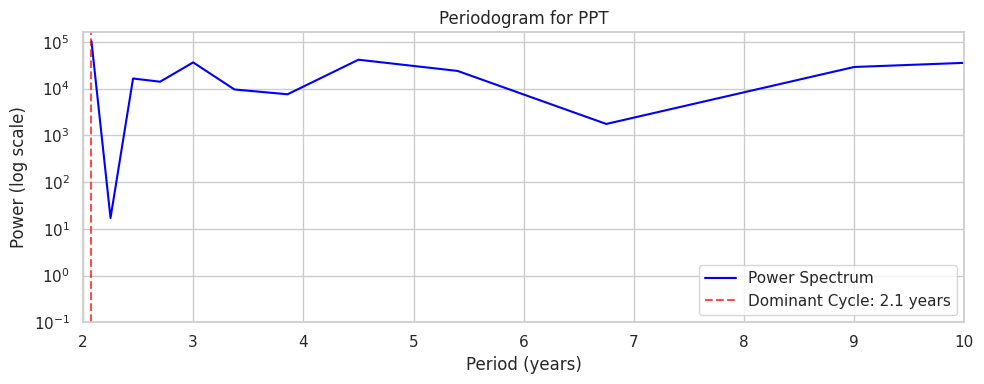

PPT Results:
Dominant cycle detected at 2.1-year period. No significant autocorrelation detected (lags 1–10).


In [207]:
anpp_result = run_time_series_analysis(df_Spring_Wheat_processed, 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(df_Spring_Wheat_processed, 'PPT', None, plot=True)

In [208]:
pearson_corr, spearman_corr = compute_correlation(df_Spring_Wheat, 'ANPP', 'PPT', 'Spring_Wheat')

Correlation between ANPP and PPT - Spring_Wheat (Pearson): 0.22176570916637
Correlation between ANPP and PPT - Spring_Wheat (Spearman): 0.12030075187969923


In [209]:
top_models_Spring_Wheat = run_and_save_models(
    df=df_Spring_Wheat,
    analysis_name='Spring_Wheat',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise', 'spline'],
    window_size=range(1, 11),
    lags=[None],
    cycle_period=2.1,
    show_plot=False,
    show_aic_bic=False
)

linear No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
quadratic No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
piecewise No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
spline No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).


## **Winter Wheat**


IQR Method for ANPP:
Q1: 5898.39, Q3: 8630.48, IQR: 2732.09
Lower Bound: 1800.25, Upper Bound: 12728.62
Number of IQR outliers: 0
Range of IQR outliers: None


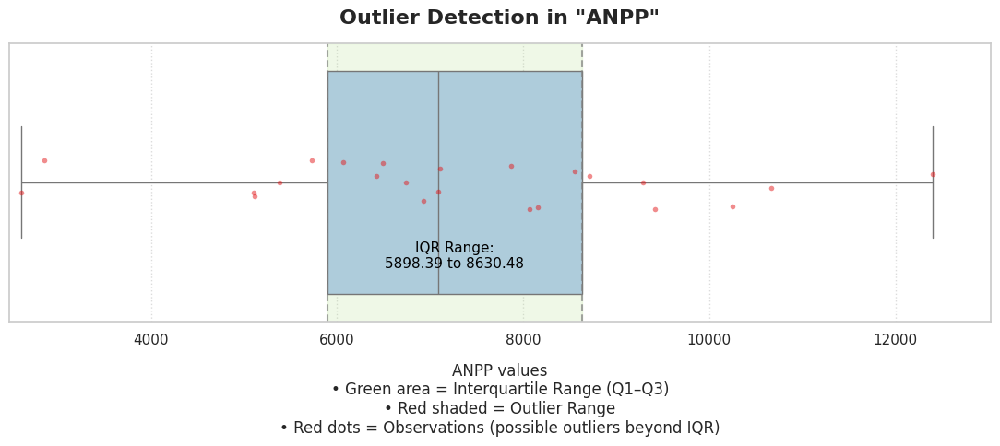

Unique values in 'site.code':
site.code
LCB    10
KBS     9
ECB     2
CAF     2
Name: count, dtype: int64


In [210]:
df_unfiltered_Winter_Wheat = df.copy()
df_Winter_Wheat = filter_df(df_unfiltered_Winter_Wheat, 'Crop', 'Winter_Wheat')

df_Winter_Wheat_transformed, df_Winter_Wheat_transformed_info = transform_dataframe(df_Winter_Wheat, ['ANPP', 'WUE'])

df_Winter_Wheat_outliers = detect_outliers(df_Winter_Wheat, 'ANPP')
df_Winter_Wheat_processed = df_Winter_Wheat_outliers['cleaned_df']

df_Winter_Wheat_outliers = df_Winter_Wheat_outliers['iqr_outliers']

len(df_Winter_Wheat_outliers)


print("Unique values in 'site.code':")
print(df_Winter_Wheat['site.code'].value_counts())

Starting analysis for ANPP with predictor PPT


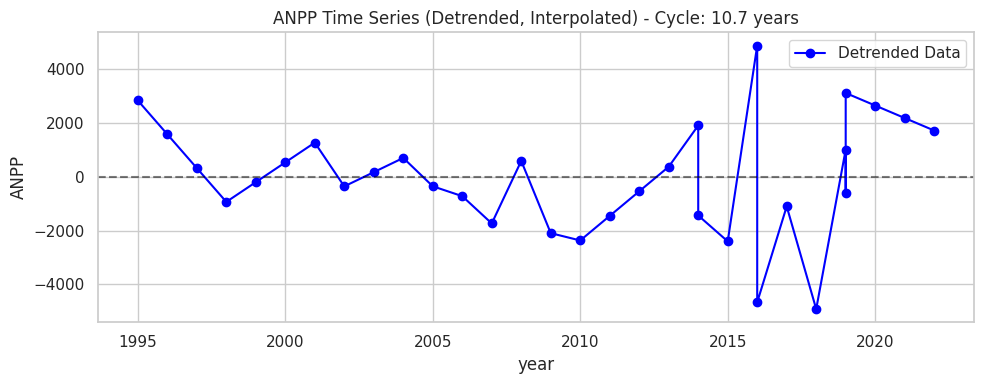

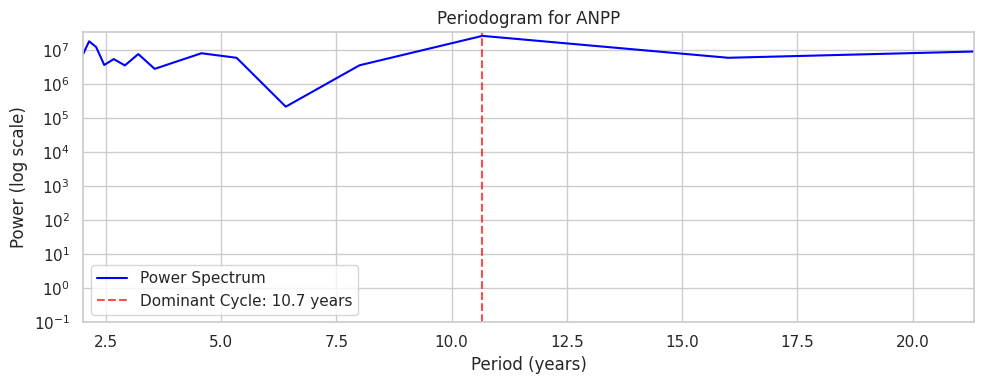

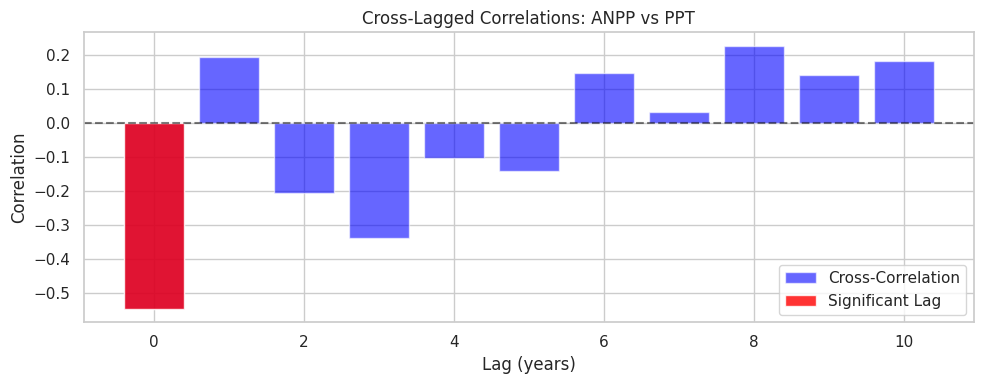

ANPP Results:
Dominant cycle detected at 10.7-year period. No significant autocorrelation detected (lags 1–10). Significant cross-lagged effects (ANPP vs. PPT) at lags: [0].
Starting analysis for PPT with predictor None


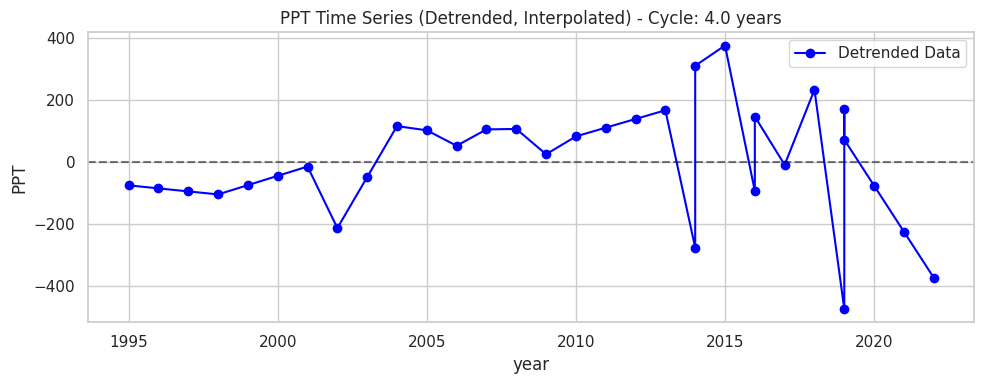

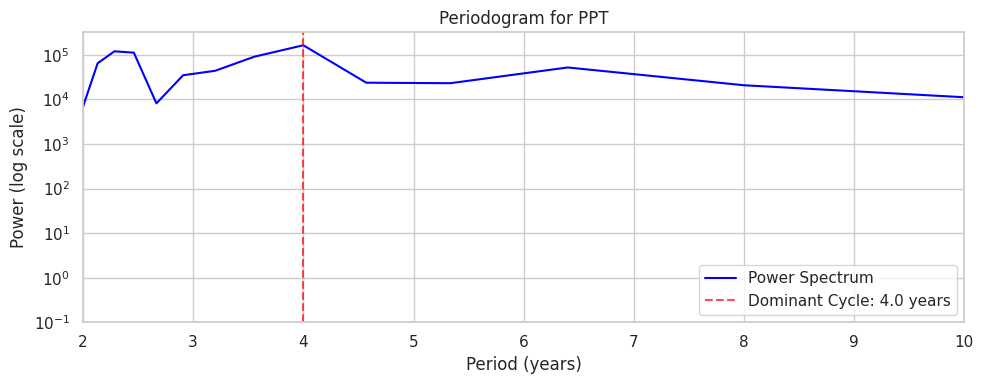

PPT Results:
Dominant cycle detected at 4.0-year period. No significant autocorrelation detected (lags 1–10).


In [211]:
anpp_result = run_time_series_analysis(df_Winter_Wheat_processed, 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(df_Winter_Wheat_processed, 'PPT', None, plot=True)

In [212]:
top_models_Winter_Wheat = run_and_save_models(
    df=df_Winter_Wheat,
    analysis_name='Winter_Wheat',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise', 'spline'],
    window_size=range(1, 11),
    lags=[None],
    cycle_period=4,
    show_plot=False,
    show_aic_bic=False
)

Skipping Winter_Wheat_yearly_True_window_10_lags_none_sinusoidal_no_linear: Window size 10 too large for 19 rows.
Skipping Winter_Wheat_yearly_True_window_10_lags_none_sinusoidal_yes_linear: Window size 10 too large for 19 rows.
Skipping Winter_Wheat_yearly_True_window_10_lags_none_sinusoidal_no_quadratic: Window size 10 too large for 19 rows.
Skipping Winter_Wheat_yearly_True_window_10_lags_none_sinusoidal_yes_quadratic: Window size 10 too large for 19 rows.
Skipping Winter_Wheat_yearly_True_window_10_lags_none_sinusoidal_no_piecewise: Window size 10 too large for 19 rows.
Skipping Winter_Wheat_yearly_True_window_10_lags_none_sinusoidal_yes_piecewise: Window size 10 too large for 19 rows.
Skipping Winter_Wheat_yearly_True_window_10_lags_none_sinusoidal_no_spline: Window size 10 too large for 19 rows.
Skipping Winter_Wheat_yearly_True_window_10_lags_none_sinusoidal_yes_spline: Window size 10 too large for 19 rows.
spline No models meet the selection criteria (p < 0.05, normality, homos

Predictors in plot_model: ['PPT']


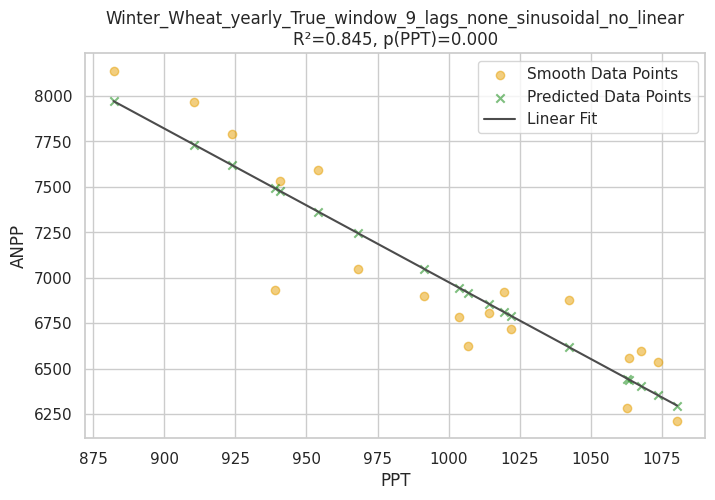

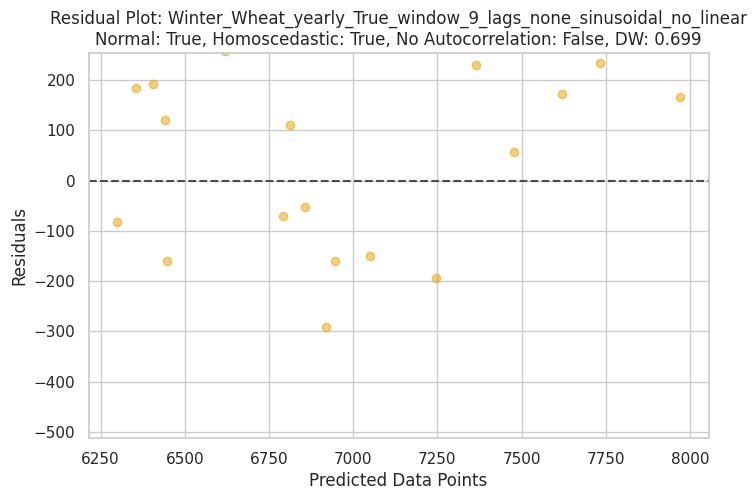

Min values:
 year    1995.000000
PPT      882.200540
ANPP    6214.602148
dtype: float64

Max values:
 year    2022.000000
PPT     1080.322232
ANPP    8138.498451
dtype: float64
Min values:
 year                 1995
site.code             CAF
type            Croplands
Crop         Winter_Wheat
Cereal             Cereal
MAP            524.923176
ANPP          2605.336993
PPT                504.19
WUE              2.152317
dtype: object

Max values:
 year                 2022
site.code             LCB
type            Croplands
Crop         Winter_Wheat
Cereal             Cereal
MAP           1092.179499
ANPP           12405.9672
PPT            1345.91399
WUE             16.957893
dtype: object


In [213]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=df_Winter_Wheat,
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=True,
    window_size=9,
    analysis_name='Winter_Wheat_yearly_True_window_9_lags_none_sinusoidal_no_linear',
    plot_name='Winter Wheat',
    show_plot=True,
    lags=None,
    use_sinusoidal=False,
    cycle_period=0,
    is_run_quadratic=False,
    is_piecewise=False,
    is_spline=False,
)

find_min_max(data)
find_min_max(df_Winter_Wheat)

Predictors in plot_model: ['PPT', 'sin_cycle', 'cos_cycle', 'quadratic']


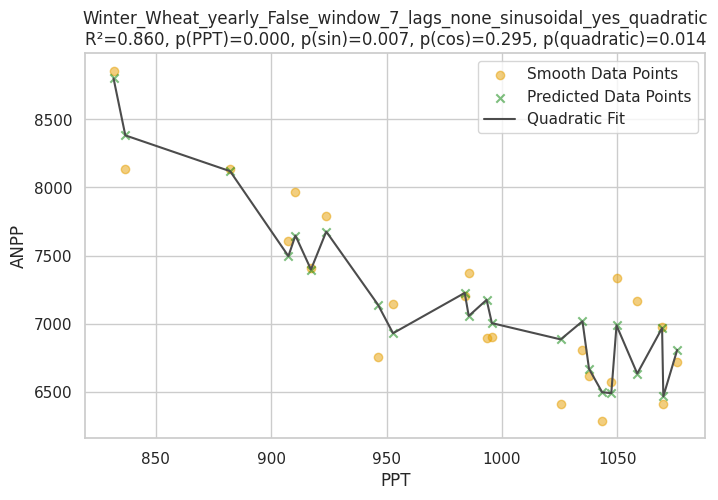

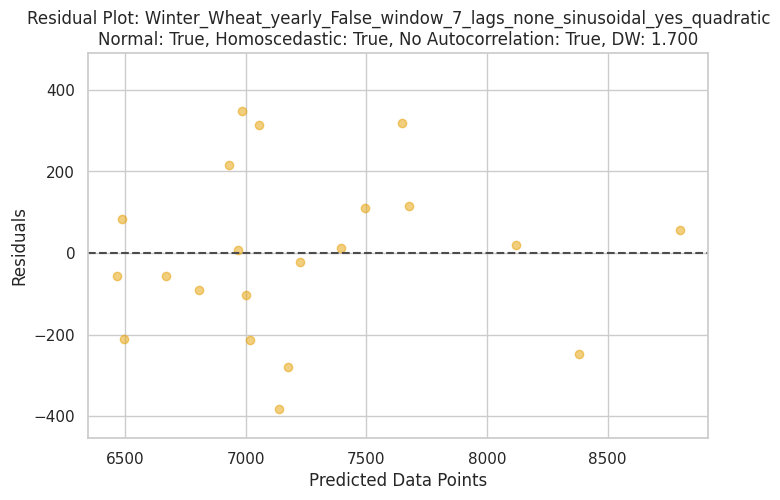

In [214]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=df_Winter_Wheat,
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=False,
    window_size=7,
    analysis_name='Winter_Wheat_yearly_False_window_7_lags_none_sinusoidal_yes_quadratic',
    plot_name='Winter Wheat',
    show_plot=True,
    lags=None,
    use_sinusoidal=True,
    cycle_period=4,
    is_run_quadratic=True,
    is_piecewise=False,
    is_spline=False,
)

Predictors in plot_model: ['PPT', 'segment']


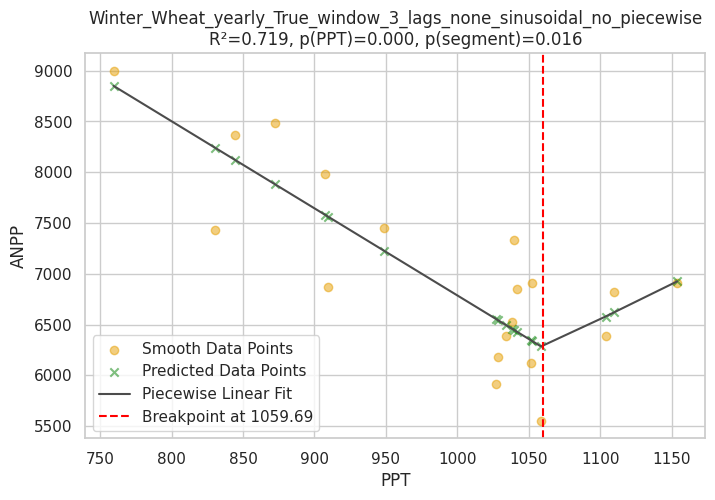

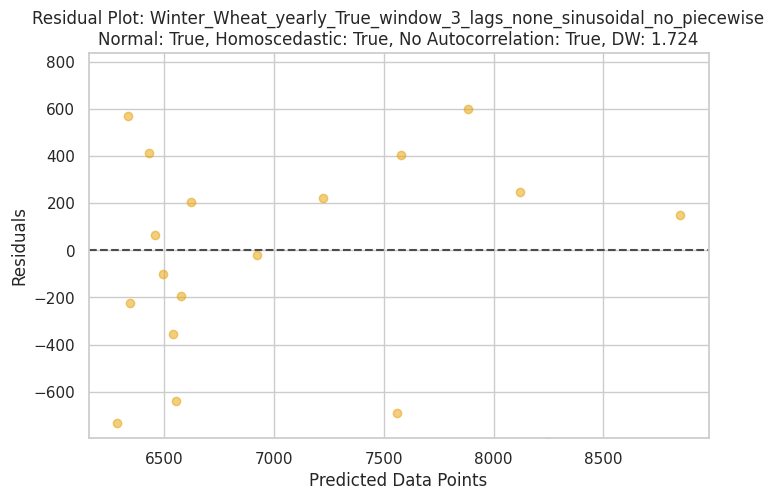

In [215]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=df_Winter_Wheat,
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=True,
    window_size=3,
    analysis_name='Winter_Wheat_yearly_True_window_3_lags_none_sinusoidal_no_piecewise',
    plot_name='Winter Wheat',
    show_plot=True,
    lags=None,
    use_sinusoidal=False,
    cycle_period=4,
    is_run_quadratic=False,
    is_piecewise=True,
    is_spline=False,
)

## **Switch Grass**


IQR Method for ANPP:
Q1: 3086.17, Q3: 6241.68, IQR: 3155.51
Lower Bound: -1647.09, Upper Bound: 10974.93
Number of IQR outliers: 0
Range of IQR outliers: None


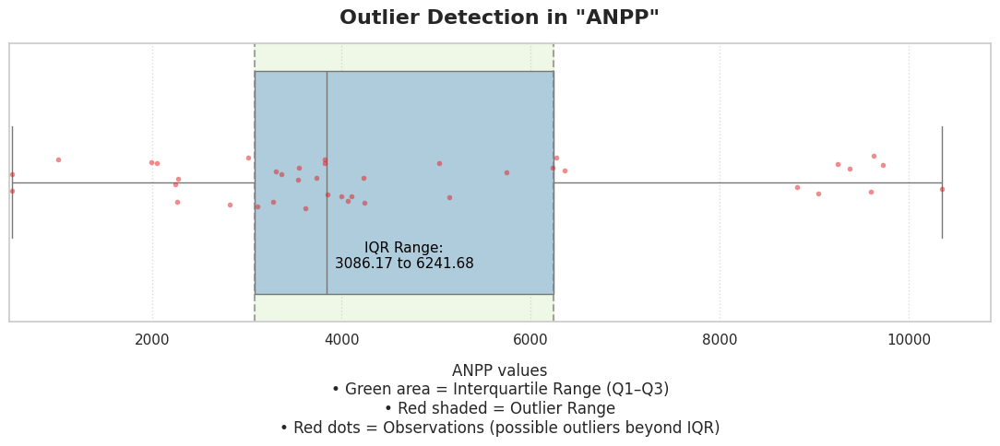

Unique values in 'site.code':
site.code
PRHPA    18
TG       13
UCB       9
Name: count, dtype: int64


In [216]:
df_unfiltered_Switchgrass = df.copy()
df_Switchgrass = filter_df(df_unfiltered_Switchgrass, 'Crop', 'Switchgrass')

df_Switchgrass_transformed, df_Switchgrass_transformed_info = transform_dataframe(df_Switchgrass, ['ANPP', 'WUE'])

df_Switchgrass_outliers = detect_outliers(df_Switchgrass, 'ANPP')
df_Switchgrass_processed = df_Switchgrass_outliers['cleaned_df']

df_Switchgrass_outliers = df_Switchgrass_outliers['iqr_outliers']

len(df_Switchgrass_outliers)

print("Unique values in 'site.code':")
print(df_Switchgrass['site.code'].value_counts())


Starting analysis for ANPP with predictor PPT


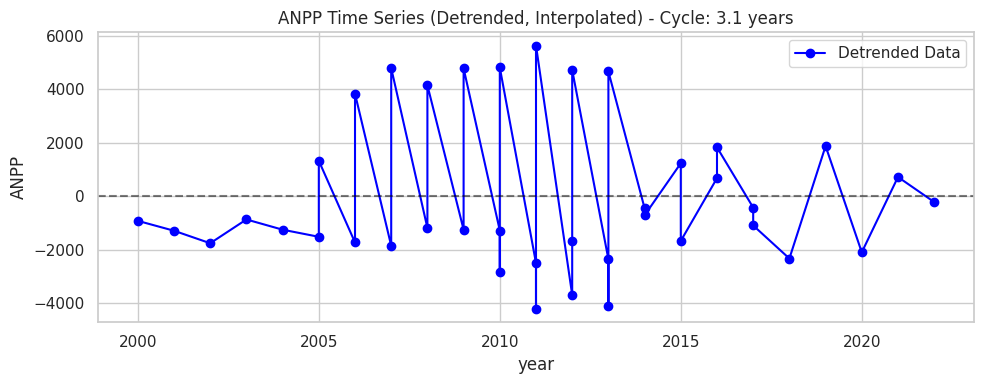

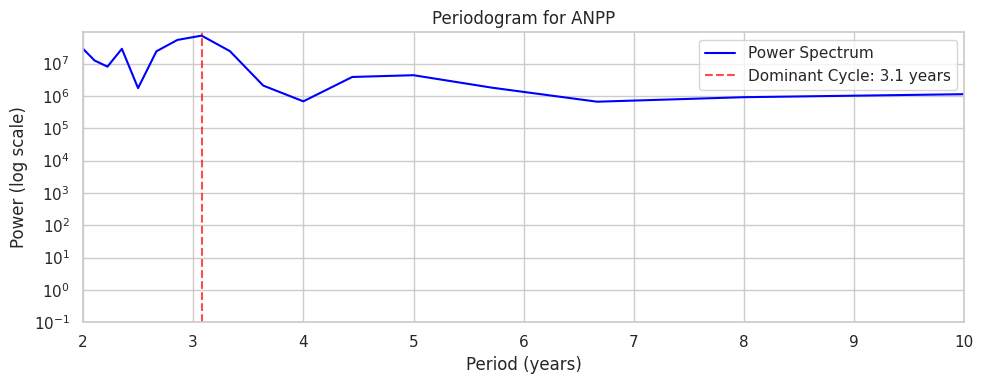

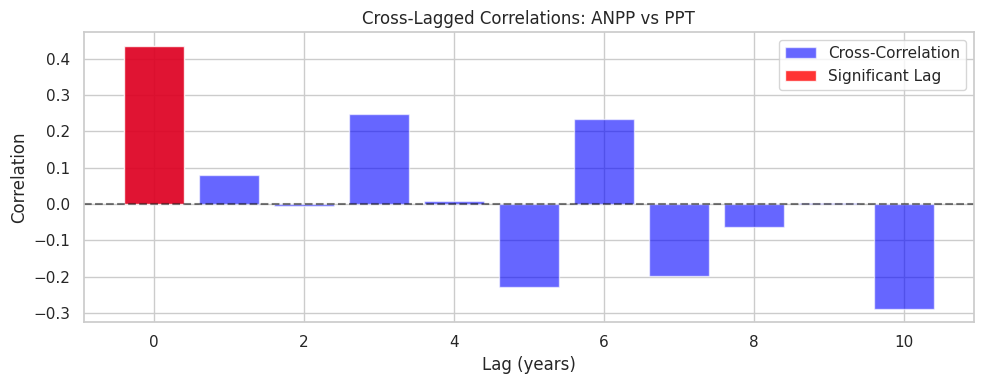

ANPP Results:
Dominant cycle detected at 3.1-year period. No significant autocorrelation detected (lags 1–10). Significant cross-lagged effects (ANPP vs. PPT) at lags: [0].
Starting analysis for PPT with predictor None


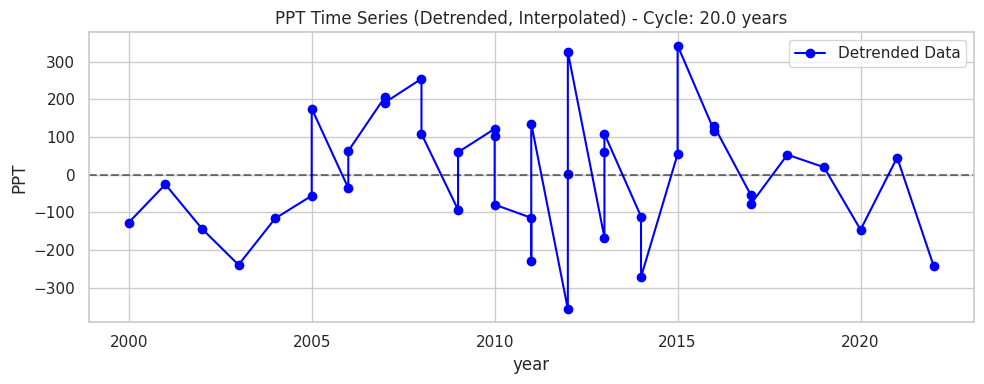

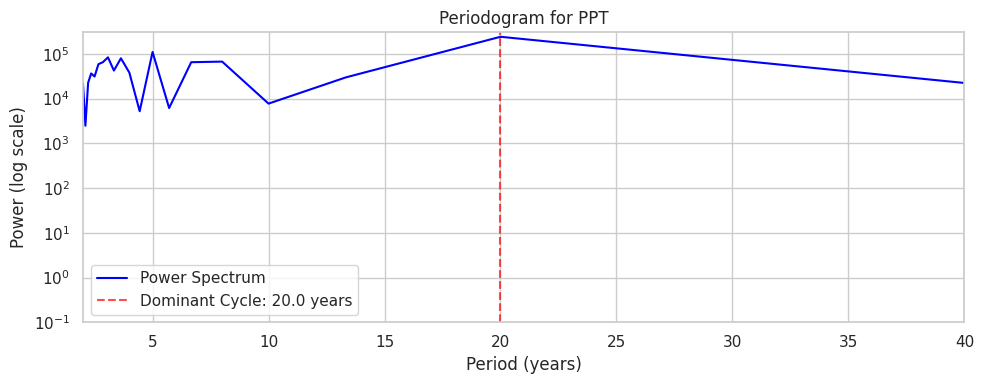

PPT Results:
Dominant cycle detected at 20.0-year period. No significant autocorrelation detected (lags 1–10).


In [217]:
anpp_result = run_time_series_analysis(df_Switchgrass_processed, 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(df_Switchgrass_processed, 'PPT', None, plot=True)

In [218]:
pearson_corr, spearman_corr = compute_correlation(df_Switchgrass, 'ANPP', 'PPT', 'Switchgrass')

Correlation between ANPP and PPT - Switchgrass (Pearson): 0.3748713161446548
Correlation between ANPP and PPT - Switchgrass (Spearman): 0.3418386491557224


Generating AIC/BIC plots
Showing aggregated AIC/BIC plot


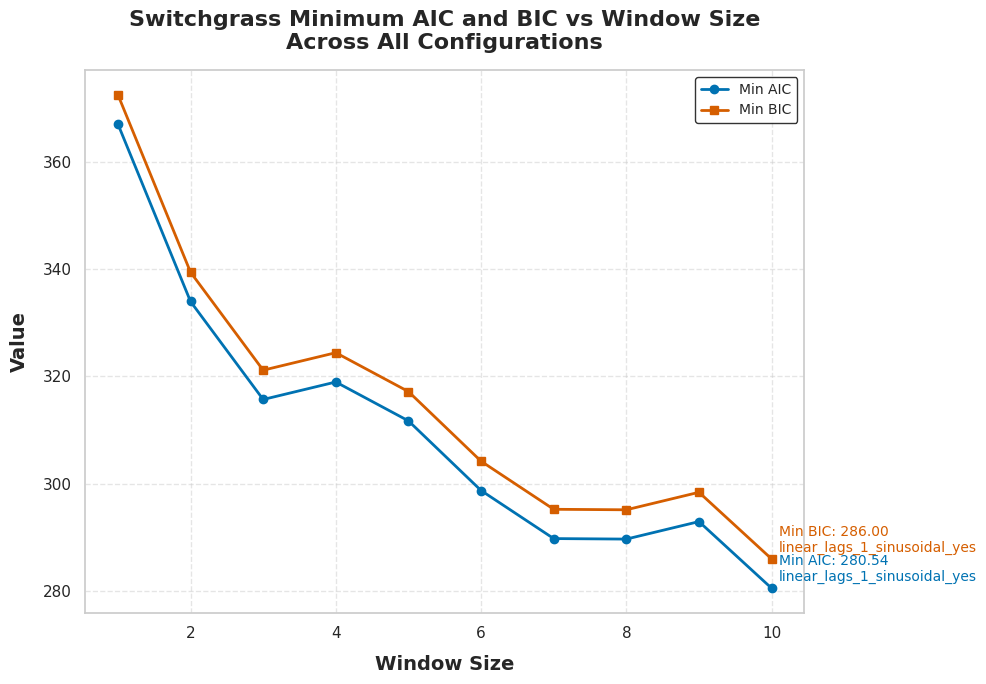

Generating AIC/BIC plots
Showing aggregated AIC/BIC plot


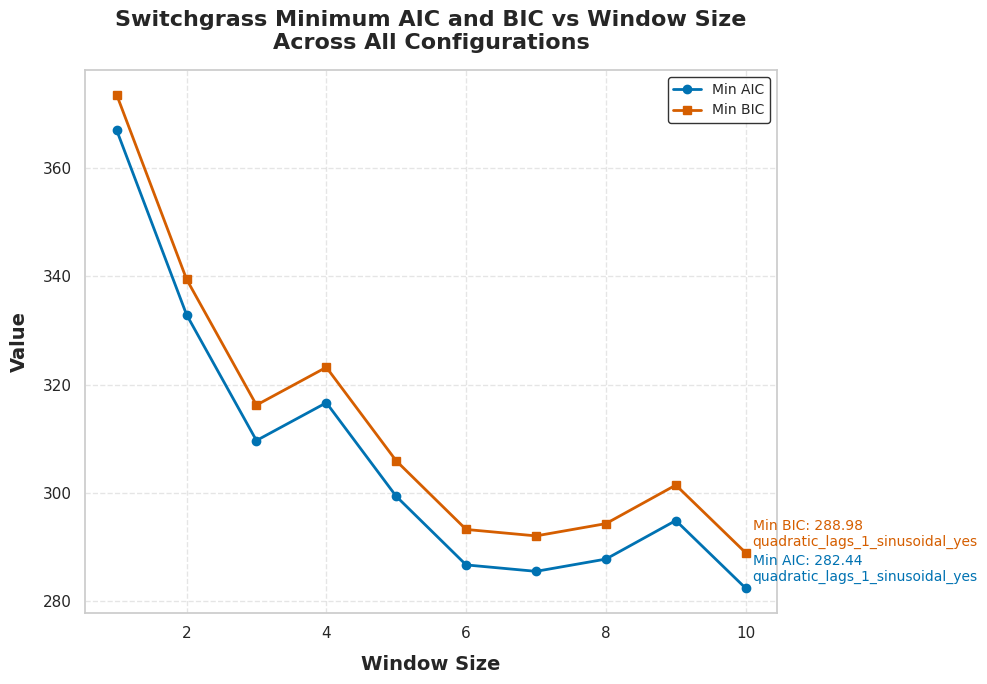

Generating AIC/BIC plots
Showing aggregated AIC/BIC plot


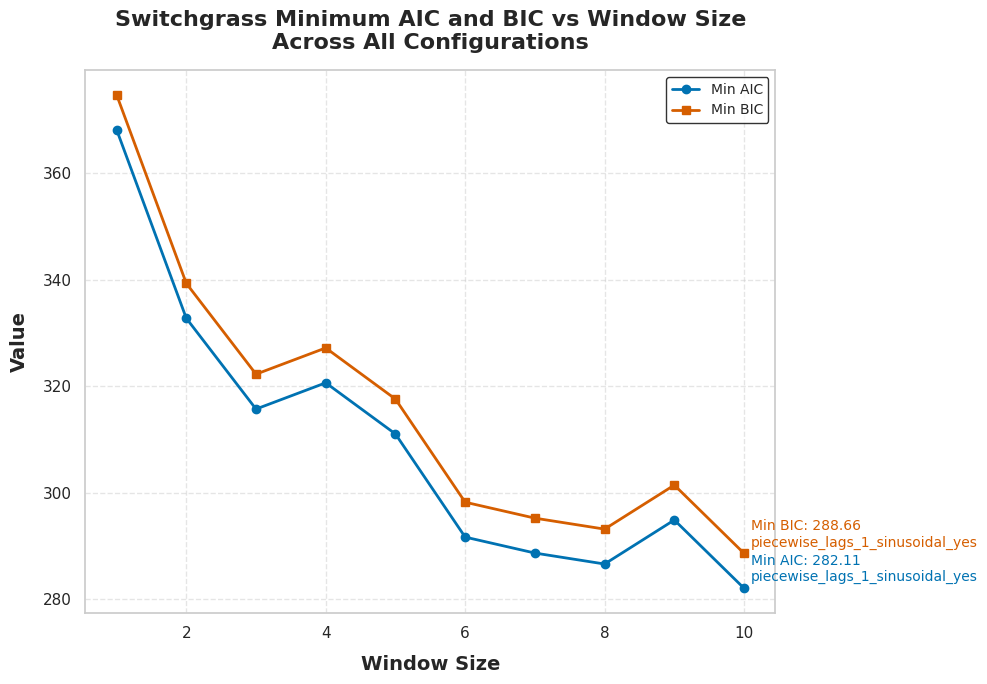

Generating AIC/BIC plots
Showing aggregated AIC/BIC plot


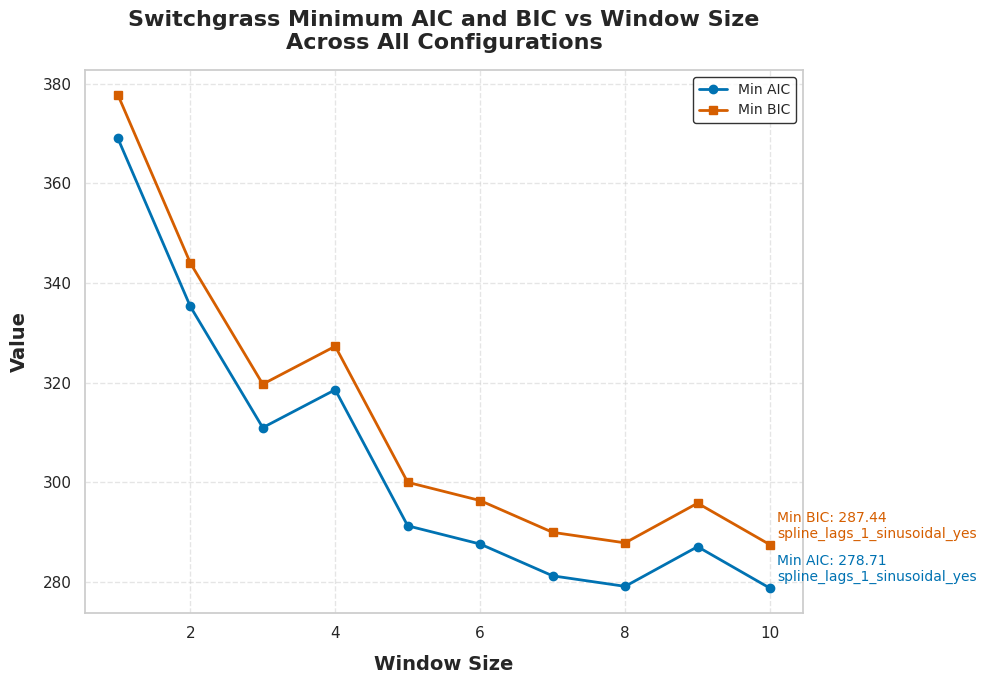

In [219]:
top_models_Switchgrass = run_and_save_models(
    df=df_Switchgrass,
    analysis_name='Switchgrass',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise', 'spline'],
    window_size=range(1, 11),
    lags=[None, [1]],
    cycle_period=20,
    show_plot=False,
    show_aic_bic=True
)

Predictors in plot_model: ['PPT', 'sin_cycle', 'cos_cycle']


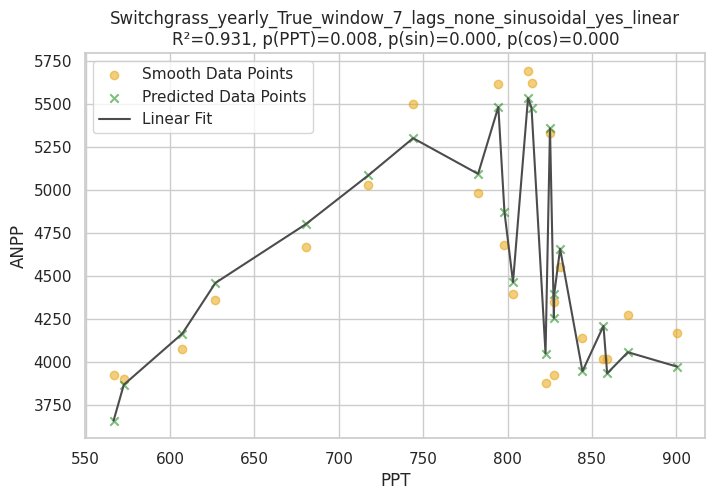

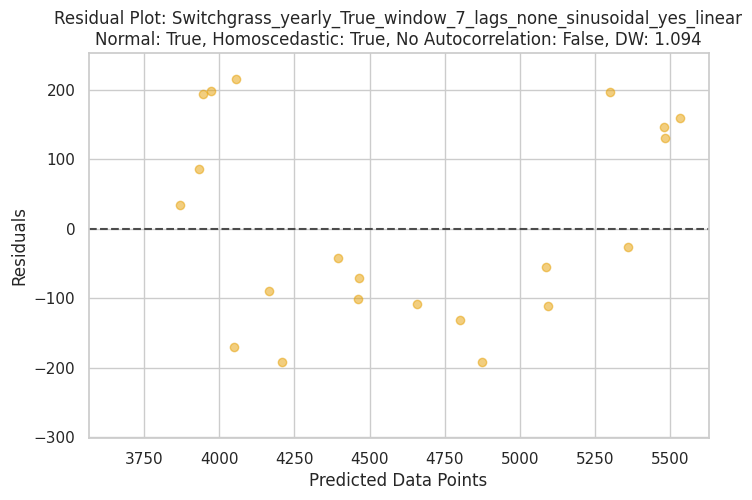

In [220]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=df_Switchgrass,
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=True,
    window_size=7,
    analysis_name='Switchgrass_yearly_True_window_7_lags_none_sinusoidal_yes_linear',
    plot_name='Croplands',
    show_plot=True,
    lags=None,
    use_sinusoidal=True,
    cycle_period=20,
    is_run_quadratic=False,
    is_piecewise=False,
    is_spline=False,
)

Predictors in plot_model: ['PPT', 'sin_cycle', 'cos_cycle', 'quadratic']


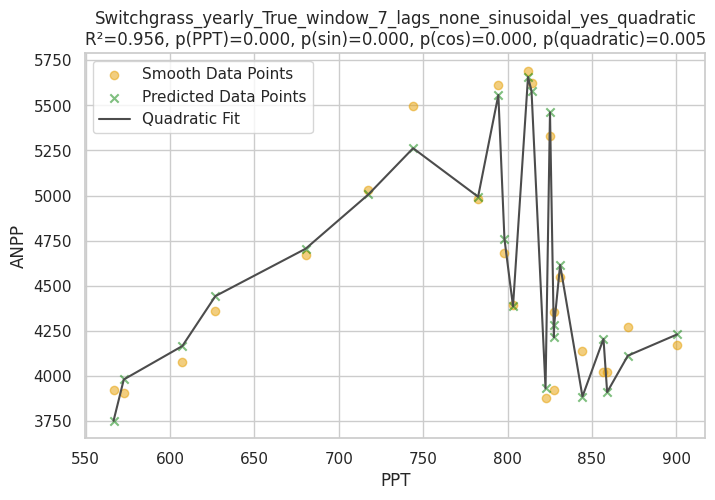

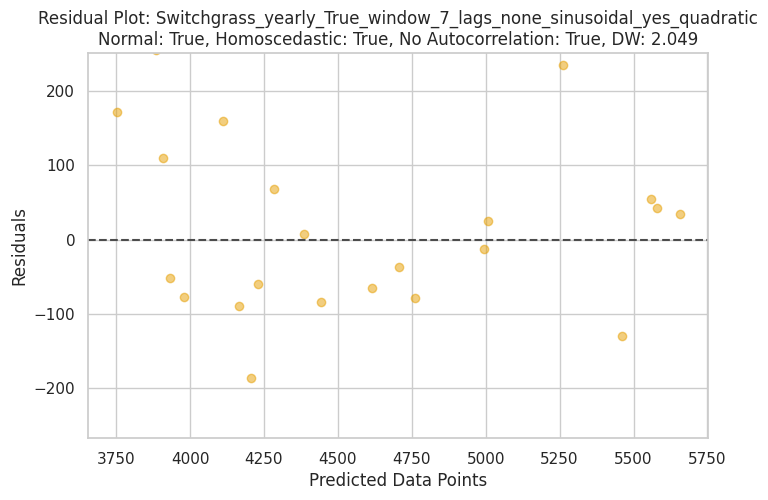

Min values:
 year         2000.000000
PPT           566.477500
ANPP         3879.547115
sin_cycle      -1.000000
cos_cycle      -1.000000
dtype: float64

Max values:
 year         2022.000000
PPT           900.571911
ANPP         5692.228417
sin_cycle       1.000000
cos_cycle       1.000000
dtype: float64
Min values:
 year                2000
site.code          PRHPA
type             Pasture
Crop         Switchgrass
Cereal           Pasture
MAP           715.094416
ANPP          513.530916
PPT              443.231
WUE             0.582433
dtype: object

Max values:
 year                2022
site.code            UCB
type             Pasture
Crop         Switchgrass
Cereal           Pasture
MAP          1068.967476
ANPP         10347.33731
PPT              1188.65
WUE            13.703939
dtype: object


In [221]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=df_Switchgrass,
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=True,
    window_size=7,
    analysis_name='Switchgrass_yearly_True_window_7_lags_none_sinusoidal_yes_quadratic',
    plot_name='Switchgrass',
    show_plot=True,
    lags=None,
    use_sinusoidal=True,
    cycle_period=20,
    is_run_quadratic=True,
    is_piecewise=False,
    is_spline=False,
)

find_min_max(data)
find_min_max(df_Switchgrass)

Predictors in plot_model: ['PPT', 'segment']


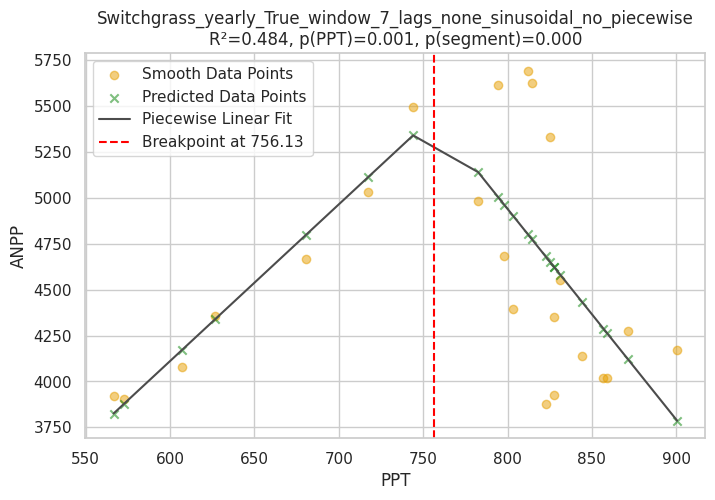

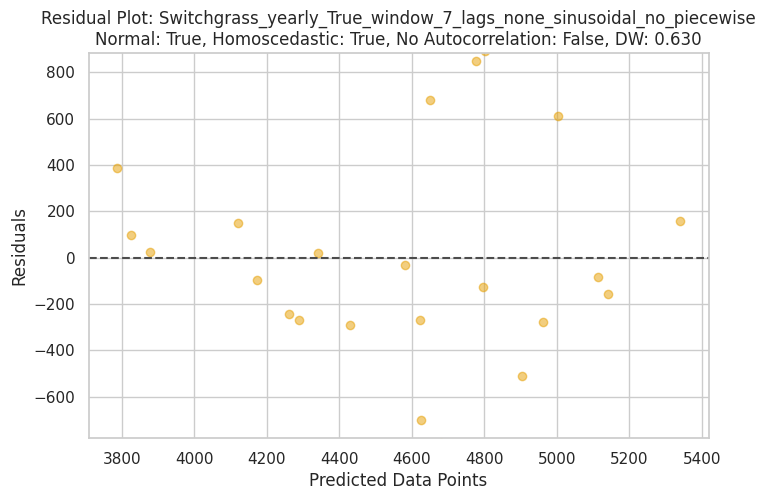

Min values:
 year    2000.000000
PPT      566.477500
ANPP    3879.547115
dtype: float64

Max values:
 year    2022.000000
PPT      900.571911
ANPP    5692.228417
dtype: float64
Min values:
 year                2000
site.code          PRHPA
type             Pasture
Crop         Switchgrass
Cereal           Pasture
MAP           715.094416
ANPP          513.530916
PPT              443.231
WUE             0.582433
dtype: object

Max values:
 year                2022
site.code            UCB
type             Pasture
Crop         Switchgrass
Cereal           Pasture
MAP          1068.967476
ANPP         10347.33731
PPT              1188.65
WUE            13.703939
dtype: object


In [222]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=df_Switchgrass,
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=True,
    window_size=7,
    analysis_name='Switchgrass_yearly_True_window_7_lags_none_sinusoidal_no_piecewise',
    plot_name='Croplands',
    show_plot=True,
    lags=None,
    use_sinusoidal=False,
    cycle_period=20,
    is_run_quadratic=False,
    is_piecewise=True,
    is_spline=False,
)

find_min_max(data)
find_min_max(df_Switchgrass)

## **Soybean**


IQR Method for ANPP:
Q1: 5259.85, Q3: 7815.27, IQR: 2555.42
Lower Bound: 1426.72, Upper Bound: 11648.39
Number of IQR outliers: 1
Range of IQR outliers: (13670.38496, 13670.38496)


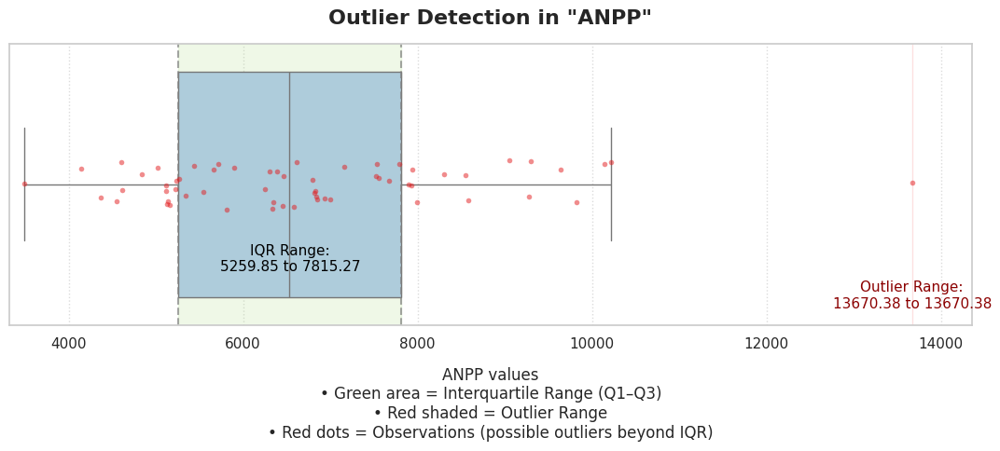

Unique values in 'site.code':
site.code
PRHPA    36
KBS      12
UMRB      7
NH        5
Name: count, dtype: int64


In [223]:
df_unfiltered_Soybean = df.copy()
df_Soybean = filter_df(df_unfiltered_Soybean, 'Crop', 'Soybean')

df_Soybean_transformed, df_Soybean_transformed_info = transform_dataframe(df_Soybean, ['ANPP', 'WUE'])

df_Soybean_outliers = detect_outliers(df_Soybean, 'ANPP')
df_Soybean_processed = df_Soybean_outliers['cleaned_df']

df_Soybean_outliers = df_Soybean_outliers['iqr_outliers']

len(df_Soybean_outliers)

df_Soybean_outliers.head(1)


print("Unique values in 'site.code':")
print(df_Soybean['site.code'].value_counts())




Starting analysis for ANPP with predictor PPT


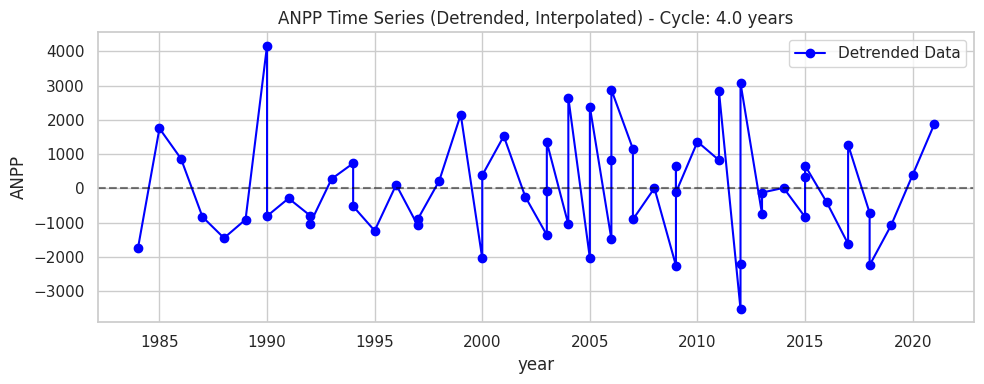

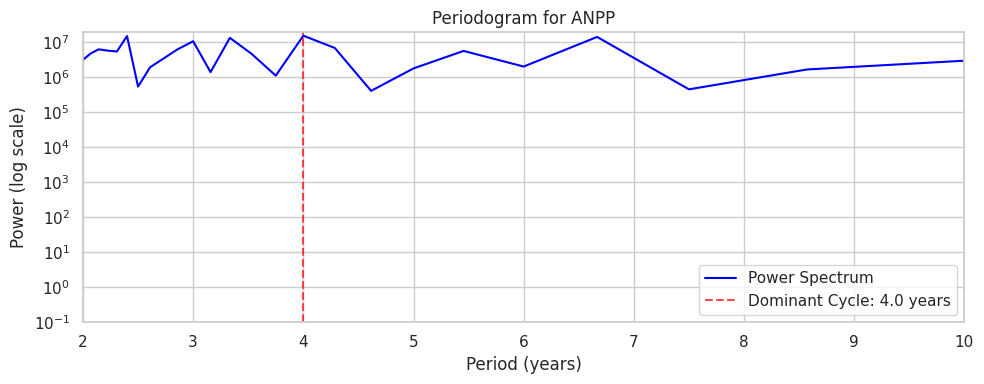

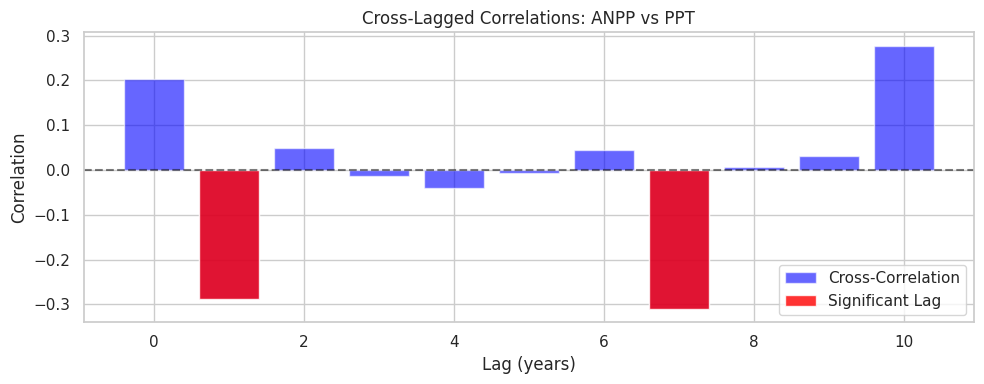

ANPP Results:
Dominant cycle detected at 4.0-year period. No significant autocorrelation detected (lags 1–10). Significant cross-lagged effects (ANPP vs. PPT) at lags: [1, 7].
Starting analysis for PPT with predictor None


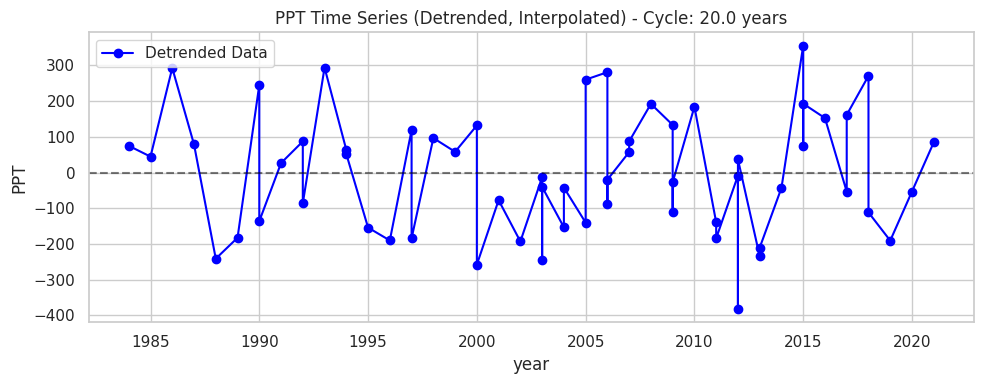

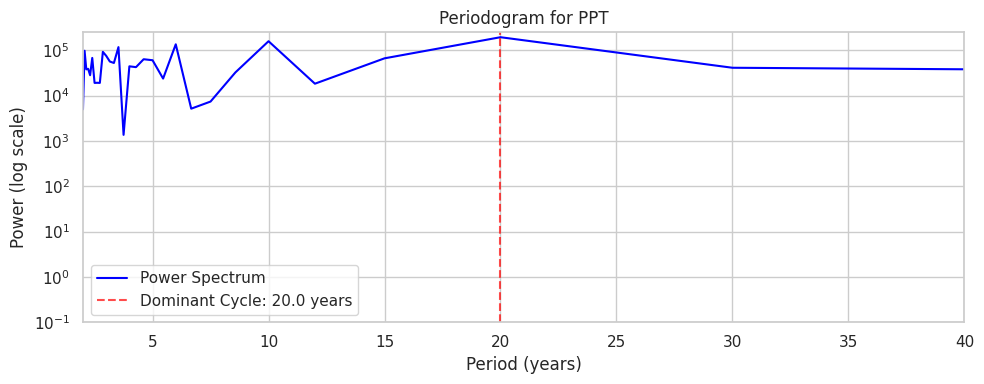

PPT Results:
Dominant cycle detected at 20.0-year period. No significant autocorrelation detected (lags 1–10).


In [224]:
anpp_result = run_time_series_analysis(df_Soybean_processed, 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(df_Soybean_processed, 'PPT', None, plot=True)

In [225]:
pearson_corr, spearman_corr = compute_correlation(df_Soybean, 'ANPP', 'PPT', 'Soybean')


Correlation between ANPP and PPT - Soybean (Pearson): 0.2840459805081274
Correlation between ANPP and PPT - Soybean (Spearman): 0.2880244512364546


In [226]:
top_models_Soybean = run_and_save_models(
    df=df_Soybean,
    analysis_name='Soybean',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise', 'spline'],
    window_size=range(1, 11),
    lags=[None, [1], [7]],
    cycle_period=20,
    show_plot=False,
    show_aic_bic=False
)

quadratic No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).


Predictors in plot_model: ['PPT']


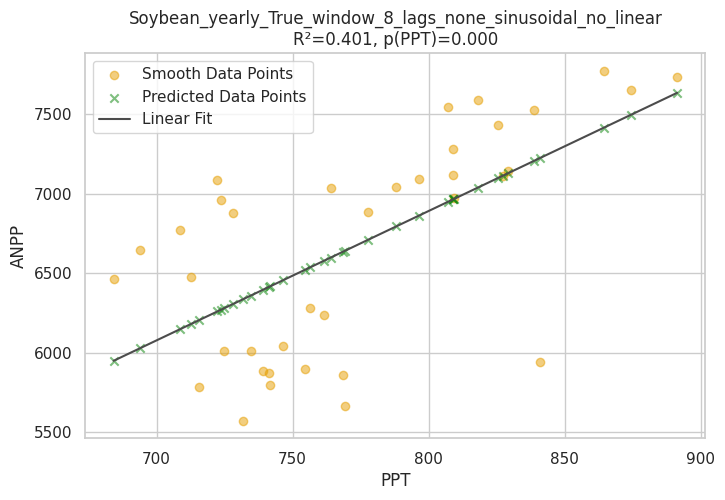

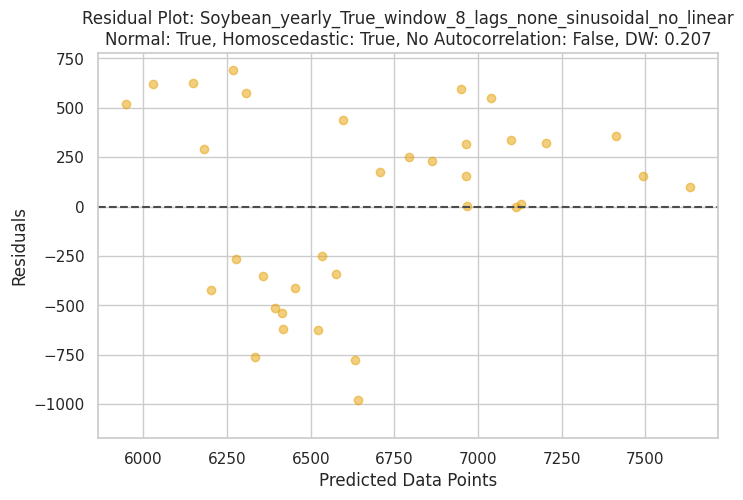

In [227]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=df_Soybean,
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=True,
    window_size=8,
    analysis_name='Soybean_yearly_True_window_8_lags_none_sinusoidal_no_linear',
    plot_name='Soybean',
    show_plot=True,
    lags=None,
    use_sinusoidal=False,
    cycle_period=0,
    is_run_quadratic=False,
    is_piecewise=False,
    is_spline=False,
)


Predictors in plot_model: ['PPT', 'segment']


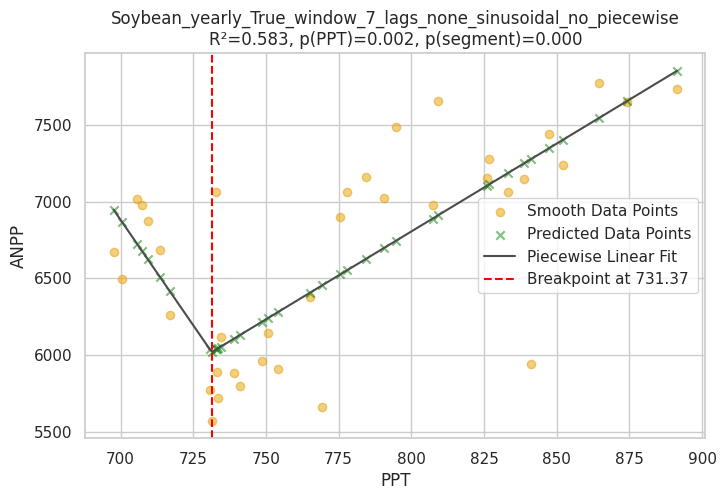

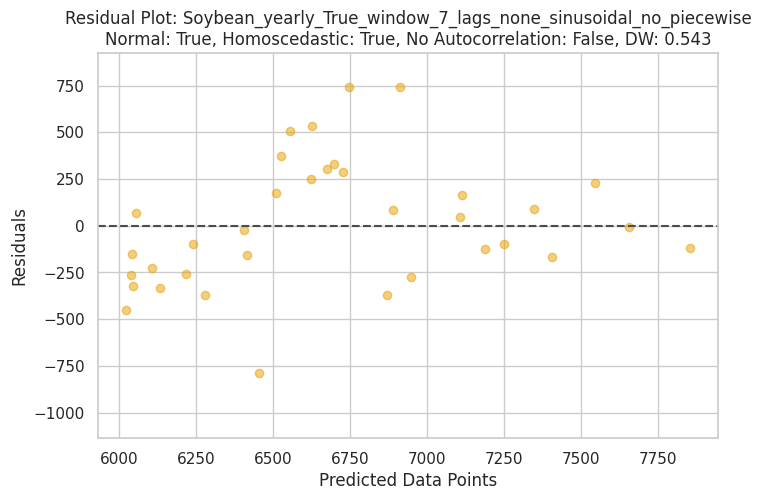

Min values:
 year    1984.000000
PPT      697.608357
ANPP    5571.966583
dtype: float64

Max values:
 year    2021.000000
PPT      891.418669
ANPP    7771.593866
dtype: float64
Min values:
 year                1984
site.code            KBS
type           Croplands
Crop             Soybean
Cereal        Non-Cereal
MAP           702.199915
ANPP         3494.273333
PPT              424.181
WUE             4.390232
dtype: object

Max values:
 year                2021
site.code           UMRB
type           Croplands
Crop             Soybean
Cereal        Non-Cereal
MAP            942.50958
ANPP         13670.38496
PPT              1172.54
WUE            15.888487
dtype: object


In [228]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=df_Soybean,
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=True,
    window_size=7,
    analysis_name='Soybean_yearly_True_window_7_lags_none_sinusoidal_no_piecewise',
    plot_name='Soybean',
    show_plot=True,
    lags=None,
    use_sinusoidal=False,
    cycle_period=0,
    is_run_quadratic=False,
    is_piecewise=True,
    is_spline=False,
)


find_min_max(data)
find_min_max(df_Soybean)

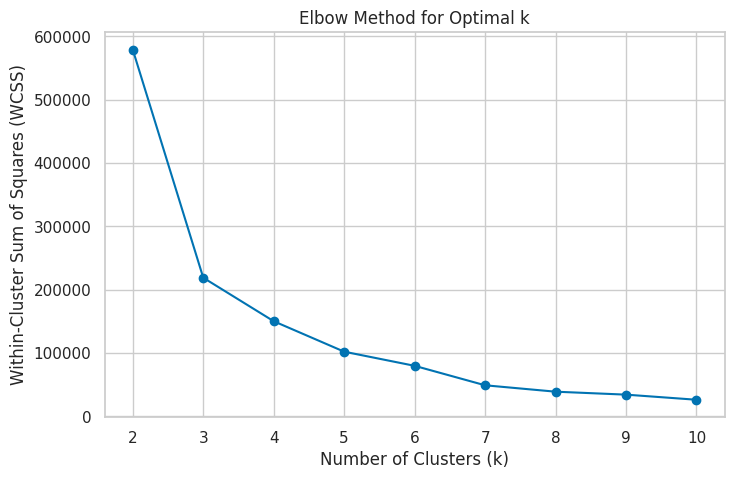

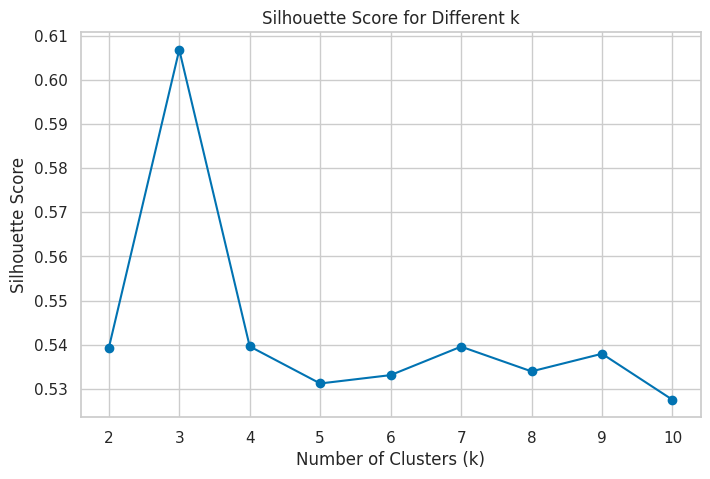

K-means Performance
Silhouette Score: 0.607


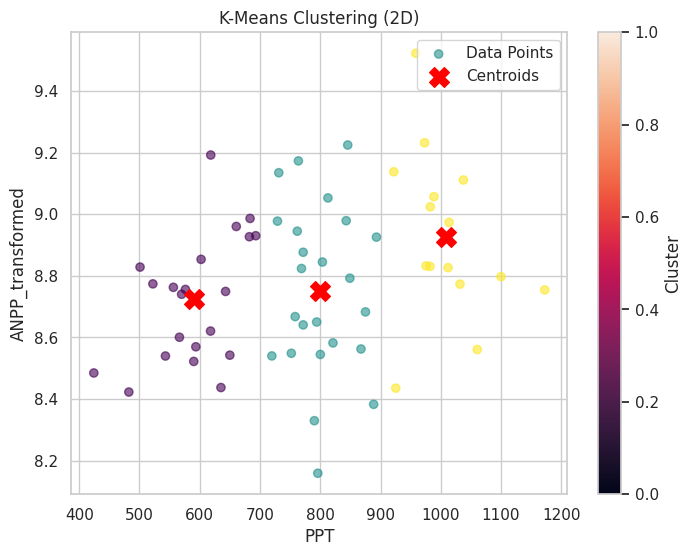


Cluster Summary (Mean Values):
                 PPT         ANPP
Cluster                          
0         590.980343  6276.475551
1         800.334461  6550.636028
2        1009.111994  7785.399615
Unique clusters - Soybean: [1 2 0]

Cluster 0 DataFrame:
Number of observations: 21
Pearson Correlation between ANPP and PPT - Soybean (cluster 0): 0.4702252489216734


Spearman Correlation between ANPP and PPT - Soybean (cluster 0): 0.4974025974025974



Cluster 1 DataFrame:
Number of observations: 24
Pearson Correlation between ANPP and PPT - Soybean (cluster 1): -0.09637139888082243


Spearman Correlation between ANPP and PPT - Soybean (cluster 1): -0.05391304347826086



Cluster 2 DataFrame:
Number of observations: 15
Pearson Correlation between ANPP and PPT - Soybean (cluster 2): -0.33758764037962097


Spearman Correlation between ANPP and PPT - Soybean (cluster 2): -0.4678571428571427




In [229]:
columns_transformed = ['PPT', 'ANPP_transformed']
columns_untransformed = ['PPT', 'ANPP']
OPTIMAL_K = 3
K_RANGE = range(2, 11)

df_soybean_k_means, soybean_clusters, soybean_cluster_summary = run_clustering_and_correlations(df_Soybean_transformed, 'Soybean', \
                                                                columns_transformed, columns_untransformed, K_RANGE, OPTIMAL_K)


Cluster Distribution by site.code:
site.code  PRHPA  UMRB
Cluster               
0             19     2


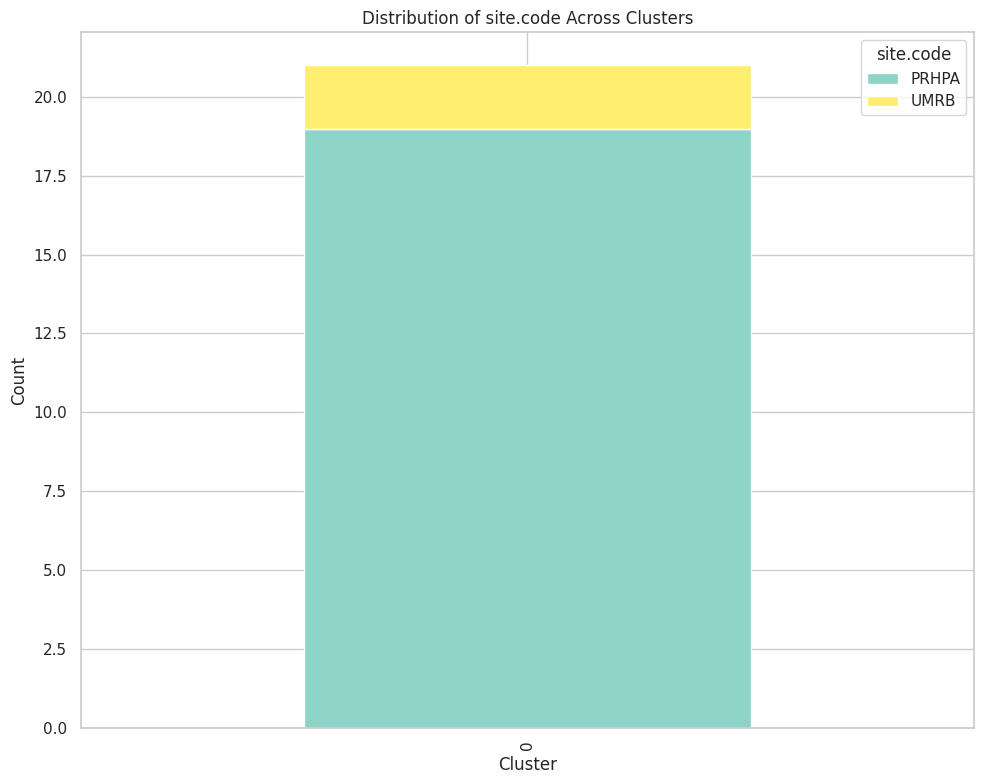

In [230]:
cluster_distribution(soybean_clusters[0], 'site.code')


Cluster Distribution by site.code:
site.code  KBS  NH  PRHPA  UMRB
Cluster                        
1            6   3     12     3


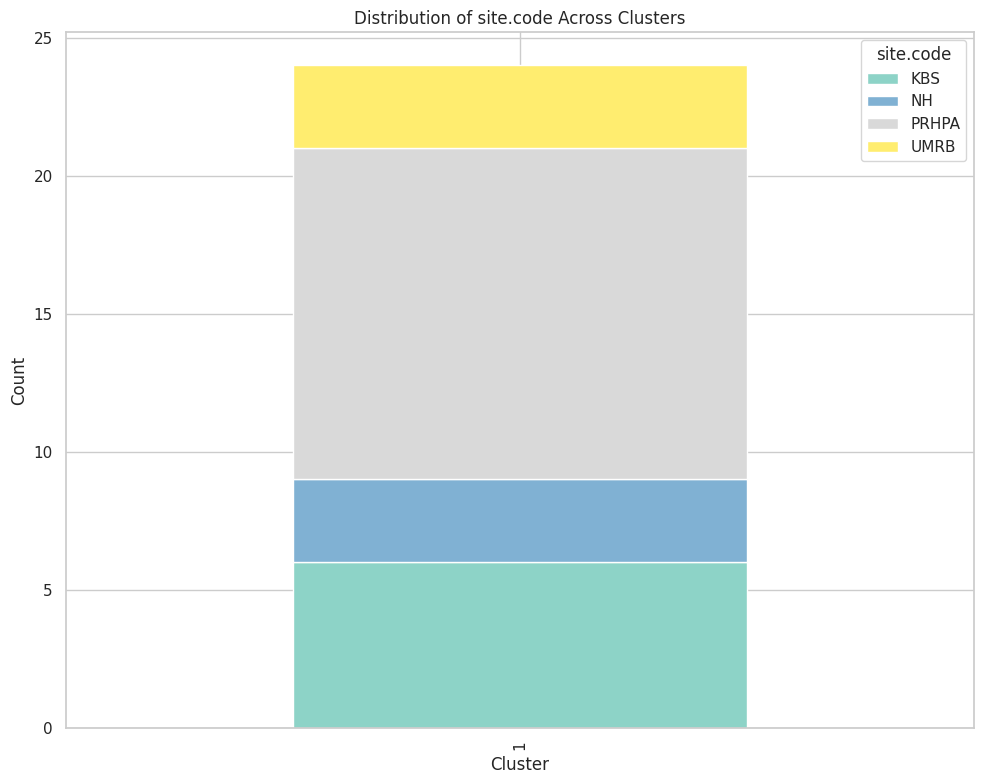

In [231]:
cluster_distribution(soybean_clusters[1], 'site.code')

Starting analysis for ANPP with predictor PPT


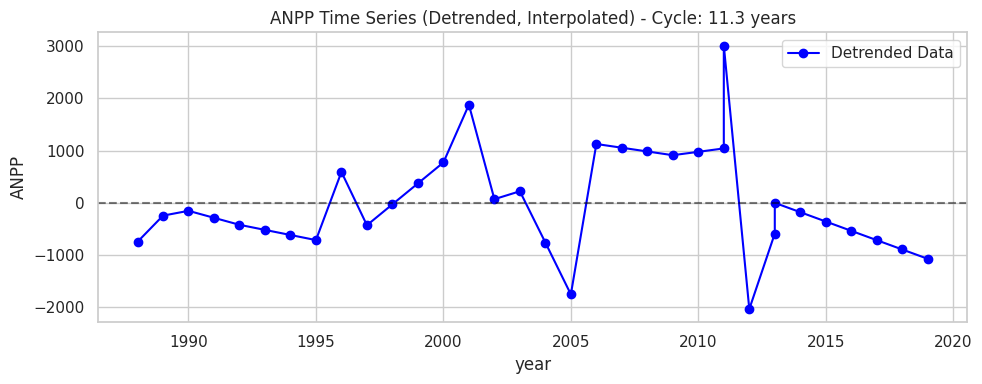

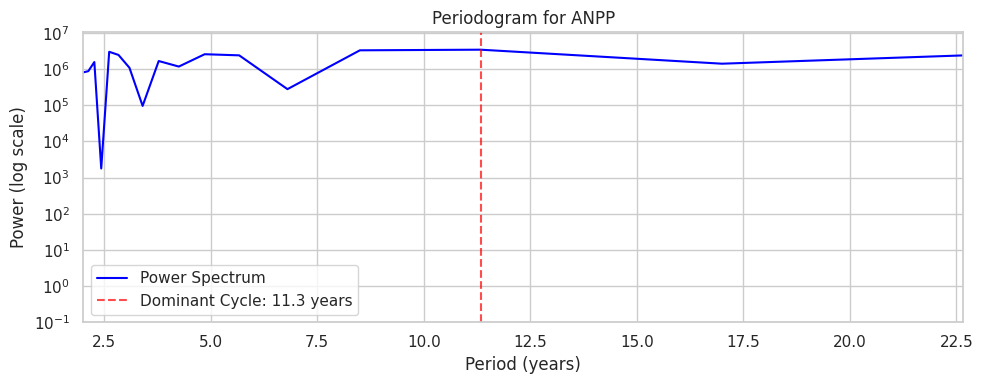

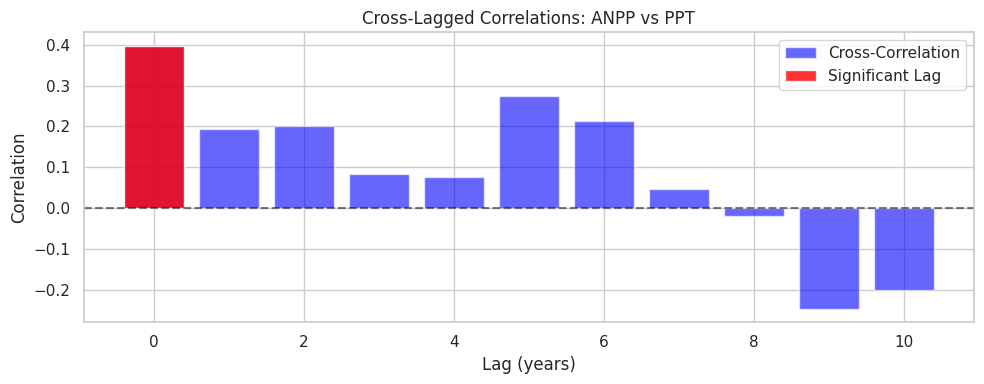

ANPP Results:
Dominant cycle detected at 11.3-year period. No significant autocorrelation detected (lags 1–10). Significant cross-lagged effects (ANPP vs. PPT) at lags: [0].
Starting analysis for PPT with predictor None


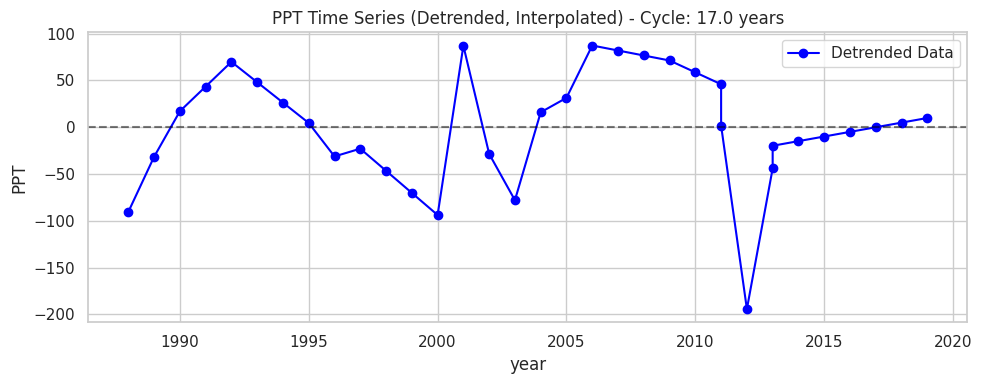

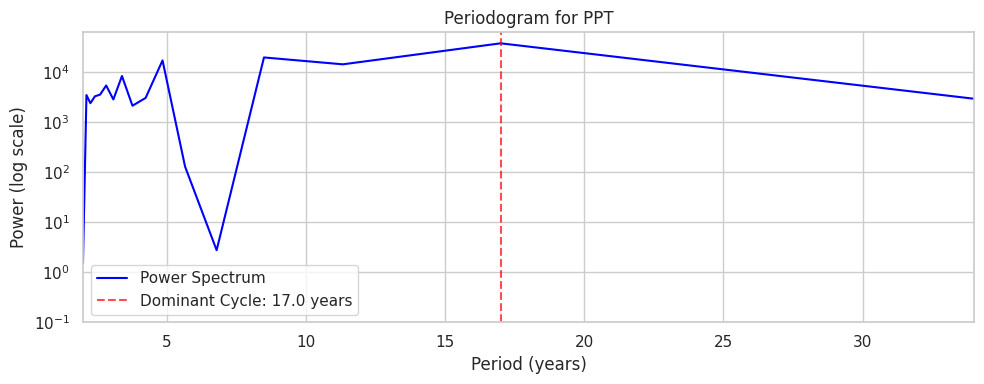

PPT Results:
Dominant cycle detected at 17.0-year period. No significant autocorrelation detected (lags 1–10).


In [232]:
anpp_result = run_time_series_analysis(soybean_clusters[0], 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(soybean_clusters[0], 'PPT', None, plot=True)

In [233]:
top_models_Soybean = run_and_save_models(
    df=soybean_clusters[0],
    analysis_name='Soybean_cluster_0',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise', 'spline'],
    window_size=range(1, 11),
    lags=[None, [0], [1], [7]],
    cycle_period=17,
    show_plot=False,
    show_aic_bic=False
)

Skipping Soybean_cluster_0_yearly_True_window_7_lags_7_sinusoidal_no_linear: Window size 7 too large for 12 rows.
Skipping Soybean_cluster_0_yearly_True_window_7_lags_7_sinusoidal_yes_linear: Window size 7 too large for 12 rows.
Skipping Soybean_cluster_0_yearly_False_window_8_lags_7_sinusoidal_no_linear: Window size 8 too large for 14 rows.
Skipping Soybean_cluster_0_yearly_False_window_8_lags_7_sinusoidal_yes_linear: Window size 8 too large for 14 rows.
Skipping Soybean_cluster_0_yearly_True_window_8_lags_7_sinusoidal_no_linear: Window size 8 too large for 12 rows.
Skipping Soybean_cluster_0_yearly_True_window_8_lags_7_sinusoidal_yes_linear: Window size 8 too large for 12 rows.
Skipping Soybean_cluster_0_yearly_False_window_9_lags_7_sinusoidal_no_linear: Window size 9 too large for 14 rows.
Skipping Soybean_cluster_0_yearly_False_window_9_lags_7_sinusoidal_yes_linear: Window size 9 too large for 14 rows.
Skipping Soybean_cluster_0_yearly_True_window_9_lags_7_sinusoidal_no_linear: Win

Predictors in plot_model: ['PPT']


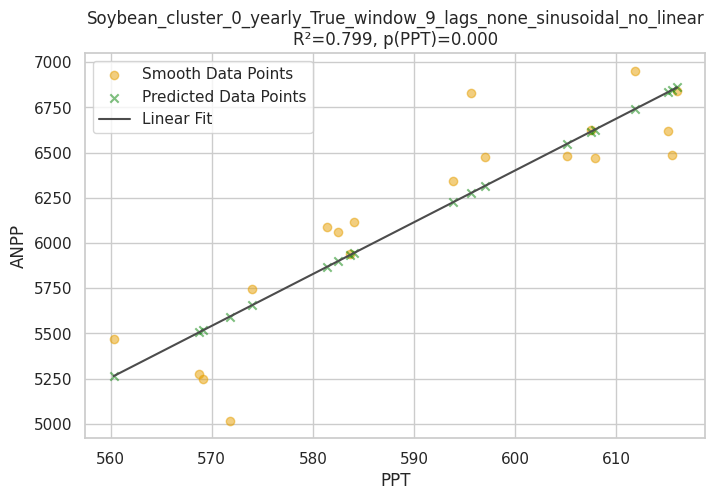

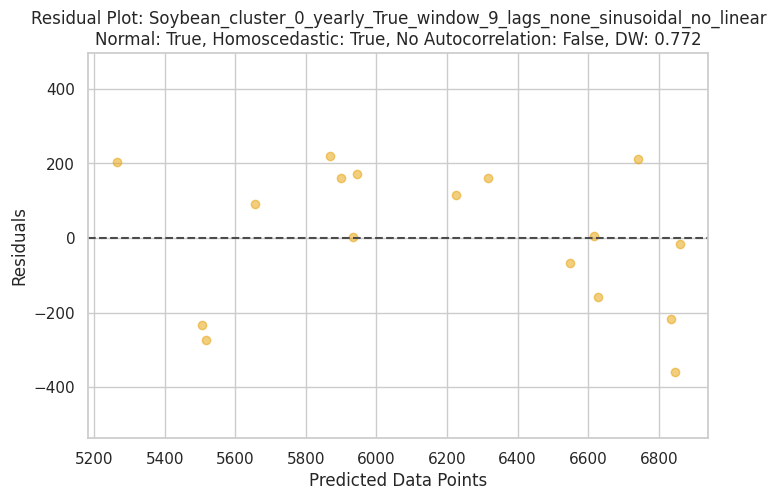

In [234]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=soybean_clusters[0],
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=True,
    window_size=9,
    analysis_name='Soybean_cluster_0_yearly_True_window_9_lags_none_sinusoidal_no_linear',
    plot_name='Soybean',
    show_plot=True,
    lags=None,
    use_sinusoidal=False,
    cycle_period=0,
    is_run_quadratic=False,
    is_piecewise=False,
    is_spline=False,
)


Predictors in plot_model: ['PPT', 'segment']


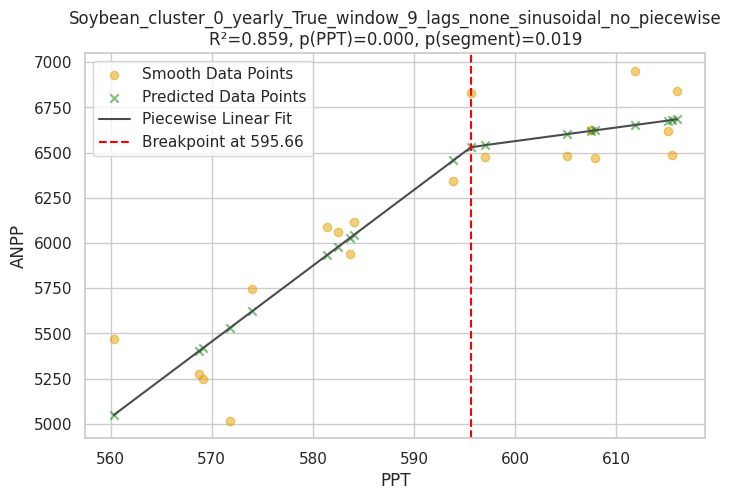

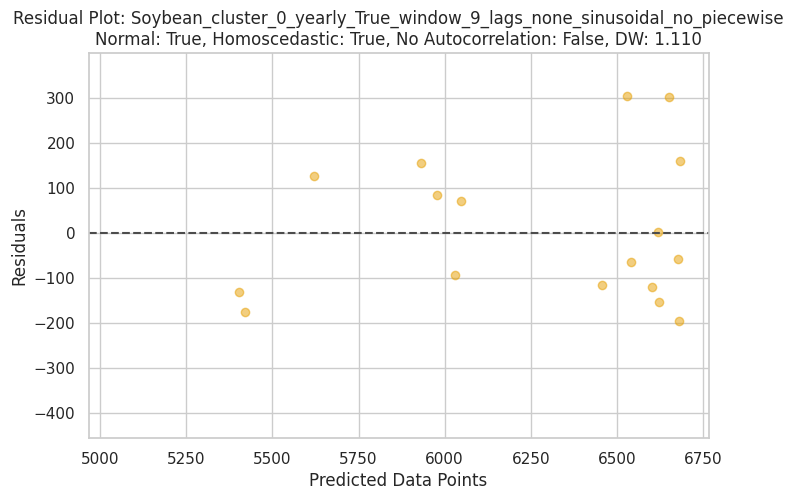

Min values:
 year    1988.0000
PPT      560.2885
ANPP    5016.8956
dtype: float64

Max values:
 year    2019.000000
PPT      616.033056
ANPP    6953.107880
dtype: float64
Min values:
 year                      1988
site.code                PRHPA
type                 Croplands
Crop                   Soybean
Cereal              Non-Cereal
MAP                 702.199915
ANPP                  4549.076
PPT                    424.181
WUE                   7.267737
ANPP_transformed      8.422899
WUE_transformed       7.267737
Cluster                      0
dtype: object

Max values:
 year                       2019
site.code                  UMRB
type                  Croplands
Crop                    Soybean
Cereal               Non-Cereal
MAP                  859.391183
ANPP                9822.834646
PPT                     692.887
WUE                   15.888487
ANPP_transformed       9.192567
WUE_transformed       15.888487
Cluster                       0
dtype: object


In [235]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=soybean_clusters[0],
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=True,
    window_size=9,
    analysis_name='Soybean_cluster_0_yearly_True_window_9_lags_none_sinusoidal_no_piecewise',
    plot_name='Croplands',
    show_plot=True,
    lags=None,
    use_sinusoidal=False,
    cycle_period=0,
    is_run_quadratic=False,
    is_piecewise=True,
    is_spline=False,
)

find_min_max(data)
find_min_max(soybean_clusters[0])

Starting analysis for ANPP with predictor PPT


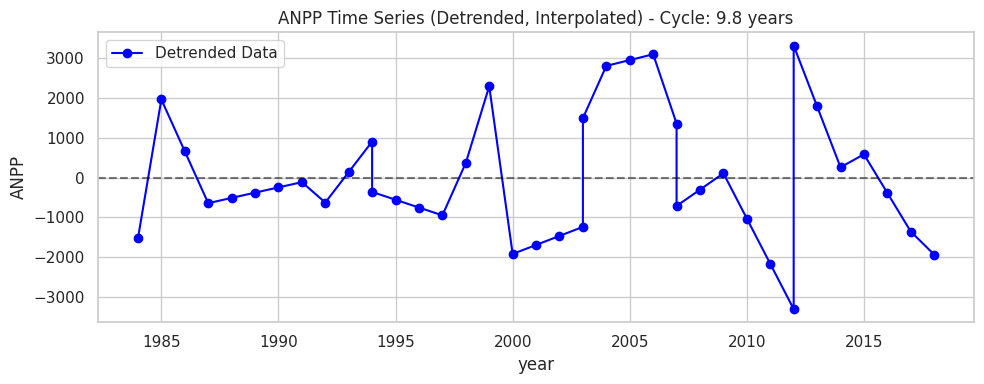

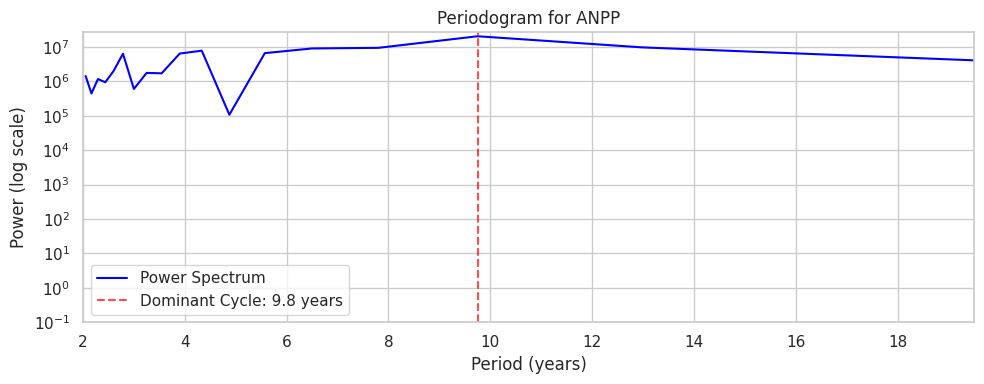

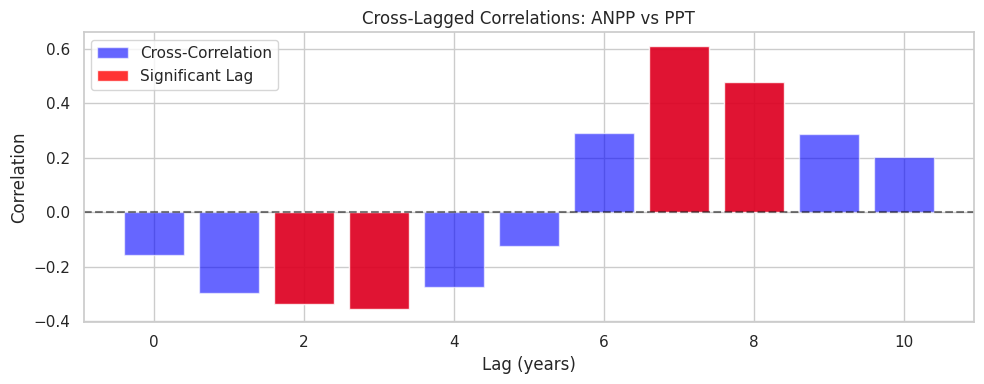

ANPP Results:
Dominant cycle detected at 9.8-year period. No significant autocorrelation detected (lags 1–10). Significant cross-lagged effects (ANPP vs. PPT) at lags: [2, 3, 7, 8].
Starting analysis for PPT with predictor None


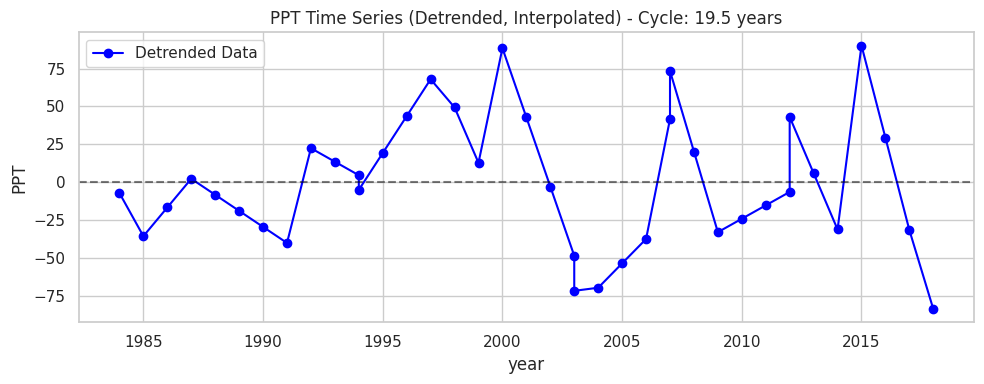

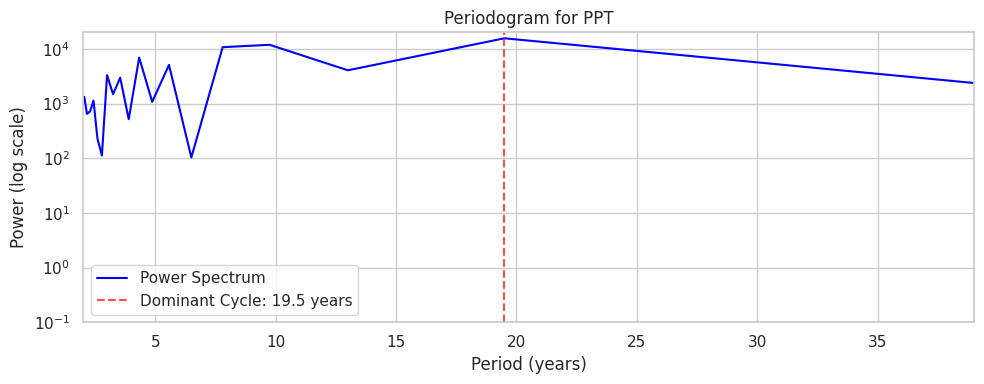

PPT Results:
Dominant cycle detected at 19.5-year period. No significant autocorrelation detected (lags 1–10).


In [236]:
anpp_result = run_time_series_analysis(soybean_clusters[1], 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(soybean_clusters[1], 'PPT', None, plot=True)

In [237]:
top_models_Soybean = run_and_save_models(
    df=soybean_clusters[1],
    analysis_name='Soybean_cluster_1',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise'],
    window_size=range(1, 11),
    lags=[None, [2], [3], [7],[8]],
    cycle_period=19.5,
    show_plot=False,
    show_aic_bic=False
)

Skipping Soybean_cluster_1_yearly_True_window_7_lags_7_sinusoidal_no_linear: Window size 7 too large for 13 rows.
Skipping Soybean_cluster_1_yearly_True_window_7_lags_8_sinusoidal_no_linear: Window size 7 too large for 12 rows.
Skipping Soybean_cluster_1_yearly_True_window_7_lags_7_sinusoidal_yes_linear: Window size 7 too large for 13 rows.
Skipping Soybean_cluster_1_yearly_True_window_7_lags_8_sinusoidal_yes_linear: Window size 7 too large for 12 rows.
Skipping Soybean_cluster_1_yearly_True_window_8_lags_7_sinusoidal_no_linear: Window size 8 too large for 13 rows.
Skipping Soybean_cluster_1_yearly_True_window_8_lags_8_sinusoidal_no_linear: Window size 8 too large for 12 rows.
Skipping Soybean_cluster_1_yearly_True_window_8_lags_7_sinusoidal_yes_linear: Window size 8 too large for 13 rows.
Skipping Soybean_cluster_1_yearly_True_window_8_lags_8_sinusoidal_yes_linear: Window size 8 too large for 12 rows.
Skipping Soybean_cluster_1_yearly_False_window_9_lags_7_sinusoidal_no_linear: Window

Starting analysis for ANPP with predictor PPT


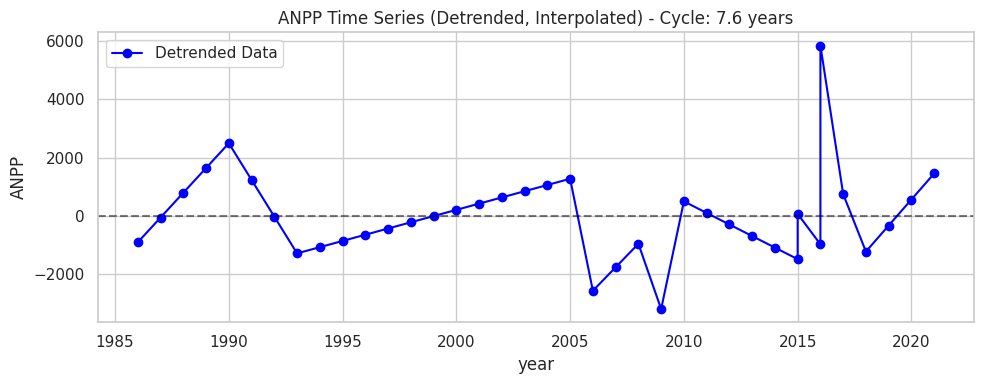

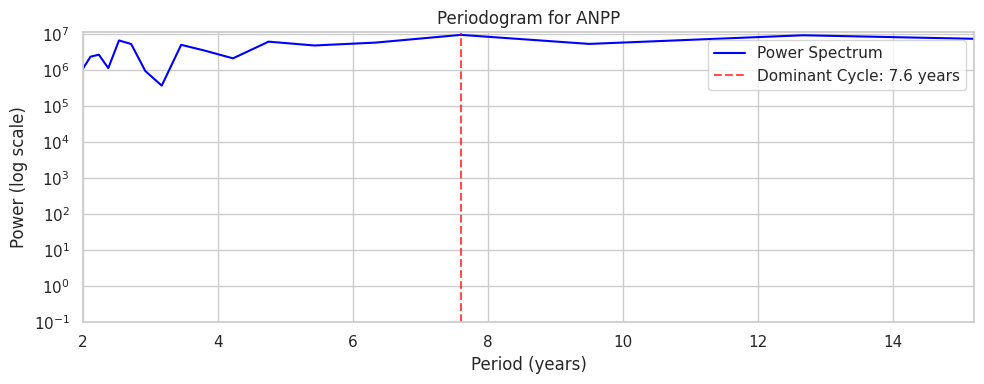

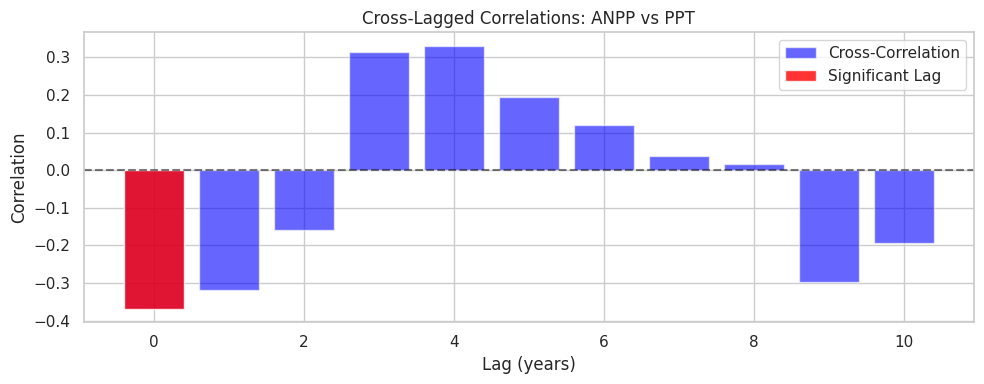

ANPP Results:
Dominant cycle detected at 7.6-year period. No significant autocorrelation detected (lags 1–10). Significant cross-lagged effects (ANPP vs. PPT) at lags: [0].
Starting analysis for PPT with predictor None


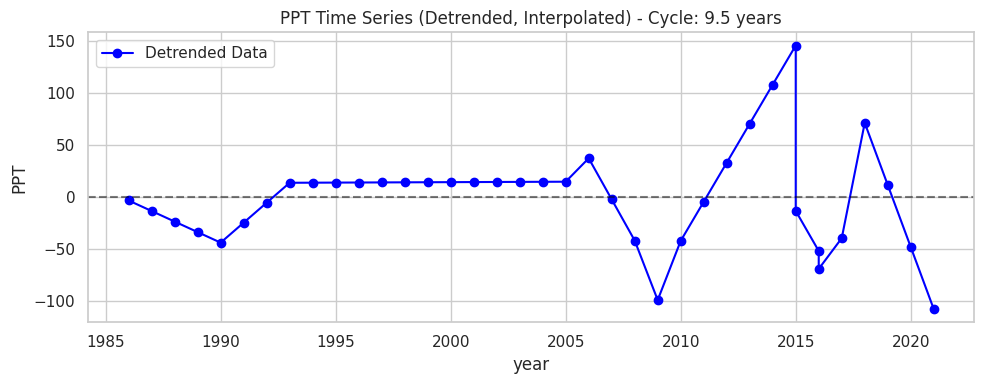

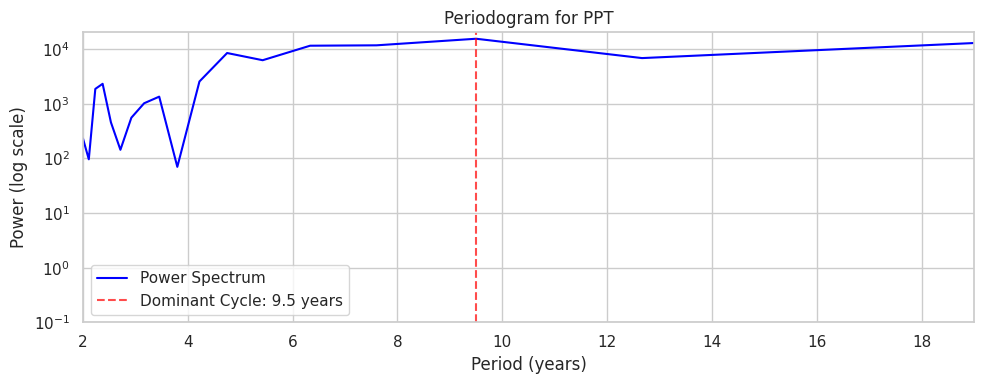

PPT Results:
Dominant cycle detected at 9.5-year period. No significant autocorrelation detected (lags 1–10).


In [238]:
anpp_result = run_time_series_analysis(soybean_clusters[2], 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(soybean_clusters[2], 'PPT', None, plot=True)

In [239]:
top_models_Soybean = run_and_save_models(
    df=soybean_clusters[2],
    analysis_name='Soybean_cluster_2',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise'],
    window_size=range(1, 8),
    lags=[None, [0], [1]],
    cycle_period=9.5,
    show_plot=False,
    show_aic_bic=False
)


Skipping Soybean_cluster_2_yearly_True_window_7_lags_none_sinusoidal_no_linear: Window size 7 too large for 13 rows.
Skipping Soybean_cluster_2_yearly_True_window_7_lags_0_sinusoidal_no_linear: Window size 7 too large for 13 rows.
Skipping Soybean_cluster_2_yearly_True_window_7_lags_1_sinusoidal_no_linear: Window size 7 too large for 12 rows.
Skipping Soybean_cluster_2_yearly_True_window_7_lags_none_sinusoidal_yes_linear: Window size 7 too large for 13 rows.
Skipping Soybean_cluster_2_yearly_True_window_7_lags_0_sinusoidal_yes_linear: Window size 7 too large for 13 rows.
Skipping Soybean_cluster_2_yearly_True_window_7_lags_1_sinusoidal_yes_linear: Window size 7 too large for 12 rows.
linear No models meet the selection criteria (p < 0.05, normality, homoscedasticity, R2-CV gap <= 0.1, significant terms).
Skipping Soybean_cluster_2_yearly_True_window_7_lags_none_sinusoidal_no_quadratic: Window size 7 too large for 13 rows.
Skipping Soybean_cluster_2_yearly_True_window_7_lags_0_sinusoida

Predictors in plot_model: ['PPT', 'segment']


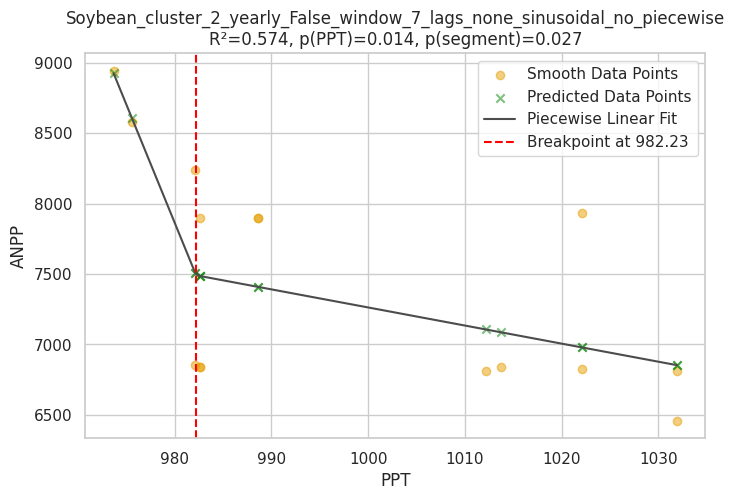

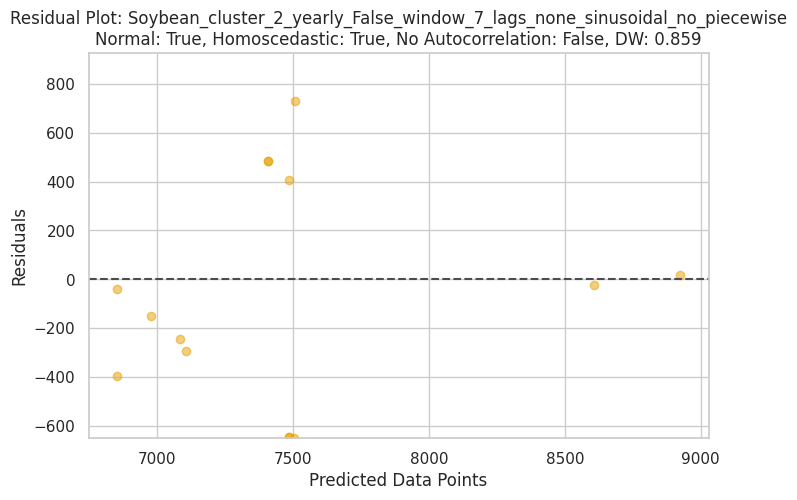

Min values:
 PPT      973.69015
ANPP    6458.43400
year    1986.00000
dtype: float64

Max values:
 PPT     1031.934004
ANPP    8942.186181
year    2021.000000
dtype: float64
Min values:
 year                       1986
site.code                   KBS
type                  Croplands
Crop                    Soybean
Cereal               Non-Cereal
MAP                  702.199915
ANPP                4606.796667
PPT                       922.0
WUE                    4.924517
ANPP_transformed       8.435505
WUE_transformed        4.924517
Cluster                       2
dtype: object

Max values:
 year                       2021
site.code                  UMRB
type                  Croplands
Crop                    Soybean
Cereal               Non-Cereal
MAP                   942.50958
ANPP                13670.38496
PPT                     1172.54
WUE                   14.259081
ANPP_transformed        9.52306
WUE_transformed       14.259081
Cluster                       2
dtype: object


In [240]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=soybean_clusters[2],
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=False,
    window_size=7,
    analysis_name='Soybean_cluster_2_yearly_False_window_7_lags_none_sinusoidal_no_piecewise',
    plot_name='Soybean',
    show_plot=True,
    lags=None,
    use_sinusoidal=False,
    cycle_period=0,
    is_run_quadratic=False,
    is_piecewise=True,
    is_spline=False,
)

find_min_max(data)
find_min_max(soybean_clusters[2])

## **Maize**


IQR Method for ANPP:
Q1: 13504.46, Q3: 18224.52, IQR: 4720.06
Lower Bound: 6424.38, Upper Bound: 25304.60
Number of IQR outliers: 2
Range of IQR outliers: (28261.72354, 30431.75853)


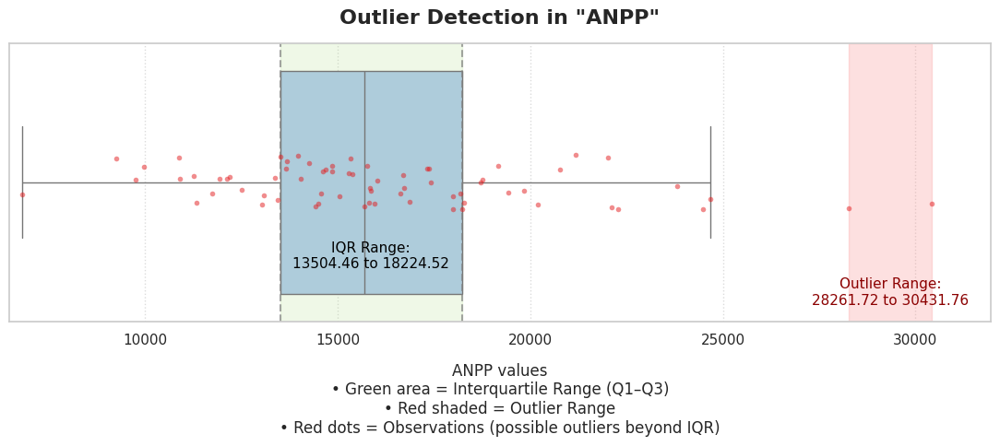

Unique values in 'site.code':
site.code
PRHPA    36
KBS      11
UCB       8
UMRB      7
NH        4
ECB       3
Name: count, dtype: int64


In [263]:
df_unfiltered_Maize = df.copy()
df_Maize = filter_df(df_unfiltered_Maize, 'Crop', 'Maize')

df_Maize_transformed, df_Maize_transformed_info = transform_dataframe(df_Maize, ['ANPP', 'WUE'])

df_Maize_outliers = detect_outliers(df_Maize, 'ANPP')
df_Maize_processed = df_Maize_outliers['cleaned_df']

df_Maize_outliers = df_Maize_outliers['iqr_outliers']

len(df_Maize_outliers)

df_Maize_outliers.head(2)


print("Unique values in 'site.code':")
print(df_Maize['site.code'].value_counts())



Starting analysis for ANPP with predictor PPT


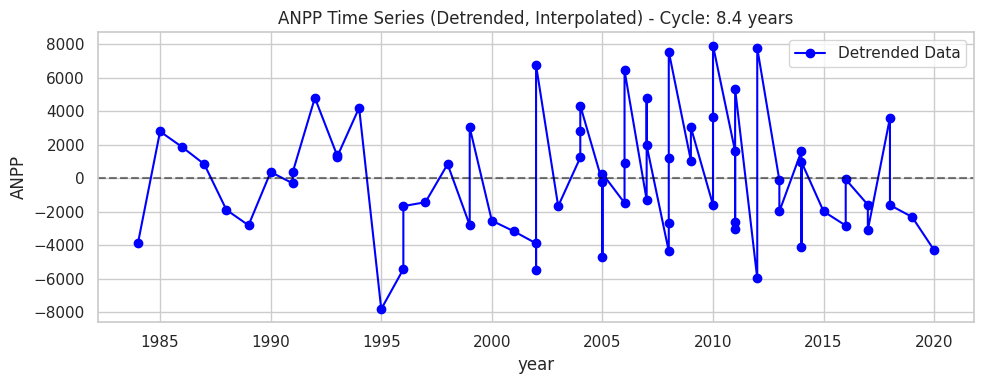

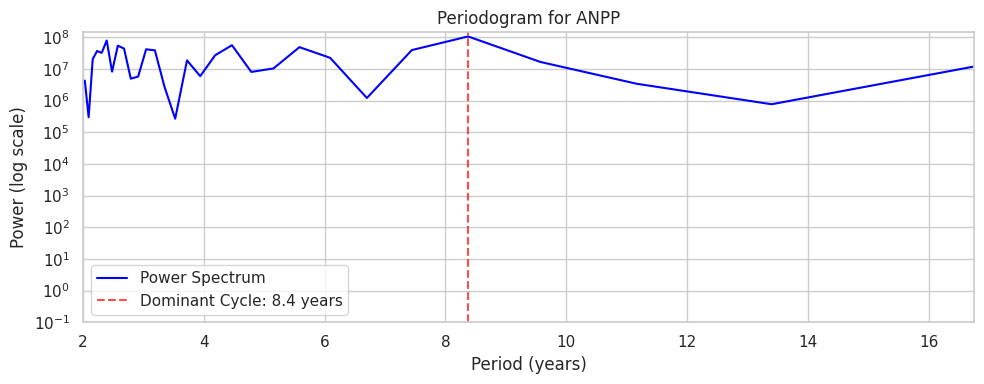

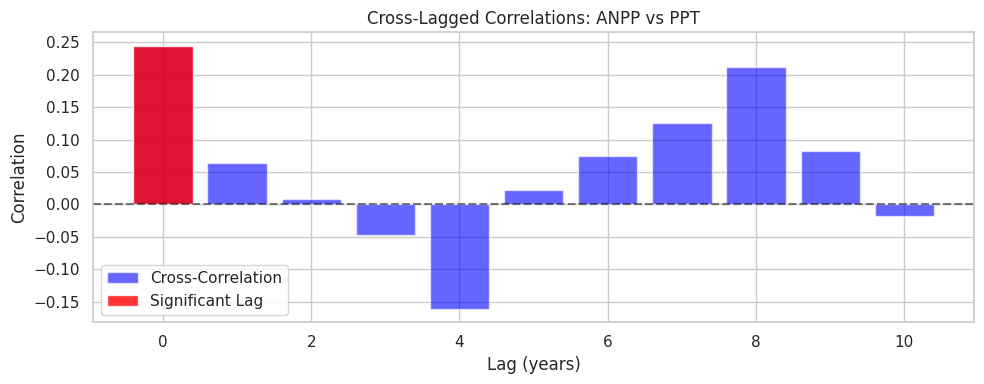

ANPP Results:
Dominant cycle detected at 8.4-year period. No significant autocorrelation detected (lags 1–10). Significant cross-lagged effects (ANPP vs. PPT) at lags: [0].
Starting analysis for PPT with predictor None


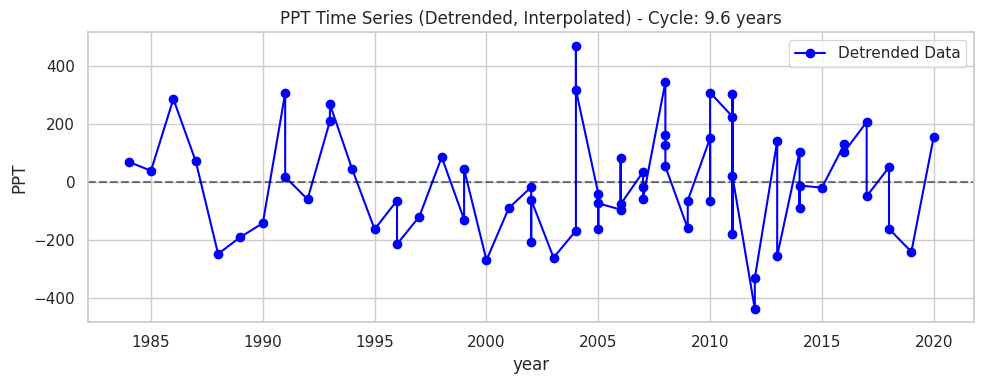

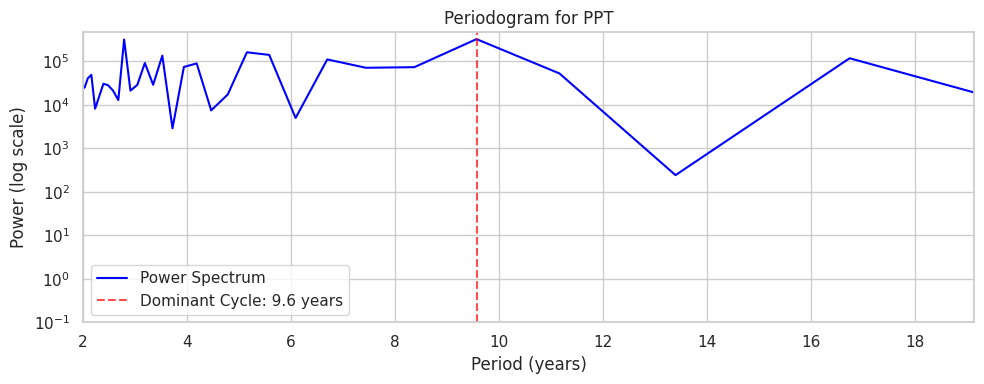

PPT Results:
Dominant cycle detected at 9.6-year period. No significant autocorrelation detected (lags 1–10).


In [242]:
anpp_result = run_time_series_analysis(df_Maize_processed, 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(df_Maize_processed, 'PPT', None, plot=True)

In [243]:
pearson_corr, spearman_corr = compute_correlation(df_Maize, 'ANPP', 'PPT', 'Maize')


Correlation between ANPP and PPT - Maize (Pearson): 0.31457461315372326
Correlation between ANPP and PPT - Maize (Spearman): 0.3696382900986482


In [244]:
top_models_Maize = run_and_save_models(
    df=df_Maize,
    analysis_name='Maize',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise', 'spline'],
    window_size=range(1, 11),
    lags=[None, [0], [1]],
    cycle_period=9.6,
    show_plot=False,
    show_aic_bic=False
)

Predictors in plot_model: ['PPT', 'sin_cycle', 'cos_cycle', 'quadratic']


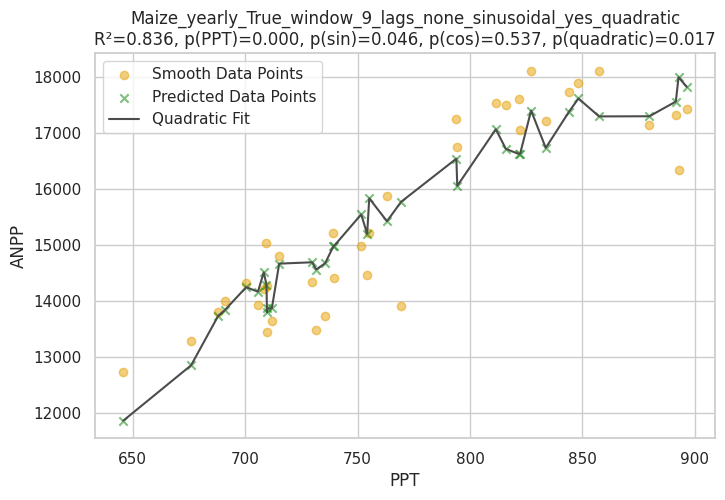

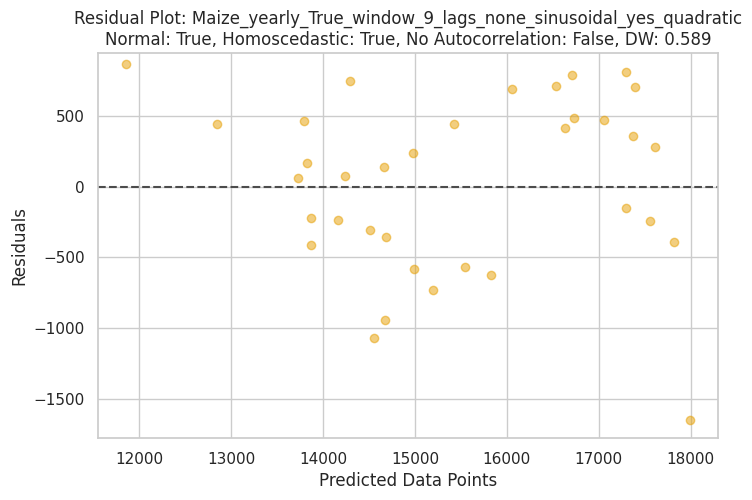

In [264]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=df_Maize,
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=True,
    window_size=9,
    analysis_name='Maize_yearly_True_window_9_lags_none_sinusoidal_yes_quadratic',
    plot_name='Maize',
    show_plot=True,
    lags=None,
    use_sinusoidal=True,
    cycle_period=10,
    is_run_quadratic=True,
    is_piecewise=False,
    is_spline=False,
)

Predictors in plot_model: ['PPT', 'sin_cycle', 'cos_cycle', 'segment']


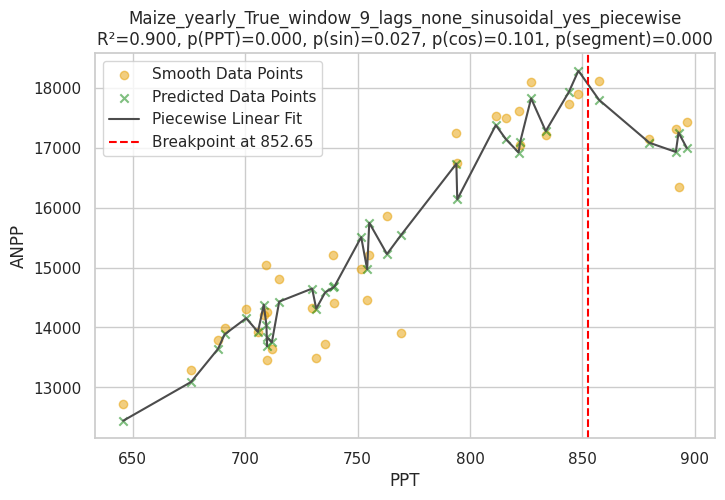

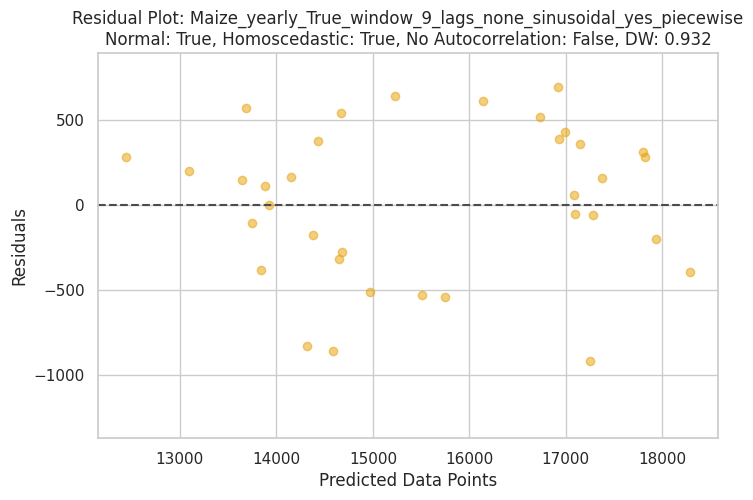

Min values:
 year          1984.000000
PPT            645.793474
ANPP         12722.863081
sin_cycle       -0.951057
cos_cycle       -1.000000
dtype: float64

Max values:
 year          2020.000000
PPT            896.425961
ANPP         18107.331425
sin_cycle        0.951057
cos_cycle        1.000000
dtype: float64
Min values:
 year               1984
site.code           ECB
type          Croplands
Crop              Maize
Cereal           Cereal
MAP          702.199915
ANPP            6812.63
PPT             409.957
WUE           10.102679
dtype: object

Max values:
 year                2020
site.code           UMRB
type           Croplands
Crop               Maize
Cereal            Cereal
MAP          1068.967476
ANPP         30431.75853
PPT          1259.824995
WUE            47.485875
dtype: object


In [246]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=df_Maize,
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=True,
    window_size=9,
    analysis_name='Maize_yearly_True_window_9_lags_none_sinusoidal_yes_piecewise',
    plot_name='Maize',
    show_plot=True,
    lags=None,
    use_sinusoidal=True,
    cycle_period=10,
    is_run_quadratic=False,
    is_piecewise=True,
    is_spline=False,
)

find_min_max(data)
find_min_max(df_Maize)

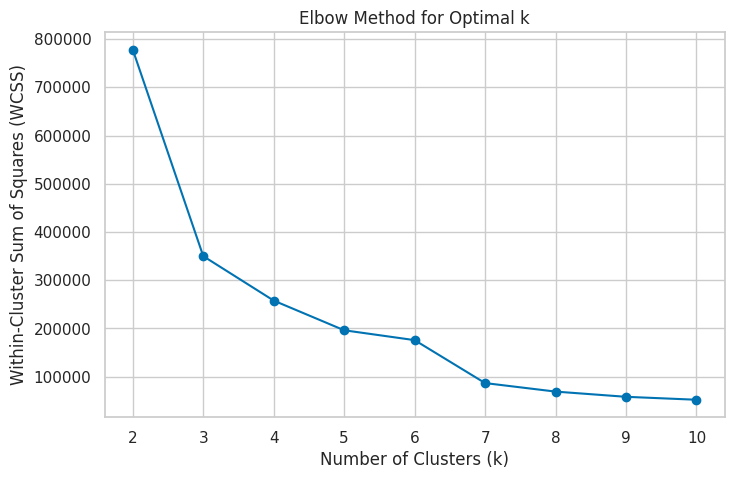

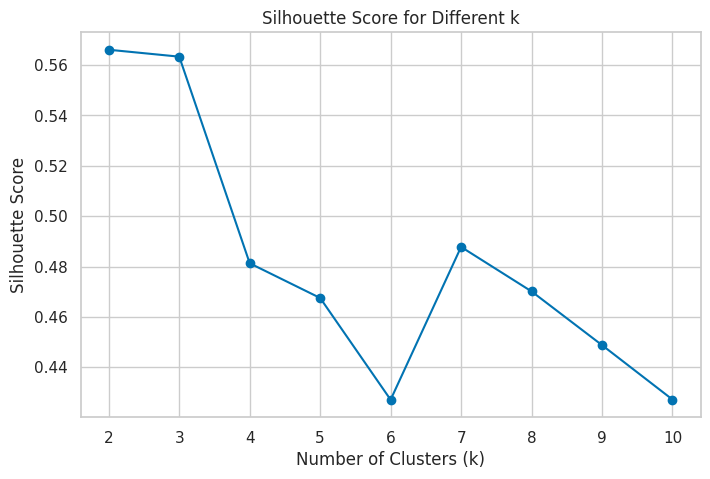

K-means Performance
Silhouette Score: 0.563


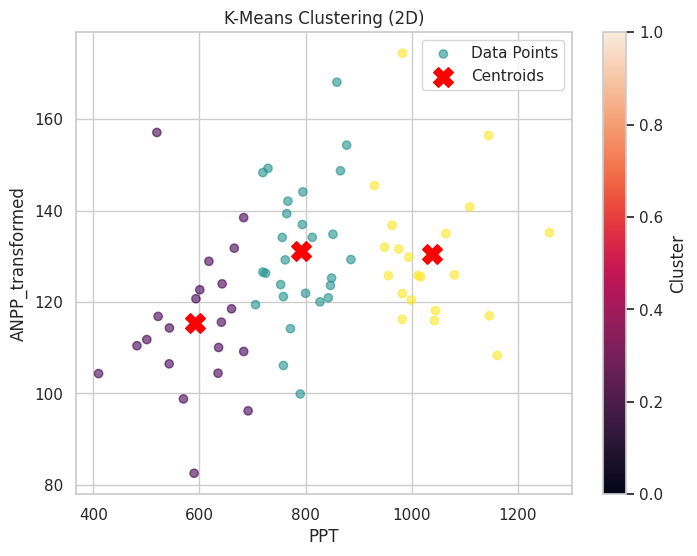


Cluster Summary (Mean Values):
                 PPT          ANPP
Cluster                           
0         592.133371  13556.450508
1         792.178844  17430.513119
2        1038.105798  17222.584815
Unique clusters - Maize: [1 2 0]

Cluster 0 DataFrame:
Number of observations: 21
Pearson Correlation between ANPP and PPT - Maize (cluster 0): 0.06865116616827853


Spearman Correlation between ANPP and PPT - Maize (cluster 0): 0.15454545454545454



Cluster 1 DataFrame:
Number of observations: 27
Pearson Correlation between ANPP and PPT - Maize (cluster 1): 0.23886369828335755


Spearman Correlation between ANPP and PPT - Maize (cluster 1): 0.2222222222222222



Cluster 2 DataFrame:
Number of observations: 21
Pearson Correlation between ANPP and PPT - Maize (cluster 2): -0.08212732209773062


Spearman Correlation between ANPP and PPT - Maize (cluster 2): -0.187012987012987




In [265]:
olumns_transformed = ['PPT', 'ANPP_transformed']
columns_untransformed = ['PPT', 'ANPP']
OPTIMAL_K = 3
K_RANGE = range(2, 11)

df_maize_k_means, maize_clusters, maize_cluster_summary = run_clustering_and_correlations(df_Maize_transformed, 'Maize', \
                                                                columns_transformed, columns_untransformed, K_RANGE, OPTIMAL_K)

In [248]:
maize_clusters[0].head(5)

,year,site.code,type,Crop,Cereal,MAP,ANPP,PPT,WUE,ANPP_transformed,WUE_transformed,Cluster
14,1988,PRHPA,Croplands,Maize,Cereal,702.199915,12199.648,482.346000,25.292317,110.452017,3.269277,0
17,1989,PRHPA,Croplands,Maize,Cereal,702.199915,11338.192,543.052000,20.878649,106.480947,3.085511,0
21,1990,PRHPA,Croplands,Maize,Cereal,702.199915,14575.834,593.501999,24.559031,120.730419,3.240991,0
29,1992,PRHPA,Croplands,Maize,Cereal,702.199915,19176.300,683.449999,28.058088,138.478518,3.369297,0
43,1995,PRHPA,Croplands,Maize,Cereal,702.199915,6812.630,590.070000,11.545461,82.538658,2.529359,0


Starting analysis for ANPP with predictor PPT


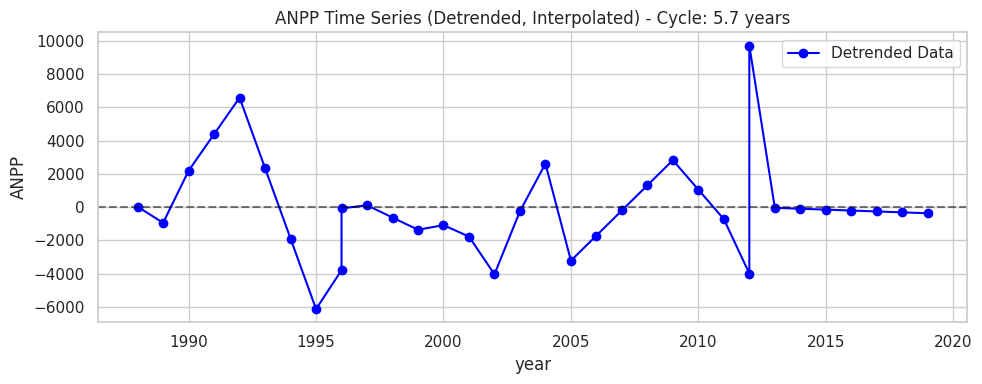

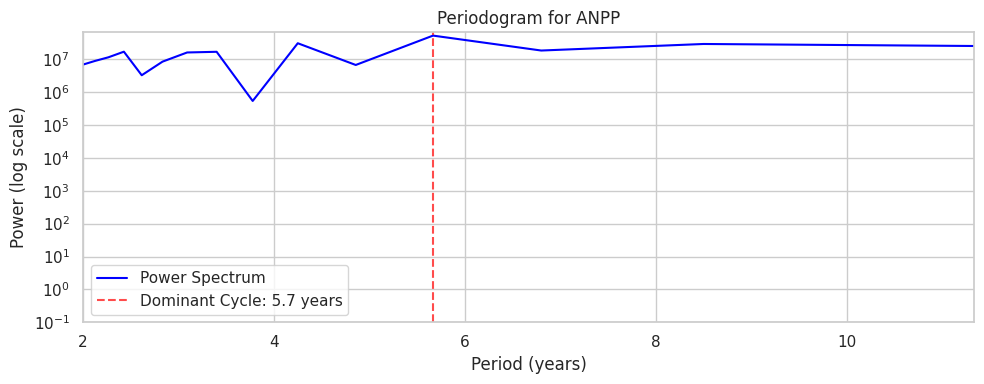

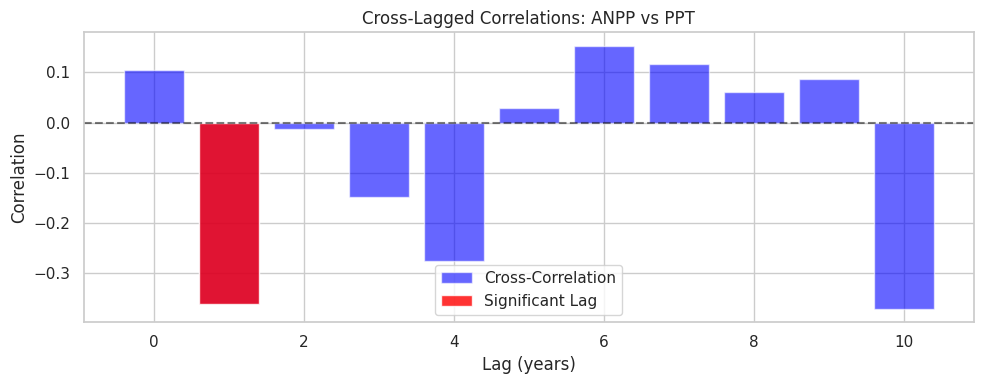

ANPP Results:
Dominant cycle detected at 5.7-year period. No significant autocorrelation detected (lags 1–10). Significant cross-lagged effects (ANPP vs. PPT) at lags: [1].
Starting analysis for PPT with predictor None


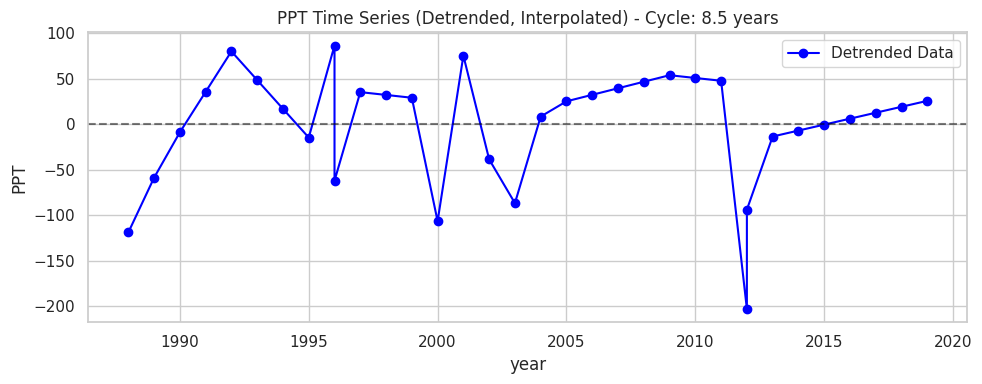

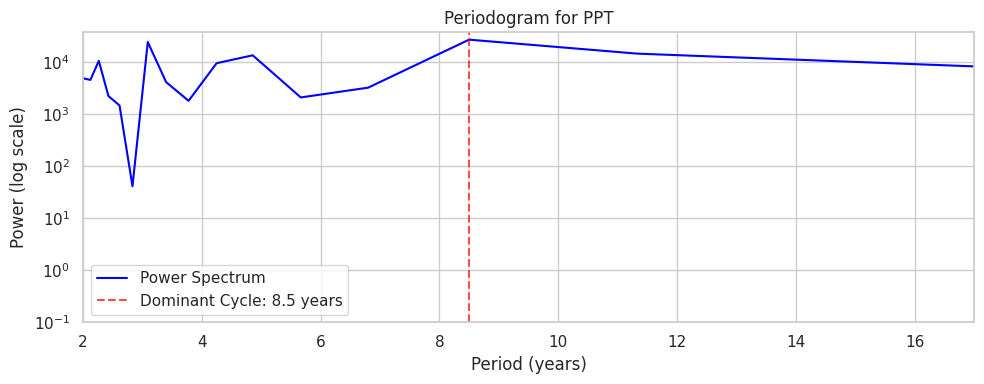

PPT Results:
Dominant cycle detected at 8.5-year period. No significant autocorrelation detected (lags 1–10).


In [249]:
anpp_result = run_time_series_analysis(maize_clusters[0], 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(maize_clusters[0], 'PPT', None, plot=True)

Starting analysis for ANPP with predictor PPT


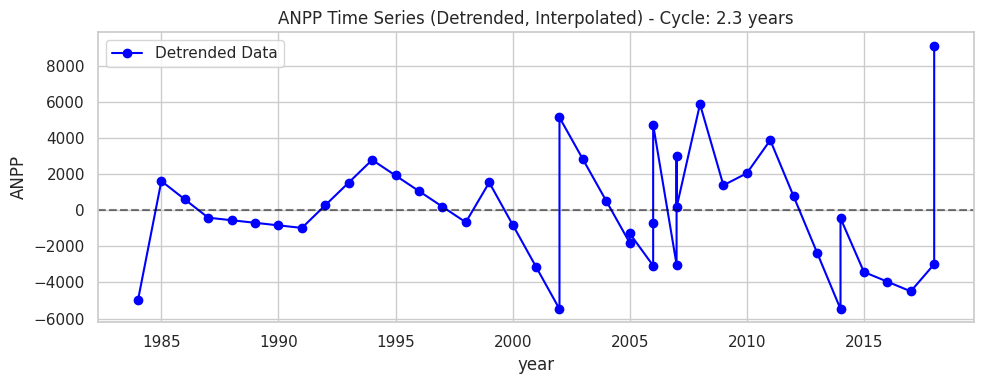

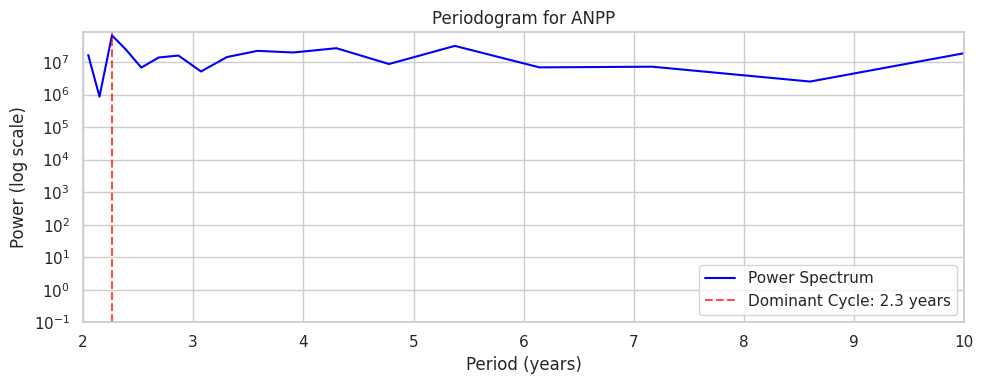

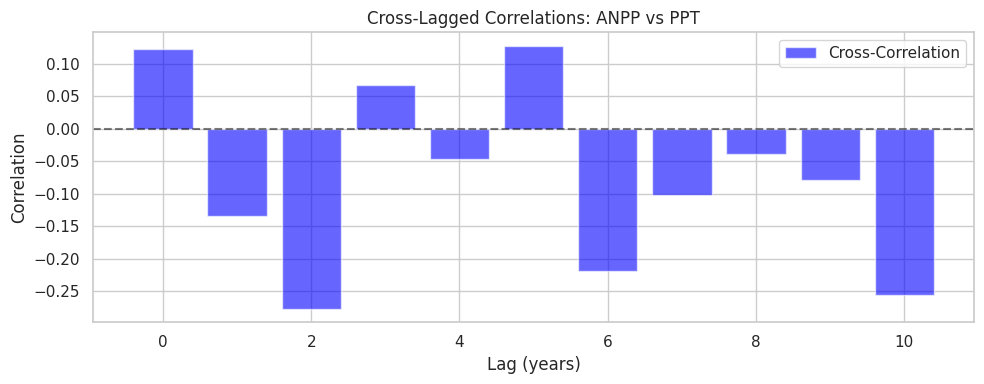

ANPP Results:
Dominant cycle detected at 2.3-year period. No significant autocorrelation detected (lags 1–10). No significant cross-lagged effects (ANPP vs. PPT) detected (lags 0–10).
Starting analysis for PPT with predictor None


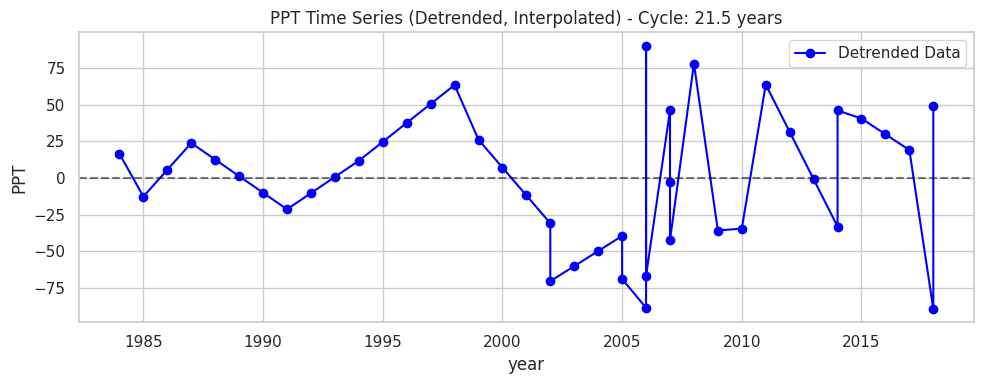

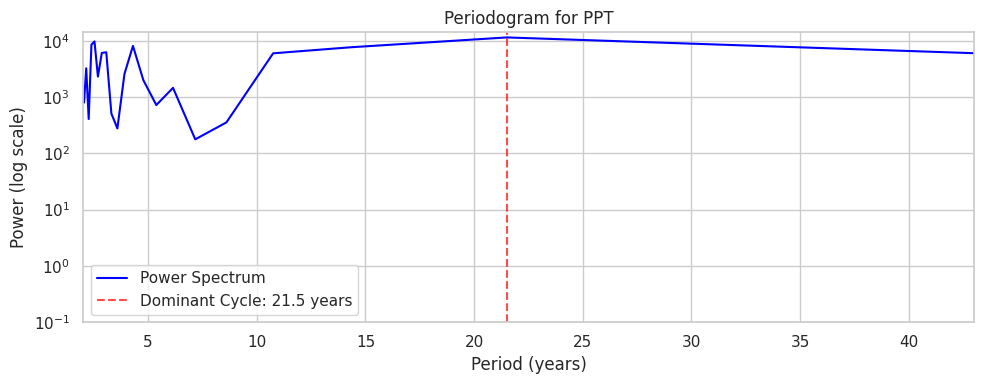

PPT Results:
Dominant cycle detected at 21.5-year period. No significant autocorrelation detected (lags 1–10).


In [250]:
anpp_result = run_time_series_analysis(maize_clusters[1], 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(maize_clusters[1], 'PPT', None, plot=True)

Starting analysis for ANPP with predictor PPT


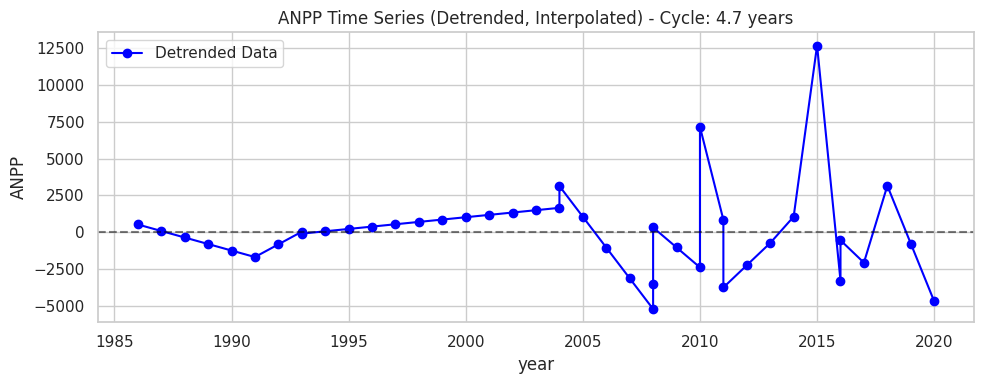

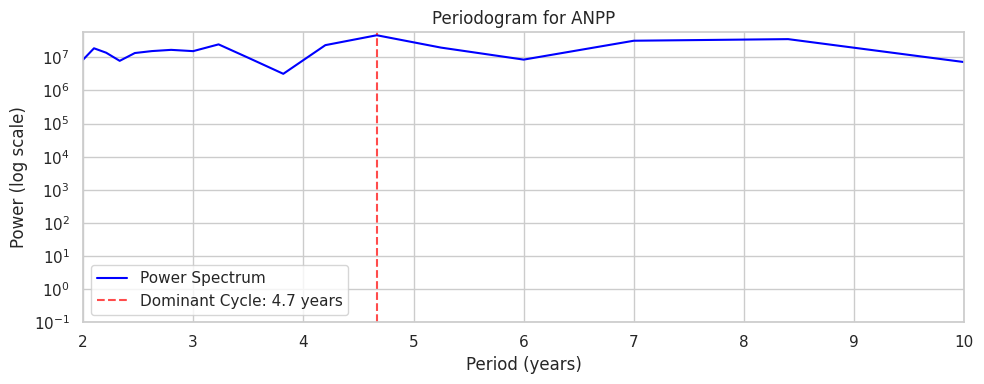

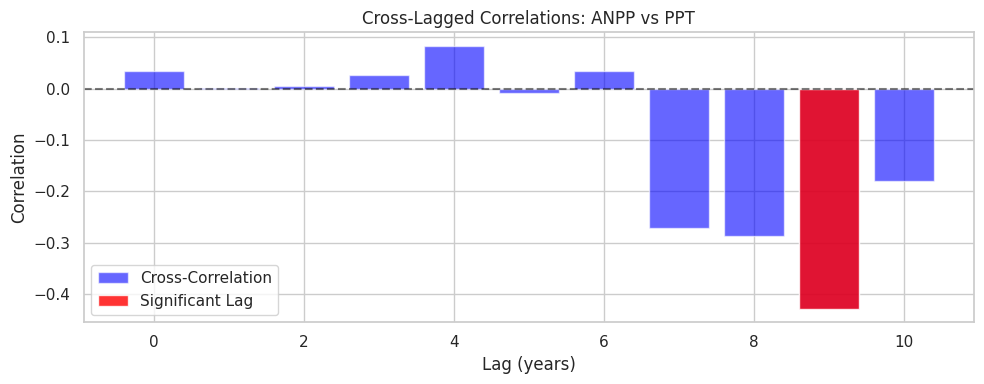

ANPP Results:
Dominant cycle detected at 4.7-year period. No significant autocorrelation detected (lags 1–10). Significant cross-lagged effects (ANPP vs. PPT) at lags: [9].
Starting analysis for PPT with predictor None


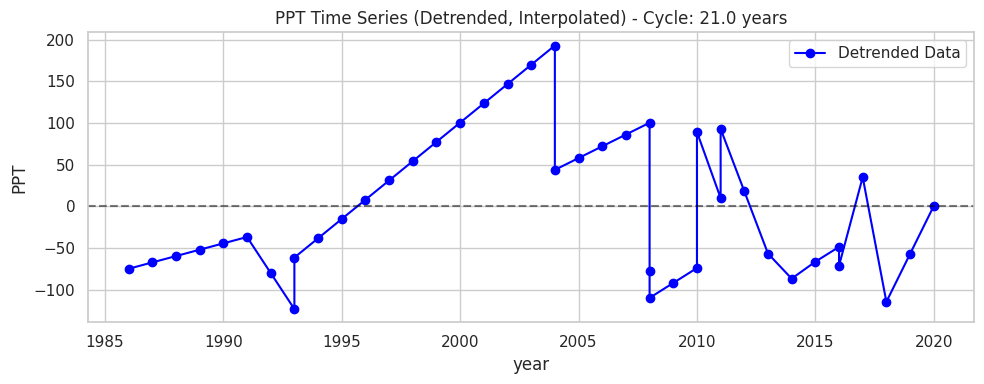

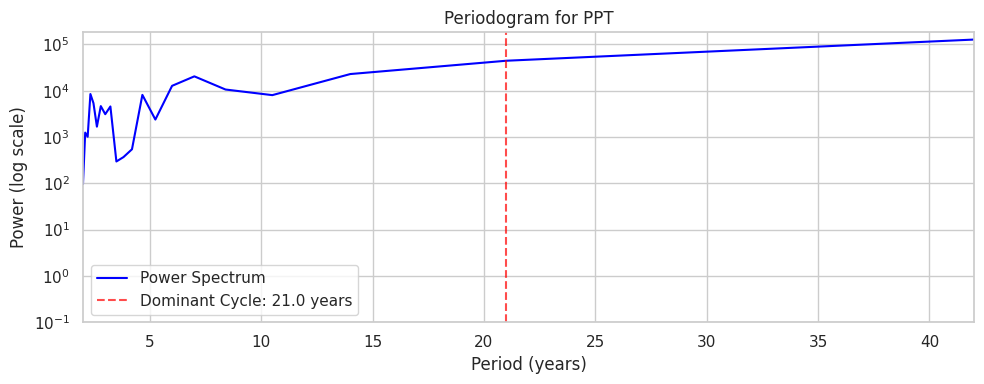

PPT Results:
Dominant cycle detected at 21.0-year period. No significant autocorrelation detected (lags 1–10).


In [251]:
anpp_result = run_time_series_analysis(maize_clusters[2], 'ANPP', 'PPT', plot=True)
ppt_result = run_time_series_analysis(maize_clusters[2], 'PPT', None, plot=True)

In [252]:
top_models_Maize = run_and_save_models(
    df=maize_clusters[0],
    analysis_name='Maize-Cluster_0',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise', 'spline'],
    window_size=range(1, 11),
    lags=[None, [1]],
    cycle_period=8.5,
    show_plot=False,
    show_aic_bic=False
)

Skipping Maize-Cluster_0_yearly_True_window_10_lags_none_sinusoidal_no_linear: Window size 10 too large for 19 rows.
Skipping Maize-Cluster_0_yearly_True_window_10_lags_1_sinusoidal_no_linear: Window size 10 too large for 18 rows.
Skipping Maize-Cluster_0_yearly_True_window_10_lags_none_sinusoidal_yes_linear: Window size 10 too large for 19 rows.
Skipping Maize-Cluster_0_yearly_True_window_10_lags_1_sinusoidal_yes_linear: Window size 10 too large for 18 rows.
Skipping Maize-Cluster_0_yearly_True_window_10_lags_none_sinusoidal_no_quadratic: Window size 10 too large for 19 rows.
Skipping Maize-Cluster_0_yearly_True_window_10_lags_1_sinusoidal_no_quadratic: Window size 10 too large for 18 rows.
Skipping Maize-Cluster_0_yearly_True_window_10_lags_none_sinusoidal_yes_quadratic: Window size 10 too large for 19 rows.
Skipping Maize-Cluster_0_yearly_True_window_10_lags_1_sinusoidal_yes_quadratic: Window size 10 too large for 18 rows.
quadratic No models meet the selection criteria (p < 0.05, n

In [253]:
top_models_Maize = run_and_save_models(
    df=maize_clusters[1],
    analysis_name='Maize-Cluster_1',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise', 'spline'],
    window_size=range(1, 11),
    lags=[None, [1]],
    cycle_period=21.5,
    show_plot=False,
    show_aic_bic=False
)

Skipping Maize-Cluster_1_yearly_True_window_10_lags_none_sinusoidal_no_linear: Window size 10 too large for 19 rows.
Skipping Maize-Cluster_1_yearly_True_window_10_lags_1_sinusoidal_no_linear: Window size 10 too large for 18 rows.
Skipping Maize-Cluster_1_yearly_True_window_10_lags_none_sinusoidal_yes_linear: Window size 10 too large for 19 rows.
Skipping Maize-Cluster_1_yearly_True_window_10_lags_1_sinusoidal_yes_linear: Window size 10 too large for 18 rows.
Skipping Maize-Cluster_1_yearly_True_window_10_lags_none_sinusoidal_no_quadratic: Window size 10 too large for 19 rows.
Skipping Maize-Cluster_1_yearly_True_window_10_lags_1_sinusoidal_no_quadratic: Window size 10 too large for 18 rows.
Skipping Maize-Cluster_1_yearly_True_window_10_lags_none_sinusoidal_yes_quadratic: Window size 10 too large for 19 rows.
Skipping Maize-Cluster_1_yearly_True_window_10_lags_1_sinusoidal_yes_quadratic: Window size 10 too large for 18 rows.
quadratic No models meet the selection criteria (p < 0.05, n

Predictors in plot_model: ['PPT', 'segment']


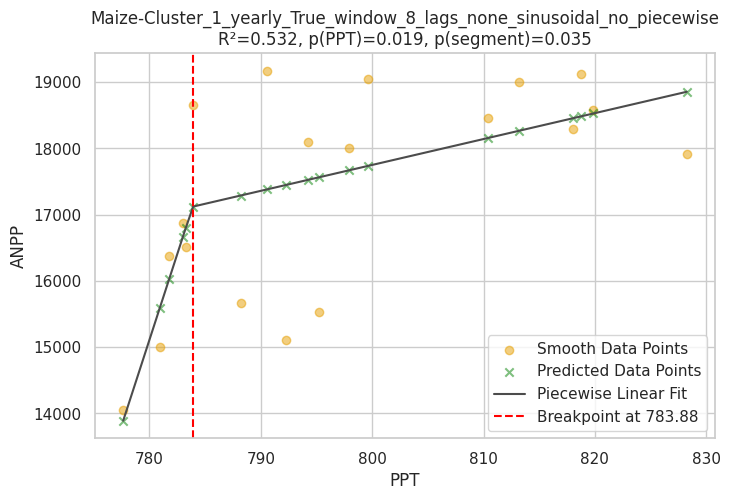

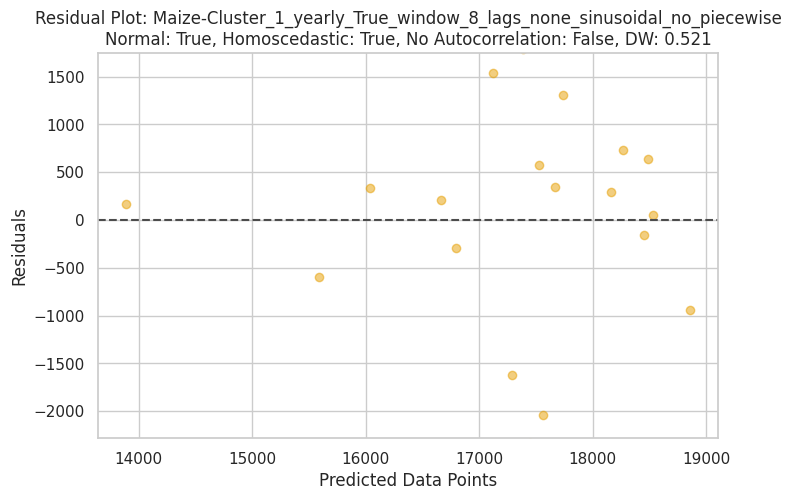

Min values:
 year     1984.000000
PPT       777.637749
ANPP    14057.090750
dtype: float64

Max values:
 year     2018.000000
PPT       828.253599
ANPP    19171.439657
dtype: float64
Min values:
 year                      1984
site.code                  KBS
type                 Croplands
Crop                     Maize
Cereal                  Cereal
MAP                 702.199915
ANPP                 9976.4025
PPT                    705.841
WUE                  12.625241
ANPP_transformed     99.881943
WUE_transformed       2.611924
Cluster                      1
dtype: object

Max values:
 year                       2018
site.code                  UMRB
type                  Croplands
Crop                      Maize
Cereal                   Cereal
MAP                 1068.967476
ANPP                28261.72354
PPT                     885.608
WUE                   32.895173
ANPP_transformed     168.112235
WUE_transformed        3.523273
Cluster                       1
dtype: object


In [254]:
results, data, model, predictions, residuals, n_samples = run_model_analysis(
    df=maize_clusters[1],
    ind_var='PPT',
    dep_var='ANPP',
    yearly_aggregate=True,
    window_size=8,
    analysis_name='Maize-Cluster_1_yearly_True_window_8_lags_none_sinusoidal_no_piecewise',
    plot_name='Maize',
    show_plot=True,
    lags=None,
    use_sinusoidal=False,
    cycle_period=0,
    is_run_quadratic=False,
    is_piecewise=True,
    is_spline=False,
)

find_min_max(data)
find_min_max(maize_clusters[1])

In [255]:
top_models_Maize = run_and_save_models(
    df=maize_clusters[2],
    analysis_name='Maize-Cluster_2',
    ind_var='PPT',
    dep_var='ANPP',
    model_types=['linear', 'quadratic', 'piecewise', 'spline'],
    window_size=range(1, 11),
    lags=[None, [1]],
    cycle_period=21,
    show_plot=False,
    show_aic_bic=False
)

Skipping Maize-Cluster_2_yearly_True_window_7_lags_1_sinusoidal_no_linear: Window size 7 too large for 13 rows.
Skipping Maize-Cluster_2_yearly_True_window_7_lags_1_sinusoidal_yes_linear: Window size 7 too large for 13 rows.
Skipping Maize-Cluster_2_yearly_True_window_8_lags_none_sinusoidal_no_linear: Window size 8 too large for 14 rows.
Skipping Maize-Cluster_2_yearly_True_window_8_lags_1_sinusoidal_no_linear: Window size 8 too large for 13 rows.
Skipping Maize-Cluster_2_yearly_True_window_8_lags_none_sinusoidal_yes_linear: Window size 8 too large for 14 rows.
Skipping Maize-Cluster_2_yearly_True_window_8_lags_1_sinusoidal_yes_linear: Window size 8 too large for 13 rows.
Skipping Maize-Cluster_2_yearly_True_window_9_lags_none_sinusoidal_no_linear: Window size 9 too large for 14 rows.
Skipping Maize-Cluster_2_yearly_True_window_9_lags_1_sinusoidal_no_linear: Window size 9 too large for 13 rows.
Skipping Maize-Cluster_2_yearly_True_window_9_lags_none_sinusoidal_yes_linear: Window size 9